## we choose the titanic kaggle competition dataset for this homework.
## the goal is to predict "transported" column of dataset that is either true or false.
## one should predict the status based on other columns like age of the passenger, cabin type of the passenger &...

In [52]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
import seaborn as sns
from matplotlib.ticker import PercentFormatter
import plotly.express as pex

from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.metrics import f1_score


from keras.models import Sequential
from keras.layers import Dense, Input, Dropout
from keras import callbacks
from keras.regularizers import l2,l1,l1_l2

import tensorflow as tf
from tensorflow.keras import initializers
from sklearn.metrics import ConfusionMatrixDisplay


In [2]:
from google.colab import drive
drive.mount('/content/gdrive')
os.environ['KAGGLE_CONFIG_DIR'] = "/content/gdrive/My Drive/Kaggle"
%cd /content/gdrive/My Drive/Kaggle

Mounted at /content/gdrive
/content/gdrive/My Drive/Kaggle


In [ ]:
! kaggle competitions download -c 'spaceship-titanic'

  0% 0.00/299k [00:00<?, ?B/s]
100% 299k/299k [00:00<00:00, 36.5MB/s]


In [ ]:
!unzip \*.zip

Archive:  spaceship-titanic.zip
  inflating: sample_submission.csv   
  inflating: test.csv                
  inflating: train.csv               


In [3]:
df = pd.read_csv("train.csv")

In [4]:
df.head()

,PassengerId,HomePlanet,CryoSleep,Cabin,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Name,Transported
0,0001_01,Europa,False,B/0/P,TRAPPIST-1e,39.0,False,0.0,0.0,0.0,0.0,0.0,Maham Ofracculy,False
1,0002_01,Earth,False,F/0/S,TRAPPIST-1e,24.0,False,109.0,9.0,25.0,549.0,44.0,Juanna Vines,True
2,0003_01,Europa,False,A/0/S,TRAPPIST-1e,58.0,True,43.0,3576.0,0.0,6715.0,49.0,Altark Susent,False
3,0003_02,Europa,False,A/0/S,TRAPPIST-1e,33.0,False,0.0,1283.0,371.0,3329.0,193.0,Solam Susent,False
4,0004_01,Earth,False,F/1/S,TRAPPIST-1e,16.0,False,303.0,70.0,151.0,565.0,2.0,Willy Santantines,True


In [6]:
df.shape

(8693, 14)

In [5]:
df.isna().sum()

PassengerId       0
HomePlanet      201
CryoSleep       217
Cabin           199
Destination     182
Age             179
VIP             203
RoomService     181
FoodCourt       183
ShoppingMall    208
Spa             183
VRDeck          188
Name            200
Transported       0
dtype: int64

## about 200 null value in each column is negligible, but they maybe in different rows. lets see how many rows have null value in total:

In [9]:
dropped_null_df = df.dropna()
num_of_rows_with_null = df.shape[0] - dropped_null_df.shape[0]
num_of_rows_with_null

2087

## so about 23% of rows have at least on null value. is considerable. we start by removing all of them and if we encounter any problem like weak accuracy or... we reconsider filling these null with appropriate value instead of removing them.

In [10]:
df.dropna(inplace=True)

# EDA

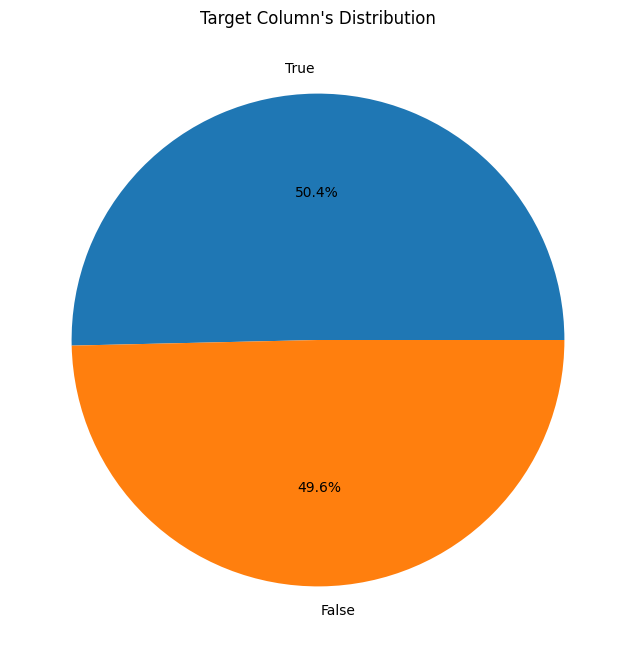

In [12]:
# viewing how many samples belong to each label
plt.figure(figsize=(8, 8))
plt.title("Target Column's Distribution")

plt.pie(df["Transported"].value_counts().values,
        labels=df["Transported"].value_counts().index, autopct="%0.1f%%")
plt.show()

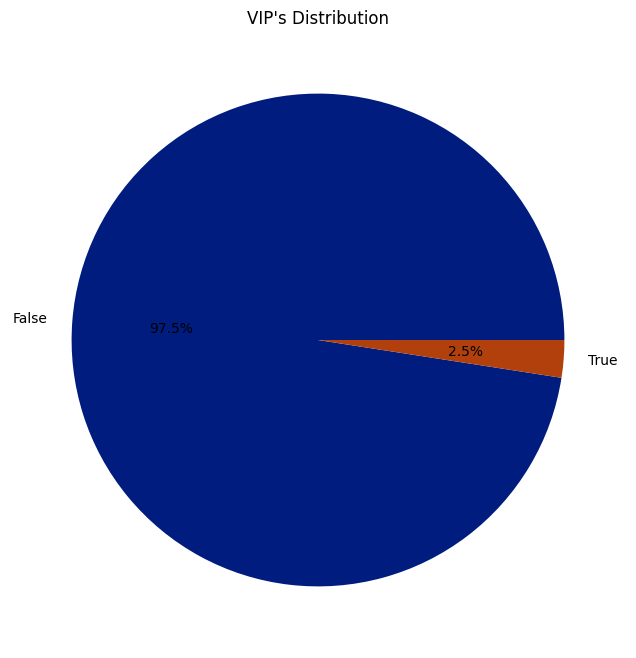

In [13]:
# see how many of passengers are VIP
plt.figure(figsize=(8, 8))
plt.title("VIP's Distribution")
colors = sns.color_palette('dark')
plt.pie(df["VIP"].value_counts().values,
        labels=df["VIP"].value_counts().index, colors=colors, autopct="%0.1f%%")
plt.show()

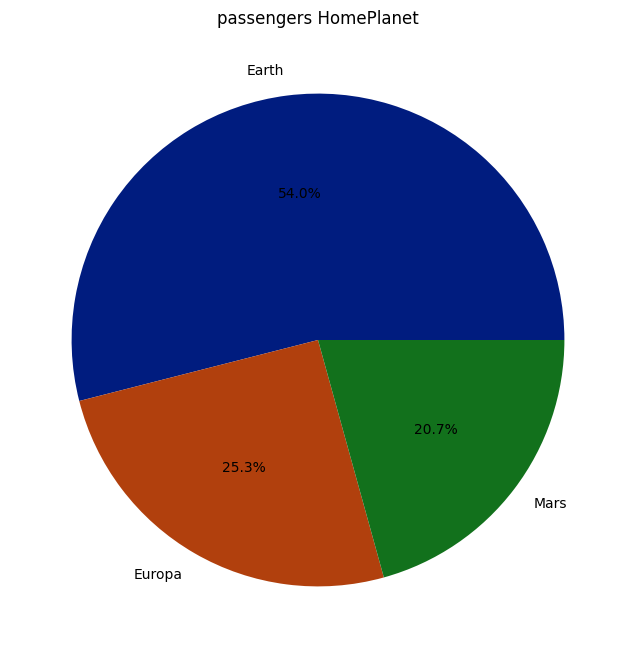

In [14]:
# see passengers HomePlanet
plt.figure(figsize=(8, 8))
plt.title("passengers HomePlanet")
colors = sns.color_palette('dark')
plt.pie(df["HomePlanet"].value_counts().values,
        labels=df["HomePlanet"].value_counts().index, colors=colors, autopct="%0.1f%%")
plt.show()

## doing some feature engineering here, we categorize wealth of passengers by inspecting how much they spend on foodcourt!
*   zero
*   less than 1k
*   less than 10k
*   and more than 10k dollars.

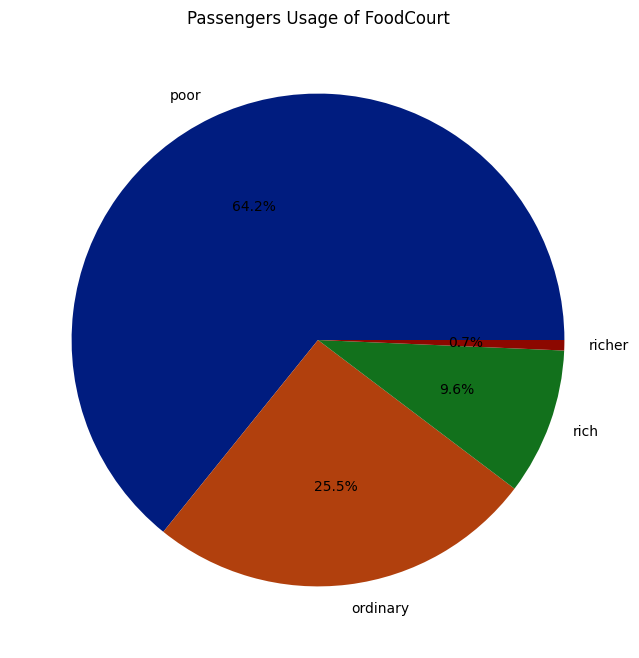

In [26]:
df['FoodCourtCategory'] = pd.cut(df['FoodCourt'], bins=[-1, 0, 1000, 10000, float('inf')],
labels=['poor', 'ordinary', 'rich', 'richer'])

# Plotting the pie chart based on the new category column
plt.figure(figsize=(8, 8))
plt.title("Passengers Usage of FoodCourt")
colors = sns.color_palette('dark')
plt.pie(df['FoodCourtCategory'].value_counts().values,
        labels=df['FoodCourtCategory'].value_counts().index, colors=colors, autopct="%0.1f%%")
plt.show()

### 64% of passengers spend 0 on foodcourt (if you don't had enough money to pay for foodcourt at least once, Why did you board the Titanic ship, man?!)

In [36]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6606 entries, 0 to 8692
Data columns (total 20 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Age                         6606 non-null   float64
 1   RoomService                 6606 non-null   float64
 2   FoodCourt                   6606 non-null   float64
 3   ShoppingMall                6606 non-null   float64
 4   Spa                         6606 non-null   float64
 5   VRDeck                      6606 non-null   float64
 6   HomePlanet_Earth            6606 non-null   uint8  
 7   HomePlanet_Europa           6606 non-null   uint8  
 8   HomePlanet_Mars             6606 non-null   uint8  
 9   CryoSleep_False             6606 non-null   uint8  
 10  CryoSleep_True              6606 non-null   uint8  
 11  Destination_55 Cancri e     6606 non-null   uint8  
 12  Destination_PSO J318.5-22   6606 non-null   uint8  
 13  Destination_TRAPPIST-1e     6606 

## dropping passengers ID and Name and cabin number as they didn't convay any data in them:

In [31]:
df.drop(["PassengerId", "Name", "Cabin"], axis=1, inplace=True)

## performing one-hot encoding on categorical columns:

In [29]:
categorical_data = pd.get_dummies(df[["HomePlanet",
                                      "CryoSleep", "Destination",
                                      "VIP", "FoodCourtCategory"]])
df.drop(["HomePlanet","CryoSleep", "Destination","VIP",
         "FoodCourtCategory"], axis=1, inplace=True)

df = pd.concat([df, categorical_data], axis=1)

In [34]:
# rewriting Transported (target column) with true/false:
df["Transported"] = df["Transported"].map({False:0, True:1})

In [35]:
truth = df.pop("Transported")

In [37]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6606 entries, 0 to 8692
Data columns (total 20 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Age                         6606 non-null   float64
 1   RoomService                 6606 non-null   float64
 2   FoodCourt                   6606 non-null   float64
 3   ShoppingMall                6606 non-null   float64
 4   Spa                         6606 non-null   float64
 5   VRDeck                      6606 non-null   float64
 6   HomePlanet_Earth            6606 non-null   uint8  
 7   HomePlanet_Europa           6606 non-null   uint8  
 8   HomePlanet_Mars             6606 non-null   uint8  
 9   CryoSleep_False             6606 non-null   uint8  
 10  CryoSleep_True              6606 non-null   uint8  
 11  Destination_55 Cancri e     6606 non-null   uint8  
 12  Destination_PSO J318.5-22   6606 non-null   uint8  
 13  Destination_TRAPPIST-1e     6606 

## doing some routine jobs:

In [39]:
# scaling columns
scaler = MinMaxScaler()
df[list(df.columns)] = scaler.fit_transform(df[list(df.columns)])

In [40]:
# train/test split
X_train, X_test, y_train, y_test = train_test_split(df, truth, test_size=0.2)

## designing first model:

In [41]:
#settin early stopping parameters
early_stopping = callbacks.EarlyStopping(
    min_delta=0.001,          # minimium amount of requierd change
    patience=5,              # number of epochs after reaching less improvement than delta
    restore_best_weights=True,
)

In [42]:
def create_model(no_hidden_neurons: list=[10], input_size=X_train.shape[1],
                 activation_func: str='relu', l1_reg: float=0.0, l2_reg: float=0.0,
                 learning_rate: float=0.001, learning_rate_decay: float=0.95,
                 dropout_rate: float=0.0,weight_initializer: str='',
                 optimizer_name: str='adam',regularization_type: str='kernel'):



  # Setup the weight initialization techniques
  if weight_initializer == 'RandomNormal':
    weight_initializer = initializers.RandomNormal()
  elif weight_initializer == 'RandomUniform':
    weight_initializer = initializers.RandomUniform()
  elif weight_initializer == 'Zeros':
    weight_initializer = initializers.Zeros()
  elif weight_initializer == 'GlorotUniform':
    weight_initializer = initializers.GlorotUniform()
  elif weight_initializer == 'GlorotNormal':
    weight_initializer = initializers.GlorotNormal()
  else:
    weight_initializer = None

  model = Sequential()

  model.add(Input(shape=input_size))



  # hidden layers
  itr = 0
  for n_l in no_hidden_neurons:

      # Add regularization
      if l1_reg and l2_reg:
        if regularization_type == 'activation':
          model.add(Dense(n_l, activation=activation_func,activity_regularizer=l1_l2(l1=l1_reg,l2=l2_reg),kernel_initializer=weight_initializer))
        else:
          model.add(Dense(n_l, activation=activation_func,kernel_regularizer=l1_l2(l1=l1_reg,l2=l2_reg),kernel_initializer=weight_initializer))
      elif l1_reg:
        if regularization_type == 'activation':
          model.add(Dense(n_l, activation=activation_func,activity_regularizer=l1(l1_reg),kernel_initializer=weight_initializer))
        else:
          model.add(Dense(n_l, activation=activation_func,kernel_regularizer=l1(l1_reg),kernel_initializer=weight_initializer))
      elif l2_reg:
        if regularization_type == 'activation':
          model.add(Dense(n_l, activation=activation_func,activity_regularizer=l2(l2_reg),kernel_initializer=weight_initializer))
        else:
          model.add(Dense(n_l, activation=activation_func,kernel_regularizer=l2(l2_reg),kernel_initializer=weight_initializer))
      else:
        model.add(Dense(n_l, activation=activation_func,kernel_initializer=weight_initializer))

      if dropout_rate and itr%2 == 0:
        model.add(Dropout(dropout_rate))

      itr += 1



  # Add the last layer's activation layer
  model.add(Dense(1, activation='sigmoid'))

  # compiling
  if optimizer_name == 'sgd':
    opimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate)
  elif optimizer_name == 'RMSprop':
    opimizer = tf.keras.optimizers.RMSprop(learning_rate=learning_rate)
  elif optimizer_name == 'Adadelta':
    opimizer = tf.keras.optimizers.Adadelta(learning_rate=learning_rate,rho=learning_rate_decay)
  else:
    opimizer = tf.keras.optimizers.Adam(lr=learning_rate,beta_1=learning_rate_decay)
  model.compile(
        loss='binary_crossentropy',
        optimizer=opimizer,
        metrics=[tf.keras.metrics.Precision(),tf.keras.metrics.Recall()],
        )

  return model

In [44]:
# this function prints the current values of model output in training time:
def plot_history(history,plot_type: str='loss'):
  hist_df = pd.DataFrame(history.history)
  plt.figure(figsize=(20,8))
  colors = []
  columns_to_plot = []
  labels = []
  for col_name in hist_df.columns:

    # Define colors
    if 'val' in col_name:
      validation = True
      color_base = 'r'
      label_base = 'Validation'
    else:
      validation = False
      color_base = 'b'
      label_base = 'Training'

    if plot_type == 'loss':
      if 'loss' in col_name:
        labels.append(label_base)
        columns_to_plot.append(col_name)
        colors.append(color_base)
    else:
      if 'loss' in col_name:
        continue
      if 'recall' in col_name:
        color = color_base + '--'
        label = label_base + 'Recall'
      else:
        color = color_base
        label = label_base + 'Precision'

      labels.append(label)
      columns_to_plot.append(col_name)
      colors.append(color)



  for itr in range(0,len(columns_to_plot)):
    plt.plot(hist_df.loc[:, [columns_to_plot[itr]]], colors[itr], label=labels[itr],lw=4)

  plt.ylabel(plot_type)
  plt.xlabel('Epochs')
  plt.legend(loc="best")

  plt.show()

In [45]:
#creating model:
model = create_model(no_hidden_neurons=[50,25,10], activation_func='sigmoid',l1_reg=0,l2_reg=0)
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 50)                1050      
                                                                 
 dense_1 (Dense)             (None, 25)                1275      
                                                                 
 dense_2 (Dense)             (None, 10)                260       
                                                                 
 dense_3 (Dense)             (None, 1)                 11        
                                                                 
Total params: 2596 (10.14 KB)
Trainable params: 2596 (10.14 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [48]:
history = model.fit(X_train, y_train,
                    batch_size = 32,
                    epochs = 150,
                    validation_split=0.2,
                    callbacks=[early_stopping]
                    )

Epoch 1/150
133/133 [==============================] - 2s 15ms/step - loss: 0.4365 - precision: 0.7812 - recall: 0.8072 - val_loss: 0.4259 - val_precision: 0.8119 - val_recall: 0.7862
Epoch 2/150
133/133 [==============================] - 2s 13ms/step - loss: 0.4343 - precision: 0.7862 - recall: 0.8143 - val_loss: 0.4245 - val_precision: 0.8060 - val_recall: 0.8030
Epoch 3/150
133/133 [==============================] - 1s 4ms/step - loss: 0.4339 - precision: 0.7861 - recall: 0.8016 - val_loss: 0.4244 - val_precision: 0.7926 - val_recall: 0.8383
Epoch 4/150
133/133 [==============================] - 0s 3ms/step - loss: 0.4345 - precision: 0.7856 - recall: 0.8044 - val_loss: 0.4260 - val_precision: 0.8138 - val_recall: 0.7881
Epoch 5/150
133/133 [==============================] - 0s 3ms/step - loss: 0.4335 - precision: 0.7875 - recall: 0.8068 - val_loss: 0.4243 - val_precision: 0.7912 - val_recall: 0.8383
Epoch 6/150
133/133 [==============================] - 0s 3ms/step - loss: 0.4349 -

## making prediction and calculating F1-Score:

In [49]:
def convert_predictions(predictions):
  convereted = np.where(predictions>0.5, 1, 0)
  return convereted

In [50]:
predictions = model.predict(X_test)

42/42 [==============================] - 0s 2ms/step


In [53]:
f1_score(y_test, convert_predictions(predictions), average="weighted")

0.7851361088482873

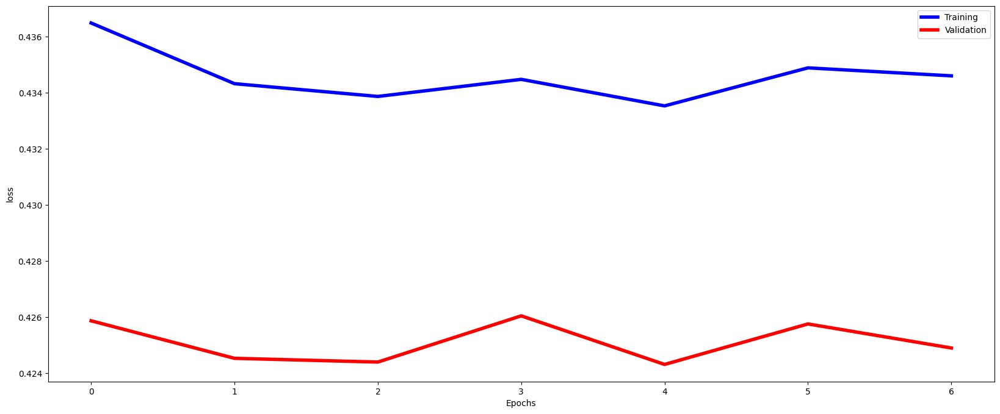

In [54]:
plot_history(history)

## using cross validation:


In [55]:
def kfold_validation(no_folds: int=4, plot_results: bool=True,
                     model_params: dict={},training_params: dict={}):
  validation_set_accuracy = []
  models = []

  if plot_results:
    verbose=2
  else:
    verbose=0

  itr = 0
  kf = KFold(n_splits=no_folds)
  for train_index, val_index in kf.split(X_train,y_train):

    train_set, y_train_set = X_train.iloc[train_index], y_train.iloc[train_index]
    val_set,y_val = X_train.iloc[val_index], y_train.iloc[val_index]

    # creating a new model
    model = create_model(**model_params)

    # fitting the model
    history = model.fit(train_set, y_train_set,
                      validation_data=(val_set,y_val),
                      callbacks=[early_stopping],
                      verbose=verbose,
                      **training_params,
                      )


    # making prediction
    pred_val = model.predict(val_set)
    f1 = f1_score(convert_predictions(y_val), convert_predictions(pred_val), average='weighted')

    validation_set_accuracy.append(f1)
    models.append(model)

    # Plot the results
    if plot_results:
      plot_history(history,plot_type='acc')


  # Convert to numpy
  validation_set_accuracy = np.array(validation_set_accuracy)

  # Return the best model
  best_model = models[np.argmax(validation_set_accuracy)]

  # Print the reults
  if plot_results:
    print('Average F1-Score over validation set is %.2f' %validation_set_accuracy.mean())
    print('STD of F1-Score over validation set is %.2f' %validation_set_accuracy.std())
  return best_model,validation_set_accuracy.mean(),validation_set_accuracy.std()

In [56]:
kfold_params = {
    'no_folds': 4,
    'plot_results': True,
    'model_params': {
      'no_hidden_neurons': [25,10],
      'activation_func': 'sigmoid',
      'l1_reg': 0,
      'l2_reg': 0,
      'learning_rate': 0.001,
      'learning_rate_decay': 0.99,
      'dropout_rate':0,
      'weight_initializer': None,
      'optimizer_name': 'adam',
      'regularization_type': 'kernel',
  },
  'training_params': {
    'batch_size': 16,
    'epochs': 10
  }
}

Epoch 1/10
248/248 - 2s - loss: 0.7133 - precision_1: 0.5027 - recall_1: 0.6966 - val_loss: 0.6785 - val_precision_1: 0.5297 - val_recall_1: 0.9101 - 2s/epoch - 7ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6615 - precision_1: 0.7171 - recall_1: 0.6658 - val_loss: 0.6418 - val_precision_1: 0.6876 - val_recall_1: 0.7348 - 614ms/epoch - 2ms/step
Epoch 3/10
248/248 - 1s - loss: 0.6146 - precision_1: 0.7597 - recall_1: 0.6827 - val_loss: 0.5962 - val_precision_1: 0.7763 - val_recall_1: 0.6082 - 621ms/epoch - 3ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5717 - precision_1: 0.7912 - recall_1: 0.6529 - val_loss: 0.5705 - val_precision_1: 0.7596 - val_recall_1: 0.6646 - 581ms/epoch - 2ms/step
Epoch 5/10
248/248 - 1s - loss: 0.5520 - precision_1: 0.7875 - recall_1: 0.6753 - val_loss: 0.5617 - val_precision_1: 0.7526 - val_recall_1: 0.6585 - 582ms/epoch - 2ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5431 - precision_1: 0.7885 - recall_1: 0.6812 - val_loss: 0.5548 - val_precision_1: 0.7716 - val_recall_

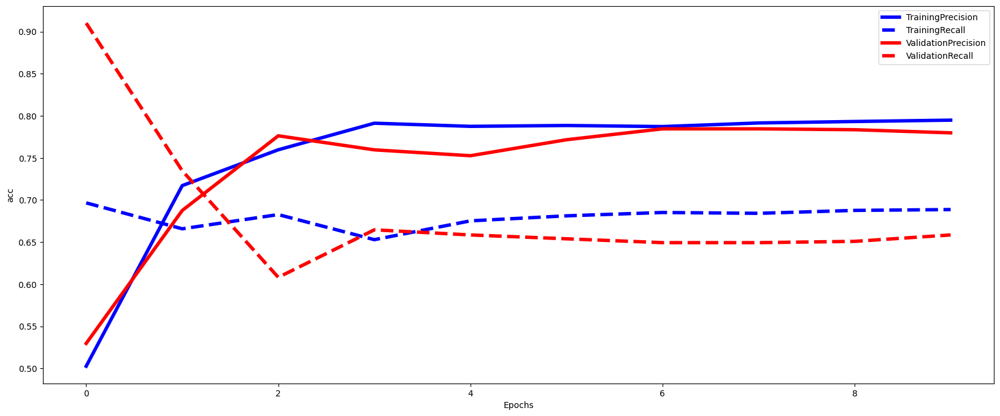

Epoch 1/10
248/248 - 2s - loss: 0.7172 - precision_2: 0.4929 - recall_2: 0.3107 - val_loss: 0.6813 - val_precision_2: 0.9766 - val_recall_2: 0.1863 - 2s/epoch - 8ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6650 - precision_2: 0.5789 - recall_2: 0.7964 - val_loss: 0.6450 - val_precision_2: 0.8092 - val_recall_2: 0.6006 - 648ms/epoch - 3ms/step
Epoch 3/10
248/248 - 1s - loss: 0.6153 - precision_2: 0.7893 - recall_2: 0.6408 - val_loss: 0.5880 - val_precision_2: 0.7964 - val_recall_2: 0.6587 - 622ms/epoch - 3ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5653 - precision_2: 0.7867 - recall_2: 0.6348 - val_loss: 0.5552 - val_precision_2: 0.8100 - val_recall_2: 0.6036 - 639ms/epoch - 3ms/step
Epoch 5/10
248/248 - 1s - loss: 0.5453 - precision_2: 0.7954 - recall_2: 0.6338 - val_loss: 0.5447 - val_precision_2: 0.8121 - val_recall_2: 0.5991 - 606ms/epoch - 2ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5404 - precision_2: 0.7861 - recall_2: 0.6488 - val_loss: 0.5358 - val_precision_2: 0.7986 - val_recall_

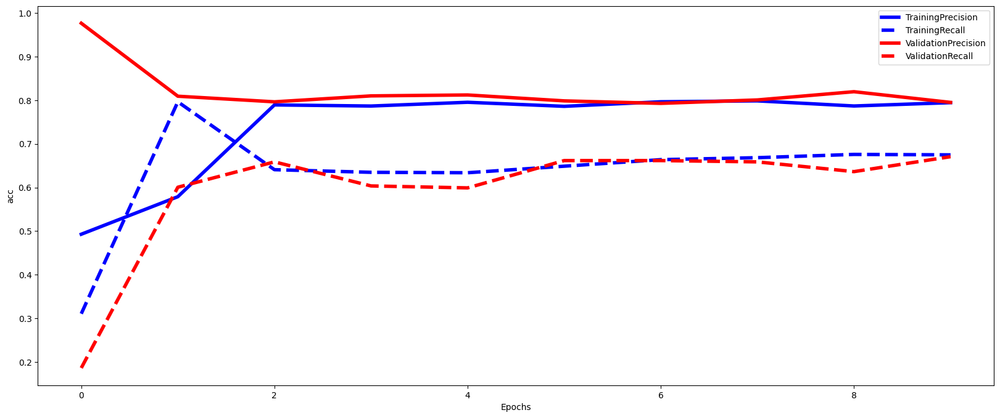

Epoch 1/10
248/248 - 2s - loss: 0.6786 - precision_3: 0.6462 - recall_3: 0.5676 - val_loss: 0.6588 - val_precision_3: 0.7217 - val_recall_3: 0.7217 - 2s/epoch - 7ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6348 - precision_3: 0.7211 - recall_3: 0.7067 - val_loss: 0.6061 - val_precision_3: 0.8071 - val_recall_3: 0.6414 - 614ms/epoch - 2ms/step
Epoch 3/10
248/248 - 1s - loss: 0.5870 - precision_3: 0.7808 - recall_3: 0.6256 - val_loss: 0.5620 - val_precision_3: 0.7967 - val_recall_3: 0.6473 - 622ms/epoch - 3ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5613 - precision_3: 0.7861 - recall_3: 0.6291 - val_loss: 0.5504 - val_precision_3: 0.7632 - val_recall_3: 0.7098 - 911ms/epoch - 4ms/step
Epoch 5/10
248/248 - 1s - loss: 0.5526 - precision_3: 0.7801 - recall_3: 0.6747 - val_loss: 0.5395 - val_precision_3: 0.7926 - val_recall_3: 0.6994 - 1s/epoch - 4ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5449 - precision_3: 0.7885 - recall_3: 0.6662 - val_loss: 0.5350 - val_precision_3: 0.7787 - val_recall_3: 

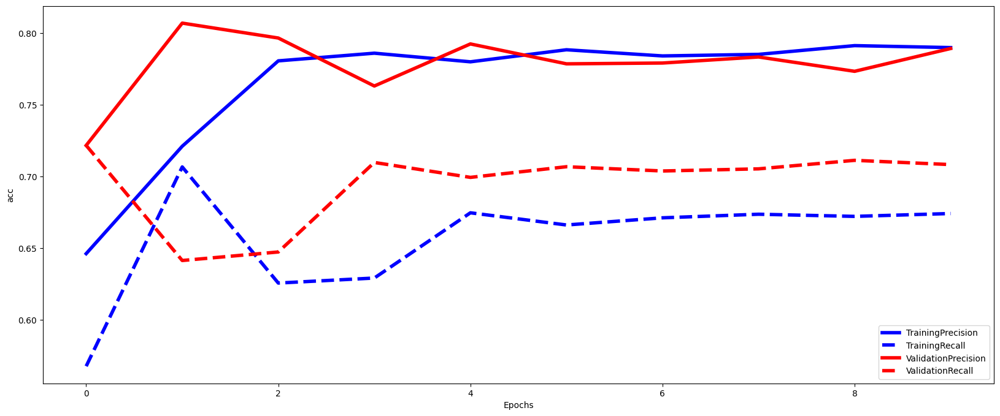

Epoch 1/10
248/248 - 2s - loss: 0.6911 - precision_4: 0.5856 - recall_4: 0.3747 - val_loss: 0.6660 - val_precision_4: 0.6888 - val_recall_4: 0.7586 - 2s/epoch - 7ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6450 - precision_4: 0.6075 - recall_4: 0.7959 - val_loss: 0.6135 - val_precision_4: 0.8117 - val_recall_4: 0.6230 - 592ms/epoch - 2ms/step
Epoch 3/10
248/248 - 1s - loss: 0.5852 - precision_4: 0.7844 - recall_4: 0.6478 - val_loss: 0.5550 - val_precision_4: 0.7985 - val_recall_4: 0.6379 - 622ms/epoch - 3ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5491 - precision_4: 0.8015 - recall_4: 0.6303 - val_loss: 0.5365 - val_precision_4: 0.8033 - val_recall_4: 0.6572 - 612ms/epoch - 2ms/step
Epoch 5/10
248/248 - 1s - loss: 0.5384 - precision_4: 0.7999 - recall_4: 0.6398 - val_loss: 0.5291 - val_precision_4: 0.8078 - val_recall_4: 0.6513 - 626ms/epoch - 3ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5325 - precision_4: 0.7879 - recall_4: 0.6688 - val_loss: 0.5259 - val_precision_4: 0.8102 - val_recall_

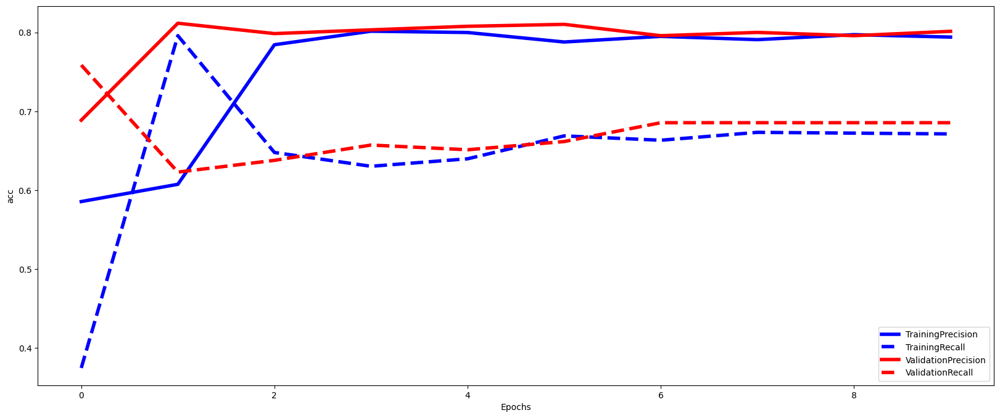

Average F1-Score over validation set is 0.75
STD of F1-Score over validation set is 0.01


In [57]:
model,validation_set_accuracy_mean,validation_set_accuracy_std = kfold_validation(**kfold_params)

## the average F1-score using 4-fold validation became 4% less than the previous MLP, so we need more tuning regarding hyper parameters.we will use the below function to make  tuning more straight forward:

In [58]:
def evaluate_efect_param(parameter_type: str='kfold', parameter_name: str='', values_list: list=[]):
  scores_val = []
  scores_test = []
  models = []
  for val in values_list:

      if parameter_type == 'kfold':
        kfold_params[parameter_name] = val
      elif parameter_type == 'model_params':
        kfold_params['model_params'][parameter_name] = val
      elif parameter_type == 'training_params':
        kfold_params['training_params'][parameter_name] = val

      model,validation_set_accuracy_mean,validation_set_accuracy_std = kfold_validation(**kfold_params)

      scores_val.append(validation_set_accuracy_mean)

      predictions = model.predict(X_test)
      score_test = f1_score(convert_predictions(y_test), convert_predictions(predictions), average='weighted')
      scores_test.append(score_test)

      models.append(model)
      print('Val: %s, Validation Score: %.3f, Test Score: %.3f' %(str(val),validation_set_accuracy_mean,score_test))


  # Plot the results
  plt.figure(figsize=(20,8))
  str_values_list = []
  for v in values_list:
    str_values_list.append(str(v))

  plt.plot(str_values_list,scores_test,lw=5)
  plt.plot(str_values_list,scores_val,lw=5,color='orange')
  plt.xlabel(parameter_name)
  plt.ylabel('F1-Score')
  plt.legend(['F1: Test Set','F1: Validation Set'])
  plt.show()

  # Get the best model
  best_model = models[np.argmax(scores_test)]
  best_val = values_list[np.argmax(scores_test)]

  return best_model,best_val


# choosing the best optimizer:

Epoch 1/10
248/248 - 1s - loss: 0.6952 - precision_5: 0.5082 - recall_5: 1.0000 - val_loss: 0.6960 - val_precision_5: 0.4966 - val_recall_5: 1.0000 - 1s/epoch - 6ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6949 - precision_5: 0.5082 - recall_5: 1.0000 - val_loss: 0.6957 - val_precision_5: 0.4966 - val_recall_5: 1.0000 - 908ms/epoch - 4ms/step
Epoch 3/10
248/248 - 1s - loss: 0.6947 - precision_5: 0.5082 - recall_5: 1.0000 - val_loss: 0.6953 - val_precision_5: 0.4966 - val_recall_5: 1.0000 - 973ms/epoch - 4ms/step
Epoch 4/10
248/248 - 1s - loss: 0.6944 - precision_5: 0.5082 - recall_5: 1.0000 - val_loss: 0.6951 - val_precision_5: 0.4966 - val_recall_5: 1.0000 - 965ms/epoch - 4ms/step
Epoch 5/10
248/248 - 1s - loss: 0.6942 - precision_5: 0.5082 - recall_5: 1.0000 - val_loss: 0.6948 - val_precision_5: 0.4966 - val_recall_5: 1.0000 - 992ms/epoch - 4ms/step
Epoch 6/10
248/248 - 1s - loss: 0.6940 - precision_5: 0.5082 - recall_5: 1.0000 - val_loss: 0.6946 - val_precision_5: 0.4966 - val_recall_

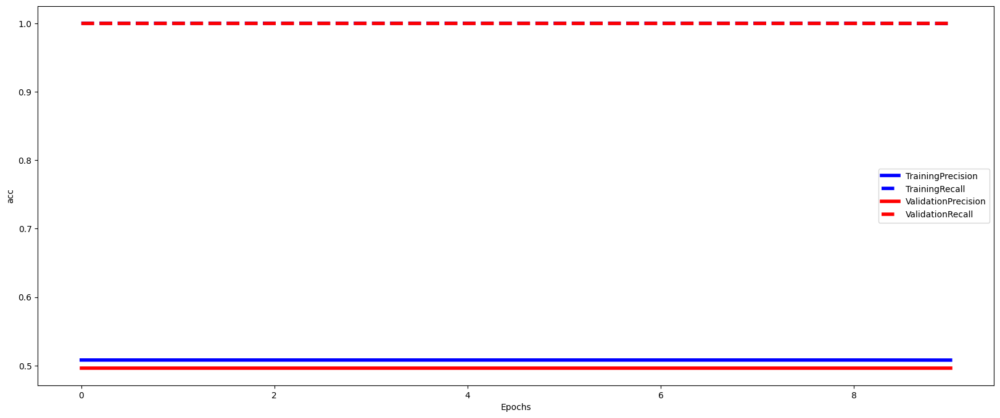

Epoch 1/10
248/248 - 1s - loss: 0.7394 - precision_6: 0.5044 - recall_6: 1.0000 - val_loss: 0.7256 - val_precision_6: 0.5079 - val_recall_6: 1.0000 - 1s/epoch - 6ms/step
Epoch 2/10
248/248 - 1s - loss: 0.7194 - precision_6: 0.5044 - recall_6: 1.0000 - val_loss: 0.7107 - val_precision_6: 0.5079 - val_recall_6: 1.0000 - 593ms/epoch - 2ms/step
Epoch 3/10
248/248 - 1s - loss: 0.7073 - precision_6: 0.5044 - recall_6: 1.0000 - val_loss: 0.7018 - val_precision_6: 0.5079 - val_recall_6: 1.0000 - 582ms/epoch - 2ms/step
Epoch 4/10
248/248 - 1s - loss: 0.7000 - precision_6: 0.5044 - recall_6: 1.0000 - val_loss: 0.6964 - val_precision_6: 0.5079 - val_recall_6: 1.0000 - 589ms/epoch - 2ms/step
Epoch 5/10
248/248 - 1s - loss: 0.6956 - precision_6: 0.5044 - recall_6: 1.0000 - val_loss: 0.6931 - val_precision_6: 0.5079 - val_recall_6: 1.0000 - 567ms/epoch - 2ms/step
Epoch 6/10
248/248 - 1s - loss: 0.6928 - precision_6: 0.5044 - recall_6: 1.0000 - val_loss: 0.6912 - val_precision_6: 0.5079 - val_recall_

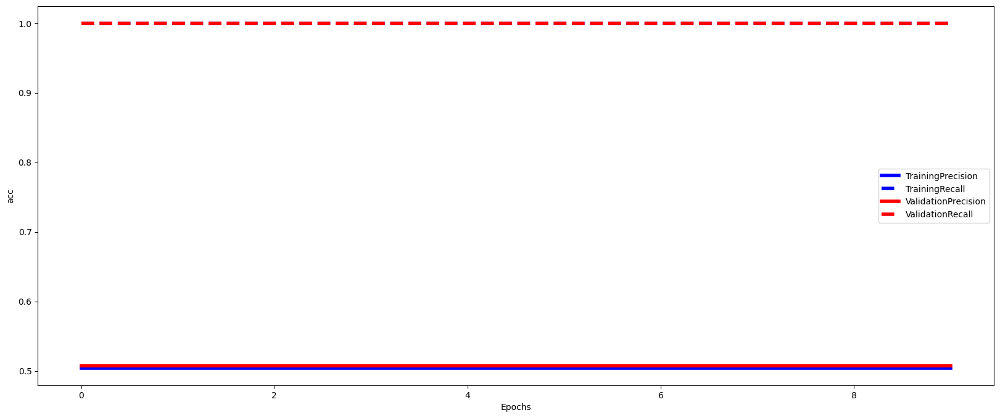

Epoch 1/10
248/248 - 2s - loss: 0.6946 - precision_7: 0.0000e+00 - recall_7: 0.0000e+00 - val_loss: 0.6943 - val_precision_7: 0.2000 - val_recall_7: 0.0015 - 2s/epoch - 9ms/step
Epoch 2/10
248/248 - 2s - loss: 0.6942 - precision_7: 0.3448 - recall_7: 0.0100 - val_loss: 0.6938 - val_precision_7: 0.3462 - val_recall_7: 0.0268 - 2s/epoch - 10ms/step
Epoch 3/10
248/248 - 1s - loss: 0.6938 - precision_7: 0.3846 - recall_7: 0.0551 - val_loss: 0.6935 - val_precision_7: 0.4844 - val_recall_7: 0.1384 - 743ms/epoch - 3ms/step
Epoch 4/10
248/248 - 1s - loss: 0.6936 - precision_7: 0.5489 - recall_7: 0.2442 - val_loss: 0.6932 - val_precision_7: 0.6156 - val_recall_7: 0.3170 - 568ms/epoch - 2ms/step
Epoch 5/10
248/248 - 1s - loss: 0.6934 - precision_7: 0.5661 - recall_7: 0.3193 - val_loss: 0.6930 - val_precision_7: 0.5545 - val_recall_7: 0.3631 - 550ms/epoch - 2ms/step
Epoch 6/10
248/248 - 1s - loss: 0.6933 - precision_7: 0.4832 - recall_7: 0.4029 - val_loss: 0.6929 - val_precision_7: 0.4832 - val_r

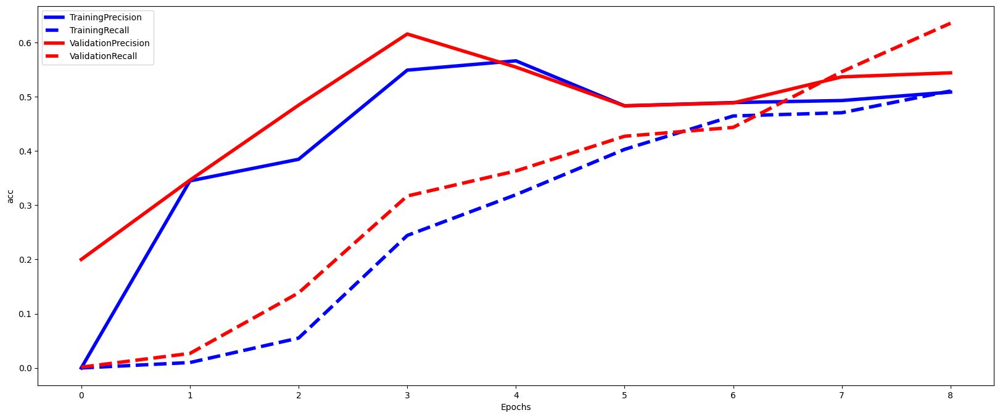

Epoch 1/10
248/248 - 1s - loss: 0.7563 - precision_8: 0.0000e+00 - recall_8: 0.0000e+00 - val_loss: 0.7458 - val_precision_8: 0.0000e+00 - val_recall_8: 0.0000e+00 - 1s/epoch - 6ms/step
Epoch 2/10
248/248 - 1s - loss: 0.7341 - precision_8: 0.0000e+00 - recall_8: 0.0000e+00 - val_loss: 0.7275 - val_precision_8: 0.0000e+00 - val_recall_8: 0.0000e+00 - 566ms/epoch - 2ms/step
Epoch 3/10
248/248 - 1s - loss: 0.7195 - precision_8: 0.0000e+00 - recall_8: 0.0000e+00 - val_loss: 0.7156 - val_precision_8: 0.0000e+00 - val_recall_8: 0.0000e+00 - 583ms/epoch - 2ms/step
Epoch 4/10
248/248 - 1s - loss: 0.7101 - precision_8: 0.0000e+00 - recall_8: 0.0000e+00 - val_loss: 0.7077 - val_precision_8: 0.0000e+00 - val_recall_8: 0.0000e+00 - 591ms/epoch - 2ms/step
Epoch 5/10
248/248 - 1s - loss: 0.7039 - precision_8: 0.0000e+00 - recall_8: 0.0000e+00 - val_loss: 0.7025 - val_precision_8: 0.0000e+00 - val_recall_8: 0.0000e+00 - 585ms/epoch - 2ms/step
Epoch 6/10
248/248 - 1s - loss: 0.6998 - precision_8: 0.00

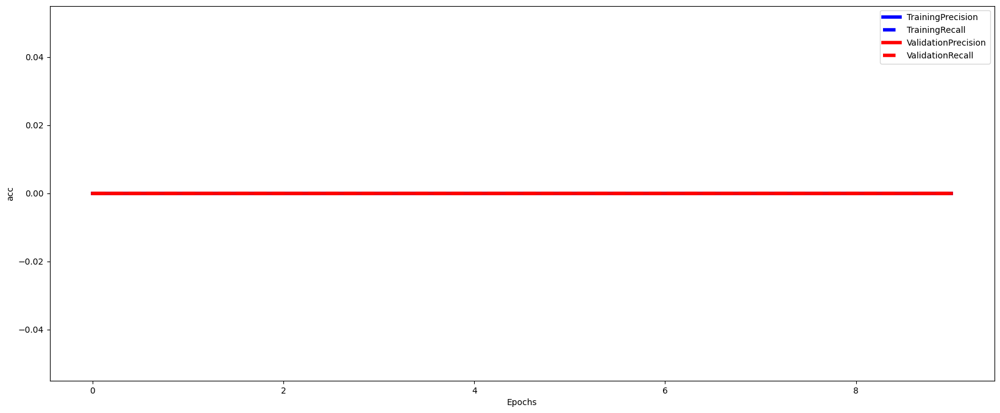

Average F1-Score over validation set is 0.38
STD of F1-Score over validation set is 0.08
42/42 [==============================] - 0s 2ms/step


Val: sgd, Validation Score: 0.380, Test Score: 0.531
Epoch 1/10
248/248 - 2s - loss: 0.6783 - precision_9: 0.6215 - recall_9: 0.5144 - val_loss: 0.6508 - val_precision_9: 0.5603 - val_recall_9: 0.8643 - 2s/epoch - 7ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6154 - precision_9: 0.7214 - recall_9: 0.6877 - val_loss: 0.5885 - val_precision_9: 0.7656 - val_recall_9: 0.6174 - 615ms/epoch - 2ms/step
Epoch 3/10
248/248 - 1s - loss: 0.5615 - precision_9: 0.7888 - recall_9: 0.6415 - val_loss: 0.5594 - val_precision_9: 0.7675 - val_recall_9: 0.6189 - 589ms/epoch - 2ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5424 - precision_9: 0.7940 - recall_9: 0.6584 - val_loss: 0.5539 - val_precision_9: 0.7819 - val_recall_9: 0.6067 - 603ms/epoch - 2ms/step
Epoch 5/10
248/248 - 1s - loss: 0.5347 - precision_9: 0.7902 - recall_9: 0.6787 - val_loss: 0.5490 - val_precision_9: 0.7696 - val_recall_9: 0.6570 - 589ms/epoch - 2ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5294 - precision_9: 0.7884 - recall_9: 0.6862 - val

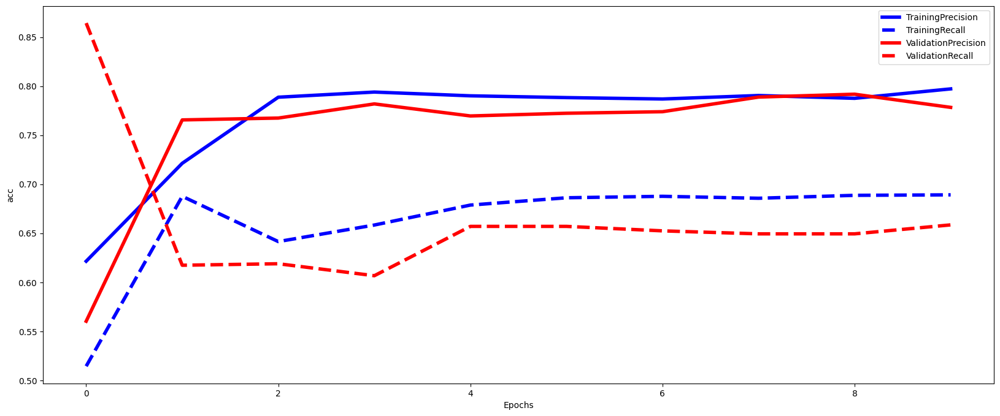

Epoch 1/10
248/248 - 2s - loss: 0.6828 - precision_10: 0.5571 - recall_10: 0.5273 - val_loss: 0.6646 - val_precision_10: 0.5441 - val_recall_10: 0.9106 - 2s/epoch - 8ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6346 - precision_10: 0.6885 - recall_10: 0.7044 - val_loss: 0.6064 - val_precision_10: 0.8004 - val_recall_10: 0.6155 - 614ms/epoch - 2ms/step
Epoch 3/10
248/248 - 1s - loss: 0.5783 - precision_10: 0.7865 - recall_10: 0.6303 - val_loss: 0.5626 - val_precision_10: 0.7943 - val_recall_10: 0.6215 - 589ms/epoch - 2ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5533 - precision_10: 0.7885 - recall_10: 0.6378 - val_loss: 0.5498 - val_precision_10: 0.8000 - val_recall_10: 0.6617 - 620ms/epoch - 2ms/step
Epoch 5/10
248/248 - 1s - loss: 0.5448 - precision_10: 0.7879 - recall_10: 0.6708 - val_loss: 0.5432 - val_precision_10: 0.8089 - val_recall_10: 0.6498 - 632ms/epoch - 3ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5395 - precision_10: 0.7931 - recall_10: 0.6693 - val_loss: 0.5369 - val_precision_1

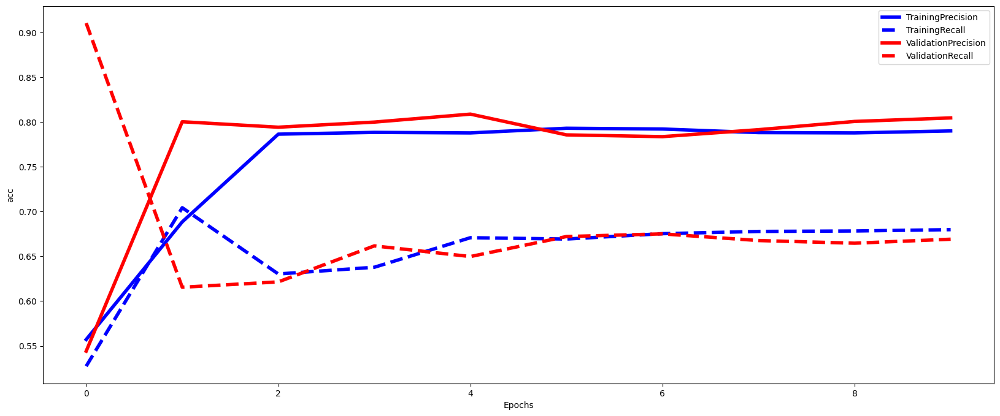

Epoch 1/10
248/248 - 3s - loss: 0.6814 - precision_11: 0.5939 - recall_11: 0.7062 - val_loss: 0.6601 - val_precision_11: 0.8182 - val_recall_11: 0.6295 - 3s/epoch - 10ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6332 - precision_11: 0.7468 - recall_11: 0.6687 - val_loss: 0.6008 - val_precision_11: 0.7978 - val_recall_11: 0.6399 - 844ms/epoch - 3ms/step
Epoch 3/10
248/248 - 1s - loss: 0.5818 - precision_11: 0.7747 - recall_11: 0.6486 - val_loss: 0.5603 - val_precision_11: 0.7933 - val_recall_11: 0.6682 - 912ms/epoch - 4ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5586 - precision_11: 0.7802 - recall_11: 0.6697 - val_loss: 0.5473 - val_precision_11: 0.7986 - val_recall_11: 0.6905 - 1s/epoch - 4ms/step
Epoch 5/10
248/248 - 1s - loss: 0.5512 - precision_11: 0.7826 - recall_11: 0.6667 - val_loss: 0.5419 - val_precision_11: 0.7697 - val_recall_11: 0.7113 - 608ms/epoch - 2ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5442 - precision_11: 0.7879 - recall_11: 0.6692 - val_loss: 0.5356 - val_precision_11:

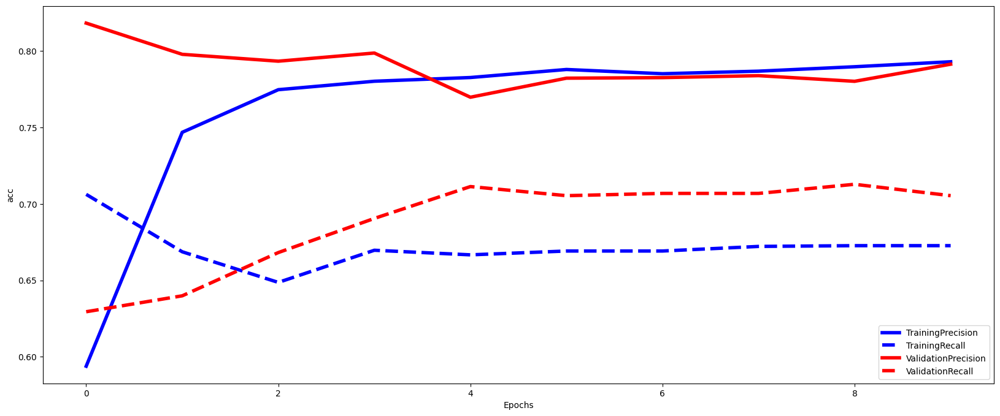

Epoch 1/10
248/248 - 2s - loss: 0.6948 - precision_12: 0.5515 - recall_12: 0.3642 - val_loss: 0.6750 - val_precision_12: 0.7917 - val_recall_12: 0.6572 - 2s/epoch - 7ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6582 - precision_12: 0.5933 - recall_12: 0.8189 - val_loss: 0.6294 - val_precision_12: 0.7882 - val_recall_12: 0.6379 - 605ms/epoch - 2ms/step
Epoch 3/10
248/248 - 1s - loss: 0.5986 - precision_12: 0.7514 - recall_12: 0.6818 - val_loss: 0.5663 - val_precision_12: 0.7922 - val_recall_12: 0.6364 - 605ms/epoch - 2ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5556 - precision_12: 0.7978 - recall_12: 0.6258 - val_loss: 0.5416 - val_precision_12: 0.7985 - val_recall_12: 0.6438 - 634ms/epoch - 3ms/step
Epoch 5/10
248/248 - 1s - loss: 0.5421 - precision_12: 0.7982 - recall_12: 0.6313 - val_loss: 0.5320 - val_precision_12: 0.8055 - val_recall_12: 0.6602 - 615ms/epoch - 2ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5359 - precision_12: 0.8028 - recall_12: 0.6413 - val_loss: 0.5268 - val_precision_1

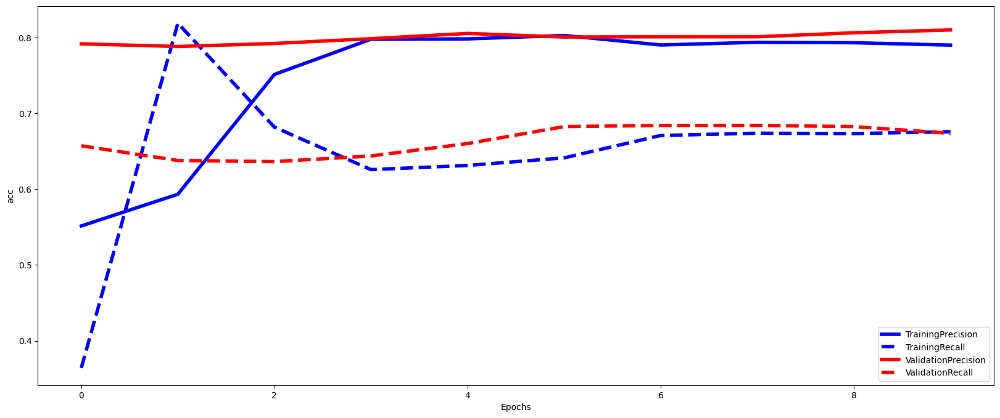

Average F1-Score over validation set is 0.75
STD of F1-Score over validation set is 0.01
42/42 [==============================] - 0s 2ms/step
Val: adam, Validation Score: 0.748, Test Score: 0.752
Epoch 1/10
248/248 - 2s - loss: 0.6757 - precision_13: 0.6304 - recall_13: 0.6301 - val_loss: 0.6543 - val_precision_13: 0.7339 - val_recall_13: 0.6936 - 2s/epoch - 6ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6237 - precision_13: 0.7436 - recall_13: 0.6827 - val_loss: 0.5998 - val_precision_13: 0.7652 - val_recall_13: 0.6159 - 596ms/epoch - 2ms/step
Epoch 3/10
248/248 - 1s - loss: 0.5782 - precision_13: 0.7883 - recall_13: 0.6509 - val_loss: 0.5741 - val_precision_13: 0.7688 - val_recall_13: 0.6235 - 585ms/epoch - 2ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5591 - precision_13: 0.7875 - recall_13: 0.6643 - val_loss: 0.5659 - val_precision_13: 0.7684 - val_recall_13: 0.6524 - 581ms/epoch - 2ms/step
Epoch 5/10
248/248 - 1s - loss: 0.5507 - precision_13: 0.7843 - recall_13: 0.6753 - val_loss: 0.561

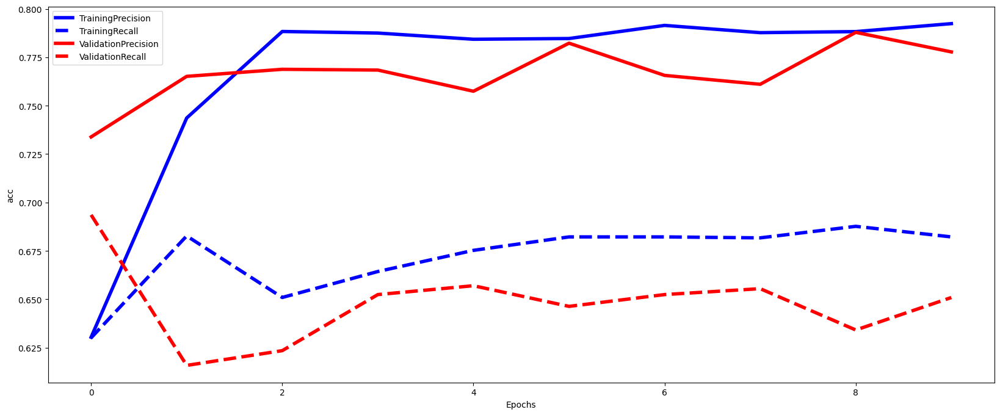

Epoch 1/10
248/248 - 2s - loss: 0.6835 - precision_14: 0.5603 - recall_14: 0.8734 - val_loss: 0.6688 - val_precision_14: 0.6982 - val_recall_14: 0.6930 - 2s/epoch - 8ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6476 - precision_14: 0.7754 - recall_14: 0.6268 - val_loss: 0.6250 - val_precision_14: 0.7621 - val_recall_14: 0.6587 - 1s/epoch - 4ms/step
Epoch 3/10
248/248 - 1s - loss: 0.5997 - precision_14: 0.7881 - recall_14: 0.6308 - val_loss: 0.5815 - val_precision_14: 0.7913 - val_recall_14: 0.6215 - 1s/epoch - 4ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5668 - precision_14: 0.7880 - recall_14: 0.6248 - val_loss: 0.5615 - val_precision_14: 0.8048 - val_recall_14: 0.6021 - 1s/epoch - 4ms/step
Epoch 5/10
248/248 - 1s - loss: 0.5543 - precision_14: 0.7932 - recall_14: 0.6273 - val_loss: 0.5541 - val_precision_14: 0.8036 - val_recall_14: 0.5976 - 869ms/epoch - 4ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5479 - precision_14: 0.7924 - recall_14: 0.6358 - val_loss: 0.5469 - val_precision_14: 0.7943

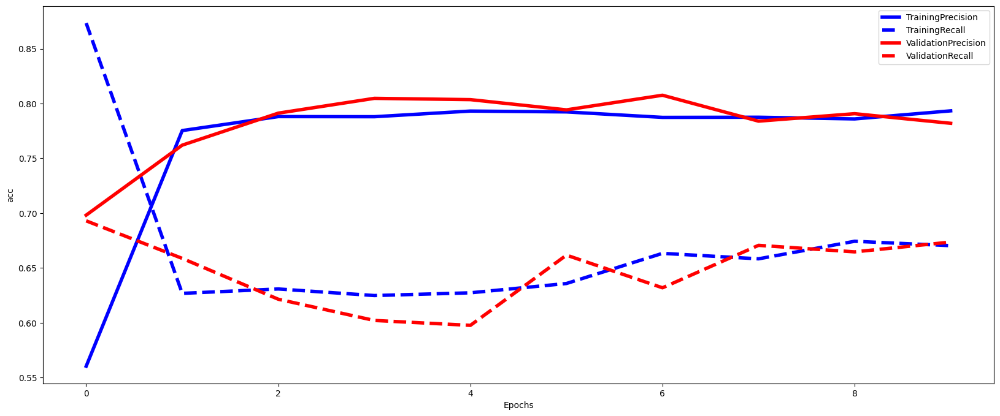

Epoch 1/10
248/248 - 2s - loss: 0.6885 - precision_15: 0.7007 - recall_15: 0.3774 - val_loss: 0.6605 - val_precision_15: 0.7254 - val_recall_15: 0.7232 - 2s/epoch - 6ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6339 - precision_15: 0.7555 - recall_15: 0.6682 - val_loss: 0.6084 - val_precision_15: 0.7053 - val_recall_15: 0.7693 - 616ms/epoch - 2ms/step
Epoch 3/10
248/248 - 1s - loss: 0.5897 - precision_15: 0.7687 - recall_15: 0.6587 - val_loss: 0.5707 - val_precision_15: 0.7481 - val_recall_15: 0.7158 - 597ms/epoch - 2ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5664 - precision_15: 0.7780 - recall_15: 0.6597 - val_loss: 0.5526 - val_precision_15: 0.7832 - val_recall_15: 0.6935 - 602ms/epoch - 2ms/step
Epoch 5/10
248/248 - 1s - loss: 0.5558 - precision_15: 0.7790 - recall_15: 0.6652 - val_loss: 0.5458 - val_precision_15: 0.8054 - val_recall_15: 0.6652 - 613ms/epoch - 2ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5507 - precision_15: 0.7841 - recall_15: 0.6652 - val_loss: 0.5403 - val_precision_1

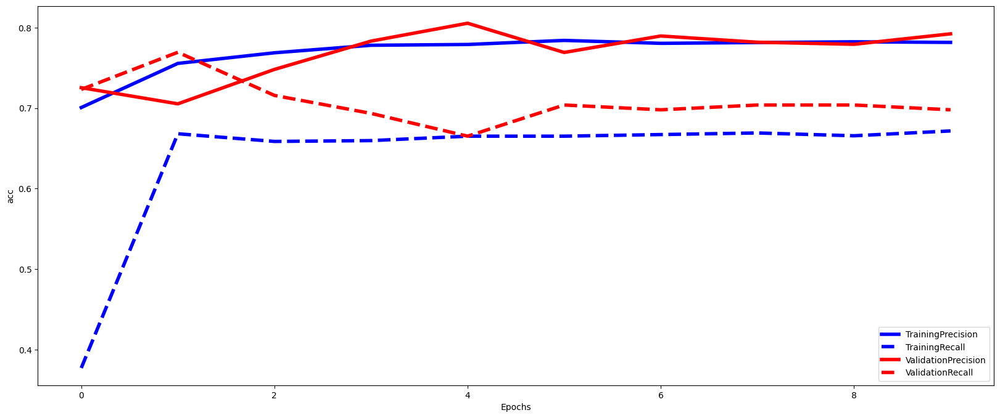

Epoch 1/10
248/248 - 2s - loss: 0.6713 - precision_16: 0.6774 - recall_16: 0.5368 - val_loss: 0.6464 - val_precision_16: 0.7575 - val_recall_16: 0.6796 - 2s/epoch - 10ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6226 - precision_16: 0.7635 - recall_16: 0.6298 - val_loss: 0.5916 - val_precision_16: 0.7584 - val_recall_16: 0.6692 - 1s/epoch - 4ms/step
Epoch 3/10
248/248 - 1s - loss: 0.5821 - precision_16: 0.7799 - recall_16: 0.6293 - val_loss: 0.5635 - val_precision_16: 0.7970 - val_recall_16: 0.6259 - 883ms/epoch - 4ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5650 - precision_16: 0.7861 - recall_16: 0.6268 - val_loss: 0.5523 - val_precision_16: 0.7958 - val_recall_16: 0.6274 - 1s/epoch - 4ms/step
Epoch 5/10
248/248 - 1s - loss: 0.5567 - precision_16: 0.7857 - recall_16: 0.6438 - val_loss: 0.5459 - val_precision_16: 0.8011 - val_recall_16: 0.6423 - 579ms/epoch - 2ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5514 - precision_16: 0.7958 - recall_16: 0.6513 - val_loss: 0.5410 - val_precision_16: 0.

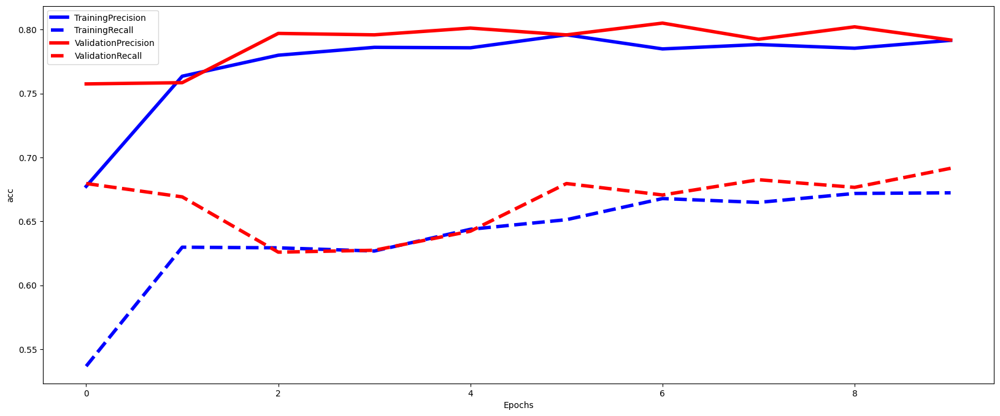

Average F1-Score over validation set is 0.74
STD of F1-Score over validation set is 0.01
42/42 [==============================] - 0s 2ms/step
Val: RMSprop, Validation Score: 0.743, Test Score: 0.747
Epoch 1/10
248/248 - 2s - loss: 0.7180 - precision_17: 0.0000e+00 - recall_17: 0.0000e+00 - val_loss: 0.7127 - val_precision_17: 0.0000e+00 - val_recall_17: 0.0000e+00 - 2s/epoch - 7ms/step
Epoch 2/10
248/248 - 1s - loss: 0.7169 - precision_17: 0.0000e+00 - recall_17: 0.0000e+00 - val_loss: 0.7117 - val_precision_17: 0.0000e+00 - val_recall_17: 0.0000e+00 - 656ms/epoch - 3ms/step
Epoch 3/10
248/248 - 1s - loss: 0.7158 - precision_17: 0.0000e+00 - recall_17: 0.0000e+00 - val_loss: 0.7107 - val_precision_17: 0.0000e+00 - val_recall_17: 0.0000e+00 - 698ms/epoch - 3ms/step
Epoch 4/10
248/248 - 1s - loss: 0.7148 - precision_17: 0.0000e+00 - recall_17: 0.0000e+00 - val_loss: 0.7098 - val_precision_17: 0.0000e+00 - val_recall_17: 0.0000e+00 - 666ms/epoch - 3ms/step
Epoch 5/10
248/248 - 1s - loss: 

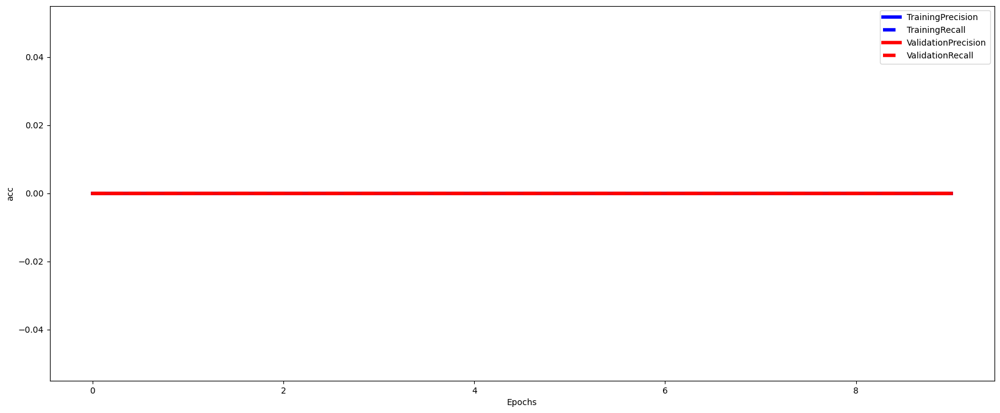

Epoch 1/10
248/248 - 2s - loss: 0.7082 - precision_18: 0.0000e+00 - recall_18: 0.0000e+00 - val_loss: 0.7083 - val_precision_18: 0.0000e+00 - val_recall_18: 0.0000e+00 - 2s/epoch - 10ms/step
Epoch 2/10
248/248 - 1s - loss: 0.7076 - precision_18: 0.0000e+00 - recall_18: 0.0000e+00 - val_loss: 0.7077 - val_precision_18: 0.0000e+00 - val_recall_18: 0.0000e+00 - 614ms/epoch - 2ms/step
Epoch 3/10
248/248 - 1s - loss: 0.7070 - precision_18: 0.0000e+00 - recall_18: 0.0000e+00 - val_loss: 0.7071 - val_precision_18: 0.0000e+00 - val_recall_18: 0.0000e+00 - 635ms/epoch - 3ms/step
Epoch 4/10
248/248 - 1s - loss: 0.7065 - precision_18: 0.0000e+00 - recall_18: 0.0000e+00 - val_loss: 0.7065 - val_precision_18: 0.0000e+00 - val_recall_18: 0.0000e+00 - 597ms/epoch - 2ms/step
Epoch 5/10
248/248 - 1s - loss: 0.7060 - precision_18: 0.0000e+00 - recall_18: 0.0000e+00 - val_loss: 0.7060 - val_precision_18: 0.0000e+00 - val_recall_18: 0.0000e+00 - 621ms/epoch - 3ms/step
Epoch 6/10
248/248 - 1s - loss: 0.705

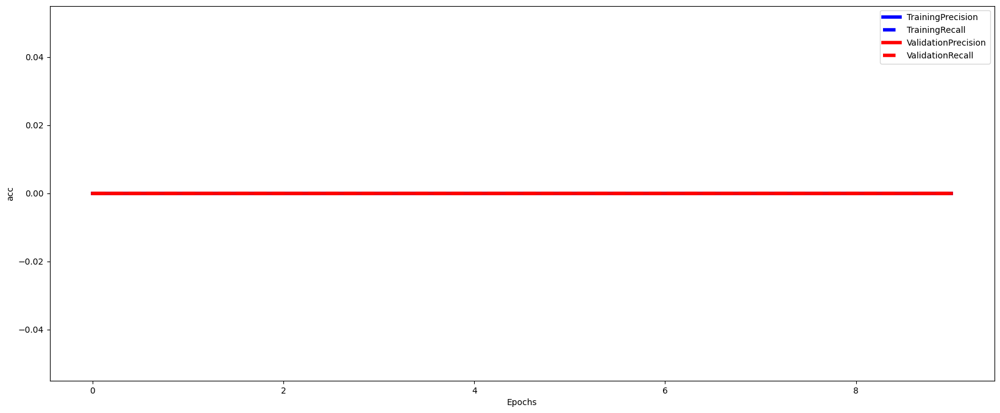

Epoch 1/10
248/248 - 2s - loss: 0.6945 - precision_19: 0.5042 - recall_19: 1.0000 - val_loss: 0.6938 - val_precision_19: 0.5087 - val_recall_19: 1.0000 - 2s/epoch - 7ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6944 - precision_19: 0.5042 - recall_19: 1.0000 - val_loss: 0.6937 - val_precision_19: 0.5087 - val_recall_19: 1.0000 - 640ms/epoch - 3ms/step
Epoch 3/10
248/248 - 1s - loss: 0.6943 - precision_19: 0.5042 - recall_19: 1.0000 - val_loss: 0.6936 - val_precision_19: 0.5087 - val_recall_19: 1.0000 - 622ms/epoch - 3ms/step
Epoch 4/10
248/248 - 1s - loss: 0.6941 - precision_19: 0.5042 - recall_19: 1.0000 - val_loss: 0.6935 - val_precision_19: 0.5087 - val_recall_19: 1.0000 - 868ms/epoch - 4ms/step
Epoch 5/10
248/248 - 1s - loss: 0.6940 - precision_19: 0.5042 - recall_19: 1.0000 - val_loss: 0.6934 - val_precision_19: 0.5087 - val_recall_19: 1.0000 - 1s/epoch - 4ms/step
Epoch 6/10
248/248 - 1s - loss: 0.6939 - precision_19: 0.5042 - recall_19: 1.0000 - val_loss: 0.6932 - val_precision_19: 

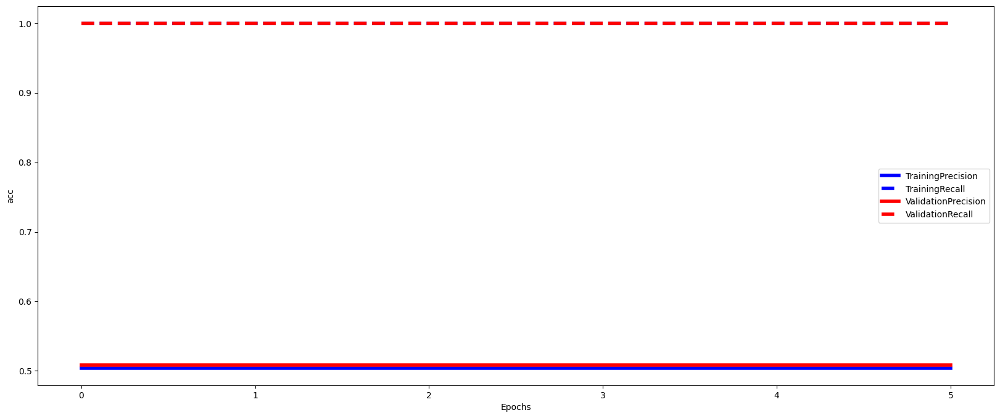

Epoch 1/10
248/248 - 3s - loss: 0.6949 - precision_20: 0.0000e+00 - recall_20: 0.0000e+00 - val_loss: 0.6958 - val_precision_20: 0.0000e+00 - val_recall_20: 0.0000e+00 - 3s/epoch - 10ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6946 - precision_20: 0.0000e+00 - recall_20: 0.0000e+00 - val_loss: 0.6955 - val_precision_20: 0.0000e+00 - val_recall_20: 0.0000e+00 - 910ms/epoch - 4ms/step
Epoch 3/10
248/248 - 1s - loss: 0.6944 - precision_20: 0.0000e+00 - recall_20: 0.0000e+00 - val_loss: 0.6953 - val_precision_20: 0.0000e+00 - val_recall_20: 0.0000e+00 - 603ms/epoch - 2ms/step
Epoch 4/10
248/248 - 1s - loss: 0.6942 - precision_20: 0.0000e+00 - recall_20: 0.0000e+00 - val_loss: 0.6950 - val_precision_20: 0.0000e+00 - val_recall_20: 0.0000e+00 - 608ms/epoch - 2ms/step
Epoch 5/10
248/248 - 1s - loss: 0.6939 - precision_20: 0.0000e+00 - recall_20: 0.0000e+00 - val_loss: 0.6948 - val_precision_20: 0.0000e+00 - val_recall_20: 0.0000e+00 - 609ms/epoch - 2ms/step
Epoch 6/10
248/248 - 1s - loss: 0.693

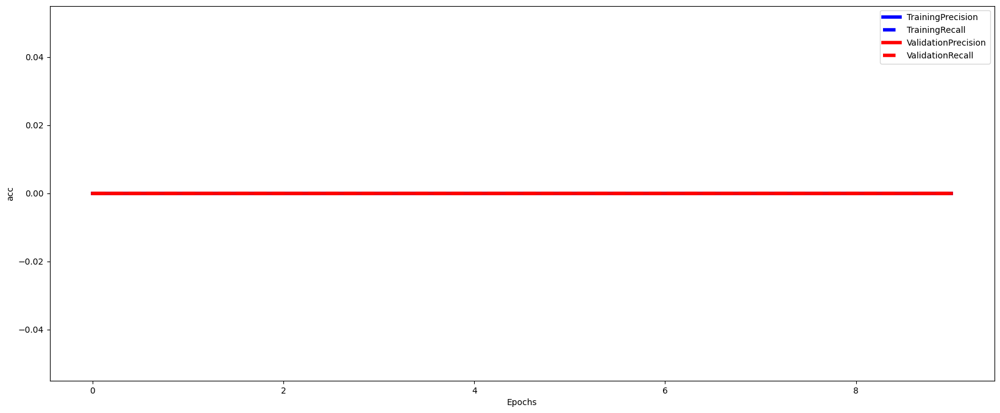

Average F1-Score over validation set is 0.33
STD of F1-Score over validation set is 0.01
42/42 [==============================] - 0s 2ms/step


Val: Adadelta, Validation Score: 0.332, Test Score: 0.330
Epoch 1/10
248/248 - 2s - loss: 0.6758 - precision_21: 0.6228 - recall_21: 0.7731 - val_loss: 0.6539 - val_precision_21: 0.7566 - val_recall_21: 0.6585 - 2s/epoch - 9ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6187 - precision_21: 0.7867 - recall_21: 0.6648 - val_loss: 0.5922 - val_precision_21: 0.7609 - val_recall_21: 0.6646 - 1s/epoch - 4ms/step
Epoch 3/10
248/248 - 1s - loss: 0.5651 - precision_21: 0.7904 - recall_21: 0.6514 - val_loss: 0.5624 - val_precision_21: 0.7759 - val_recall_21: 0.6387 - 915ms/epoch - 4ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5453 - precision_21: 0.7864 - recall_21: 0.6837 - val_loss: 0.5566 - val_precision_21: 0.7674 - val_recall_21: 0.6540 - 908ms/epoch - 4ms/step
Epoch 5/10
248/248 - 1s - loss: 0.5374 - precision_21: 0.7858 - recall_21: 0.6887 - val_loss: 0.5509 - val_precision_21: 0.7665 - val_recall_21: 0.6555 - 1s/epoch - 4ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5319 - precision_21: 0.7879 - re

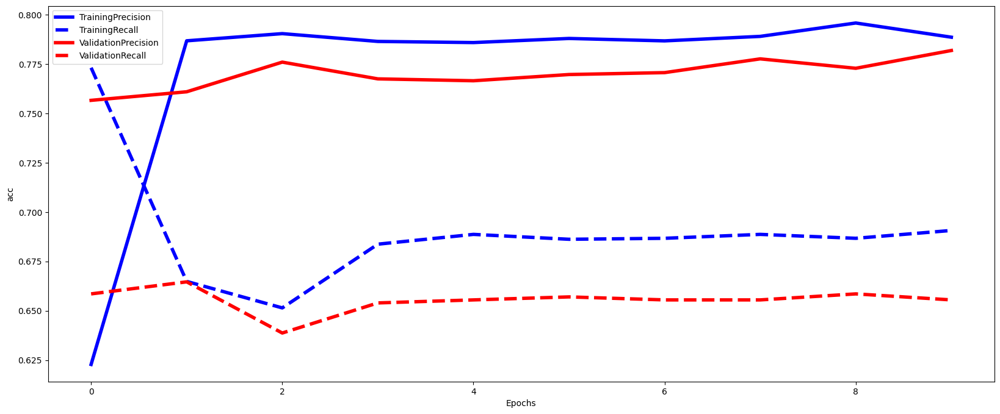

Epoch 1/10
248/248 - 2s - loss: 0.6758 - precision_22: 0.5812 - recall_22: 0.6818 - val_loss: 0.6519 - val_precision_22: 0.8056 - val_recall_22: 0.5991 - 2s/epoch - 7ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6239 - precision_22: 0.7904 - recall_22: 0.6263 - val_loss: 0.5959 - val_precision_22: 0.7924 - val_recall_22: 0.6200 - 617ms/epoch - 2ms/step
Epoch 3/10
248/248 - 1s - loss: 0.5739 - precision_22: 0.7782 - recall_22: 0.6478 - val_loss: 0.5642 - val_precision_22: 0.8043 - val_recall_22: 0.6185 - 637ms/epoch - 3ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5564 - precision_22: 0.7899 - recall_22: 0.6563 - val_loss: 0.5572 - val_precision_22: 0.8101 - val_recall_22: 0.5976 - 622ms/epoch - 3ms/step
Epoch 5/10
248/248 - 1s - loss: 0.5483 - precision_22: 0.7827 - recall_22: 0.6683 - val_loss: 0.5479 - val_precision_22: 0.8106 - val_recall_22: 0.6379 - 640ms/epoch - 3ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5413 - precision_22: 0.7891 - recall_22: 0.6758 - val_loss: 0.5391 - val_precision_2

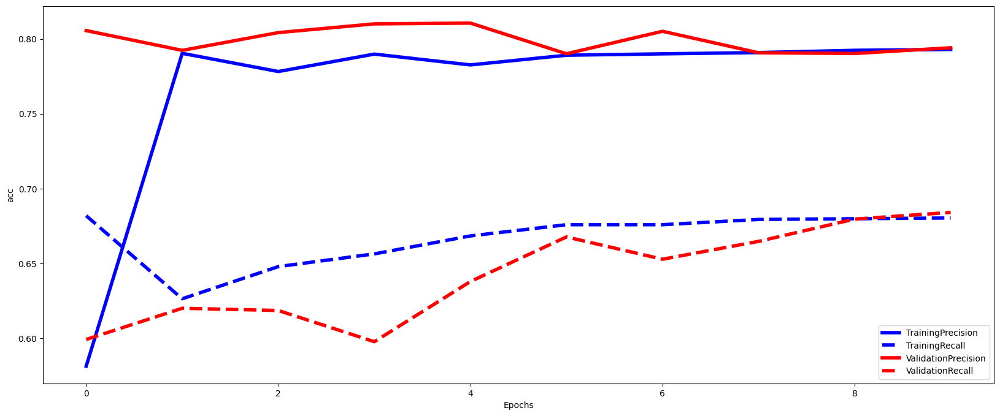

Epoch 1/10
248/248 - 3s - loss: 0.6856 - precision_23: 0.5379 - recall_23: 0.5511 - val_loss: 0.6712 - val_precision_23: 0.5142 - val_recall_23: 0.9985 - 3s/epoch - 11ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6471 - precision_23: 0.6960 - recall_23: 0.6897 - val_loss: 0.6134 - val_precision_23: 0.7780 - val_recall_23: 0.6518 - 644ms/epoch - 3ms/step
Epoch 3/10
248/248 - 1s - loss: 0.5882 - precision_23: 0.7864 - recall_23: 0.6431 - val_loss: 0.5593 - val_precision_23: 0.7874 - val_recall_23: 0.6503 - 677ms/epoch - 3ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5587 - precision_23: 0.7852 - recall_23: 0.6512 - val_loss: 0.5424 - val_precision_23: 0.7952 - val_recall_23: 0.6875 - 665ms/epoch - 3ms/step
Epoch 5/10
248/248 - 1s - loss: 0.5483 - precision_23: 0.7887 - recall_23: 0.6612 - val_loss: 0.5358 - val_precision_23: 0.8000 - val_recall_23: 0.6905 - 610ms/epoch - 2ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5432 - precision_23: 0.7847 - recall_23: 0.6657 - val_loss: 0.5330 - val_precision_

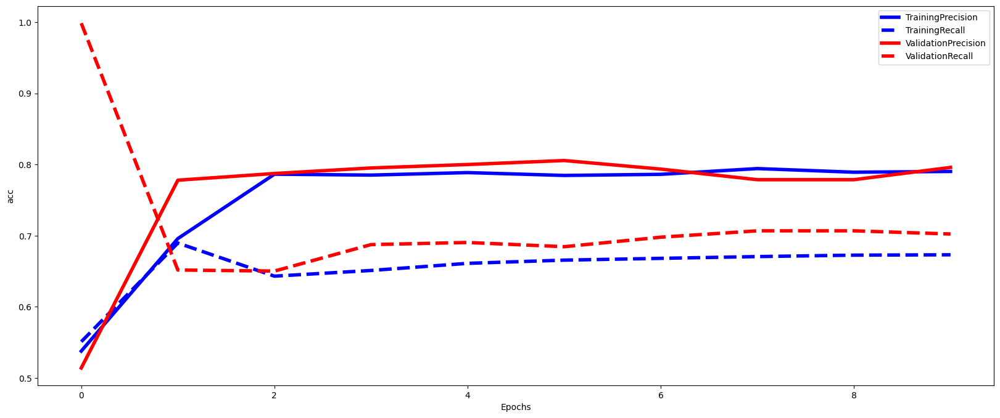

Epoch 1/10
248/248 - 2s - loss: 0.6684 - precision_24: 0.6316 - recall_24: 0.7839 - val_loss: 0.6396 - val_precision_24: 0.8135 - val_recall_24: 0.5917 - 2s/epoch - 9ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6115 - precision_24: 0.7787 - recall_24: 0.6388 - val_loss: 0.5765 - val_precision_24: 0.7765 - val_recall_24: 0.7094 - 1s/epoch - 4ms/step
Epoch 3/10
248/248 - 1s - loss: 0.5641 - precision_24: 0.7962 - recall_24: 0.6333 - val_loss: 0.5484 - val_precision_24: 0.7996 - val_recall_24: 0.6483 - 1s/epoch - 4ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5512 - precision_24: 0.7882 - recall_24: 0.6663 - val_loss: 0.5400 - val_precision_24: 0.7897 - val_recall_24: 0.6826 - 1s/epoch - 4ms/step
Epoch 5/10
248/248 - 1s - loss: 0.5442 - precision_24: 0.7912 - recall_24: 0.6708 - val_loss: 0.5340 - val_precision_24: 0.7993 - val_recall_24: 0.6826 - 932ms/epoch - 4ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5386 - precision_24: 0.7823 - recall_24: 0.6778 - val_loss: 0.5290 - val_precision_24: 0.7993

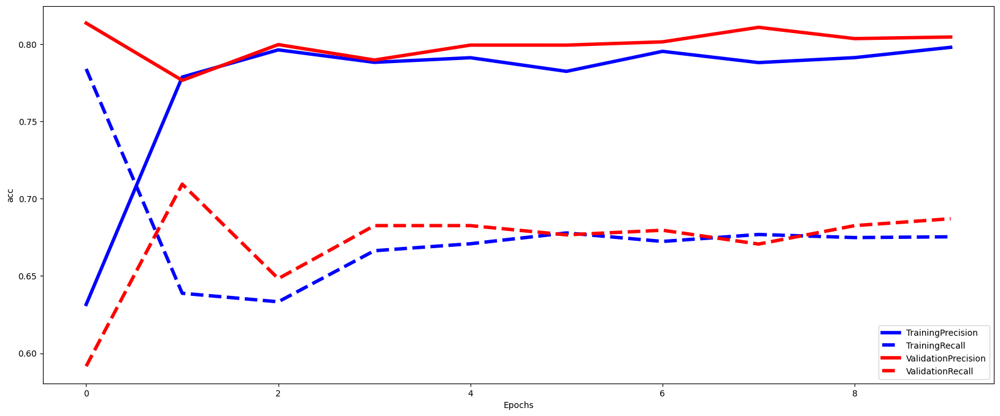

Average F1-Score over validation set is 0.75
STD of F1-Score over validation set is 0.01
42/42 [==============================] - 0s 3ms/step
Val: Adagrad, Validation Score: 0.749, Test Score: 0.750


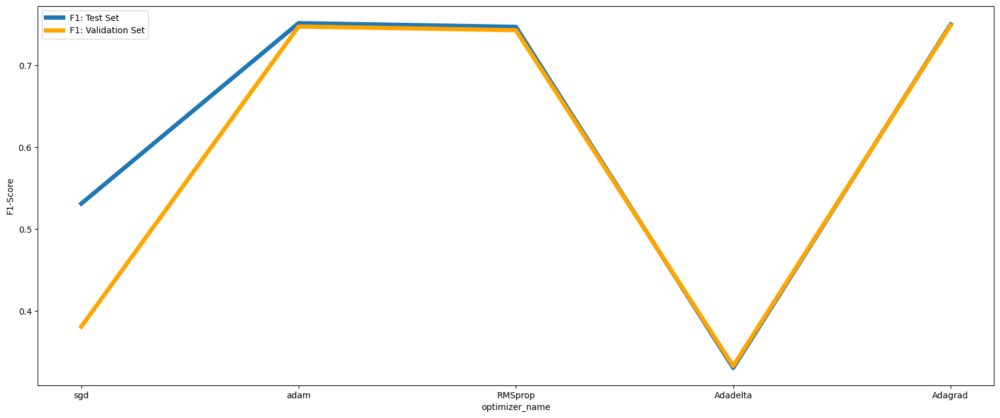

In [59]:
model,best_optimizer = evaluate_efect_param(parameter_type='model_params',parameter_name='optimizer_name', values_list=['sgd', 'adam', 'RMSprop', 'Adadelta', 'Adagrad'])
kfold_params['model_params']['optimizer_name'] = best_optimizer

## so 'adam' and 'RMSprop' and 'adagrad' do the job nicely!

## choosing the best learning rate:

Epoch 1/10
248/248 - 3s - loss: 0.6810 - precision_25: 0.5604 - recall_25: 0.7582 - val_loss: 0.6626 - val_precision_25: 0.6931 - val_recall_25: 0.7195 - 3s/epoch - 12ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6364 - precision_25: 0.7505 - recall_25: 0.6872 - val_loss: 0.6102 - val_precision_25: 0.7677 - val_recall_25: 0.6296 - 619ms/epoch - 2ms/step
Epoch 3/10
248/248 - 1s - loss: 0.5812 - precision_25: 0.7831 - recall_25: 0.6524 - val_loss: 0.5722 - val_precision_25: 0.7676 - val_recall_25: 0.6494 - 609ms/epoch - 2ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5535 - precision_25: 0.7888 - recall_25: 0.6604 - val_loss: 0.5648 - val_precision_25: 0.7504 - val_recall_25: 0.6692 - 601ms/epoch - 2ms/step
Epoch 5/10
248/248 - 1s - loss: 0.5429 - precision_25: 0.7875 - recall_25: 0.6862 - val_loss: 0.5548 - val_precision_25: 0.7802 - val_recall_25: 0.6494 - 605ms/epoch - 2ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5356 - precision_25: 0.7860 - recall_25: 0.6877 - val_loss: 0.5496 - val_precision_

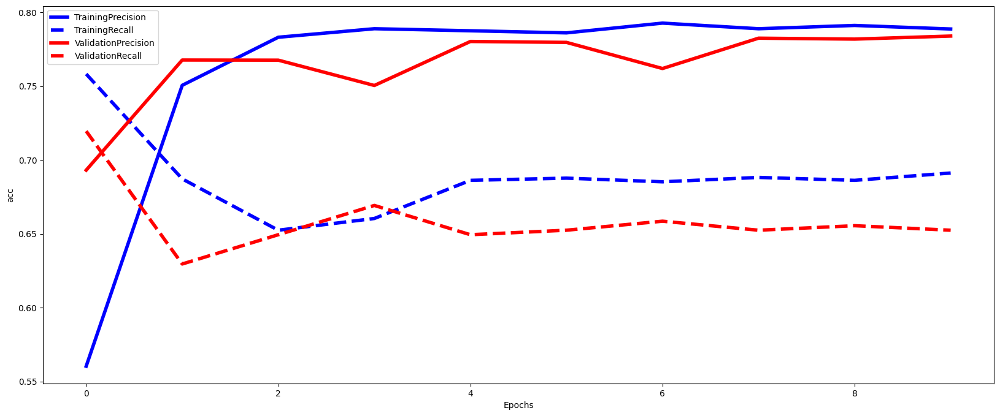

Epoch 1/10
248/248 - 3s - loss: 0.6829 - precision_26: 0.6037 - recall_26: 0.4412 - val_loss: 0.6606 - val_precision_26: 0.6340 - val_recall_26: 0.7720 - 3s/epoch - 11ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6333 - precision_26: 0.7164 - recall_26: 0.7064 - val_loss: 0.6010 - val_precision_26: 0.8011 - val_recall_26: 0.6483 - 885ms/epoch - 4ms/step
Epoch 3/10
248/248 - 1s - loss: 0.5736 - precision_26: 0.7783 - recall_26: 0.6533 - val_loss: 0.5605 - val_precision_26: 0.8081 - val_recall_26: 0.5961 - 602ms/epoch - 2ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5508 - precision_26: 0.7879 - recall_26: 0.6428 - val_loss: 0.5494 - val_precision_26: 0.8085 - val_recall_26: 0.5976 - 633ms/epoch - 3ms/step
Epoch 5/10
248/248 - 1s - loss: 0.5429 - precision_26: 0.7969 - recall_26: 0.6498 - val_loss: 0.5400 - val_precision_26: 0.7954 - val_recall_26: 0.6662 - 630ms/epoch - 3ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5371 - precision_26: 0.7862 - recall_26: 0.6713 - val_loss: 0.5363 - val_precision_

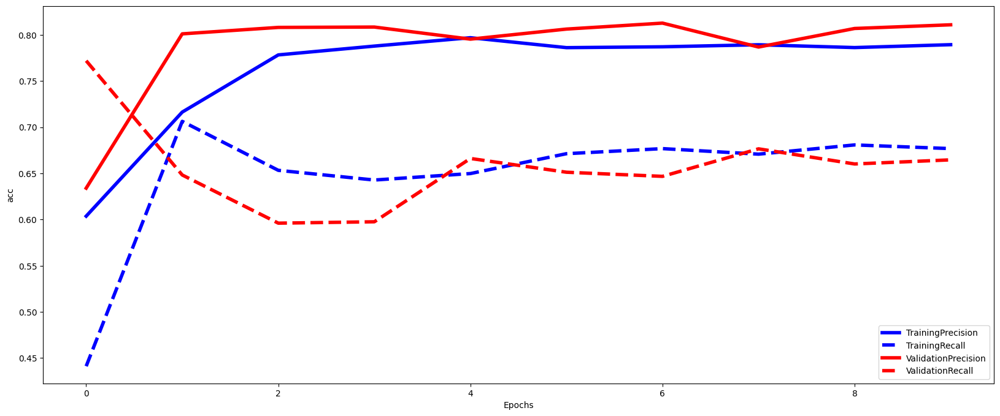

Epoch 1/10
248/248 - 2s - loss: 0.7158 - precision_27: 0.5099 - recall_27: 0.4259 - val_loss: 0.6862 - val_precision_27: 0.0000e+00 - val_recall_27: 0.0000e+00 - 2s/epoch - 7ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6677 - precision_27: 0.6140 - recall_27: 0.6471 - val_loss: 0.6516 - val_precision_27: 0.6316 - val_recall_27: 0.8214 - 619ms/epoch - 2ms/step
Epoch 3/10
248/248 - 1s - loss: 0.6276 - precision_27: 0.7465 - recall_27: 0.6426 - val_loss: 0.5962 - val_precision_27: 0.7729 - val_recall_27: 0.7039 - 646ms/epoch - 3ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5763 - precision_27: 0.7826 - recall_27: 0.6431 - val_loss: 0.5508 - val_precision_27: 0.7870 - val_recall_27: 0.6488 - 636ms/epoch - 3ms/step
Epoch 5/10
248/248 - 1s - loss: 0.5493 - precision_27: 0.7905 - recall_27: 0.6326 - val_loss: 0.5357 - val_precision_27: 0.7949 - val_recall_27: 0.6518 - 889ms/epoch - 4ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5402 - precision_27: 0.7875 - recall_27: 0.6491 - val_loss: 0.5307 - val_pre

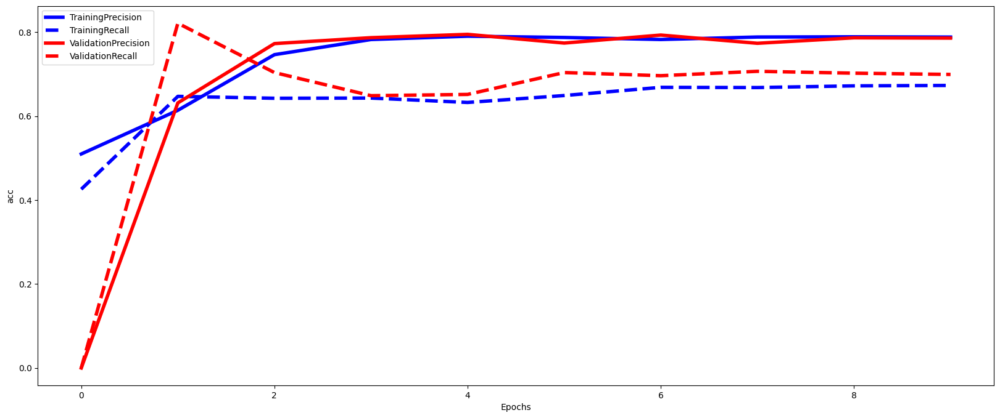

Epoch 1/10
248/248 - 2s - loss: 0.6730 - precision_28: 0.6039 - recall_28: 0.6338 - val_loss: 0.6439 - val_precision_28: 0.8128 - val_recall_28: 0.5887 - 2s/epoch - 7ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6150 - precision_28: 0.8117 - recall_28: 0.6058 - val_loss: 0.5803 - val_precision_28: 0.8160 - val_recall_28: 0.6080 - 622ms/epoch - 3ms/step
Epoch 3/10
248/248 - 1s - loss: 0.5670 - precision_28: 0.7994 - recall_28: 0.6238 - val_loss: 0.5492 - val_precision_28: 0.8008 - val_recall_28: 0.6349 - 626ms/epoch - 3ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5516 - precision_28: 0.7998 - recall_28: 0.6433 - val_loss: 0.5399 - val_precision_28: 0.8025 - val_recall_28: 0.6781 - 588ms/epoch - 2ms/step
Epoch 5/10
248/248 - 1s - loss: 0.5439 - precision_28: 0.7904 - recall_28: 0.6658 - val_loss: 0.5334 - val_precision_28: 0.8007 - val_recall_28: 0.6826 - 649ms/epoch - 3ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5380 - precision_28: 0.7935 - recall_28: 0.6688 - val_loss: 0.5287 - val_precision_2

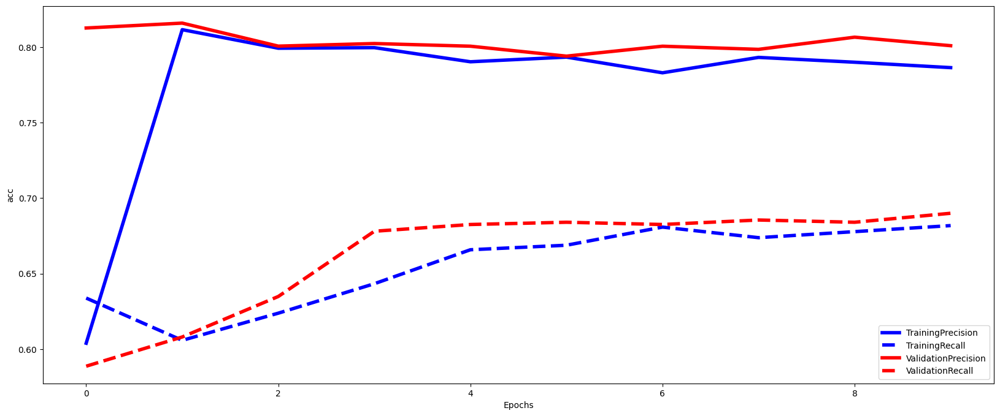

Average F1-Score over validation set is 0.75
STD of F1-Score over validation set is 0.01
42/42 [==============================] - 0s 2ms/step


Val: 0.01, Validation Score: 0.747, Test Score: 0.749
Epoch 1/10
248/248 - 2s - loss: 0.6928 - precision_29: 0.5148 - recall_29: 0.6743 - val_loss: 0.6771 - val_precision_29: 0.5502 - val_recall_29: 0.8857 - 2s/epoch - 8ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6592 - precision_29: 0.7278 - recall_29: 0.6599 - val_loss: 0.6400 - val_precision_29: 0.7647 - val_recall_29: 0.6540 - 627ms/epoch - 3ms/step
Epoch 3/10
248/248 - 1s - loss: 0.6119 - precision_29: 0.7745 - recall_29: 0.6718 - val_loss: 0.5899 - val_precision_29: 0.7831 - val_recall_29: 0.6220 - 605ms/epoch - 2ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5681 - precision_29: 0.7868 - recall_29: 0.6817 - val_loss: 0.5682 - val_precision_29: 0.7657 - val_recall_29: 0.6524 - 632ms/epoch - 3ms/step
Epoch 5/10
248/248 - 1s - loss: 0.5505 - precision_29: 0.7818 - recall_29: 0.6887 - val_loss: 0.5635 - val_precision_29: 0.7859 - val_recall_29: 0.6265 - 624ms/epoch - 3ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5420 - precision_29: 0.7919 - 

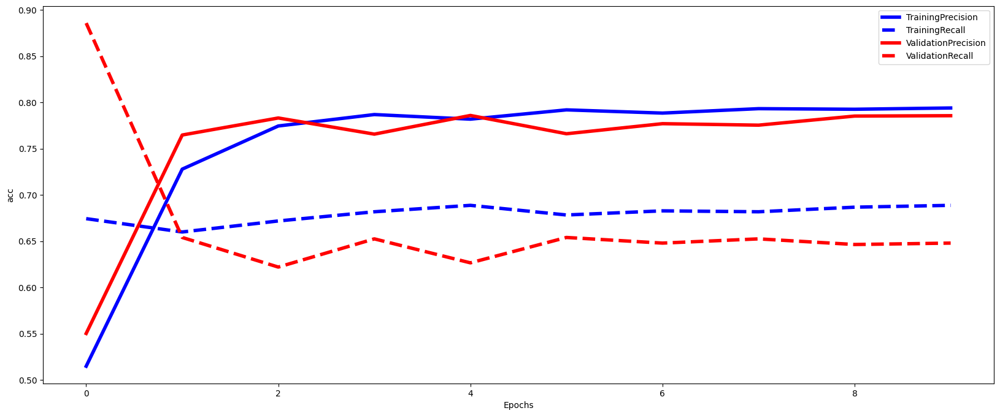

Epoch 1/10
248/248 - 4s - loss: 0.6950 - precision_30: 0.5387 - recall_30: 0.7169 - val_loss: 0.6757 - val_precision_30: 0.9416 - val_recall_30: 0.4083 - 4s/epoch - 17ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6545 - precision_30: 0.7573 - recall_30: 0.6258 - val_loss: 0.6307 - val_precision_30: 0.7439 - val_recall_30: 0.7273 - 1s/epoch - 5ms/step
Epoch 3/10
248/248 - 1s - loss: 0.6027 - precision_30: 0.7838 - recall_30: 0.6418 - val_loss: 0.5815 - val_precision_30: 0.7809 - val_recall_30: 0.6692 - 731ms/epoch - 3ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5670 - precision_30: 0.7859 - recall_30: 0.6538 - val_loss: 0.5585 - val_precision_30: 0.8029 - val_recall_30: 0.6557 - 712ms/epoch - 3ms/step
Epoch 5/10
248/248 - 1s - loss: 0.5528 - precision_30: 0.7883 - recall_30: 0.6723 - val_loss: 0.5500 - val_precision_30: 0.7989 - val_recall_30: 0.6572 - 751ms/epoch - 3ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5459 - precision_30: 0.7925 - recall_30: 0.6743 - val_loss: 0.5432 - val_precision_30:

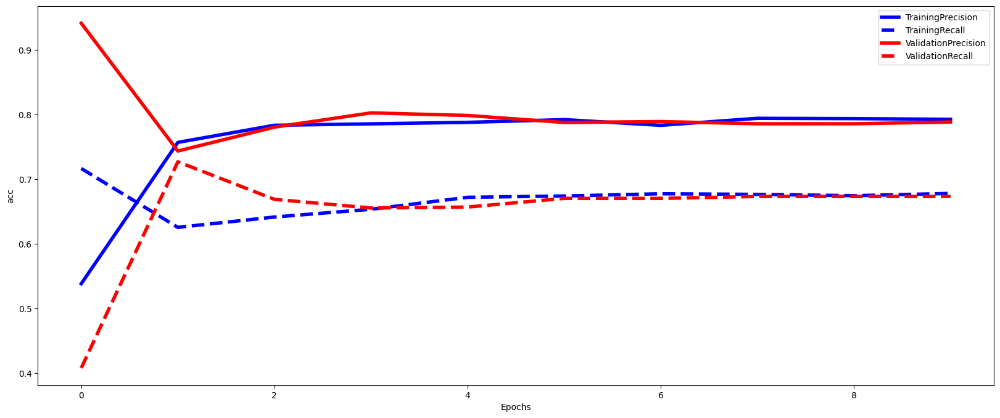

Epoch 1/10
248/248 - 3s - loss: 0.6961 - precision_31: 0.5285 - recall_31: 0.3714 - val_loss: 0.6710 - val_precision_31: 0.9391 - val_recall_31: 0.3899 - 3s/epoch - 11ms/step
Epoch 2/10
248/248 - 2s - loss: 0.6488 - precision_31: 0.6784 - recall_31: 0.7347 - val_loss: 0.6205 - val_precision_31: 0.7550 - val_recall_31: 0.7247 - 2s/epoch - 7ms/step
Epoch 3/10
248/248 - 2s - loss: 0.5934 - precision_31: 0.7455 - recall_31: 0.6862 - val_loss: 0.5631 - val_precision_31: 0.7818 - val_recall_31: 0.6503 - 2s/epoch - 7ms/step
Epoch 4/10
248/248 - 2s - loss: 0.5544 - precision_31: 0.7927 - recall_31: 0.6371 - val_loss: 0.5366 - val_precision_31: 0.7949 - val_recall_31: 0.6458 - 2s/epoch - 8ms/step
Epoch 5/10
248/248 - 2s - loss: 0.5394 - precision_31: 0.7945 - recall_31: 0.6481 - val_loss: 0.5282 - val_precision_31: 0.7939 - val_recall_31: 0.6935 - 2s/epoch - 7ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5332 - precision_31: 0.7850 - recall_31: 0.6687 - val_loss: 0.5257 - val_precision_31: 0.7949 -

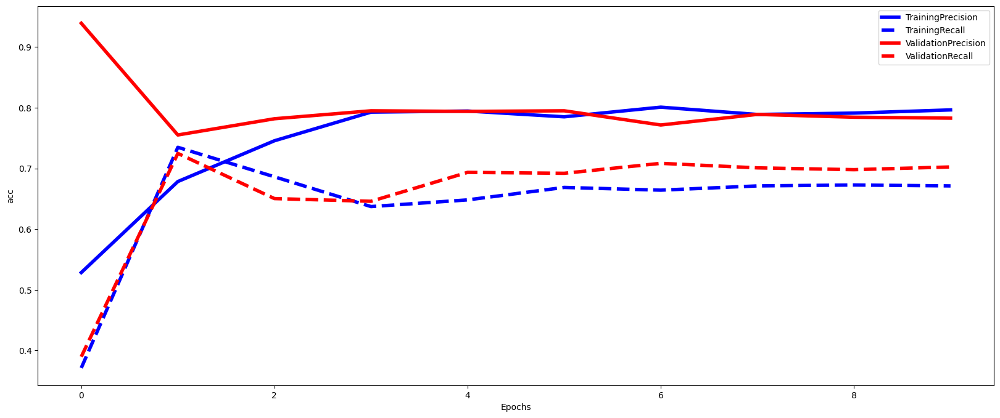

Epoch 1/10
248/248 - 3s - loss: 0.6803 - precision_32: 0.6171 - recall_32: 0.7709 - val_loss: 0.6602 - val_precision_32: 0.8011 - val_recall_32: 0.6244 - 3s/epoch - 10ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6333 - precision_32: 0.7358 - recall_32: 0.6853 - val_loss: 0.5995 - val_precision_32: 0.8123 - val_recall_32: 0.6125 - 691ms/epoch - 3ms/step
Epoch 3/10
248/248 - 1s - loss: 0.5765 - precision_32: 0.8009 - recall_32: 0.6178 - val_loss: 0.5543 - val_precision_32: 0.7934 - val_recall_32: 0.6408 - 728ms/epoch - 3ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5528 - precision_32: 0.7895 - recall_32: 0.6453 - val_loss: 0.5424 - val_precision_32: 0.8050 - val_recall_32: 0.6274 - 775ms/epoch - 3ms/step
Epoch 5/10
248/248 - 2s - loss: 0.5455 - precision_32: 0.7989 - recall_32: 0.6498 - val_loss: 0.5352 - val_precision_32: 0.7945 - val_recall_32: 0.6855 - 2s/epoch - 6ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5396 - precision_32: 0.7879 - recall_32: 0.6688 - val_loss: 0.5299 - val_precision_32:

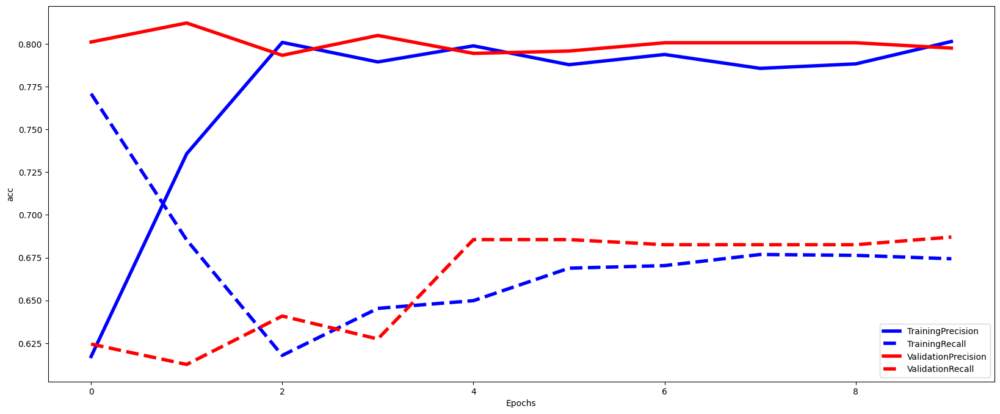

Average F1-Score over validation set is 0.74
STD of F1-Score over validation set is 0.01
42/42 [==============================] - 0s 3ms/step


Val: 0.05, Validation Score: 0.744, Test Score: 0.750
Epoch 1/10
248/248 - 5s - loss: 0.6568 - precision_33: 0.6643 - recall_33: 0.6072 - val_loss: 0.6271 - val_precision_33: 0.6329 - val_recall_33: 0.7515 - 5s/epoch - 19ms/step
Epoch 2/10
248/248 - 2s - loss: 0.5913 - precision_33: 0.7729 - recall_33: 0.6455 - val_loss: 0.5737 - val_precision_33: 0.7832 - val_recall_33: 0.6113 - 2s/epoch - 10ms/step
Epoch 3/10
248/248 - 2s - loss: 0.5543 - precision_33: 0.7913 - recall_33: 0.6475 - val_loss: 0.5607 - val_precision_33: 0.7548 - val_recall_33: 0.6570 - 2s/epoch - 7ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5420 - precision_33: 0.7911 - recall_33: 0.6713 - val_loss: 0.5542 - val_precision_33: 0.7838 - val_recall_33: 0.6357 - 623ms/epoch - 3ms/step
Epoch 5/10
248/248 - 1s - loss: 0.5351 - precision_33: 0.7868 - recall_33: 0.6872 - val_loss: 0.5495 - val_precision_33: 0.7646 - val_recall_33: 0.6585 - 606ms/epoch - 2ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5310 - precision_33: 0.7885 - reca

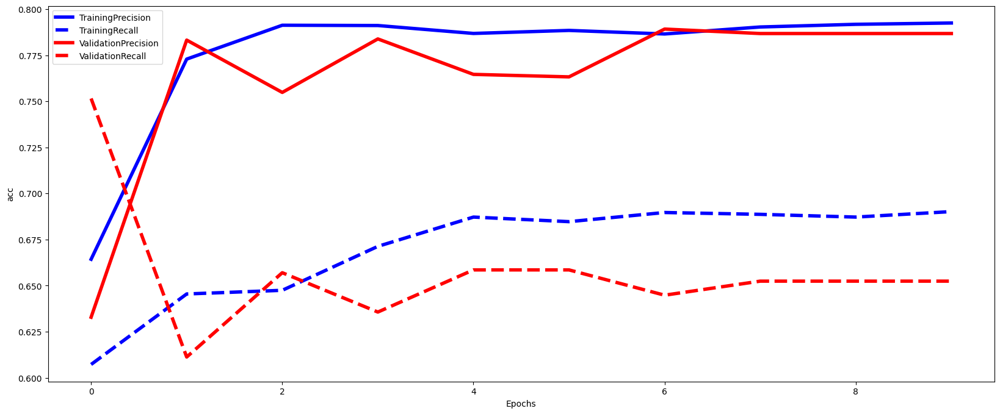

Epoch 1/10
248/248 - 2s - loss: 0.6849 - precision_34: 0.6343 - recall_34: 0.5563 - val_loss: 0.6645 - val_precision_34: 0.7644 - val_recall_34: 0.7109 - 2s/epoch - 7ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6394 - precision_34: 0.6855 - recall_34: 0.7424 - val_loss: 0.6086 - val_precision_34: 0.8000 - val_recall_34: 0.6200 - 594ms/epoch - 2ms/step
Epoch 3/10
248/248 - 1s - loss: 0.5791 - precision_34: 0.7655 - recall_34: 0.6663 - val_loss: 0.5586 - val_precision_34: 0.8070 - val_recall_34: 0.6170 - 598ms/epoch - 2ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5472 - precision_34: 0.7958 - recall_34: 0.6393 - val_loss: 0.5430 - val_precision_34: 0.8079 - val_recall_34: 0.6393 - 627ms/epoch - 3ms/step
Epoch 5/10
248/248 - 1s - loss: 0.5377 - precision_34: 0.7960 - recall_34: 0.6598 - val_loss: 0.5395 - val_precision_34: 0.8134 - val_recall_34: 0.6170 - 608ms/epoch - 2ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5332 - precision_34: 0.7866 - recall_34: 0.6673 - val_loss: 0.5314 - val_precision_3

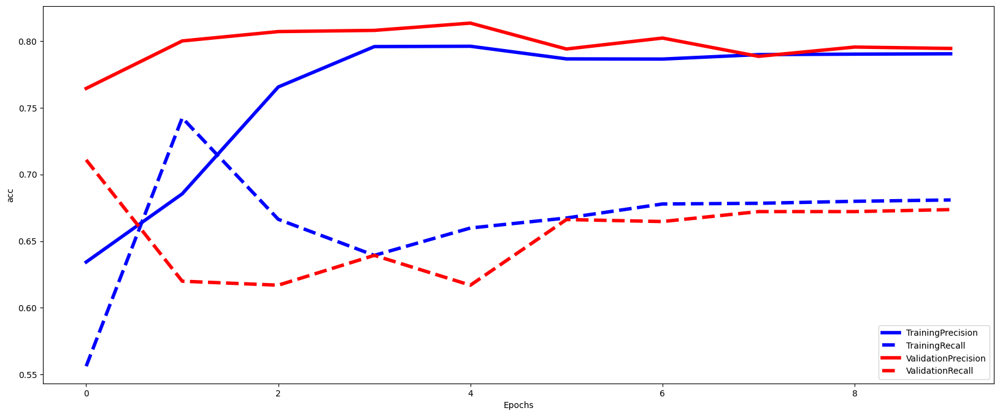

Epoch 1/10
248/248 - 2s - loss: 0.7225 - precision_35: 0.4964 - recall_35: 0.6131 - val_loss: 0.6891 - val_precision_35: 0.5087 - val_recall_35: 1.0000 - 2s/epoch - 10ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6763 - precision_35: 0.6527 - recall_35: 0.7037 - val_loss: 0.6630 - val_precision_35: 0.8030 - val_recall_35: 0.6369 - 718ms/epoch - 3ms/step
Epoch 3/10
248/248 - 1s - loss: 0.6413 - precision_35: 0.7854 - recall_35: 0.6411 - val_loss: 0.6149 - val_precision_35: 0.8030 - val_recall_35: 0.6369 - 597ms/epoch - 2ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5930 - precision_35: 0.7915 - recall_35: 0.6401 - val_loss: 0.5705 - val_precision_35: 0.7716 - val_recall_35: 0.7039 - 623ms/epoch - 3ms/step
Epoch 5/10
248/248 - 1s - loss: 0.5635 - precision_35: 0.7786 - recall_35: 0.6722 - val_loss: 0.5492 - val_precision_35: 0.7805 - val_recall_35: 0.7039 - 650ms/epoch - 3ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5504 - precision_35: 0.7888 - recall_35: 0.6657 - val_loss: 0.5435 - val_precision_

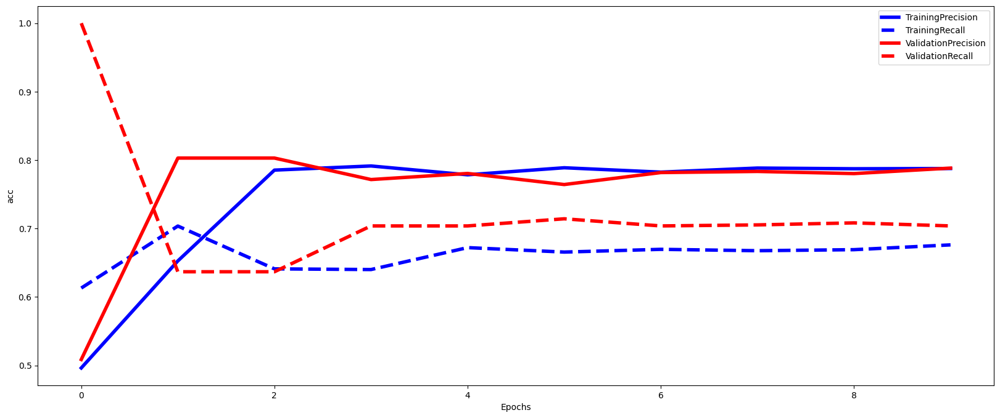

Epoch 1/10
248/248 - 6s - loss: 0.6679 - precision_36: 0.6116 - recall_36: 0.7689 - val_loss: 0.6382 - val_precision_36: 0.7846 - val_recall_36: 0.6513 - 6s/epoch - 23ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6086 - precision_36: 0.7501 - recall_36: 0.6638 - val_loss: 0.5702 - val_precision_36: 0.7849 - val_recall_36: 0.6364 - 1s/epoch - 5ms/step
Epoch 3/10
248/248 - 1s - loss: 0.5626 - precision_36: 0.7822 - recall_36: 0.6358 - val_loss: 0.5465 - val_precision_36: 0.7861 - val_recall_36: 0.6572 - 726ms/epoch - 3ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5498 - precision_36: 0.7916 - recall_36: 0.6478 - val_loss: 0.5391 - val_precision_36: 0.7867 - val_recall_36: 0.6870 - 866ms/epoch - 3ms/step
Epoch 5/10
248/248 - 1s - loss: 0.5437 - precision_36: 0.7822 - recall_36: 0.6628 - val_loss: 0.5335 - val_precision_36: 0.8039 - val_recall_36: 0.6781 - 644ms/epoch - 3ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5382 - precision_36: 0.7863 - recall_36: 0.6738 - val_loss: 0.5283 - val_precision_36:

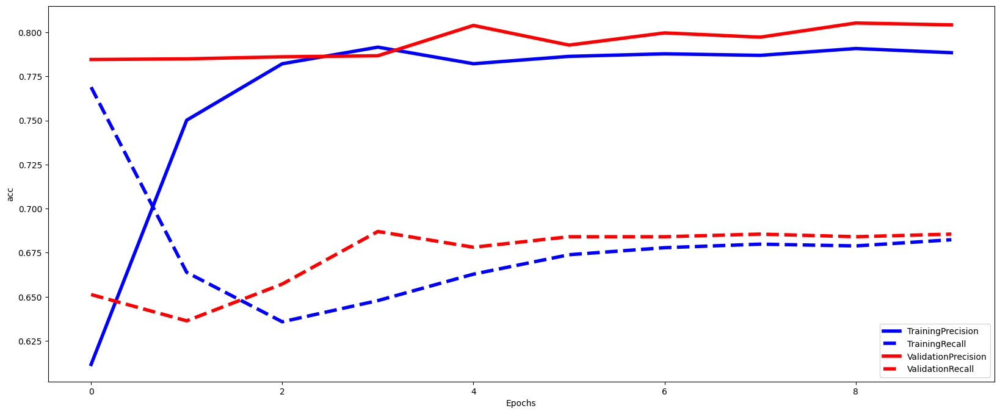

Average F1-Score over validation set is 0.75
STD of F1-Score over validation set is 0.01
42/42 [==============================] - 0s 2ms/step


Val: 0.08, Validation Score: 0.747, Test Score: 0.750
Epoch 1/10
248/248 - 2s - loss: 0.6806 - precision_37: 0.5638 - recall_37: 0.6936 - val_loss: 0.6568 - val_precision_37: 0.8034 - val_recall_37: 0.5793 - 2s/epoch - 7ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6293 - precision_37: 0.7991 - recall_37: 0.6261 - val_loss: 0.6042 - val_precision_37: 0.7832 - val_recall_37: 0.6113 - 642ms/epoch - 3ms/step
Epoch 3/10
248/248 - 1s - loss: 0.5795 - precision_37: 0.7916 - recall_37: 0.6490 - val_loss: 0.5727 - val_precision_37: 0.7823 - val_recall_37: 0.6189 - 1s/epoch - 4ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5547 - precision_37: 0.7921 - recall_37: 0.6733 - val_loss: 0.5635 - val_precision_37: 0.7575 - val_recall_37: 0.6570 - 929ms/epoch - 4ms/step
Epoch 5/10
248/248 - 1s - loss: 0.5459 - precision_37: 0.7924 - recall_37: 0.6842 - val_loss: 0.5572 - val_precision_37: 0.7724 - val_recall_37: 0.6570 - 1s/epoch - 4ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5385 - precision_37: 0.7873 - recall

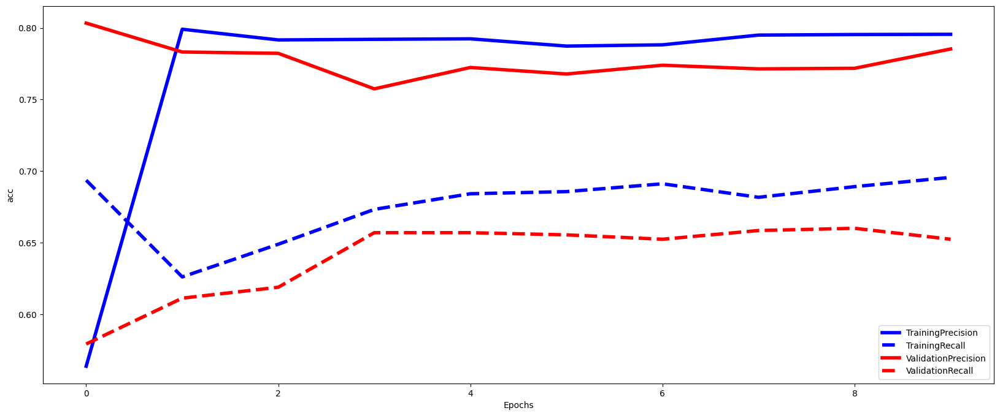

Epoch 1/10
248/248 - 2s - loss: 0.6842 - precision_38: 0.5449 - recall_38: 0.6583 - val_loss: 0.6611 - val_precision_38: 0.6693 - val_recall_38: 0.7571 - 2s/epoch - 7ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6393 - precision_38: 0.7641 - recall_38: 0.6513 - val_loss: 0.6151 - val_precision_38: 0.7951 - val_recall_38: 0.6304 - 650ms/epoch - 3ms/step
Epoch 3/10
248/248 - 1s - loss: 0.5924 - precision_38: 0.7786 - recall_38: 0.6508 - val_loss: 0.5761 - val_precision_38: 0.8011 - val_recall_38: 0.6244 - 633ms/epoch - 3ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5646 - precision_38: 0.7868 - recall_38: 0.6518 - val_loss: 0.5577 - val_precision_38: 0.7797 - val_recall_38: 0.6751 - 617ms/epoch - 2ms/step
Epoch 5/10
248/248 - 1s - loss: 0.5527 - precision_38: 0.7874 - recall_38: 0.6688 - val_loss: 0.5506 - val_precision_38: 0.8112 - val_recall_38: 0.6468 - 639ms/epoch - 3ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5454 - precision_38: 0.7873 - recall_38: 0.6758 - val_loss: 0.5428 - val_precision_3

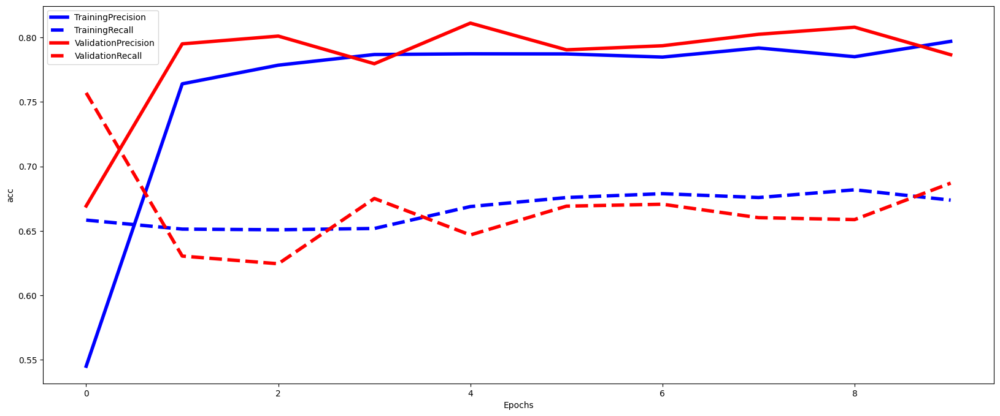

Epoch 1/10
248/248 - 3s - loss: 0.7193 - precision_39: 0.5205 - recall_39: 0.9464 - val_loss: 0.6826 - val_precision_39: 0.8442 - val_recall_39: 0.5402 - 3s/epoch - 11ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6751 - precision_39: 0.8615 - recall_39: 0.4700 - val_loss: 0.6586 - val_precision_39: 0.7423 - val_recall_39: 0.7158 - 939ms/epoch - 4ms/step
Epoch 3/10
248/248 - 1s - loss: 0.6342 - precision_39: 0.6042 - recall_39: 0.8023 - val_loss: 0.5966 - val_precision_39: 0.7798 - val_recall_39: 0.6905 - 954ms/epoch - 4ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5712 - precision_39: 0.7916 - recall_39: 0.6256 - val_loss: 0.5438 - val_precision_39: 0.7942 - val_recall_39: 0.6488 - 1s/epoch - 4ms/step
Epoch 5/10
248/248 - 1s - loss: 0.5439 - precision_39: 0.7976 - recall_39: 0.6231 - val_loss: 0.5302 - val_precision_39: 0.7927 - val_recall_39: 0.6488 - 1s/epoch - 4ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5363 - precision_39: 0.8026 - recall_39: 0.6246 - val_loss: 0.5265 - val_precision_39: 0.

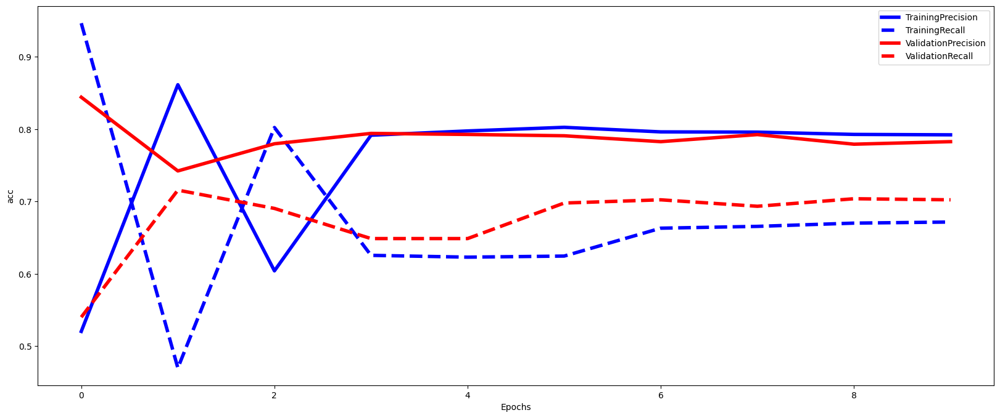

Epoch 1/10
248/248 - 2s - loss: 0.6866 - precision_40: 0.5450 - recall_40: 0.7054 - val_loss: 0.6694 - val_precision_40: 0.8395 - val_recall_40: 0.5067 - 2s/epoch - 7ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6469 - precision_40: 0.7792 - recall_40: 0.6233 - val_loss: 0.6165 - val_precision_40: 0.7720 - val_recall_40: 0.6915 - 616ms/epoch - 2ms/step
Epoch 3/10
248/248 - 1s - loss: 0.5926 - precision_40: 0.7802 - recall_40: 0.6498 - val_loss: 0.5659 - val_precision_40: 0.7857 - val_recall_40: 0.6393 - 632ms/epoch - 3ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5608 - precision_40: 0.7876 - recall_40: 0.6493 - val_loss: 0.5486 - val_precision_40: 0.7787 - val_recall_40: 0.6870 - 610ms/epoch - 2ms/step
Epoch 5/10
248/248 - 1s - loss: 0.5495 - precision_40: 0.7916 - recall_40: 0.6633 - val_loss: 0.5391 - val_precision_40: 0.8028 - val_recall_40: 0.6736 - 638ms/epoch - 3ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5423 - precision_40: 0.7970 - recall_40: 0.6638 - val_loss: 0.5340 - val_precision_4

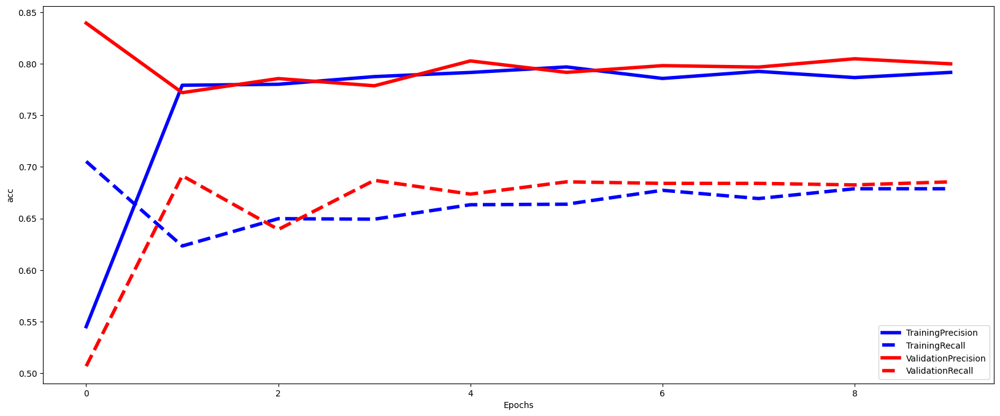

Average F1-Score over validation set is 0.75
STD of F1-Score over validation set is 0.01
42/42 [==============================] - 0s 3ms/step
Val: 0.1, Validation Score: 0.746, Test Score: 0.749


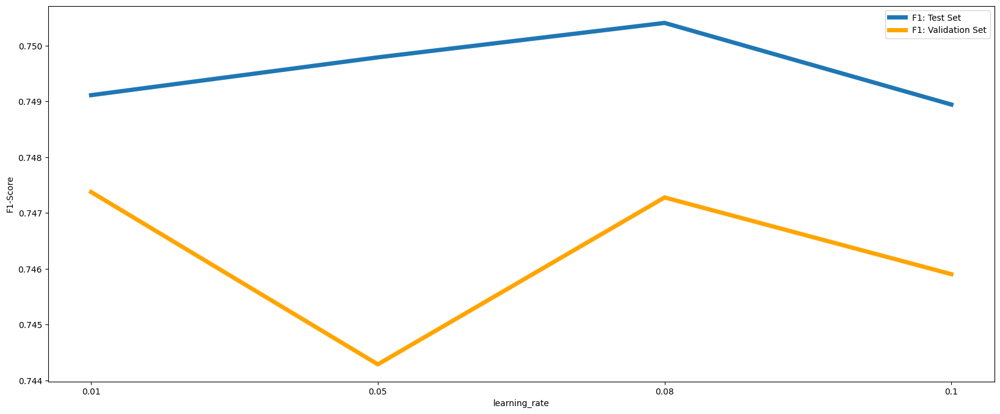

In [60]:
model,best_lr = evaluate_efect_param(parameter_type='model_params',parameter_name='learning_rate', values_list=[0.01, 0.05, 0.08, 0.1])
kfold_params['model_params']['learning_rate'] = best_lr

## best learning rate is around 0.8

## choosing best learning rate decay:

Epoch 1/10
248/248 - 2s - loss: 0.7475 - precision_41: 0.8172 - recall_41: 0.1554 - val_loss: 0.6693 - val_precision_41: 0.8061 - val_recall_41: 0.5640 - 2s/epoch - 8ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6483 - precision_41: 0.7794 - recall_41: 0.6524 - val_loss: 0.6267 - val_precision_41: 0.7754 - val_recall_41: 0.6738 - 616ms/epoch - 2ms/step
Epoch 3/10
248/248 - 1s - loss: 0.5998 - precision_41: 0.7903 - recall_41: 0.6663 - val_loss: 0.5847 - val_precision_41: 0.7740 - val_recall_41: 0.6524 - 592ms/epoch - 2ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5644 - precision_41: 0.7970 - recall_41: 0.6783 - val_loss: 0.5658 - val_precision_41: 0.7566 - val_recall_41: 0.6585 - 640ms/epoch - 3ms/step
Epoch 5/10
248/248 - 1s - loss: 0.5477 - precision_41: 0.7875 - recall_41: 0.6847 - val_loss: 0.5562 - val_precision_41: 0.7712 - val_recall_41: 0.6524 - 645ms/epoch - 3ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5387 - precision_41: 0.7894 - recall_41: 0.6887 - val_loss: 0.5502 - val_precision_4

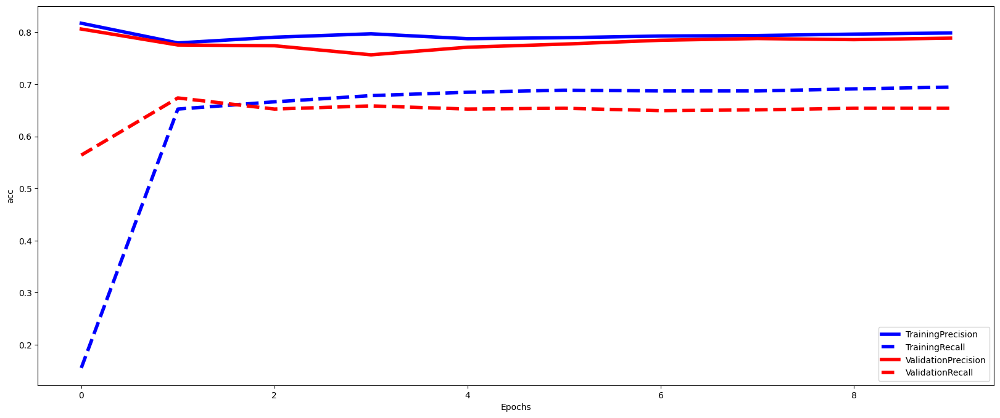

Epoch 1/10
248/248 - 3s - loss: 0.6816 - precision_42: 0.6534 - recall_42: 0.5028 - val_loss: 0.6584 - val_precision_42: 0.8022 - val_recall_42: 0.6468 - 3s/epoch - 11ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6254 - precision_42: 0.7700 - recall_42: 0.6598 - val_loss: 0.5925 - val_precision_42: 0.7811 - val_recall_42: 0.6647 - 1s/epoch - 4ms/step
Epoch 3/10
248/248 - 1s - loss: 0.5697 - precision_42: 0.7842 - recall_42: 0.6563 - val_loss: 0.5571 - val_precision_42: 0.8086 - val_recall_42: 0.6423 - 1s/epoch - 4ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5490 - precision_42: 0.7904 - recall_42: 0.6638 - val_loss: 0.5454 - val_precision_42: 0.7815 - val_recall_42: 0.6662 - 1s/epoch - 6ms/step
Epoch 5/10
248/248 - 1s - loss: 0.5411 - precision_42: 0.7884 - recall_42: 0.6728 - val_loss: 0.5389 - val_precision_42: 0.7968 - val_recall_42: 0.6602 - 901ms/epoch - 4ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5361 - precision_42: 0.7838 - recall_42: 0.6748 - val_loss: 0.5337 - val_precision_42: 0.800

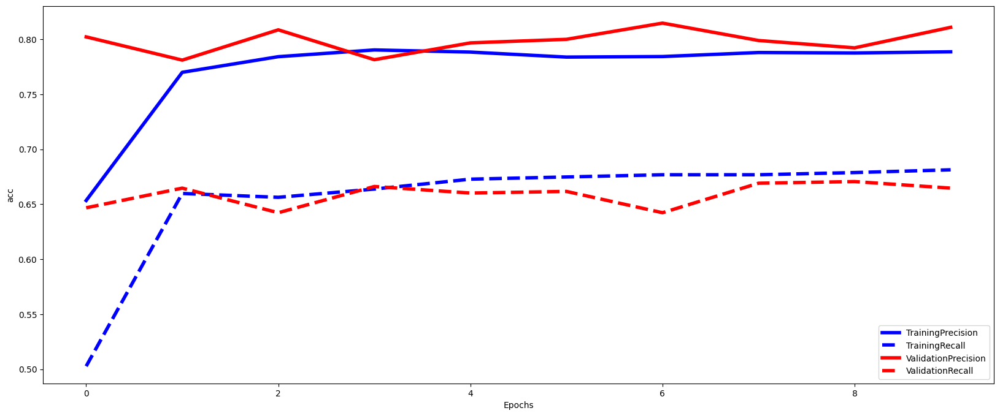

Epoch 1/10
248/248 - 3s - loss: 0.7122 - precision_43: 0.5199 - recall_43: 0.9670 - val_loss: 0.6693 - val_precision_43: 0.5544 - val_recall_43: 0.8795 - 3s/epoch - 12ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6481 - precision_43: 0.6882 - recall_43: 0.7137 - val_loss: 0.6155 - val_precision_43: 0.7754 - val_recall_43: 0.6577 - 904ms/epoch - 4ms/step
Epoch 3/10
248/248 - 1s - loss: 0.5893 - precision_43: 0.7864 - recall_43: 0.6321 - val_loss: 0.5609 - val_precision_43: 0.7805 - val_recall_43: 0.6562 - 837ms/epoch - 3ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5558 - precision_43: 0.7906 - recall_43: 0.6331 - val_loss: 0.5409 - val_precision_43: 0.7841 - val_recall_43: 0.6920 - 1s/epoch - 4ms/step
Epoch 5/10
248/248 - 1s - loss: 0.5439 - precision_43: 0.7918 - recall_43: 0.6491 - val_loss: 0.5318 - val_precision_43: 0.7905 - val_recall_43: 0.6964 - 866ms/epoch - 3ms/step
Epoch 6/10
248/248 - 2s - loss: 0.5373 - precision_43: 0.7925 - recall_43: 0.6632 - val_loss: 0.5282 - val_precision_43:

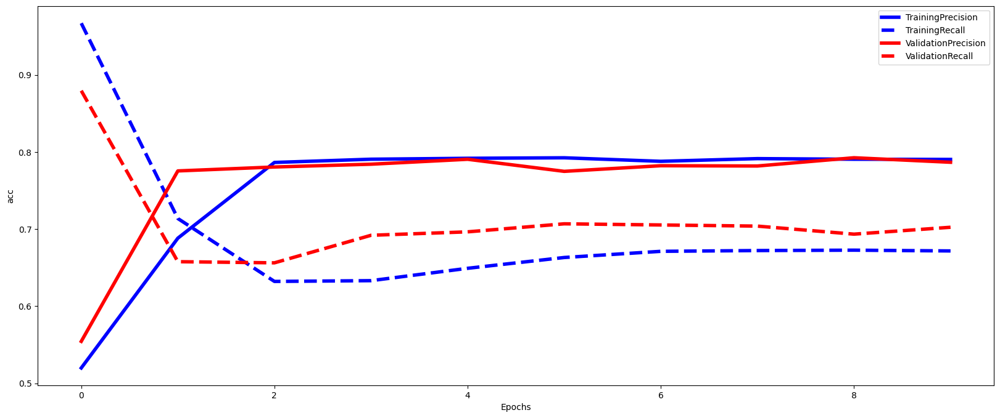

Epoch 1/10
248/248 - 3s - loss: 0.6842 - precision_44: 0.7285 - recall_44: 0.4482 - val_loss: 0.6517 - val_precision_44: 0.7925 - val_recall_44: 0.6602 - 3s/epoch - 11ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6199 - precision_44: 0.7746 - recall_44: 0.6548 - val_loss: 0.5833 - val_precision_44: 0.7886 - val_recall_44: 0.6781 - 1s/epoch - 5ms/step
Epoch 3/10
248/248 - 1s - loss: 0.5715 - precision_44: 0.7838 - recall_44: 0.6673 - val_loss: 0.5532 - val_precision_44: 0.8085 - val_recall_44: 0.6542 - 1s/epoch - 4ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5540 - precision_44: 0.7885 - recall_44: 0.6678 - val_loss: 0.5418 - val_precision_44: 0.8018 - val_recall_44: 0.6751 - 847ms/epoch - 3ms/step
Epoch 5/10
248/248 - 1s - loss: 0.5460 - precision_44: 0.7908 - recall_44: 0.6733 - val_loss: 0.5349 - val_precision_44: 0.7976 - val_recall_44: 0.6811 - 603ms/epoch - 2ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5400 - precision_44: 0.7888 - recall_44: 0.6743 - val_loss: 0.5296 - val_precision_44: 0.

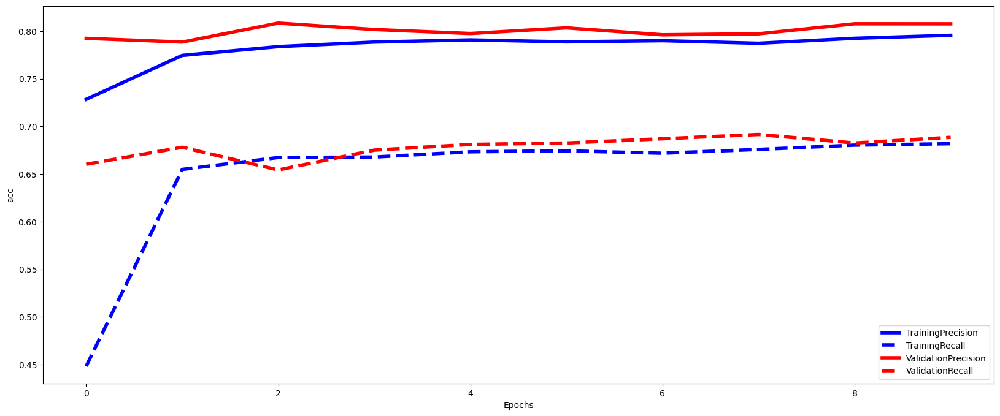

Average F1-Score over validation set is 0.75
STD of F1-Score over validation set is 0.01
42/42 [==============================] - 0s 3ms/step


Val: 0.1, Validation Score: 0.749, Test Score: 0.754
Epoch 1/10
248/248 - 2s - loss: 0.6757 - precision_45: 0.5870 - recall_45: 0.7438 - val_loss: 0.6509 - val_precision_45: 0.8074 - val_recall_45: 0.5625 - 2s/epoch - 9ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6155 - precision_45: 0.7791 - recall_45: 0.6584 - val_loss: 0.5902 - val_precision_45: 0.7718 - val_recall_45: 0.6341 - 618ms/epoch - 2ms/step
Epoch 3/10
248/248 - 1s - loss: 0.5660 - precision_45: 0.7876 - recall_45: 0.6609 - val_loss: 0.5657 - val_precision_45: 0.7535 - val_recall_45: 0.6570 - 652ms/epoch - 3ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5472 - precision_45: 0.7890 - recall_45: 0.6797 - val_loss: 0.5567 - val_precision_45: 0.7633 - val_recall_45: 0.6540 - 621ms/epoch - 3ms/step
Epoch 5/10
248/248 - 1s - loss: 0.5391 - precision_45: 0.7921 - recall_45: 0.6827 - val_loss: 0.5520 - val_precision_45: 0.7651 - val_recall_45: 0.6555 - 628ms/epoch - 3ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5334 - precision_45: 0.7870 - r

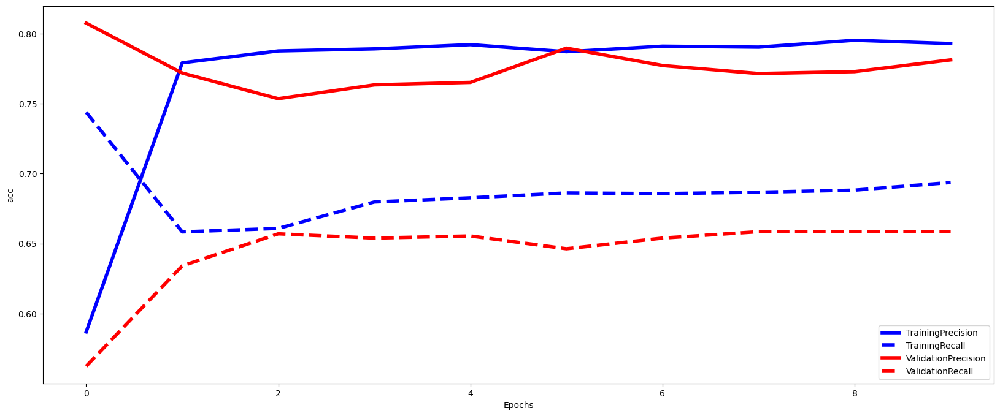

Epoch 1/10
248/248 - 3s - loss: 0.6776 - precision_46: 0.5833 - recall_46: 0.8369 - val_loss: 0.6510 - val_precision_46: 0.6628 - val_recall_46: 0.7705 - 3s/epoch - 11ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6171 - precision_46: 0.7457 - recall_46: 0.6908 - val_loss: 0.5863 - val_precision_46: 0.7562 - val_recall_46: 0.6841 - 1s/epoch - 4ms/step
Epoch 3/10
248/248 - 1s - loss: 0.5662 - precision_46: 0.7804 - recall_46: 0.6508 - val_loss: 0.5542 - val_precision_46: 0.7877 - val_recall_46: 0.6692 - 934ms/epoch - 4ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5465 - precision_46: 0.7837 - recall_46: 0.6653 - val_loss: 0.5463 - val_precision_46: 0.8115 - val_recall_46: 0.6095 - 1s/epoch - 4ms/step
Epoch 5/10
248/248 - 1s - loss: 0.5390 - precision_46: 0.7840 - recall_46: 0.6698 - val_loss: 0.5396 - val_precision_46: 0.8142 - val_recall_46: 0.6334 - 664ms/epoch - 3ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5341 - precision_46: 0.7882 - recall_46: 0.6738 - val_loss: 0.5315 - val_precision_46: 0.

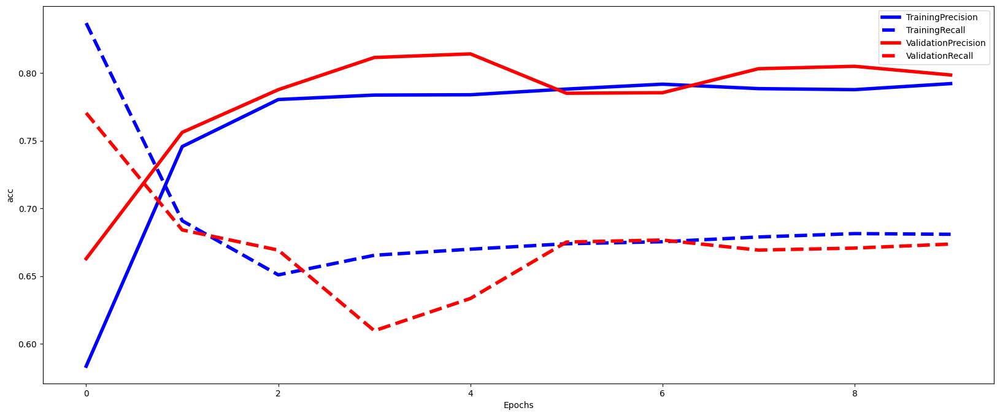

Epoch 1/10
248/248 - 2s - loss: 0.6969 - precision_47: 0.7399 - recall_47: 0.2007 - val_loss: 0.6703 - val_precision_47: 0.6727 - val_recall_47: 0.7738 - 2s/epoch - 10ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6433 - precision_47: 0.7596 - recall_47: 0.6642 - val_loss: 0.6079 - val_precision_47: 0.7940 - val_recall_47: 0.6711 - 734ms/epoch - 3ms/step
Epoch 3/10
248/248 - 2s - loss: 0.5840 - precision_47: 0.7872 - recall_47: 0.6537 - val_loss: 0.5605 - val_precision_47: 0.7702 - val_recall_47: 0.7083 - 2s/epoch - 7ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5568 - precision_47: 0.7828 - recall_47: 0.6657 - val_loss: 0.5441 - val_precision_47: 0.7783 - val_recall_47: 0.7054 - 1s/epoch - 6ms/step
Epoch 5/10
248/248 - 2s - loss: 0.5465 - precision_47: 0.7903 - recall_47: 0.6657 - val_loss: 0.5382 - val_precision_47: 0.7676 - val_recall_47: 0.7128 - 2s/epoch - 7ms/step
Epoch 6/10
248/248 - 2s - loss: 0.5399 - precision_47: 0.7847 - recall_47: 0.6712 - val_loss: 0.5306 - val_precision_47: 0.792

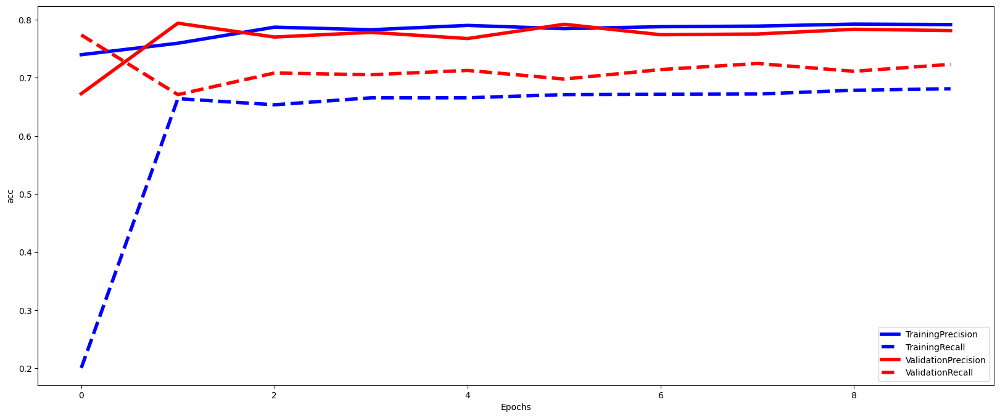

Epoch 1/10
248/248 - 3s - loss: 0.6802 - precision_48: 0.6107 - recall_48: 0.6638 - val_loss: 0.6587 - val_precision_48: 0.7726 - val_recall_48: 0.7139 - 3s/epoch - 10ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6293 - precision_48: 0.7571 - recall_48: 0.6658 - val_loss: 0.5924 - val_precision_48: 0.7985 - val_recall_48: 0.6319 - 823ms/epoch - 3ms/step
Epoch 3/10
248/248 - 1s - loss: 0.5758 - precision_48: 0.7944 - recall_48: 0.6398 - val_loss: 0.5549 - val_precision_48: 0.8018 - val_recall_48: 0.6572 - 887ms/epoch - 4ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5549 - precision_48: 0.7938 - recall_48: 0.6528 - val_loss: 0.5423 - val_precision_48: 0.8014 - val_recall_48: 0.6796 - 608ms/epoch - 2ms/step
Epoch 5/10
248/248 - 1s - loss: 0.5461 - precision_48: 0.7901 - recall_48: 0.6683 - val_loss: 0.5356 - val_precision_48: 0.8039 - val_recall_48: 0.6781 - 623ms/epoch - 3ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5401 - precision_48: 0.7918 - recall_48: 0.6733 - val_loss: 0.5297 - val_precision_

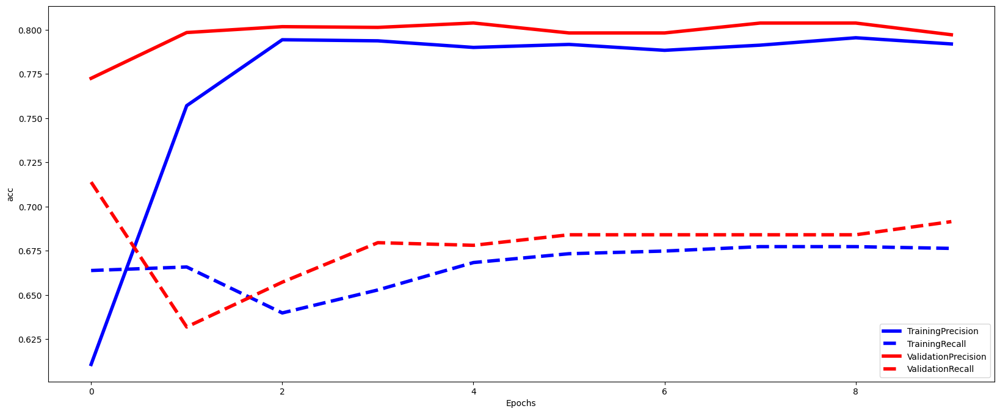

Average F1-Score over validation set is 0.75
STD of F1-Score over validation set is 0.01
42/42 [==============================] - 0s 2ms/step


Val: 0.3, Validation Score: 0.748, Test Score: 0.756
Epoch 1/10
248/248 - 6s - loss: 0.6705 - precision_49: 0.6235 - recall_49: 0.7761 - val_loss: 0.6417 - val_precision_49: 0.6546 - val_recall_49: 0.7454 - 6s/epoch - 24ms/step
Epoch 2/10
248/248 - 2s - loss: 0.6010 - precision_49: 0.7636 - recall_49: 0.6897 - val_loss: 0.5797 - val_precision_49: 0.7474 - val_recall_49: 0.6585 - 2s/epoch - 7ms/step
Epoch 3/10
248/248 - 1s - loss: 0.5571 - precision_49: 0.7774 - recall_49: 0.6832 - val_loss: 0.5618 - val_precision_49: 0.7717 - val_recall_49: 0.6494 - 1s/epoch - 5ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5435 - precision_49: 0.7803 - recall_49: 0.6842 - val_loss: 0.5564 - val_precision_49: 0.7763 - val_recall_49: 0.6402 - 1s/epoch - 5ms/step
Epoch 5/10
248/248 - 1s - loss: 0.5371 - precision_49: 0.7842 - recall_49: 0.6857 - val_loss: 0.5502 - val_precision_49: 0.7620 - val_recall_49: 0.6540 - 950ms/epoch - 4ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5310 - precision_49: 0.7843 - recall_49

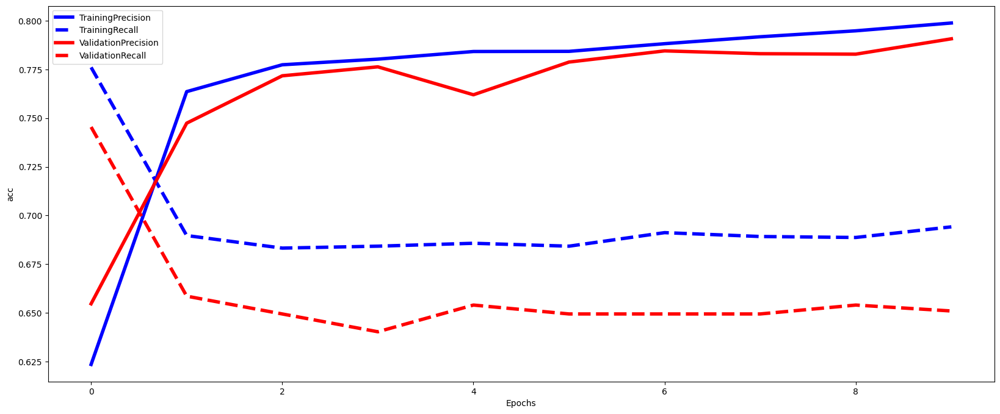

Epoch 1/10
248/248 - 3s - loss: 0.6816 - precision_50: 0.5880 - recall_50: 0.7369 - val_loss: 0.6633 - val_precision_50: 0.8218 - val_recall_50: 0.5499 - 3s/epoch - 10ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6298 - precision_50: 0.7758 - recall_50: 0.6543 - val_loss: 0.5966 - val_precision_50: 0.7784 - val_recall_50: 0.6647 - 1s/epoch - 4ms/step
Epoch 3/10
248/248 - 1s - loss: 0.5731 - precision_50: 0.7833 - recall_50: 0.6563 - val_loss: 0.5607 - val_precision_50: 0.8100 - val_recall_50: 0.6036 - 1s/epoch - 4ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5500 - precision_50: 0.7869 - recall_50: 0.6538 - val_loss: 0.5458 - val_precision_50: 0.7943 - val_recall_50: 0.6677 - 1s/epoch - 4ms/step
Epoch 5/10
248/248 - 1s - loss: 0.5419 - precision_50: 0.7877 - recall_50: 0.6738 - val_loss: 0.5395 - val_precision_50: 0.8018 - val_recall_50: 0.6572 - 1s/epoch - 4ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5362 - precision_50: 0.7873 - recall_50: 0.6758 - val_loss: 0.5329 - val_precision_50: 0.7885 -

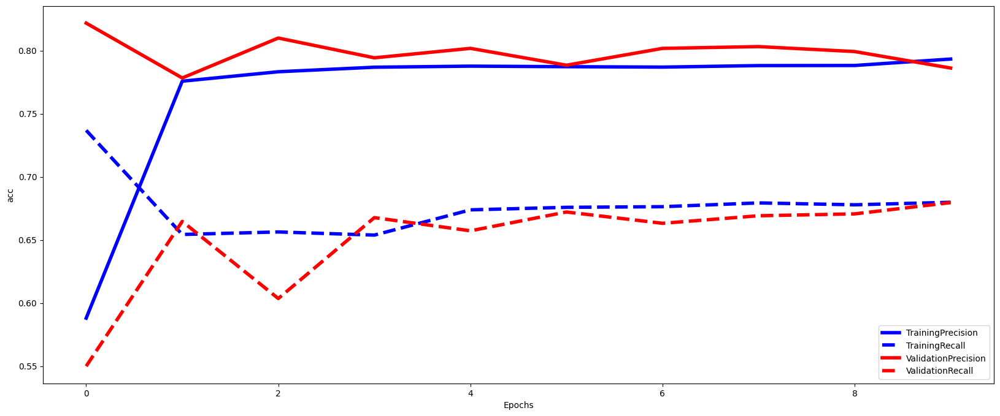

Epoch 1/10
248/248 - 2s - loss: 0.6783 - precision_51: 0.6739 - recall_51: 0.6246 - val_loss: 0.6564 - val_precision_51: 0.7587 - val_recall_51: 0.7113 - 2s/epoch - 7ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6238 - precision_51: 0.7861 - recall_51: 0.6346 - val_loss: 0.5864 - val_precision_51: 0.7832 - val_recall_51: 0.6935 - 674ms/epoch - 3ms/step
Epoch 3/10
248/248 - 1s - loss: 0.5708 - precision_51: 0.7887 - recall_51: 0.6371 - val_loss: 0.5547 - val_precision_51: 0.7608 - val_recall_51: 0.7098 - 635ms/epoch - 3ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5530 - precision_51: 0.7883 - recall_51: 0.6597 - val_loss: 0.5403 - val_precision_51: 0.7886 - val_recall_51: 0.6994 - 631ms/epoch - 3ms/step
Epoch 5/10
248/248 - 1s - loss: 0.5443 - precision_51: 0.7880 - recall_51: 0.6697 - val_loss: 0.5344 - val_precision_51: 0.7749 - val_recall_51: 0.7068 - 642ms/epoch - 3ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5378 - precision_51: 0.7872 - recall_51: 0.6702 - val_loss: 0.5294 - val_precision_5

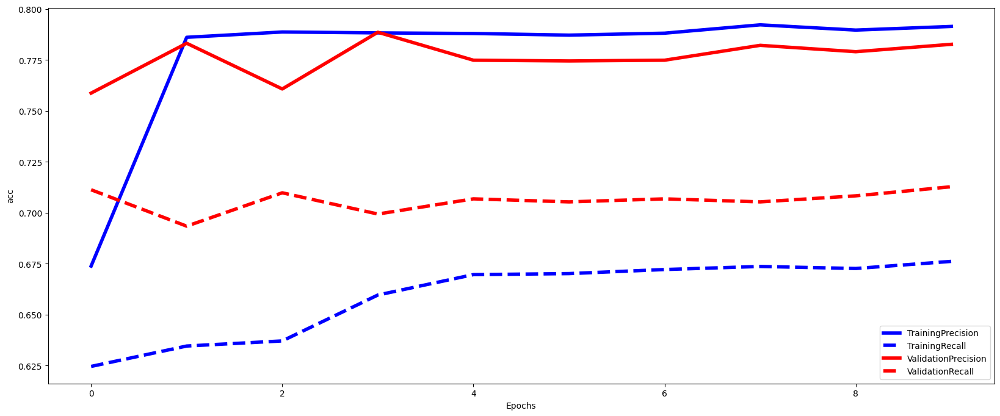

Epoch 1/10
248/248 - 3s - loss: 0.6645 - precision_52: 0.7002 - recall_52: 0.5853 - val_loss: 0.6305 - val_precision_52: 0.7878 - val_recall_52: 0.6528 - 3s/epoch - 11ms/step
Epoch 2/10
248/248 - 1s - loss: 0.5998 - precision_52: 0.7627 - recall_52: 0.6513 - val_loss: 0.5693 - val_precision_52: 0.7778 - val_recall_52: 0.6885 - 1s/epoch - 5ms/step
Epoch 3/10
248/248 - 1s - loss: 0.5616 - precision_52: 0.7914 - recall_52: 0.6473 - val_loss: 0.5478 - val_precision_52: 0.7814 - val_recall_52: 0.6870 - 976ms/epoch - 4ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5494 - precision_52: 0.7913 - recall_52: 0.6618 - val_loss: 0.5384 - val_precision_52: 0.7927 - val_recall_52: 0.6841 - 902ms/epoch - 4ms/step
Epoch 5/10
248/248 - 1s - loss: 0.5423 - precision_52: 0.7898 - recall_52: 0.6728 - val_loss: 0.5327 - val_precision_52: 0.8004 - val_recall_52: 0.6811 - 628ms/epoch - 3ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5375 - precision_52: 0.7855 - recall_52: 0.6743 - val_loss: 0.5283 - val_precision_52:

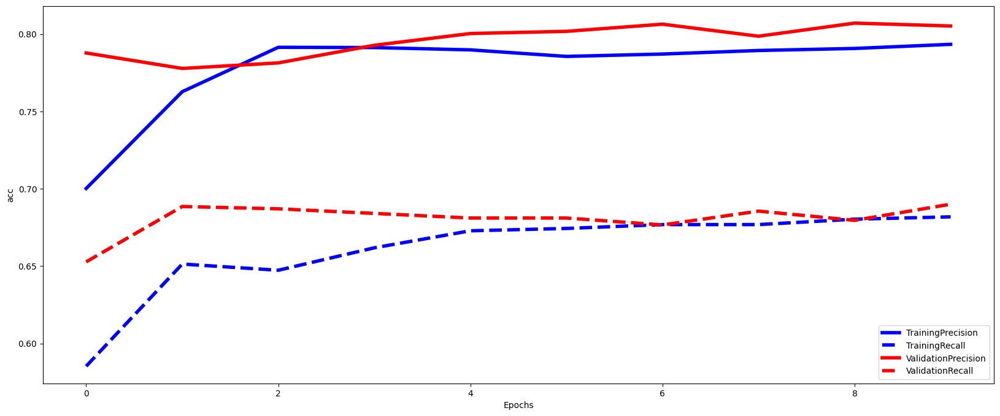

Average F1-Score over validation set is 0.75
STD of F1-Score over validation set is 0.01
42/42 [==============================] - 0s 3ms/step
Val: 0.6, Validation Score: 0.748, Test Score: 0.751


Epoch 1/10
248/248 - 3s - loss: 0.7080 - precision_53: 0.7280 - recall_53: 0.2790 - val_loss: 0.6706 - val_precision_53: 0.7596 - val_recall_53: 0.6601 - 3s/epoch - 14ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6468 - precision_53: 0.7637 - recall_53: 0.6931 - val_loss: 0.6220 - val_precision_53: 0.7674 - val_recall_53: 0.6540 - 1s/epoch - 5ms/step
Epoch 3/10
248/248 - 1s - loss: 0.5940 - precision_53: 0.7778 - recall_53: 0.6797 - val_loss: 0.5810 - val_precision_53: 0.7674 - val_recall_53: 0.6540 - 929ms/epoch - 4ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5611 - precision_53: 0.7833 - recall_53: 0.6802 - val_loss: 0.5647 - val_precision_53: 0.7694 - val_recall_53: 0.6509 - 669ms/epoch - 3ms/step
Epoch 5/10
248/248 - 1s - loss: 0.5474 - precision_53: 0.7873 - recall_53: 0.6837 - val_loss: 0.5577 - val_precision_53: 0.7698 - val_recall_53: 0.6524 - 627ms/epoch - 3ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5397 - precision_53: 0.7876 - recall_53: 0.6867 - val_loss: 0.5531 - val_precision_53:

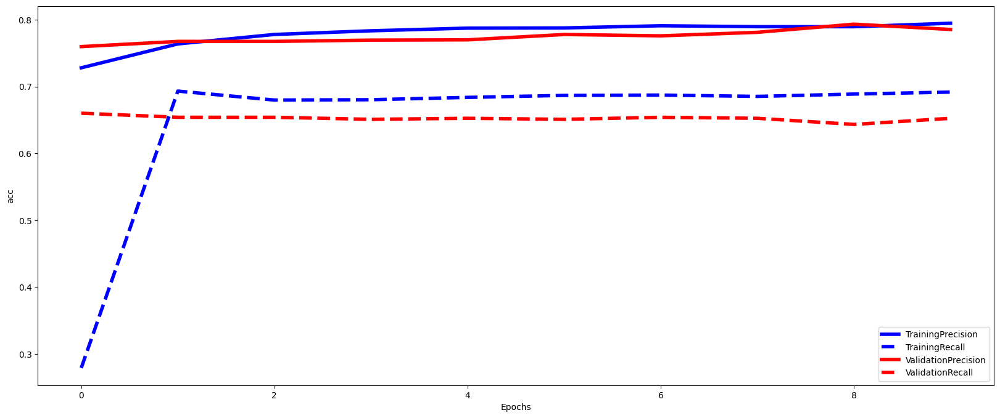

Epoch 1/10
248/248 - 2s - loss: 0.6735 - precision_54: 0.6239 - recall_54: 0.7684 - val_loss: 0.6470 - val_precision_54: 0.7181 - val_recall_54: 0.7556 - 2s/epoch - 8ms/step
Epoch 2/10
248/248 - 2s - loss: 0.6112 - precision_54: 0.7682 - recall_54: 0.6598 - val_loss: 0.5831 - val_precision_54: 0.7972 - val_recall_54: 0.6036 - 2s/epoch - 7ms/step
Epoch 3/10
248/248 - 1s - loss: 0.5642 - precision_54: 0.7878 - recall_54: 0.6483 - val_loss: 0.5545 - val_precision_54: 0.7891 - val_recall_54: 0.6692 - 948ms/epoch - 4ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5481 - precision_54: 0.7845 - recall_54: 0.6628 - val_loss: 0.5446 - val_precision_54: 0.7933 - val_recall_54: 0.6692 - 985ms/epoch - 4ms/step
Epoch 5/10
248/248 - 1s - loss: 0.5411 - precision_54: 0.7917 - recall_54: 0.6693 - val_loss: 0.5381 - val_precision_54: 0.7828 - val_recall_54: 0.6766 - 1s/epoch - 4ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5358 - precision_54: 0.7856 - recall_54: 0.6763 - val_loss: 0.5325 - val_precision_54: 0.7

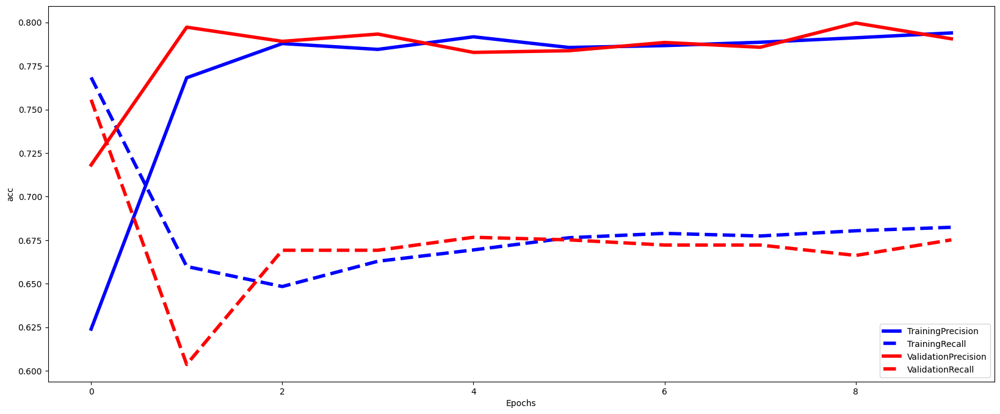

Epoch 1/10
248/248 - 2s - loss: 0.7034 - precision_55: 0.7811 - recall_55: 0.2608 - val_loss: 0.6684 - val_precision_55: 0.7636 - val_recall_55: 0.7113 - 2s/epoch - 8ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6440 - precision_55: 0.7444 - recall_55: 0.6792 - val_loss: 0.6138 - val_precision_55: 0.8152 - val_recall_55: 0.6369 - 652ms/epoch - 3ms/step
Epoch 3/10
248/248 - 1s - loss: 0.5900 - precision_55: 0.7849 - recall_55: 0.6502 - val_loss: 0.5656 - val_precision_55: 0.7986 - val_recall_55: 0.6607 - 638ms/epoch - 3ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5601 - precision_55: 0.7870 - recall_55: 0.6622 - val_loss: 0.5464 - val_precision_55: 0.7919 - val_recall_55: 0.6964 - 656ms/epoch - 3ms/step
Epoch 5/10
248/248 - 1s - loss: 0.5484 - precision_55: 0.7863 - recall_55: 0.6702 - val_loss: 0.5373 - val_precision_55: 0.7886 - val_recall_55: 0.6994 - 612ms/epoch - 2ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5405 - precision_55: 0.7904 - recall_55: 0.6662 - val_loss: 0.5310 - val_precision_5

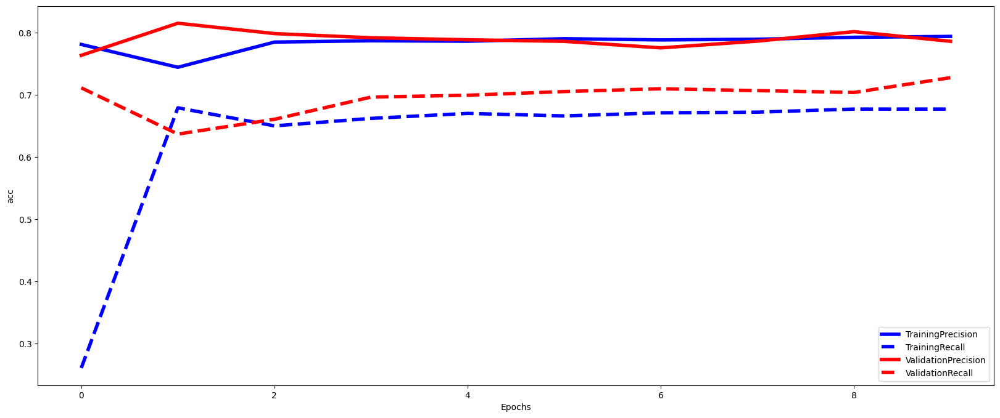

Epoch 1/10
248/248 - 5s - loss: 0.6811 - precision_56: 0.6028 - recall_56: 0.7234 - val_loss: 0.6529 - val_precision_56: 0.7820 - val_recall_56: 0.6468 - 5s/epoch - 20ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6192 - precision_56: 0.7864 - recall_56: 0.6483 - val_loss: 0.5814 - val_precision_56: 0.7856 - val_recall_56: 0.6498 - 901ms/epoch - 4ms/step
Epoch 3/10
248/248 - 1s - loss: 0.5686 - precision_56: 0.7863 - recall_56: 0.6368 - val_loss: 0.5504 - val_precision_56: 0.7860 - val_recall_56: 0.6841 - 1s/epoch - 4ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5516 - precision_56: 0.7908 - recall_56: 0.6638 - val_loss: 0.5403 - val_precision_56: 0.8061 - val_recall_56: 0.6692 - 1s/epoch - 4ms/step
Epoch 5/10
248/248 - 1s - loss: 0.5436 - precision_56: 0.7874 - recall_56: 0.6688 - val_loss: 0.5340 - val_precision_56: 0.7921 - val_recall_56: 0.6870 - 774ms/epoch - 3ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5373 - precision_56: 0.7879 - recall_56: 0.6728 - val_loss: 0.5306 - val_precision_56: 0.

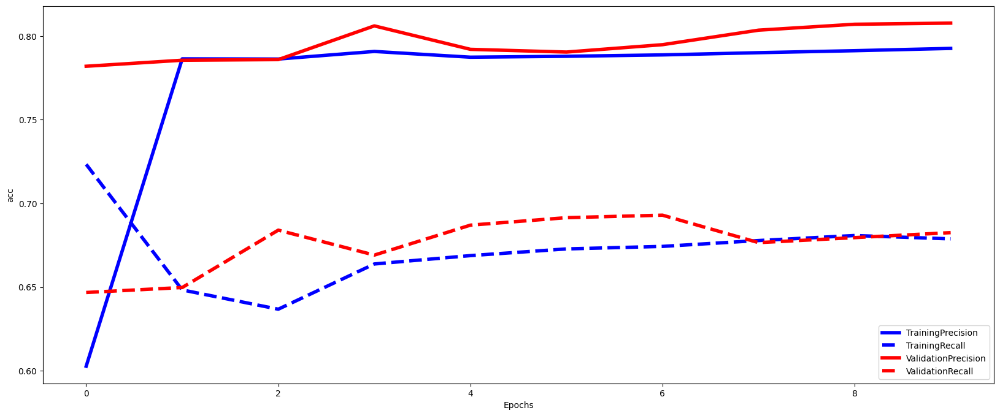

Average F1-Score over validation set is 0.75
STD of F1-Score over validation set is 0.01
42/42 [==============================] - 0s 2ms/step


Val: 0.8, Validation Score: 0.749, Test Score: 0.758
Epoch 1/10
248/248 - 3s - loss: 0.6714 - precision_57: 0.6396 - recall_57: 0.7269 - val_loss: 0.6427 - val_precision_57: 0.7724 - val_recall_57: 0.6052 - 3s/epoch - 11ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6058 - precision_57: 0.7750 - recall_57: 0.6465 - val_loss: 0.5823 - val_precision_57: 0.7721 - val_recall_57: 0.6250 - 1s/epoch - 4ms/step
Epoch 3/10
248/248 - 1s - loss: 0.5602 - precision_57: 0.7949 - recall_57: 0.6599 - val_loss: 0.5632 - val_precision_57: 0.7629 - val_recall_57: 0.6524 - 1s/epoch - 5ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5456 - precision_57: 0.7840 - recall_57: 0.6847 - val_loss: 0.5586 - val_precision_57: 0.7856 - val_recall_57: 0.6311 - 1s/epoch - 5ms/step
Epoch 5/10
248/248 - 3s - loss: 0.5389 - precision_57: 0.7895 - recall_57: 0.6797 - val_loss: 0.5521 - val_precision_57: 0.7606 - val_recall_57: 0.6540 - 3s/epoch - 11ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5327 - precision_57: 0.7893 - recall_57: 

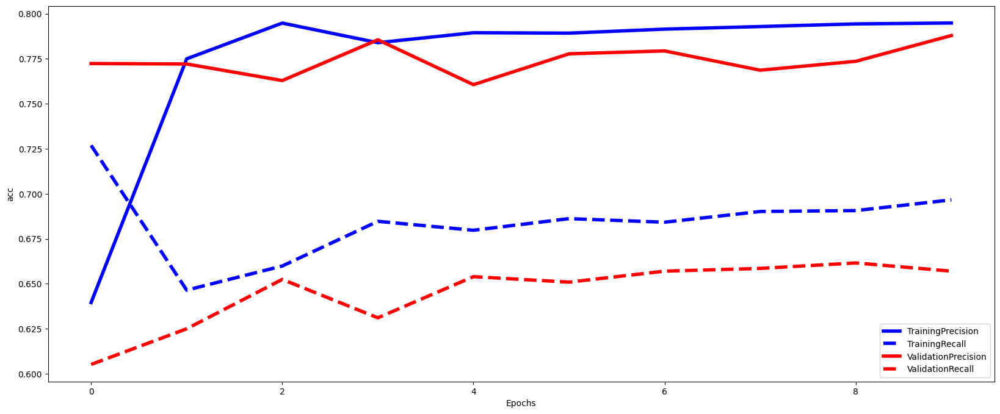

Epoch 1/10
248/248 - 2s - loss: 0.6787 - precision_58: 0.6218 - recall_58: 0.7189 - val_loss: 0.6598 - val_precision_58: 0.5892 - val_recall_58: 0.7824 - 2s/epoch - 7ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6273 - precision_58: 0.7426 - recall_58: 0.6568 - val_loss: 0.5975 - val_precision_58: 0.8133 - val_recall_58: 0.6036 - 662ms/epoch - 3ms/step
Epoch 3/10
248/248 - 1s - loss: 0.5727 - precision_58: 0.7950 - recall_58: 0.6208 - val_loss: 0.5606 - val_precision_58: 0.8046 - val_recall_58: 0.6200 - 636ms/epoch - 3ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5510 - precision_58: 0.7907 - recall_58: 0.6388 - val_loss: 0.5508 - val_precision_58: 0.7765 - val_recall_58: 0.6781 - 623ms/epoch - 3ms/step
Epoch 5/10
248/248 - 1s - loss: 0.5440 - precision_58: 0.7882 - recall_58: 0.6683 - val_loss: 0.5411 - val_precision_58: 0.7957 - val_recall_58: 0.6617 - 634ms/epoch - 3ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5386 - precision_58: 0.7896 - recall_58: 0.6738 - val_loss: 0.5350 - val_precision_5

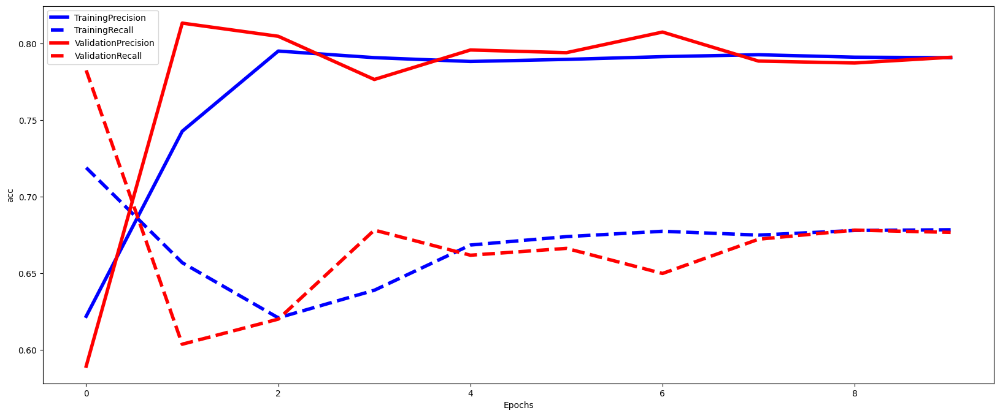

Epoch 1/10
248/248 - 3s - loss: 0.6693 - precision_59: 0.6540 - recall_59: 0.6186 - val_loss: 0.6406 - val_precision_59: 0.7536 - val_recall_59: 0.6920 - 3s/epoch - 11ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6074 - precision_59: 0.7516 - recall_59: 0.6512 - val_loss: 0.5733 - val_precision_59: 0.7667 - val_recall_59: 0.6652 - 1s/epoch - 5ms/step
Epoch 3/10
248/248 - 1s - loss: 0.5626 - precision_59: 0.7825 - recall_59: 0.6446 - val_loss: 0.5461 - val_precision_59: 0.7822 - val_recall_59: 0.6949 - 1s/epoch - 4ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5475 - precision_59: 0.7867 - recall_59: 0.6592 - val_loss: 0.5375 - val_precision_59: 0.8065 - val_recall_59: 0.6696 - 1s/epoch - 4ms/step
Epoch 5/10
248/248 - 1s - loss: 0.5406 - precision_59: 0.7892 - recall_59: 0.6597 - val_loss: 0.5338 - val_precision_59: 0.7696 - val_recall_59: 0.7158 - 1s/epoch - 4ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5353 - precision_59: 0.7845 - recall_59: 0.6707 - val_loss: 0.5268 - val_precision_59: 0.7715 -

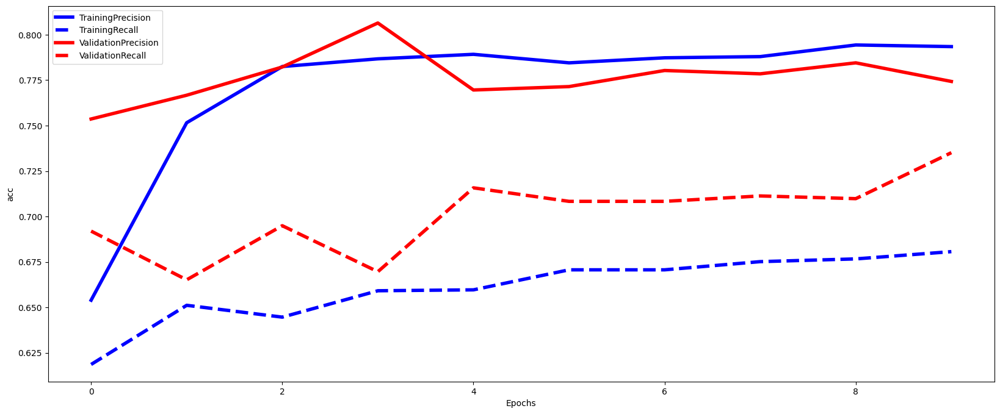

Epoch 1/10
248/248 - 2s - loss: 0.6796 - precision_60: 0.5932 - recall_60: 0.6353 - val_loss: 0.6559 - val_precision_60: 0.8079 - val_recall_60: 0.6080 - 2s/epoch - 7ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6247 - precision_60: 0.7536 - recall_60: 0.6608 - val_loss: 0.5857 - val_precision_60: 0.7893 - val_recall_60: 0.6364 - 618ms/epoch - 2ms/step
Epoch 3/10
248/248 - 1s - loss: 0.5716 - precision_60: 0.7756 - recall_60: 0.6673 - val_loss: 0.5513 - val_precision_60: 0.7996 - val_recall_60: 0.6423 - 826ms/epoch - 3ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5522 - precision_60: 0.7860 - recall_60: 0.6668 - val_loss: 0.5396 - val_precision_60: 0.7993 - val_recall_60: 0.6766 - 641ms/epoch - 3ms/step
Epoch 5/10
248/248 - 1s - loss: 0.5441 - precision_60: 0.7837 - recall_60: 0.6743 - val_loss: 0.5330 - val_precision_60: 0.7993 - val_recall_60: 0.6826 - 610ms/epoch - 2ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5386 - precision_60: 0.7873 - recall_60: 0.6758 - val_loss: 0.5288 - val_precision_6

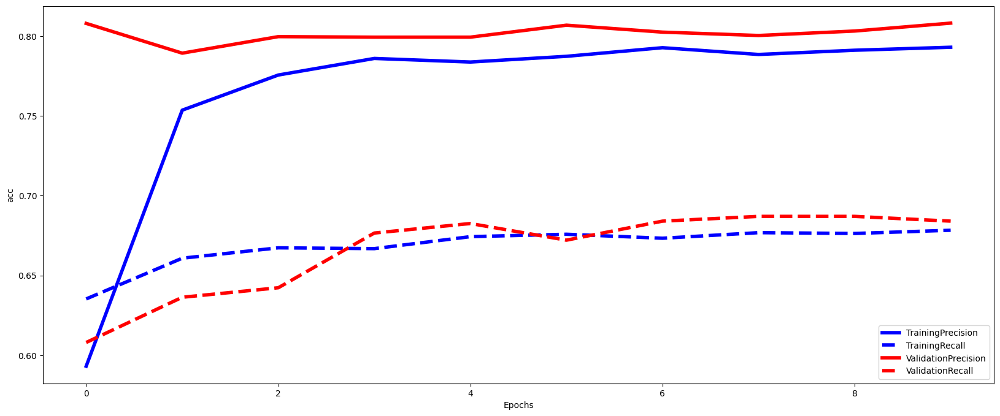

Average F1-Score over validation set is 0.75
STD of F1-Score over validation set is 0.01
42/42 [==============================] - 0s 2ms/step
Val: 0.95, Validation Score: 0.749, Test Score: 0.758


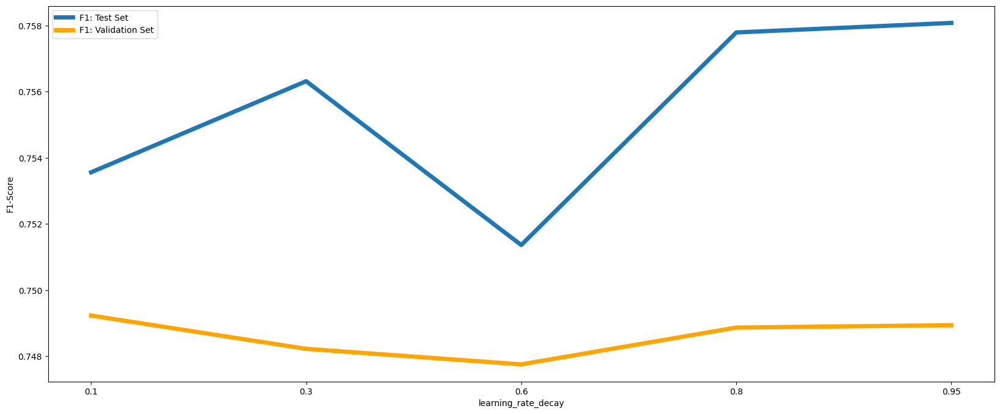

In [62]:
model,best_lr_decay = evaluate_efect_param(parameter_type='model_params',parameter_name='learning_rate_decay', values_list=[0.1, 0.3, 0.6, 0.8, 0.95])
kfold_params['model_params']['learning_rate_decay'] = best_lr_decay

# changing lr decay seems to have no sagnificant effect on final F1-score. we choose 0.95

## best batch size:

Epoch 1/10
991/991 - 4s - loss: 0.6447 - precision_61: 0.7318 - recall_61: 0.5392 - val_loss: 0.5882 - val_precision_61: 0.7736 - val_recall_61: 0.6509 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 2s - loss: 0.5607 - precision_61: 0.7873 - recall_61: 0.6783 - val_loss: 0.5617 - val_precision_61: 0.7655 - val_recall_61: 0.6570 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 2s - loss: 0.5417 - precision_61: 0.7885 - recall_61: 0.6847 - val_loss: 0.5546 - val_precision_61: 0.7962 - val_recall_61: 0.6311 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 4s - loss: 0.5299 - precision_61: 0.7953 - recall_61: 0.6867 - val_loss: 0.5407 - val_precision_61: 0.7814 - val_recall_61: 0.6540 - 4s/epoch - 4ms/step
Epoch 5/10
991/991 - 3s - loss: 0.5180 - precision_61: 0.7994 - recall_61: 0.6927 - val_loss: 0.5303 - val_precision_61: 0.7824 - val_recall_61: 0.6631 - 3s/epoch - 3ms/step
Epoch 6/10
991/991 - 2s - loss: 0.5070 - precision_61: 0.8022 - recall_61: 0.6986 - val_loss: 0.5189 - val_precision_61: 0.7858 - 

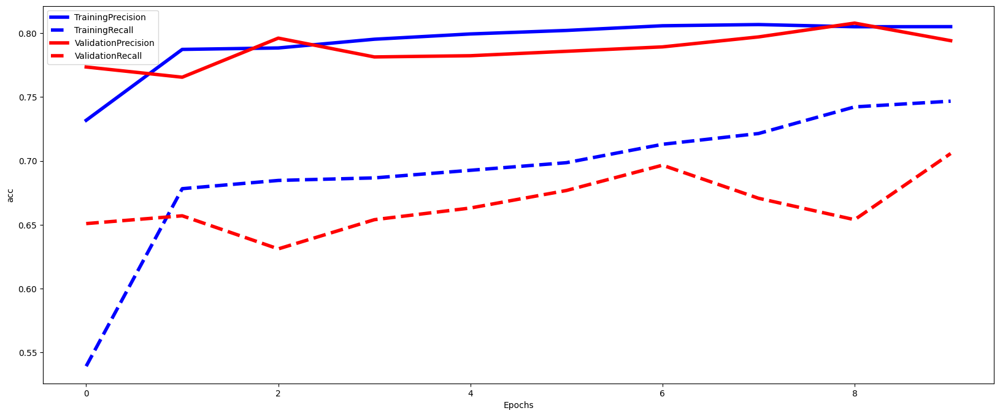

Epoch 1/10
991/991 - 4s - loss: 0.6462 - precision_62: 0.7548 - recall_62: 0.4727 - val_loss: 0.5842 - val_precision_62: 0.7962 - val_recall_62: 0.6230 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 2s - loss: 0.5605 - precision_62: 0.7871 - recall_62: 0.6528 - val_loss: 0.5492 - val_precision_62: 0.7840 - val_recall_62: 0.6706 - 2s/epoch - 3ms/step
Epoch 3/10
991/991 - 2s - loss: 0.5436 - precision_62: 0.7857 - recall_62: 0.6713 - val_loss: 0.5373 - val_precision_62: 0.7946 - val_recall_62: 0.6632 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 2s - loss: 0.5334 - precision_62: 0.7889 - recall_62: 0.6748 - val_loss: 0.5254 - val_precision_62: 0.7882 - val_recall_62: 0.6766 - 2s/epoch - 2ms/step
Epoch 5/10
991/991 - 3s - loss: 0.5238 - precision_62: 0.7938 - recall_62: 0.6798 - val_loss: 0.5179 - val_precision_62: 0.8102 - val_recall_62: 0.6617 - 3s/epoch - 3ms/step
Epoch 6/10
991/991 - 3s - loss: 0.5144 - precision_62: 0.7959 - recall_62: 0.6828 - val_loss: 0.5027 - val_precision_62: 0.8031 - 

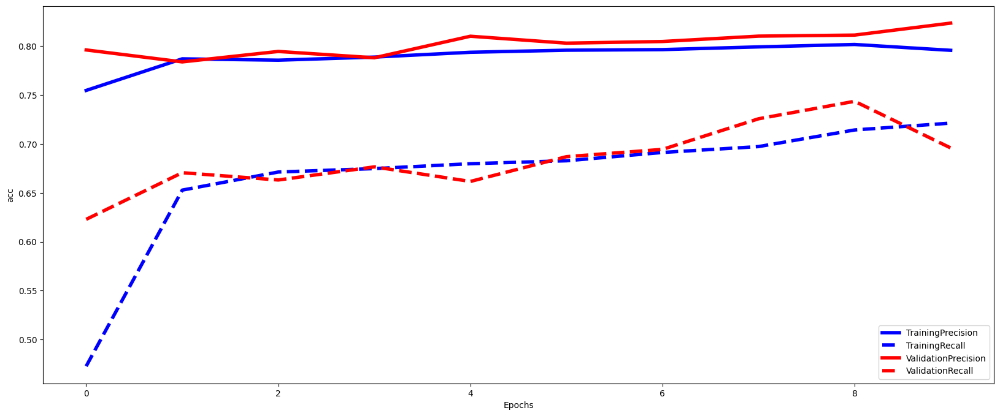

Epoch 1/10
991/991 - 6s - loss: 0.6404 - precision_63: 0.6588 - recall_63: 0.7267 - val_loss: 0.5788 - val_precision_63: 0.7825 - val_recall_63: 0.6533 - 6s/epoch - 6ms/step
Epoch 2/10
991/991 - 4s - loss: 0.5620 - precision_63: 0.7895 - recall_63: 0.6456 - val_loss: 0.5484 - val_precision_63: 0.7594 - val_recall_63: 0.7232 - 4s/epoch - 4ms/step
Epoch 3/10
991/991 - 2s - loss: 0.5432 - precision_63: 0.7880 - recall_63: 0.6662 - val_loss: 0.5295 - val_precision_63: 0.7805 - val_recall_63: 0.7039 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 2s - loss: 0.5323 - precision_63: 0.7906 - recall_63: 0.6727 - val_loss: 0.5224 - val_precision_63: 0.7791 - val_recall_63: 0.7083 - 2s/epoch - 2ms/step
Epoch 5/10
991/991 - 2s - loss: 0.5241 - precision_63: 0.7945 - recall_63: 0.6752 - val_loss: 0.5151 - val_precision_63: 0.7820 - val_recall_63: 0.7098 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 4s - loss: 0.5163 - precision_63: 0.7973 - recall_63: 0.6852 - val_loss: 0.5087 - val_precision_63: 0.7849 - 

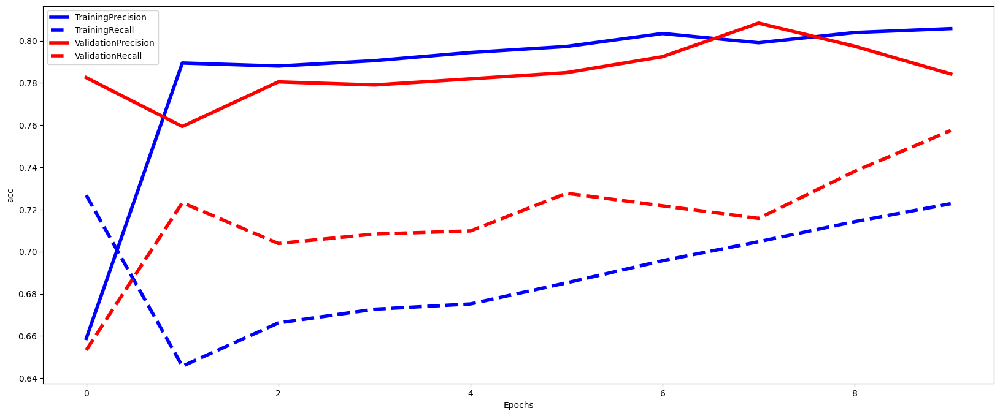

Epoch 1/10
991/991 - 6s - loss: 0.6470 - precision_64: 0.6462 - recall_64: 0.6953 - val_loss: 0.5732 - val_precision_64: 0.8004 - val_recall_64: 0.6274 - 6s/epoch - 6ms/step
Epoch 2/10
991/991 - 2s - loss: 0.5551 - precision_64: 0.8010 - recall_64: 0.6323 - val_loss: 0.5365 - val_precision_64: 0.7927 - val_recall_64: 0.6841 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 2s - loss: 0.5374 - precision_64: 0.7886 - recall_64: 0.6623 - val_loss: 0.5251 - val_precision_64: 0.8000 - val_recall_64: 0.6855 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 2s - loss: 0.5290 - precision_64: 0.7901 - recall_64: 0.6723 - val_loss: 0.5234 - val_precision_64: 0.8167 - val_recall_64: 0.6572 - 2s/epoch - 3ms/step
Epoch 5/10
991/991 - 2s - loss: 0.5242 - precision_64: 0.7960 - recall_64: 0.6733 - val_loss: 0.5127 - val_precision_64: 0.7990 - val_recall_64: 0.6870 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 4s - loss: 0.5194 - precision_64: 0.7930 - recall_64: 0.6763 - val_loss: 0.5098 - val_precision_64: 0.8049 - 

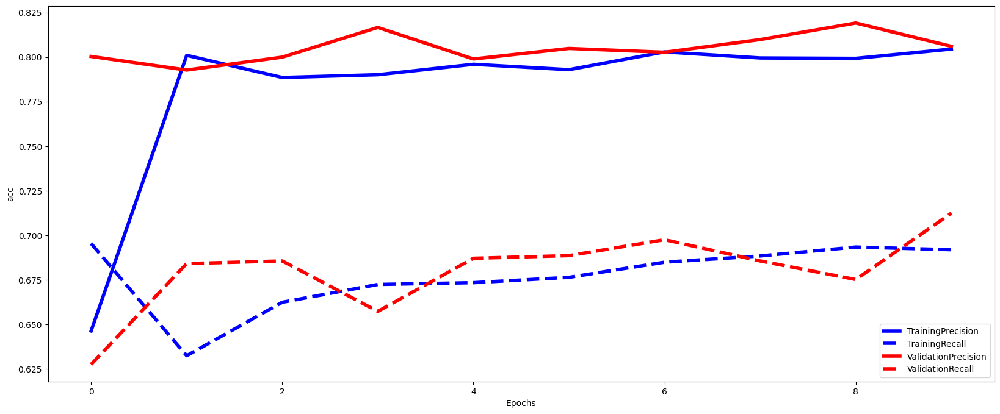

Average F1-Score over validation set is 0.77
STD of F1-Score over validation set is 0.00
42/42 [==============================] - 0s 5ms/step
Val: 4, Validation Score: 0.767, Test Score: 0.774


Epoch 1/10
496/496 - 4s - loss: 0.6589 - precision_65: 0.7156 - recall_65: 0.5611 - val_loss: 0.6076 - val_precision_65: 0.7724 - val_recall_65: 0.6052 - 4s/epoch - 8ms/step
Epoch 2/10
496/496 - 2s - loss: 0.5705 - precision_65: 0.7909 - recall_65: 0.6629 - val_loss: 0.5634 - val_precision_65: 0.7916 - val_recall_65: 0.6311 - 2s/epoch - 3ms/step
Epoch 3/10
496/496 - 1s - loss: 0.5451 - precision_65: 0.7947 - recall_65: 0.6748 - val_loss: 0.5547 - val_precision_65: 0.7647 - val_recall_65: 0.6540 - 1s/epoch - 3ms/step
Epoch 4/10
496/496 - 2s - loss: 0.5355 - precision_65: 0.7915 - recall_65: 0.6842 - val_loss: 0.5495 - val_precision_65: 0.7892 - val_recall_65: 0.6448 - 2s/epoch - 3ms/step
Epoch 5/10
496/496 - 1s - loss: 0.5278 - precision_65: 0.7947 - recall_65: 0.6842 - val_loss: 0.5420 - val_precision_65: 0.7824 - val_recall_65: 0.6524 - 1s/epoch - 3ms/step
Epoch 6/10
496/496 - 1s - loss: 0.5204 - precision_65: 0.7923 - recall_65: 0.6912 - val_loss: 0.5353 - val_precision_65: 0.7804 - 

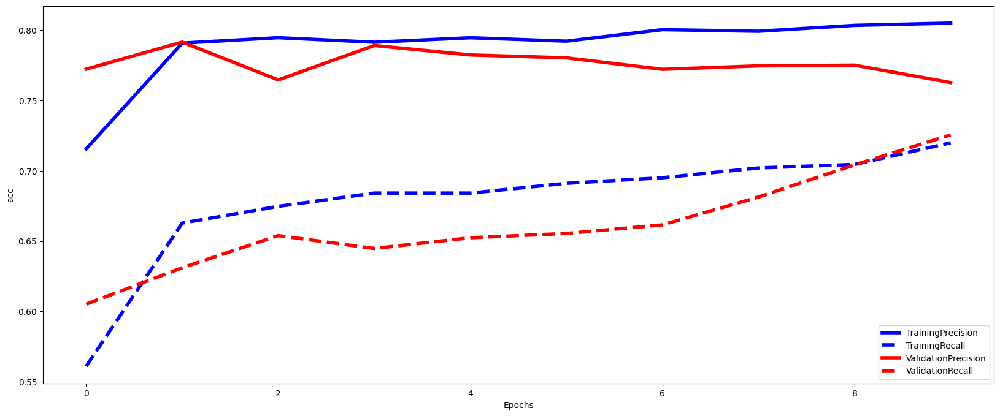

Epoch 1/10
496/496 - 3s - loss: 0.6549 - precision_66: 0.6677 - recall_66: 0.7209 - val_loss: 0.6073 - val_precision_66: 0.8099 - val_recall_66: 0.6095 - 3s/epoch - 5ms/step
Epoch 2/10
496/496 - 1s - loss: 0.5744 - precision_66: 0.7990 - recall_66: 0.6303 - val_loss: 0.5576 - val_precision_66: 0.7922 - val_recall_66: 0.6647 - 1s/epoch - 3ms/step
Epoch 3/10
496/496 - 1s - loss: 0.5500 - precision_66: 0.7953 - recall_66: 0.6588 - val_loss: 0.5451 - val_precision_66: 0.7899 - val_recall_66: 0.6557 - 1s/epoch - 2ms/step
Epoch 4/10
496/496 - 2s - loss: 0.5409 - precision_66: 0.7907 - recall_66: 0.6708 - val_loss: 0.5374 - val_precision_66: 0.7814 - val_recall_66: 0.6766 - 2s/epoch - 4ms/step
Epoch 5/10
496/496 - 2s - loss: 0.5342 - precision_66: 0.7900 - recall_66: 0.6773 - val_loss: 0.5287 - val_precision_66: 0.7863 - val_recall_66: 0.6692 - 2s/epoch - 5ms/step
Epoch 6/10
496/496 - 2s - loss: 0.5278 - precision_66: 0.7872 - recall_66: 0.6753 - val_loss: 0.5221 - val_precision_66: 0.7933 - 

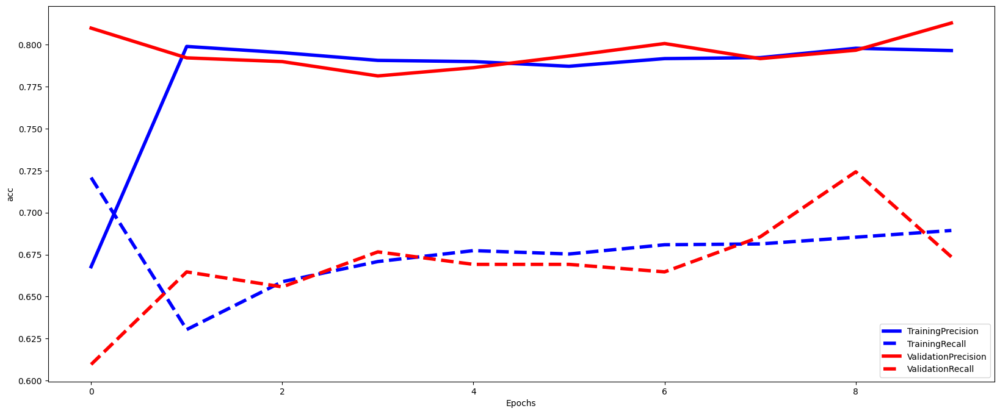

Epoch 1/10
496/496 - 4s - loss: 0.6628 - precision_67: 0.6337 - recall_67: 0.7352 - val_loss: 0.6086 - val_precision_67: 0.7736 - val_recall_67: 0.6964 - 4s/epoch - 7ms/step
Epoch 2/10
496/496 - 2s - loss: 0.5747 - precision_67: 0.7700 - recall_67: 0.6687 - val_loss: 0.5473 - val_precision_67: 0.7781 - val_recall_67: 0.6994 - 2s/epoch - 4ms/step
Epoch 3/10
496/496 - 2s - loss: 0.5477 - precision_67: 0.7810 - recall_67: 0.6657 - val_loss: 0.5345 - val_precision_67: 0.7824 - val_recall_67: 0.7009 - 2s/epoch - 3ms/step
Epoch 4/10
496/496 - 1s - loss: 0.5387 - precision_67: 0.7855 - recall_67: 0.6692 - val_loss: 0.5275 - val_precision_67: 0.7867 - val_recall_67: 0.7024 - 1s/epoch - 3ms/step
Epoch 5/10
496/496 - 1s - loss: 0.5314 - precision_67: 0.7877 - recall_67: 0.6722 - val_loss: 0.5221 - val_precision_67: 0.7787 - val_recall_67: 0.7068 - 1s/epoch - 3ms/step
Epoch 6/10
496/496 - 1s - loss: 0.5251 - precision_67: 0.7922 - recall_67: 0.6717 - val_loss: 0.5174 - val_precision_67: 0.7760 - 

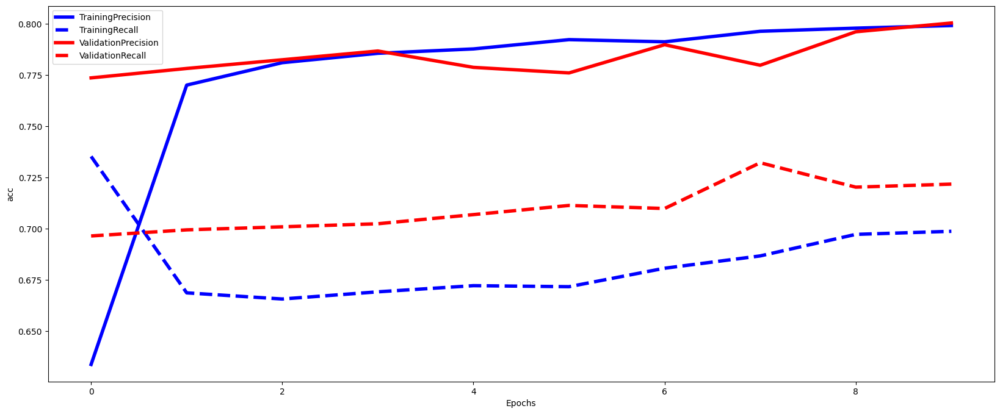

Epoch 1/10
496/496 - 4s - loss: 0.6695 - precision_68: 0.6093 - recall_68: 0.7974 - val_loss: 0.5971 - val_precision_68: 0.7824 - val_recall_68: 0.6379 - 4s/epoch - 7ms/step
Epoch 2/10
496/496 - 2s - loss: 0.5689 - precision_68: 0.7871 - recall_68: 0.6308 - val_loss: 0.5434 - val_precision_68: 0.7933 - val_recall_68: 0.6751 - 2s/epoch - 4ms/step
Epoch 3/10
496/496 - 2s - loss: 0.5444 - precision_68: 0.7875 - recall_68: 0.6598 - val_loss: 0.5323 - val_precision_68: 0.8056 - val_recall_68: 0.6483 - 2s/epoch - 4ms/step
Epoch 4/10
496/496 - 1s - loss: 0.5367 - precision_68: 0.7868 - recall_68: 0.6628 - val_loss: 0.5255 - val_precision_68: 0.8035 - val_recall_68: 0.6766 - 1s/epoch - 2ms/step
Epoch 5/10
496/496 - 2s - loss: 0.5309 - precision_68: 0.7945 - recall_68: 0.6693 - val_loss: 0.5203 - val_precision_68: 0.7983 - val_recall_68: 0.6841 - 2s/epoch - 3ms/step
Epoch 6/10
496/496 - 2s - loss: 0.5261 - precision_68: 0.7906 - recall_68: 0.6723 - val_loss: 0.5155 - val_precision_68: 0.8000 - 

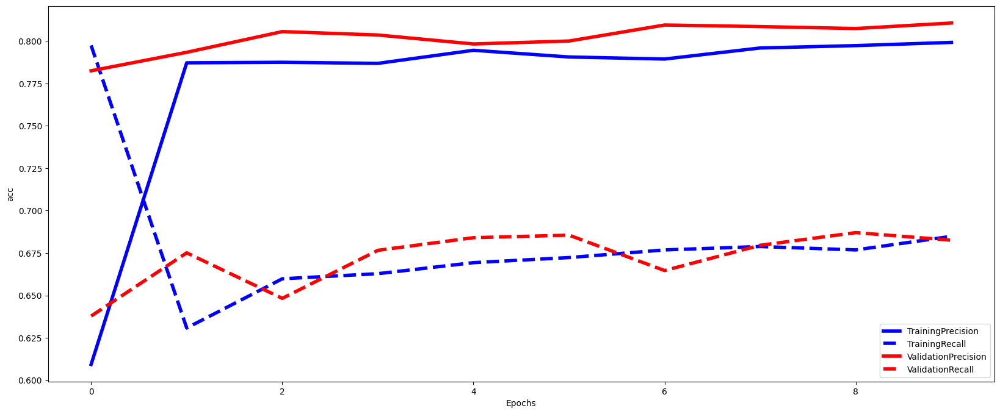

Average F1-Score over validation set is 0.76
STD of F1-Score over validation set is 0.01
42/42 [==============================] - 0s 2ms/step


Val: 8, Validation Score: 0.757, Test Score: 0.765
Epoch 1/10
331/331 - 2s - loss: 0.6611 - precision_69: 0.6503 - recall_69: 0.7026 - val_loss: 0.6297 - val_precision_69: 0.6355 - val_recall_69: 0.7576 - 2s/epoch - 6ms/step
Epoch 2/10
331/331 - 1s - loss: 0.5850 - precision_69: 0.7764 - recall_69: 0.6688 - val_loss: 0.5735 - val_precision_69: 0.7522 - val_recall_69: 0.6570 - 938ms/epoch - 3ms/step
Epoch 3/10
331/331 - 1s - loss: 0.5530 - precision_69: 0.7852 - recall_69: 0.6753 - val_loss: 0.5600 - val_precision_69: 0.7882 - val_recall_69: 0.6296 - 781ms/epoch - 2ms/step
Epoch 4/10
331/331 - 1s - loss: 0.5420 - precision_69: 0.7955 - recall_69: 0.6703 - val_loss: 0.5548 - val_precision_69: 0.7606 - val_recall_69: 0.6540 - 855ms/epoch - 3ms/step
Epoch 5/10
331/331 - 1s - loss: 0.5357 - precision_69: 0.7885 - recall_69: 0.6832 - val_loss: 0.5495 - val_precision_69: 0.7702 - val_recall_69: 0.6540 - 817ms/epoch - 2ms/step
Epoch 6/10
331/331 - 1s - loss: 0.5301 - precision_69: 0.7896 - rec

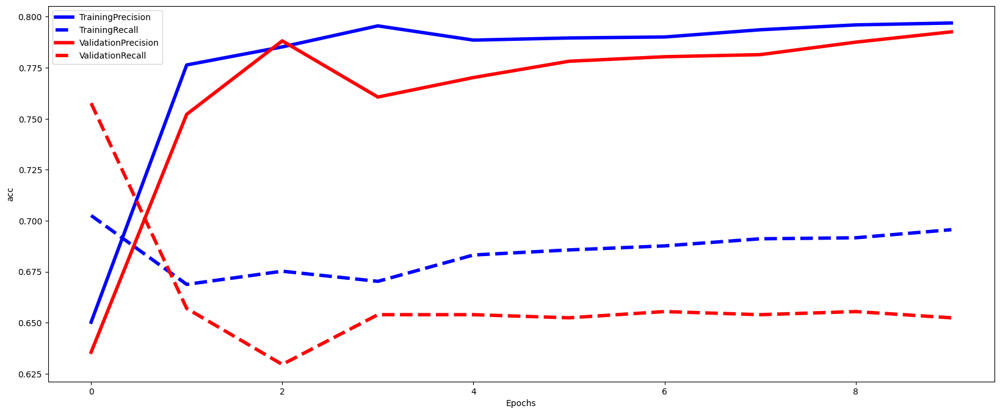

Epoch 1/10
331/331 - 2s - loss: 0.6776 - precision_70: 0.6029 - recall_70: 0.7989 - val_loss: 0.6461 - val_precision_70: 0.6537 - val_recall_70: 0.8018 - 2s/epoch - 7ms/step
Epoch 2/10
331/331 - 1s - loss: 0.6032 - precision_70: 0.7630 - recall_70: 0.6668 - val_loss: 0.5765 - val_precision_70: 0.8180 - val_recall_70: 0.5961 - 940ms/epoch - 3ms/step
Epoch 3/10
331/331 - 1s - loss: 0.5588 - precision_70: 0.7966 - recall_70: 0.6503 - val_loss: 0.5529 - val_precision_70: 0.8096 - val_recall_70: 0.6274 - 802ms/epoch - 2ms/step
Epoch 4/10
331/331 - 1s - loss: 0.5465 - precision_70: 0.7920 - recall_70: 0.6668 - val_loss: 0.5431 - val_precision_70: 0.7812 - val_recall_70: 0.6811 - 766ms/epoch - 2ms/step
Epoch 5/10
331/331 - 1s - loss: 0.5395 - precision_70: 0.7870 - recall_70: 0.6748 - val_loss: 0.5350 - val_precision_70: 0.7898 - val_recall_70: 0.6721 - 933ms/epoch - 3ms/step
Epoch 6/10
331/331 - 1s - loss: 0.5339 - precision_70: 0.7848 - recall_70: 0.6803 - val_loss: 0.5293 - val_precision_7

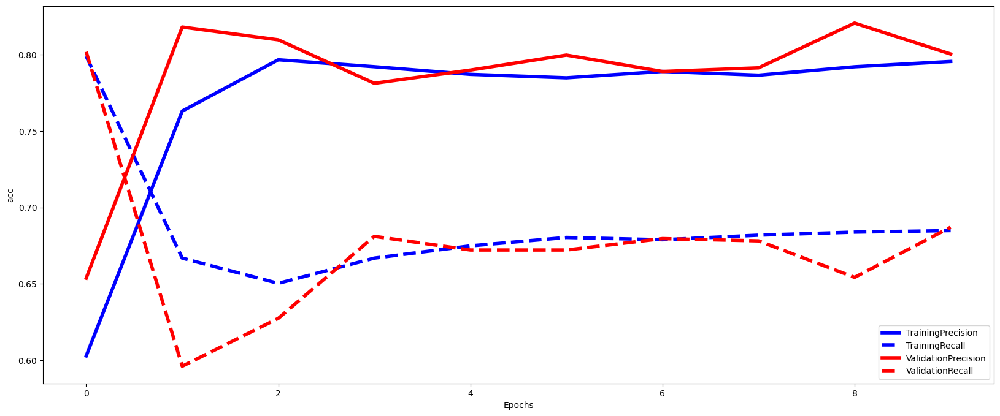

Epoch 1/10
331/331 - 3s - loss: 0.6675 - precision_71: 0.7150 - recall_71: 0.5826 - val_loss: 0.6296 - val_precision_71: 0.7798 - val_recall_71: 0.6533 - 3s/epoch - 9ms/step
Epoch 2/10
331/331 - 1s - loss: 0.5949 - precision_71: 0.7871 - recall_71: 0.6346 - val_loss: 0.5638 - val_precision_71: 0.7665 - val_recall_71: 0.7083 - 1s/epoch - 4ms/step
Epoch 3/10
331/331 - 1s - loss: 0.5575 - precision_71: 0.7809 - recall_71: 0.6602 - val_loss: 0.5425 - val_precision_71: 0.8003 - val_recall_71: 0.6920 - 1s/epoch - 4ms/step
Epoch 4/10
331/331 - 1s - loss: 0.5450 - precision_71: 0.7904 - recall_71: 0.6627 - val_loss: 0.5352 - val_precision_71: 0.7694 - val_recall_71: 0.7098 - 1s/epoch - 4ms/step
Epoch 5/10
331/331 - 1s - loss: 0.5378 - precision_71: 0.7882 - recall_71: 0.6707 - val_loss: 0.5297 - val_precision_71: 0.7722 - val_recall_71: 0.7113 - 797ms/epoch - 2ms/step
Epoch 6/10
331/331 - 1s - loss: 0.5321 - precision_71: 0.7881 - recall_71: 0.6722 - val_loss: 0.5228 - val_precision_71: 0.7831

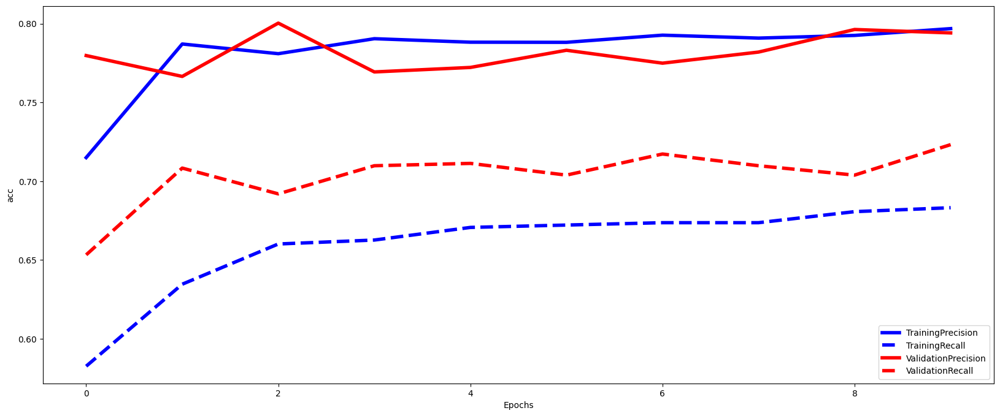

Epoch 1/10
331/331 - 3s - loss: 0.6590 - precision_72: 0.7255 - recall_72: 0.5408 - val_loss: 0.6137 - val_precision_72: 0.7566 - val_recall_72: 0.7273 - 3s/epoch - 9ms/step
Epoch 2/10
331/331 - 1s - loss: 0.5853 - precision_72: 0.7825 - recall_72: 0.6443 - val_loss: 0.5573 - val_precision_72: 0.8008 - val_recall_72: 0.6230 - 1s/epoch - 4ms/step
Epoch 3/10
331/331 - 1s - loss: 0.5549 - precision_72: 0.7927 - recall_72: 0.6543 - val_loss: 0.5417 - val_precision_72: 0.8021 - val_recall_72: 0.6706 - 1s/epoch - 3ms/step
Epoch 4/10
331/331 - 1s - loss: 0.5452 - precision_72: 0.7905 - recall_72: 0.6608 - val_loss: 0.5344 - val_precision_72: 0.7945 - val_recall_72: 0.6855 - 1s/epoch - 4ms/step
Epoch 5/10
331/331 - 1s - loss: 0.5390 - precision_72: 0.7870 - recall_72: 0.6708 - val_loss: 0.5280 - val_precision_72: 0.7962 - val_recall_72: 0.6870 - 1s/epoch - 4ms/step
Epoch 6/10
331/331 - 1s - loss: 0.5322 - precision_72: 0.7869 - recall_72: 0.6743 - val_loss: 0.5294 - val_precision_72: 0.7870 - 

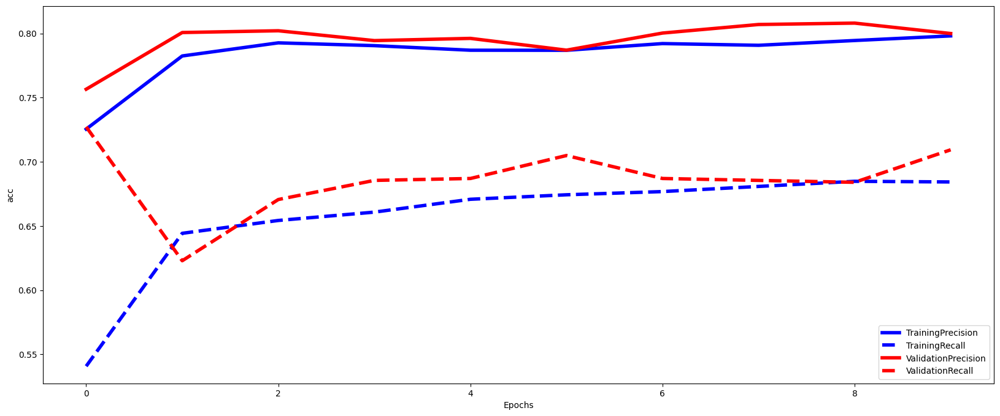

Average F1-Score over validation set is 0.75
STD of F1-Score over validation set is 0.01
42/42 [==============================] - 0s 3ms/step


Val: 12, Validation Score: 0.755, Test Score: 0.759
Epoch 1/10
248/248 - 3s - loss: 0.6651 - precision_73: 0.6996 - recall_73: 0.5770 - val_loss: 0.6329 - val_precision_73: 0.7695 - val_recall_73: 0.6159 - 3s/epoch - 13ms/step
Epoch 2/10
248/248 - 1s - loss: 0.5993 - precision_73: 0.7832 - recall_73: 0.6619 - val_loss: 0.5807 - val_precision_73: 0.7757 - val_recall_73: 0.6326 - 886ms/epoch - 4ms/step
Epoch 3/10
248/248 - 1s - loss: 0.5614 - precision_73: 0.7885 - recall_73: 0.6738 - val_loss: 0.5641 - val_precision_73: 0.7575 - val_recall_73: 0.6570 - 864ms/epoch - 3ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5472 - precision_73: 0.7860 - recall_73: 0.6837 - val_loss: 0.5576 - val_precision_73: 0.7827 - val_recall_73: 0.6479 - 1s/epoch - 4ms/step
Epoch 5/10
248/248 - 2s - loss: 0.5396 - precision_73: 0.7957 - recall_73: 0.6807 - val_loss: 0.5522 - val_precision_73: 0.7665 - val_recall_73: 0.6555 - 2s/epoch - 7ms/step
Epoch 6/10
248/248 - 2s - loss: 0.5330 - precision_73: 0.7877 - recall_

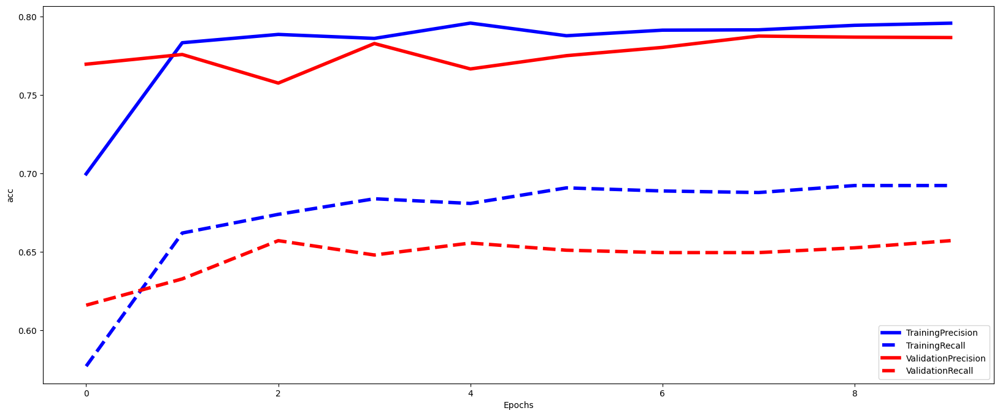

Epoch 1/10
248/248 - 2s - loss: 0.6902 - precision_74: 0.5617 - recall_74: 0.8499 - val_loss: 0.6605 - val_precision_74: 0.7932 - val_recall_74: 0.6230 - 2s/epoch - 7ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6258 - precision_74: 0.7425 - recall_74: 0.6723 - val_loss: 0.5922 - val_precision_74: 0.7989 - val_recall_74: 0.6215 - 608ms/epoch - 2ms/step
Epoch 3/10
248/248 - 1s - loss: 0.5687 - precision_74: 0.7810 - recall_74: 0.6403 - val_loss: 0.5589 - val_precision_74: 0.8133 - val_recall_74: 0.6036 - 1s/epoch - 4ms/step
Epoch 4/10
248/248 - 2s - loss: 0.5477 - precision_74: 0.7936 - recall_74: 0.6423 - val_loss: 0.5443 - val_precision_74: 0.8004 - val_recall_74: 0.6632 - 2s/epoch - 7ms/step
Epoch 5/10
248/248 - 3s - loss: 0.5398 - precision_74: 0.7919 - recall_74: 0.6643 - val_loss: 0.5378 - val_precision_74: 0.7979 - val_recall_74: 0.6647 - 3s/epoch - 11ms/step
Epoch 6/10
248/248 - 2s - loss: 0.5350 - precision_74: 0.7924 - recall_74: 0.6758 - val_loss: 0.5367 - val_precision_74: 0.813

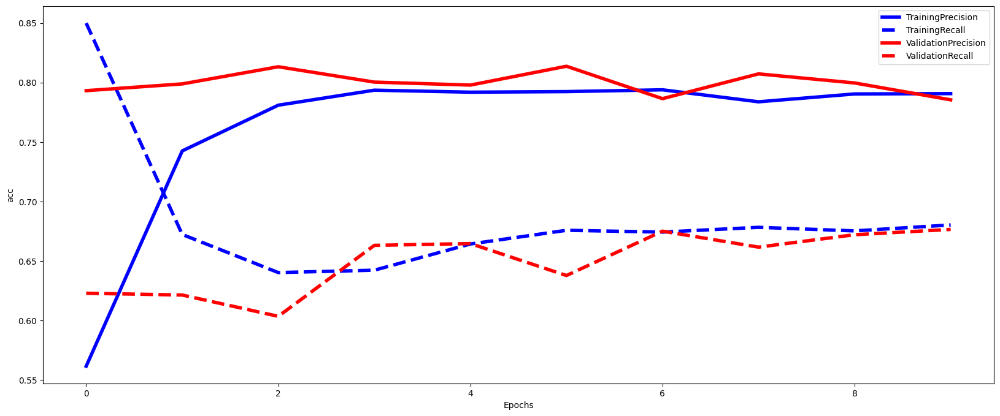

Epoch 1/10
248/248 - 5s - loss: 0.6937 - precision_75: 0.5626 - recall_75: 0.8749 - val_loss: 0.6602 - val_precision_75: 0.5564 - val_recall_75: 0.8810 - 5s/epoch - 18ms/step
Epoch 2/10
248/248 - 1s - loss: 0.6317 - precision_75: 0.6952 - recall_75: 0.7317 - val_loss: 0.5973 - val_precision_75: 0.7551 - val_recall_75: 0.7158 - 1s/epoch - 4ms/step
Epoch 3/10
248/248 - 1s - loss: 0.5780 - precision_75: 0.7779 - recall_75: 0.6451 - val_loss: 0.5545 - val_precision_75: 0.7741 - val_recall_75: 0.7039 - 1s/epoch - 5ms/step
Epoch 4/10
248/248 - 1s - loss: 0.5513 - precision_75: 0.7898 - recall_75: 0.6562 - val_loss: 0.5376 - val_precision_75: 0.7962 - val_recall_75: 0.6860 - 1s/epoch - 5ms/step
Epoch 5/10
248/248 - 1s - loss: 0.5405 - precision_75: 0.7837 - recall_75: 0.6672 - val_loss: 0.5318 - val_precision_75: 0.8007 - val_recall_75: 0.6696 - 690ms/epoch - 3ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5352 - precision_75: 0.7936 - recall_75: 0.6657 - val_loss: 0.5268 - val_precision_75: 0.771

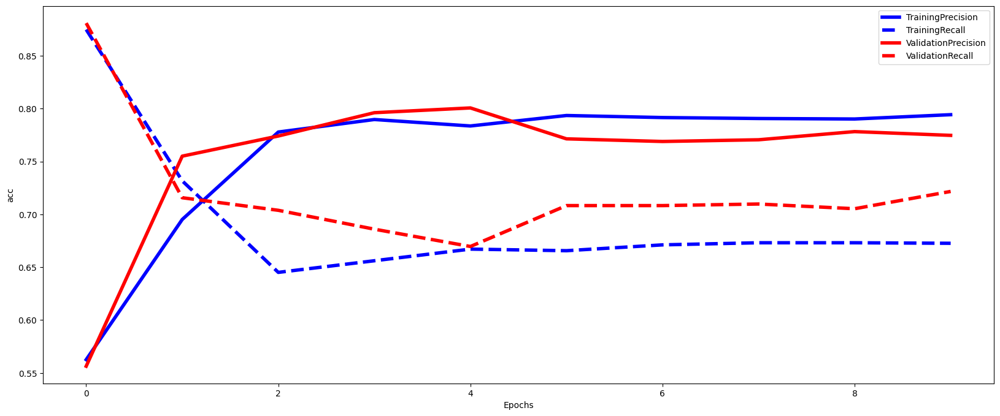

Epoch 1/10
248/248 - 2s - loss: 0.6711 - precision_76: 0.5973 - recall_76: 0.8154 - val_loss: 0.6364 - val_precision_76: 0.7700 - val_recall_76: 0.6885 - 2s/epoch - 10ms/step
Epoch 2/10
248/248 - 2s - loss: 0.6043 - precision_76: 0.7566 - recall_76: 0.6763 - val_loss: 0.5716 - val_precision_76: 0.7370 - val_recall_76: 0.7601 - 2s/epoch - 9ms/step
Epoch 3/10
248/248 - 2s - loss: 0.5603 - precision_76: 0.7763 - recall_76: 0.6563 - val_loss: 0.5455 - val_precision_76: 0.7787 - val_recall_76: 0.6870 - 2s/epoch - 10ms/step
Epoch 4/10
248/248 - 2s - loss: 0.5467 - precision_76: 0.7831 - recall_76: 0.6628 - val_loss: 0.5347 - val_precision_76: 0.7982 - val_recall_76: 0.6781 - 2s/epoch - 6ms/step
Epoch 5/10
248/248 - 1s - loss: 0.5402 - precision_76: 0.7894 - recall_76: 0.6713 - val_loss: 0.5292 - val_precision_76: 0.7997 - val_recall_76: 0.6841 - 1s/epoch - 4ms/step
Epoch 6/10
248/248 - 1s - loss: 0.5353 - precision_76: 0.7832 - recall_76: 0.6723 - val_loss: 0.5265 - val_precision_76: 0.8076 

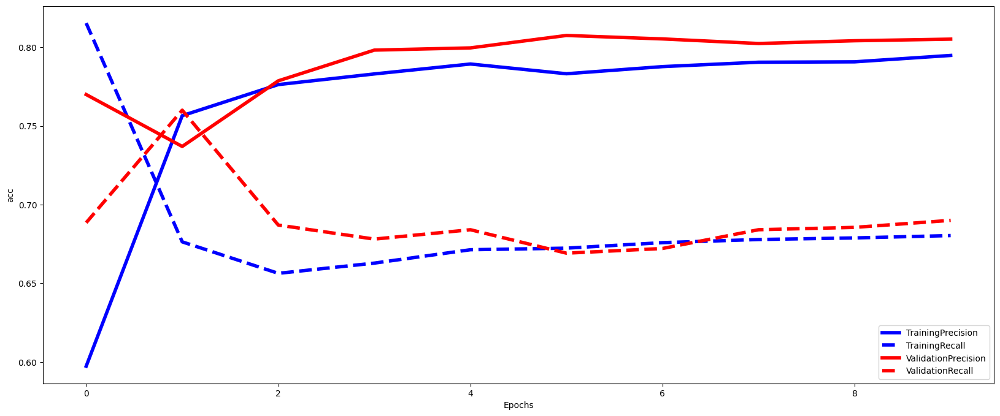

Average F1-Score over validation set is 0.75
STD of F1-Score over validation set is 0.01
42/42 [==============================] - 0s 2ms/step


Val: 16, Validation Score: 0.747, Test Score: 0.751
Epoch 1/10
166/166 - 2s - loss: 0.9125 - precision_77: 0.5082 - recall_77: 1.0000 - val_loss: 0.7267 - val_precision_77: 0.4966 - val_recall_77: 1.0000 - 2s/epoch - 9ms/step
Epoch 2/10
166/166 - 1s - loss: 0.6942 - precision_77: 0.5082 - recall_77: 1.0000 - val_loss: 0.6824 - val_precision_77: 0.4966 - val_recall_77: 1.0000 - 502ms/epoch - 3ms/step
Epoch 3/10
166/166 - 0s - loss: 0.6691 - precision_77: 0.5148 - recall_77: 0.9856 - val_loss: 0.6606 - val_precision_77: 0.5336 - val_recall_77: 0.8963 - 489ms/epoch - 3ms/step
Epoch 4/10
166/166 - 1s - loss: 0.6433 - precision_77: 0.5925 - recall_77: 0.8347 - val_loss: 0.6318 - val_precision_77: 0.6468 - val_recall_77: 0.7790 - 519ms/epoch - 3ms/step
Epoch 5/10
166/166 - 0s - loss: 0.6102 - precision_77: 0.6947 - recall_77: 0.7582 - val_loss: 0.5989 - val_precision_77: 0.7692 - val_recall_77: 0.6707 - 447ms/epoch - 3ms/step
Epoch 6/10
166/166 - 0s - loss: 0.5790 - precision_77: 0.7796 - re

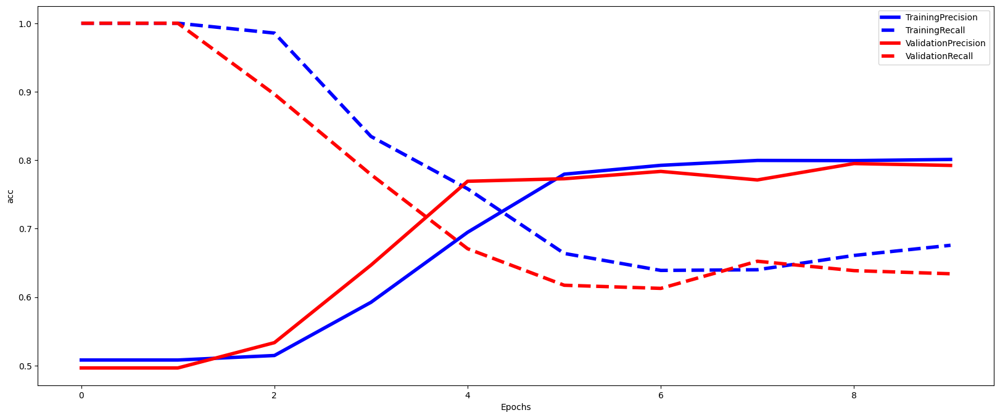

Epoch 1/10
166/166 - 2s - loss: 0.6853 - precision_78: 0.5864 - recall_78: 0.4127 - val_loss: 0.6718 - val_precision_78: 0.8230 - val_recall_78: 0.5753 - 2s/epoch - 14ms/step
Epoch 2/10
166/166 - 1s - loss: 0.6505 - precision_78: 0.7692 - recall_78: 0.6418 - val_loss: 0.6262 - val_precision_78: 0.8004 - val_recall_78: 0.6155 - 617ms/epoch - 4ms/step
Epoch 3/10
166/166 - 1s - loss: 0.6014 - precision_78: 0.7848 - recall_78: 0.6313 - val_loss: 0.5823 - val_precision_78: 0.8027 - val_recall_78: 0.6185 - 623ms/epoch - 4ms/step
Epoch 4/10
166/166 - 1s - loss: 0.5687 - precision_78: 0.7877 - recall_78: 0.6383 - val_loss: 0.5629 - val_precision_78: 0.8127 - val_recall_78: 0.6080 - 650ms/epoch - 4ms/step
Epoch 5/10
166/166 - 0s - loss: 0.5545 - precision_78: 0.7908 - recall_78: 0.6563 - val_loss: 0.5531 - val_precision_78: 0.8125 - val_recall_78: 0.6200 - 449ms/epoch - 3ms/step
Epoch 6/10
166/166 - 0s - loss: 0.5474 - precision_78: 0.7877 - recall_78: 0.6663 - val_loss: 0.5447 - val_precision_

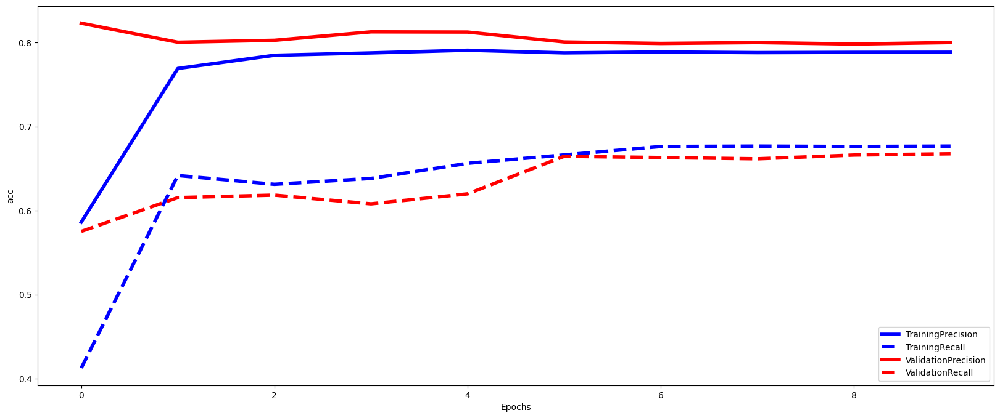

Epoch 1/10
166/166 - 2s - loss: 0.7029 - precision_79: 0.7380 - recall_79: 0.2157 - val_loss: 0.6729 - val_precision_79: 0.8437 - val_recall_79: 0.4658 - 2s/epoch - 14ms/step
Epoch 2/10
166/166 - 1s - loss: 0.6532 - precision_79: 0.7241 - recall_79: 0.6817 - val_loss: 0.6304 - val_precision_79: 0.7418 - val_recall_79: 0.7440 - 1s/epoch - 7ms/step
Epoch 3/10
166/166 - 1s - loss: 0.6095 - precision_79: 0.7646 - recall_79: 0.6732 - val_loss: 0.5915 - val_precision_79: 0.7007 - val_recall_79: 0.7768 - 1s/epoch - 9ms/step
Epoch 4/10
166/166 - 1s - loss: 0.5775 - precision_79: 0.7632 - recall_79: 0.6777 - val_loss: 0.5626 - val_precision_79: 0.7807 - val_recall_79: 0.6994 - 1s/epoch - 8ms/step
Epoch 5/10
166/166 - 1s - loss: 0.5611 - precision_79: 0.7760 - recall_79: 0.6712 - val_loss: 0.5507 - val_precision_79: 0.7869 - val_recall_79: 0.6979 - 1s/epoch - 7ms/step
Epoch 6/10
166/166 - 1s - loss: 0.5528 - precision_79: 0.7813 - recall_79: 0.6707 - val_loss: 0.5437 - val_precision_79: 0.7715 -

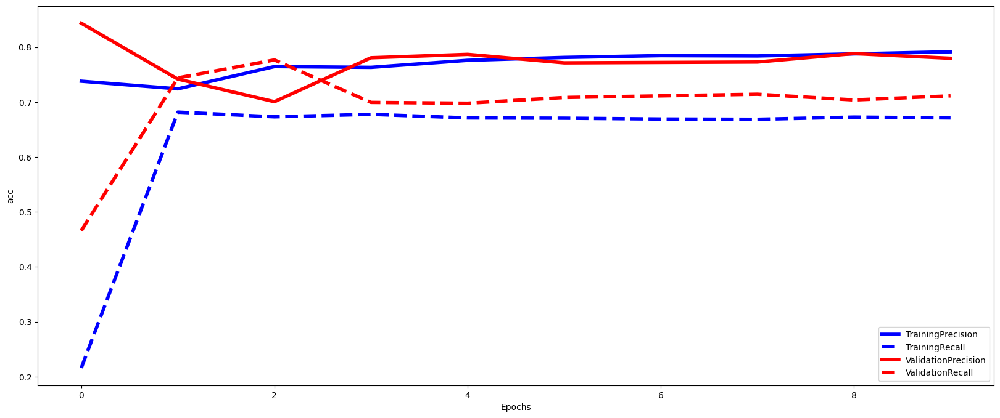

Epoch 1/10
166/166 - 3s - loss: 0.6798 - precision_80: 0.6252 - recall_80: 0.6818 - val_loss: 0.6594 - val_precision_80: 0.7861 - val_recall_80: 0.6244 - 3s/epoch - 16ms/step
Epoch 2/10
166/166 - 1s - loss: 0.6342 - precision_80: 0.7371 - recall_80: 0.6648 - val_loss: 0.6010 - val_precision_80: 0.7845 - val_recall_80: 0.6349 - 1s/epoch - 7ms/step
Epoch 3/10
166/166 - 0s - loss: 0.5839 - precision_80: 0.7830 - recall_80: 0.6353 - val_loss: 0.5624 - val_precision_80: 0.7966 - val_recall_80: 0.6244 - 437ms/epoch - 3ms/step
Epoch 4/10
166/166 - 1s - loss: 0.5589 - precision_80: 0.7892 - recall_80: 0.6518 - val_loss: 0.5460 - val_precision_80: 0.8051 - val_recall_80: 0.6528 - 519ms/epoch - 3ms/step
Epoch 5/10
166/166 - 0s - loss: 0.5498 - precision_80: 0.7881 - recall_80: 0.6643 - val_loss: 0.5409 - val_precision_80: 0.7844 - val_recall_80: 0.6885 - 484ms/epoch - 3ms/step
Epoch 6/10
166/166 - 0s - loss: 0.5440 - precision_80: 0.7828 - recall_80: 0.6743 - val_loss: 0.5363 - val_precision_80:

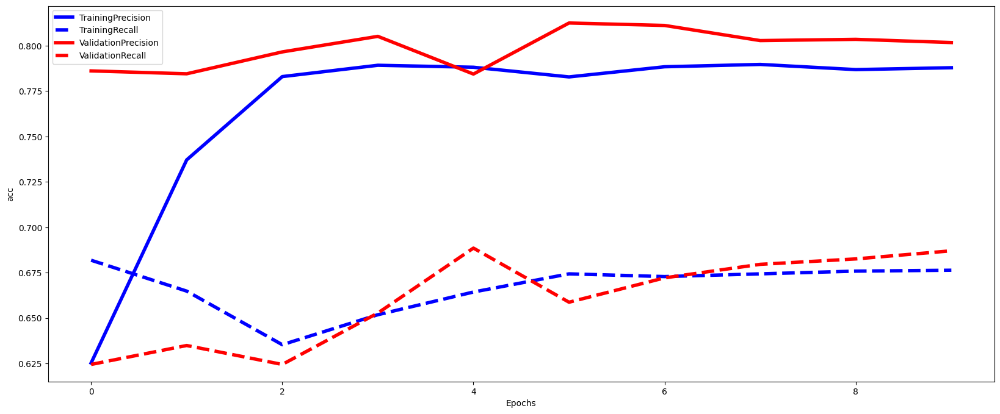

Average F1-Score over validation set is 0.75
STD of F1-Score over validation set is 0.01
42/42 [==============================] - 0s 3ms/step
Val: 24, Validation Score: 0.746, Test Score: 0.749


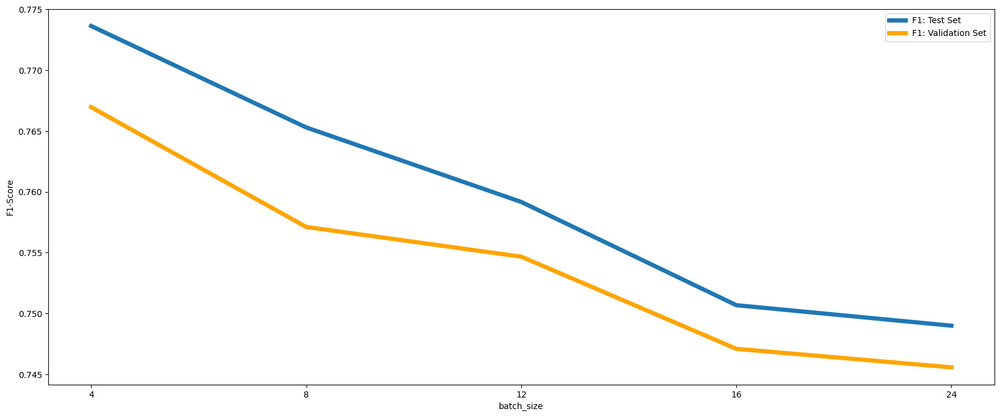

In [63]:
model,best_batch_size = evaluate_efect_param(parameter_type='training_params',parameter_name='batch_size', values_list=[4,8,12,16,24])
kfold_params['training_params']['batch_size'] = best_batch_size


## so, batch size of 4 gives the best result. it make sense as or data is relatively small in size and we need more backpropagation steps.

## as you can see, our overall result is getting better because as soon as we find the best value for a parameter, we add it to defult Kfold params and using it in investigation of best value for other parameters.

## choosing best Activation Function:



Epoch 1/10
991/991 - 4s - loss: 0.5484 - precision_83: 0.7316 - recall_83: 0.6941 - val_loss: 0.5276 - val_precision_83: 0.7734 - val_recall_83: 0.6555 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 2s - loss: 0.5002 - precision_83: 0.7919 - recall_83: 0.6991 - val_loss: 0.5037 - val_precision_83: 0.8085 - val_recall_83: 0.6372 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 4s - loss: 0.4774 - precision_83: 0.8031 - recall_83: 0.7190 - val_loss: 0.4891 - val_precision_83: 0.7947 - val_recall_83: 0.6433 - 4s/epoch - 4ms/step
Epoch 4/10
991/991 - 4s - loss: 0.4624 - precision_83: 0.8022 - recall_83: 0.7329 - val_loss: 0.4760 - val_precision_83: 0.7823 - val_recall_83: 0.7393 - 4s/epoch - 4ms/step
Epoch 5/10
991/991 - 2s - loss: 0.4522 - precision_83: 0.8016 - recall_83: 0.7542 - val_loss: 0.4658 - val_precision_83: 0.7868 - val_recall_83: 0.7256 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 3s - loss: 0.4479 - precision_83: 0.8014 - recall_83: 0.7651 - val_loss: 0.4588 - val_precision_83: 0.8020 - 

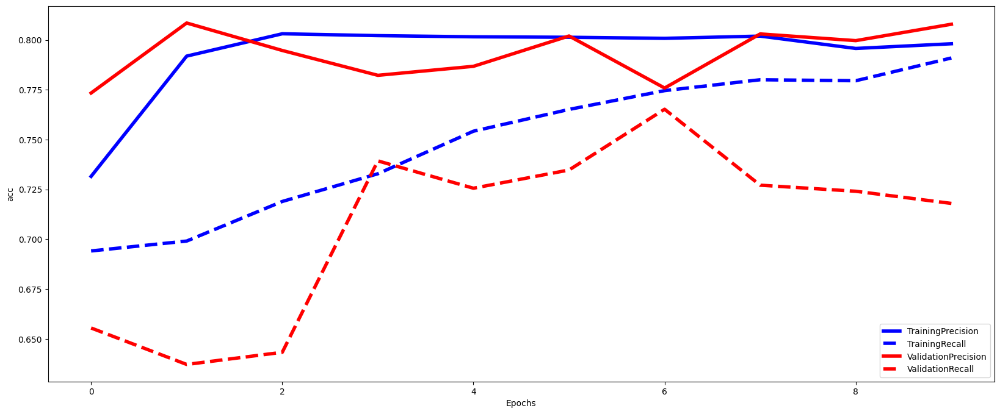

Epoch 1/10
991/991 - 8s - loss: 0.5510 - precision_84: 0.7524 - recall_84: 0.6628 - val_loss: 0.5183 - val_precision_84: 0.7870 - val_recall_84: 0.6662 - 8s/epoch - 9ms/step
Epoch 2/10
991/991 - 2s - loss: 0.5042 - precision_84: 0.7994 - recall_84: 0.6818 - val_loss: 0.4896 - val_precision_84: 0.7893 - val_recall_84: 0.7034 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 2s - loss: 0.4815 - precision_84: 0.7965 - recall_84: 0.7149 - val_loss: 0.4688 - val_precision_84: 0.8280 - val_recall_84: 0.6960 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 4s - loss: 0.4686 - precision_84: 0.8025 - recall_84: 0.7279 - val_loss: 0.4629 - val_precision_84: 0.7820 - val_recall_84: 0.8018 - 4s/epoch - 4ms/step
Epoch 5/10
991/991 - 3s - loss: 0.4631 - precision_84: 0.7933 - recall_84: 0.7449 - val_loss: 0.4602 - val_precision_84: 0.8457 - val_recall_84: 0.6453 - 3s/epoch - 3ms/step
Epoch 6/10
991/991 - 2s - loss: 0.4559 - precision_84: 0.7965 - recall_84: 0.7459 - val_loss: 0.4435 - val_precision_84: 0.7792 - 

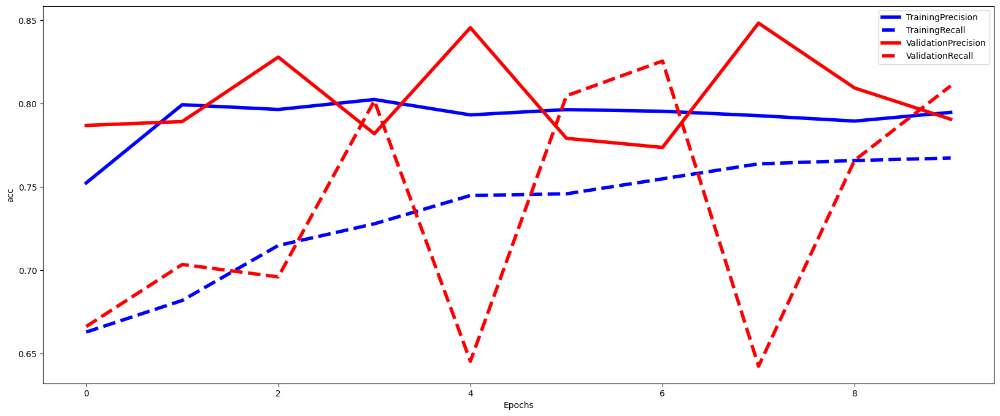

Epoch 1/10
991/991 - 8s - loss: 0.5878 - precision_85: 0.7860 - recall_85: 0.5976 - val_loss: 0.5232 - val_precision_85: 0.7689 - val_recall_85: 0.7128 - 8s/epoch - 8ms/step
Epoch 2/10
991/991 - 2s - loss: 0.5056 - precision_85: 0.8005 - recall_85: 0.6907 - val_loss: 0.4876 - val_precision_85: 0.8066 - val_recall_85: 0.7321 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 2s - loss: 0.4743 - precision_85: 0.7991 - recall_85: 0.7287 - val_loss: 0.4723 - val_precision_85: 0.7740 - val_recall_85: 0.7693 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 2s - loss: 0.4573 - precision_85: 0.7933 - recall_85: 0.7432 - val_loss: 0.4687 - val_precision_85: 0.7623 - val_recall_85: 0.8304 - 2s/epoch - 2ms/step
Epoch 5/10
991/991 - 2s - loss: 0.4496 - precision_85: 0.7960 - recall_85: 0.7693 - val_loss: 0.4565 - val_precision_85: 0.7883 - val_recall_85: 0.7812 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 4s - loss: 0.4435 - precision_85: 0.8006 - recall_85: 0.7738 - val_loss: 0.4608 - val_precision_85: 0.7818 - 

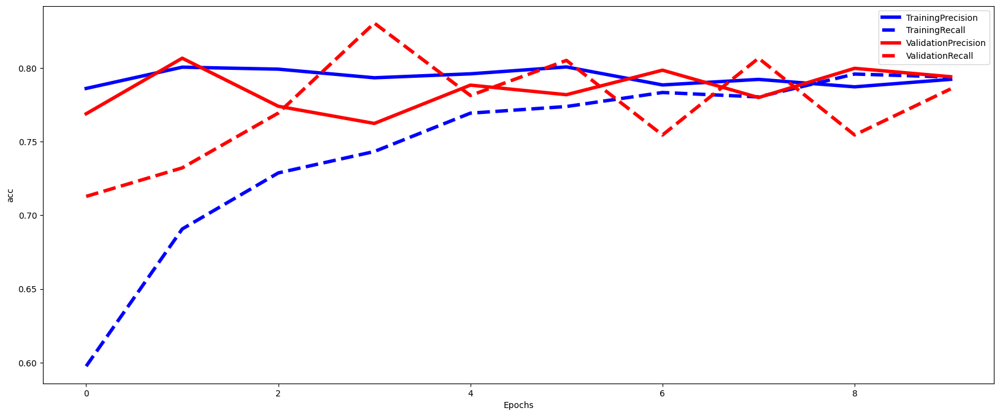

Epoch 1/10
991/991 - 4s - loss: 0.5610 - precision_86: 0.7902 - recall_86: 0.6123 - val_loss: 0.5179 - val_precision_86: 0.7792 - val_recall_86: 0.7049 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 4s - loss: 0.5100 - precision_86: 0.7998 - recall_86: 0.6693 - val_loss: 0.4912 - val_precision_86: 0.7954 - val_recall_86: 0.7183 - 4s/epoch - 4ms/step
Epoch 3/10
991/991 - 2s - loss: 0.4850 - precision_86: 0.8016 - recall_86: 0.6973 - val_loss: 0.4634 - val_precision_86: 0.7971 - val_recall_86: 0.7317 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 2s - loss: 0.4662 - precision_86: 0.8017 - recall_86: 0.7279 - val_loss: 0.4522 - val_precision_86: 0.8063 - val_recall_86: 0.7258 - 2s/epoch - 2ms/step
Epoch 5/10
991/991 - 2s - loss: 0.4575 - precision_86: 0.7954 - recall_86: 0.7469 - val_loss: 0.4420 - val_precision_86: 0.7956 - val_recall_86: 0.7541 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 2s - loss: 0.4493 - precision_86: 0.7931 - recall_86: 0.7669 - val_loss: 0.4472 - val_precision_86: 0.7702 - 

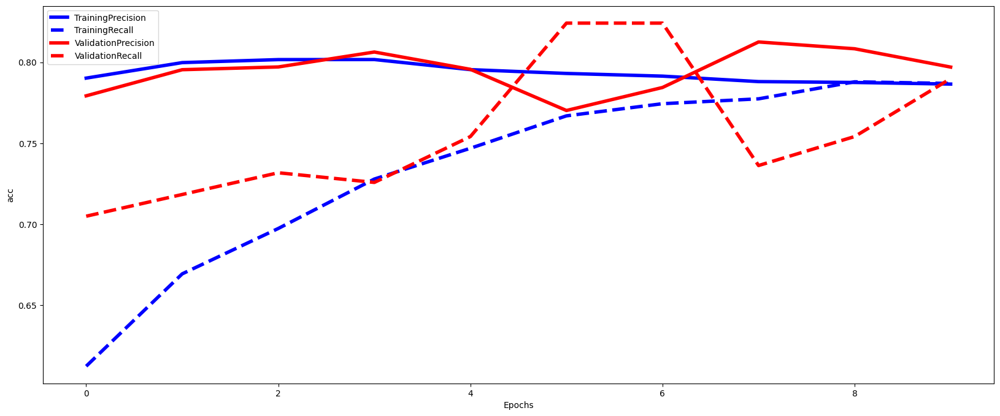

Average F1-Score over validation set is 0.79
STD of F1-Score over validation set is 0.01
42/42 [==============================] - 0s 2ms/step


Val: relu, Validation Score: 0.787, Test Score: 0.786
Epoch 1/10
991/991 - 4s - loss: 0.5457 - precision_87: 0.7754 - recall_87: 0.6668 - val_loss: 0.5225 - val_precision_87: 0.7897 - val_recall_87: 0.6524 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 2s - loss: 0.4941 - precision_87: 0.8061 - recall_87: 0.7041 - val_loss: 0.4959 - val_precision_87: 0.7877 - val_recall_87: 0.7012 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 3s - loss: 0.4679 - precision_87: 0.8030 - recall_87: 0.7185 - val_loss: 0.4763 - val_precision_87: 0.7933 - val_recall_87: 0.6905 - 3s/epoch - 3ms/step
Epoch 4/10
991/991 - 4s - loss: 0.4537 - precision_87: 0.8045 - recall_87: 0.7517 - val_loss: 0.4671 - val_precision_87: 0.7908 - val_recall_87: 0.7378 - 4s/epoch - 4ms/step
Epoch 5/10
991/991 - 2s - loss: 0.4481 - precision_87: 0.7945 - recall_87: 0.7676 - val_loss: 0.4654 - val_precision_87: 0.8000 - val_recall_87: 0.7073 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 2s - loss: 0.4422 - precision_87: 0.7959 - recall_87: 0

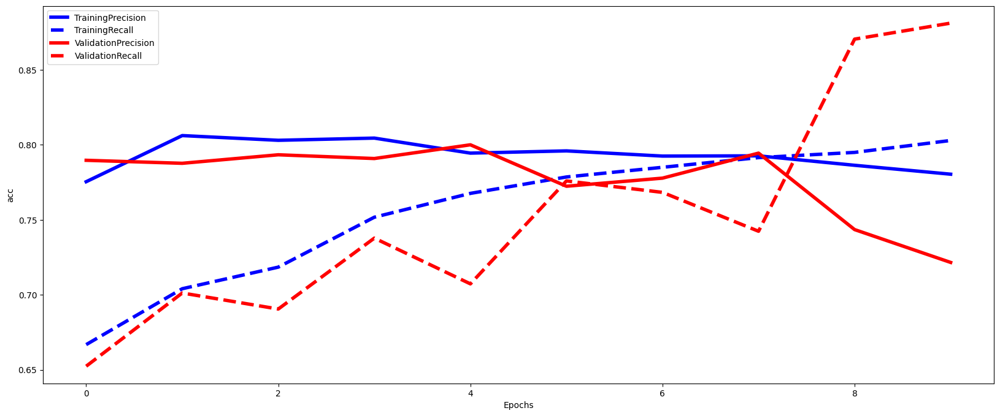

Epoch 1/10
991/991 - 5s - loss: 0.5586 - precision_88: 0.7621 - recall_88: 0.6633 - val_loss: 0.5405 - val_precision_88: 0.8242 - val_recall_88: 0.6289 - 5s/epoch - 5ms/step
Epoch 2/10
991/991 - 2s - loss: 0.5095 - precision_88: 0.7948 - recall_88: 0.6918 - val_loss: 0.4834 - val_precision_88: 0.8038 - val_recall_88: 0.6960 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 2s - loss: 0.4813 - precision_88: 0.7963 - recall_88: 0.7179 - val_loss: 0.4559 - val_precision_88: 0.8042 - val_recall_88: 0.7407 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 3s - loss: 0.4616 - precision_88: 0.7894 - recall_88: 0.7539 - val_loss: 0.4445 - val_precision_88: 0.8210 - val_recall_88: 0.7109 - 3s/epoch - 3ms/step
Epoch 5/10
991/991 - 4s - loss: 0.4558 - precision_88: 0.7885 - recall_88: 0.7629 - val_loss: 0.4433 - val_precision_88: 0.8228 - val_recall_88: 0.7198 - 4s/epoch - 4ms/step
Epoch 6/10
991/991 - 3s - loss: 0.4522 - precision_88: 0.7833 - recall_88: 0.7629 - val_loss: 0.4272 - val_precision_88: 0.7946 - 

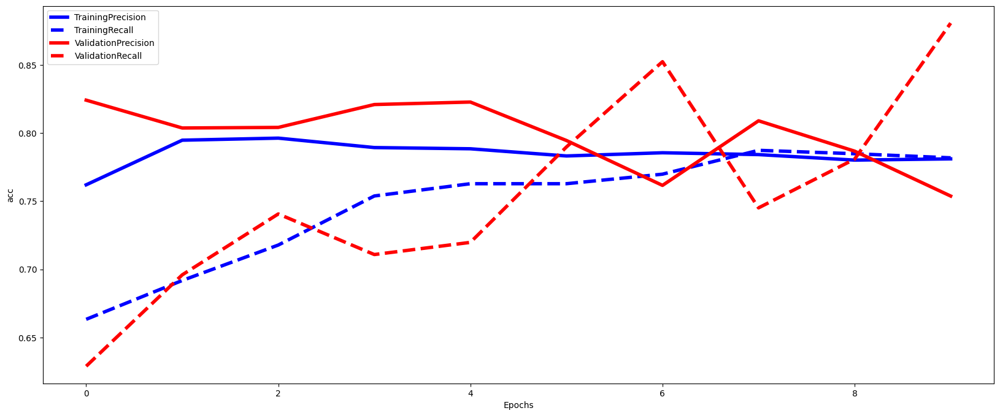

Epoch 1/10
991/991 - 5s - loss: 0.5576 - precision_89: 0.7341 - recall_89: 0.6867 - val_loss: 0.5107 - val_precision_89: 0.7867 - val_recall_89: 0.7024 - 5s/epoch - 5ms/step
Epoch 2/10
991/991 - 3s - loss: 0.5011 - precision_89: 0.7985 - recall_89: 0.6942 - val_loss: 0.4849 - val_precision_89: 0.7926 - val_recall_89: 0.7336 - 3s/epoch - 3ms/step
Epoch 3/10
991/991 - 2s - loss: 0.4752 - precision_89: 0.8027 - recall_89: 0.7247 - val_loss: 0.4749 - val_precision_89: 0.7751 - val_recall_89: 0.7798 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 2s - loss: 0.4608 - precision_89: 0.8004 - recall_89: 0.7508 - val_loss: 0.4590 - val_precision_89: 0.7915 - val_recall_89: 0.7738 - 2s/epoch - 2ms/step
Epoch 5/10
991/991 - 2s - loss: 0.4513 - precision_89: 0.7840 - recall_89: 0.7683 - val_loss: 0.4577 - val_precision_89: 0.7922 - val_recall_89: 0.7604 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 3s - loss: 0.4478 - precision_89: 0.7905 - recall_89: 0.7763 - val_loss: 0.4631 - val_precision_89: 0.8006 - 

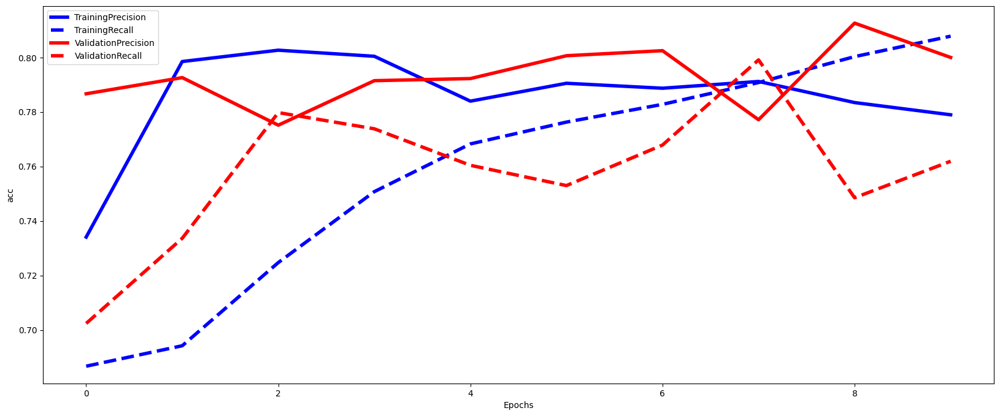

Epoch 1/10
991/991 - 5s - loss: 0.5678 - precision_90: 0.7662 - recall_90: 0.6378 - val_loss: 0.5197 - val_precision_90: 0.8104 - val_recall_90: 0.6751 - 5s/epoch - 5ms/step
Epoch 2/10
991/991 - 5s - loss: 0.5037 - precision_90: 0.8026 - recall_90: 0.6893 - val_loss: 0.4734 - val_precision_90: 0.8036 - val_recall_90: 0.7258 - 5s/epoch - 5ms/step
Epoch 3/10
991/991 - 4s - loss: 0.4724 - precision_90: 0.8041 - recall_90: 0.7229 - val_loss: 0.4571 - val_precision_90: 0.7928 - val_recall_90: 0.7869 - 4s/epoch - 4ms/step
Epoch 4/10
991/991 - 5s - loss: 0.4580 - precision_90: 0.8000 - recall_90: 0.7504 - val_loss: 0.4432 - val_precision_90: 0.7969 - val_recall_90: 0.7660 - 5s/epoch - 5ms/step
Epoch 5/10
991/991 - 4s - loss: 0.4504 - precision_90: 0.7883 - recall_90: 0.7714 - val_loss: 0.4427 - val_precision_90: 0.7805 - val_recall_90: 0.8212 - 4s/epoch - 4ms/step
Epoch 6/10
991/991 - 4s - loss: 0.4479 - precision_90: 0.7841 - recall_90: 0.7774 - val_loss: 0.4346 - val_precision_90: 0.7800 - 

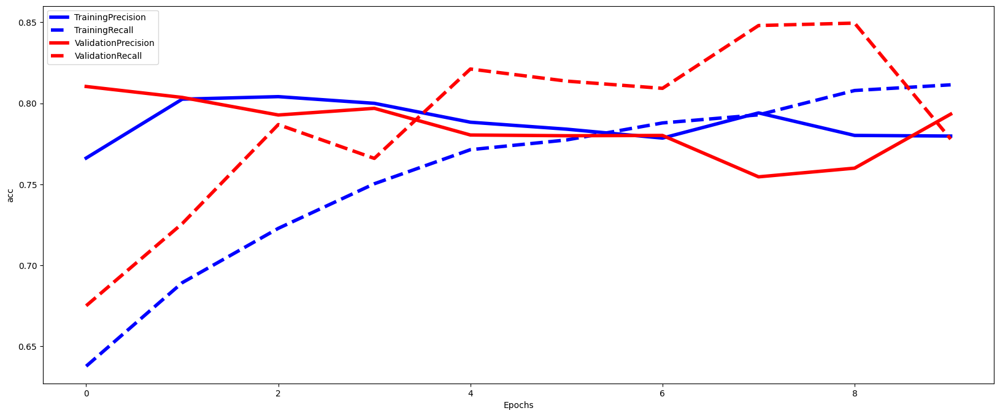

Average F1-Score over validation set is 0.78
STD of F1-Score over validation set is 0.01
42/42 [==============================] - 0s 6ms/step


Val: tanh, Validation Score: 0.782, Test Score: 0.780
Epoch 1/10
991/991 - 5s - loss: 0.6380 - precision_91: 0.6505 - recall_91: 0.6877 - val_loss: 0.5787 - val_precision_91: 0.7628 - val_recall_91: 0.6570 - 5s/epoch - 5ms/step
Epoch 2/10
991/991 - 2s - loss: 0.5509 - precision_91: 0.7962 - recall_91: 0.6574 - val_loss: 0.5547 - val_precision_91: 0.7669 - val_recall_91: 0.6570 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 3s - loss: 0.5338 - precision_91: 0.7879 - recall_91: 0.6862 - val_loss: 0.5455 - val_precision_91: 0.7932 - val_recall_91: 0.6433 - 3s/epoch - 3ms/step
Epoch 4/10
991/991 - 4s - loss: 0.5229 - precision_91: 0.7946 - recall_91: 0.6857 - val_loss: 0.5358 - val_precision_91: 0.7857 - val_recall_91: 0.6540 - 4s/epoch - 4ms/step
Epoch 5/10
991/991 - 4s - loss: 0.5132 - precision_91: 0.7977 - recall_91: 0.6892 - val_loss: 0.5262 - val_precision_91: 0.7882 - val_recall_91: 0.6524 - 4s/epoch - 4ms/step
Epoch 6/10
991/991 - 3s - loss: 0.5028 - precision_91: 0.8028 - recall_91: 0

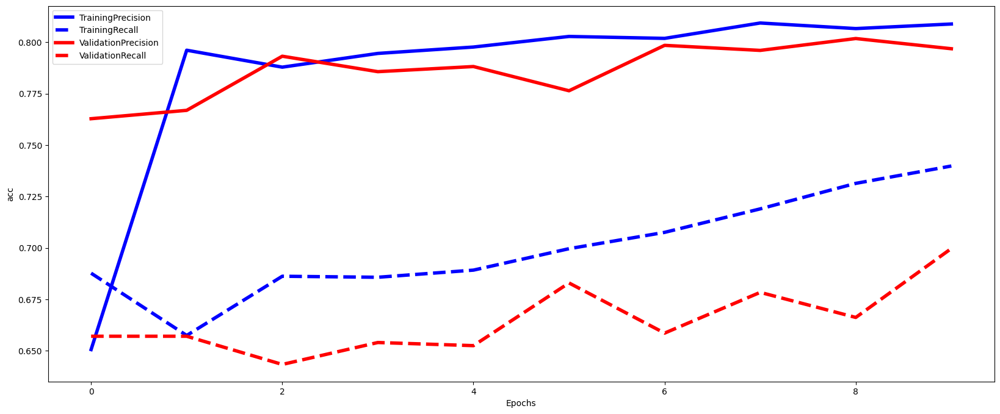

Epoch 1/10
991/991 - 6s - loss: 0.6486 - precision_92: 0.7236 - recall_92: 0.5723 - val_loss: 0.5866 - val_precision_92: 0.8052 - val_recall_92: 0.5976 - 6s/epoch - 6ms/step
Epoch 2/10
991/991 - 3s - loss: 0.5627 - precision_92: 0.7916 - recall_92: 0.6593 - val_loss: 0.5510 - val_precision_92: 0.8011 - val_recall_92: 0.6483 - 3s/epoch - 3ms/step
Epoch 3/10
991/991 - 2s - loss: 0.5458 - precision_92: 0.7879 - recall_92: 0.6708 - val_loss: 0.5386 - val_precision_92: 0.7887 - val_recall_92: 0.6677 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 2s - loss: 0.5358 - precision_92: 0.7889 - recall_92: 0.6748 - val_loss: 0.5277 - val_precision_92: 0.7915 - val_recall_92: 0.6677 - 2s/epoch - 2ms/step
Epoch 5/10
991/991 - 2s - loss: 0.5239 - precision_92: 0.7946 - recall_92: 0.6833 - val_loss: 0.5159 - val_precision_92: 0.7934 - val_recall_92: 0.6811 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 3s - loss: 0.5154 - precision_92: 0.7960 - recall_92: 0.6888 - val_loss: 0.5091 - val_precision_92: 0.8160 - 

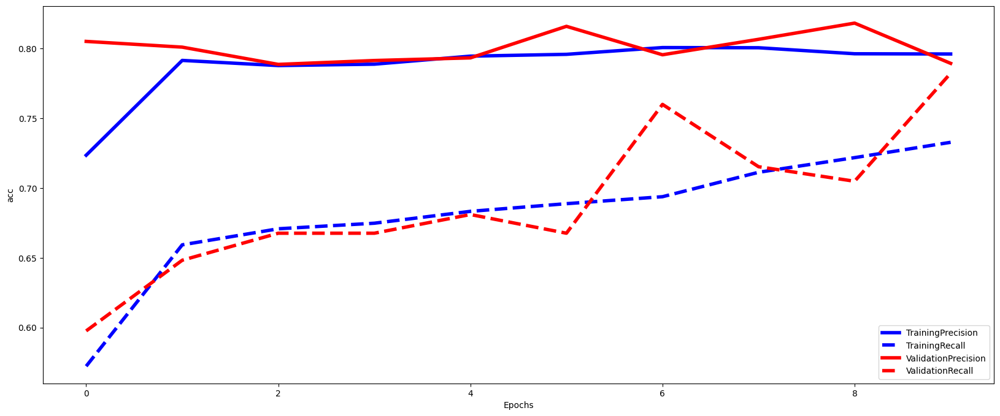

Epoch 1/10
991/991 - 4s - loss: 0.6295 - precision_93: 0.7588 - recall_93: 0.5591 - val_loss: 0.5664 - val_precision_93: 0.8011 - val_recall_93: 0.6414 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 3s - loss: 0.5570 - precision_93: 0.7907 - recall_93: 0.6446 - val_loss: 0.5421 - val_precision_93: 0.7627 - val_recall_93: 0.7128 - 3s/epoch - 3ms/step
Epoch 3/10
991/991 - 5s - loss: 0.5415 - precision_93: 0.7835 - recall_93: 0.6667 - val_loss: 0.5344 - val_precision_93: 0.8065 - val_recall_93: 0.6637 - 5s/epoch - 5ms/step
Epoch 4/10
991/991 - 4s - loss: 0.5319 - precision_93: 0.7885 - recall_93: 0.6697 - val_loss: 0.5193 - val_precision_93: 0.7848 - val_recall_93: 0.7054 - 4s/epoch - 4ms/step
Epoch 5/10
991/991 - 5s - loss: 0.5221 - precision_93: 0.8001 - recall_93: 0.6732 - val_loss: 0.5147 - val_precision_93: 0.7773 - val_recall_93: 0.7321 - 5s/epoch - 5ms/step
Epoch 6/10
991/991 - 2s - loss: 0.5127 - precision_93: 0.7951 - recall_93: 0.6837 - val_loss: 0.5042 - val_precision_93: 0.8010 - 

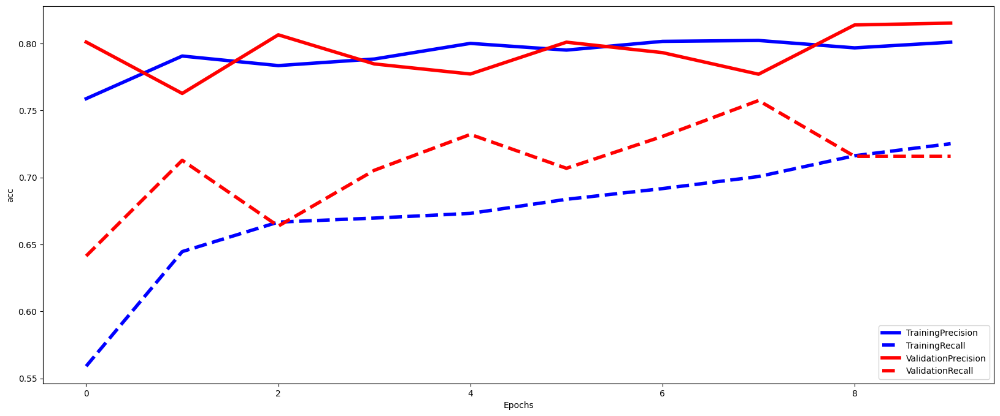

Epoch 1/10
991/991 - 7s - loss: 0.6411 - precision_94: 0.7258 - recall_94: 0.5668 - val_loss: 0.5725 - val_precision_94: 0.7886 - val_recall_94: 0.6617 - 7s/epoch - 7ms/step
Epoch 2/10
991/991 - 4s - loss: 0.5568 - precision_94: 0.7917 - recall_94: 0.6503 - val_loss: 0.5384 - val_precision_94: 0.8089 - val_recall_94: 0.6498 - 4s/epoch - 4ms/step
Epoch 3/10
991/991 - 3s - loss: 0.5398 - precision_94: 0.7907 - recall_94: 0.6633 - val_loss: 0.5272 - val_precision_94: 0.7997 - val_recall_94: 0.6841 - 3s/epoch - 3ms/step
Epoch 4/10
991/991 - 3s - loss: 0.5308 - precision_94: 0.7897 - recall_94: 0.6743 - val_loss: 0.5211 - val_precision_94: 0.8116 - val_recall_94: 0.6677 - 3s/epoch - 3ms/step
Epoch 5/10
991/991 - 3s - loss: 0.5236 - precision_94: 0.7978 - recall_94: 0.6748 - val_loss: 0.5173 - val_precision_94: 0.8126 - val_recall_94: 0.6721 - 3s/epoch - 3ms/step
Epoch 6/10
991/991 - 7s - loss: 0.5176 - precision_94: 0.7926 - recall_94: 0.6823 - val_loss: 0.5066 - val_precision_94: 0.8078 - 

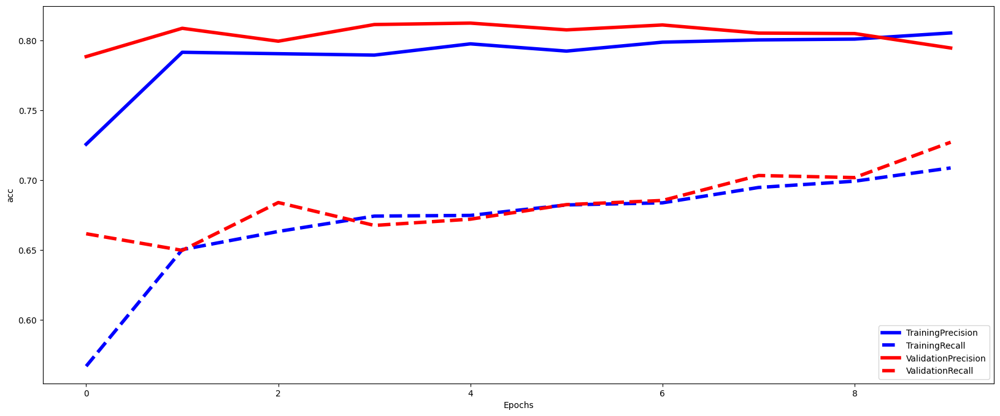

Average F1-Score over validation set is 0.77
STD of F1-Score over validation set is 0.01
42/42 [==============================] - 0s 2ms/step


Val: sigmoid, Validation Score: 0.771, Test Score: 0.770
Epoch 1/10
991/991 - 5s - loss: 0.5928 - precision_95: 0.7109 - recall_95: 0.6728 - val_loss: 0.5740 - val_precision_95: 0.7016 - val_recall_95: 0.7241 - 5s/epoch - 5ms/step
Epoch 2/10
991/991 - 4s - loss: 0.5259 - precision_95: 0.7894 - recall_95: 0.6832 - val_loss: 0.5273 - val_precision_95: 0.7857 - val_recall_95: 0.6540 - 4s/epoch - 4ms/step
Epoch 3/10
991/991 - 6s - loss: 0.5023 - precision_95: 0.8015 - recall_95: 0.7016 - val_loss: 0.5047 - val_precision_95: 0.7888 - val_recall_95: 0.6662 - 6s/epoch - 6ms/step
Epoch 4/10
991/991 - 3s - loss: 0.4825 - precision_95: 0.7978 - recall_95: 0.7150 - val_loss: 0.4917 - val_precision_95: 0.7761 - val_recall_95: 0.7134 - 3s/epoch - 3ms/step
Epoch 5/10
991/991 - 3s - loss: 0.4684 - precision_95: 0.8089 - recall_95: 0.7314 - val_loss: 0.4759 - val_precision_95: 0.7959 - val_recall_95: 0.7073 - 3s/epoch - 3ms/step
Epoch 6/10
991/991 - 4s - loss: 0.4540 - precision_95: 0.8095 - recall_95

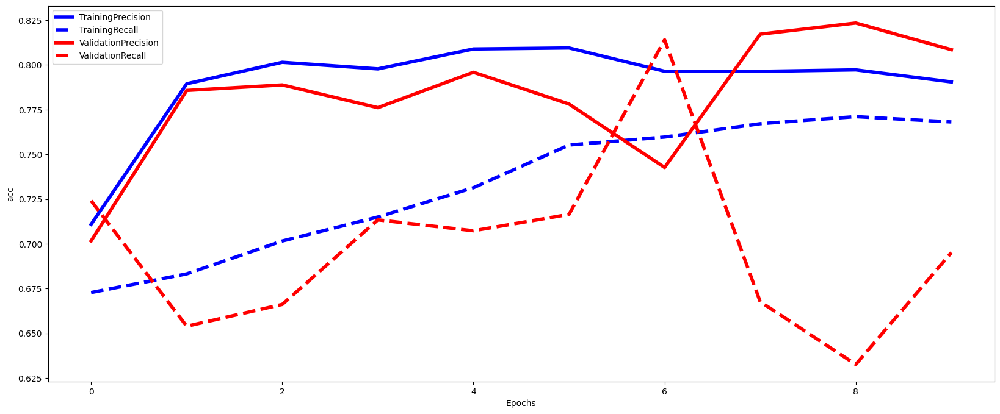

Epoch 1/10
991/991 - 8s - loss: 0.6002 - precision_96: 0.7205 - recall_96: 0.6848 - val_loss: 0.5413 - val_precision_96: 0.8033 - val_recall_96: 0.6453 - 8s/epoch - 8ms/step
Epoch 2/10
991/991 - 4s - loss: 0.5322 - precision_96: 0.7863 - recall_96: 0.6738 - val_loss: 0.5186 - val_precision_96: 0.7867 - val_recall_96: 0.6870 - 4s/epoch - 4ms/step
Epoch 3/10
991/991 - 4s - loss: 0.5152 - precision_96: 0.7922 - recall_96: 0.6768 - val_loss: 0.4996 - val_precision_96: 0.7897 - val_recall_96: 0.6885 - 4s/epoch - 4ms/step
Epoch 4/10
991/991 - 3s - loss: 0.4994 - precision_96: 0.7953 - recall_96: 0.6938 - val_loss: 0.4835 - val_precision_96: 0.8149 - val_recall_96: 0.6826 - 3s/epoch - 3ms/step
Epoch 5/10
991/991 - 2s - loss: 0.4843 - precision_96: 0.7998 - recall_96: 0.6993 - val_loss: 0.4688 - val_precision_96: 0.8195 - val_recall_96: 0.6900 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 6s - loss: 0.4733 - precision_96: 0.7969 - recall_96: 0.7144 - val_loss: 0.4780 - val_precision_96: 0.8369 - 

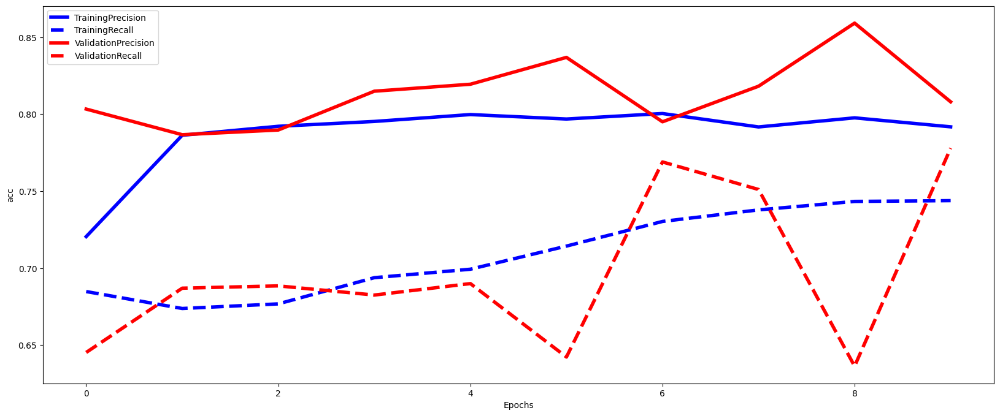

Epoch 1/10
991/991 - 5s - loss: 0.5838 - precision_97: 0.7710 - recall_97: 0.5981 - val_loss: 0.5277 - val_precision_97: 0.8066 - val_recall_97: 0.6949 - 5s/epoch - 5ms/step
Epoch 2/10
991/991 - 2s - loss: 0.5316 - precision_97: 0.7939 - recall_97: 0.6692 - val_loss: 0.5076 - val_precision_97: 0.8083 - val_recall_97: 0.6964 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 2s - loss: 0.5092 - precision_97: 0.7992 - recall_97: 0.6832 - val_loss: 0.4954 - val_precision_97: 0.8207 - val_recall_97: 0.6949 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 2s - loss: 0.4882 - precision_97: 0.8005 - recall_97: 0.7047 - val_loss: 0.4736 - val_precision_97: 0.8020 - val_recall_97: 0.7232 - 2s/epoch - 2ms/step
Epoch 5/10
991/991 - 3s - loss: 0.4730 - precision_97: 0.8030 - recall_97: 0.7302 - val_loss: 0.4603 - val_precision_97: 0.7997 - val_recall_97: 0.7604 - 3s/epoch - 3ms/step
Epoch 6/10
991/991 - 4s - loss: 0.4597 - precision_97: 0.7982 - recall_97: 0.7482 - val_loss: 0.4790 - val_precision_97: 0.7439 - 

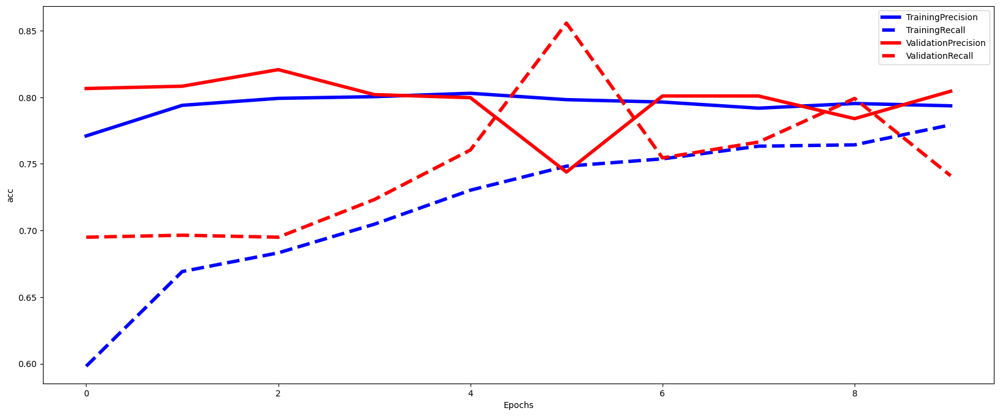

Epoch 1/10
991/991 - 7s - loss: 0.5866 - precision_98: 0.7141 - recall_98: 0.6908 - val_loss: 0.5298 - val_precision_98: 0.7948 - val_recall_98: 0.6870 - 7s/epoch - 7ms/step
Epoch 2/10
991/991 - 2s - loss: 0.5289 - precision_98: 0.7962 - recall_98: 0.6723 - val_loss: 0.5062 - val_precision_98: 0.8053 - val_recall_98: 0.6841 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 2s - loss: 0.5066 - precision_98: 0.7988 - recall_98: 0.6893 - val_loss: 0.4924 - val_precision_98: 0.8149 - val_recall_98: 0.6692 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 2s - loss: 0.4877 - precision_98: 0.7981 - recall_98: 0.7019 - val_loss: 0.4786 - val_precision_98: 0.8227 - val_recall_98: 0.6706 - 2s/epoch - 2ms/step
Epoch 5/10
991/991 - 2s - loss: 0.4728 - precision_98: 0.8097 - recall_98: 0.7259 - val_loss: 0.4885 - val_precision_98: 0.8460 - val_recall_98: 0.6304 - 2s/epoch - 3ms/step
Epoch 6/10
991/991 - 4s - loss: 0.4618 - precision_98: 0.8012 - recall_98: 0.7519 - val_loss: 0.4475 - val_precision_98: 0.8119 - 

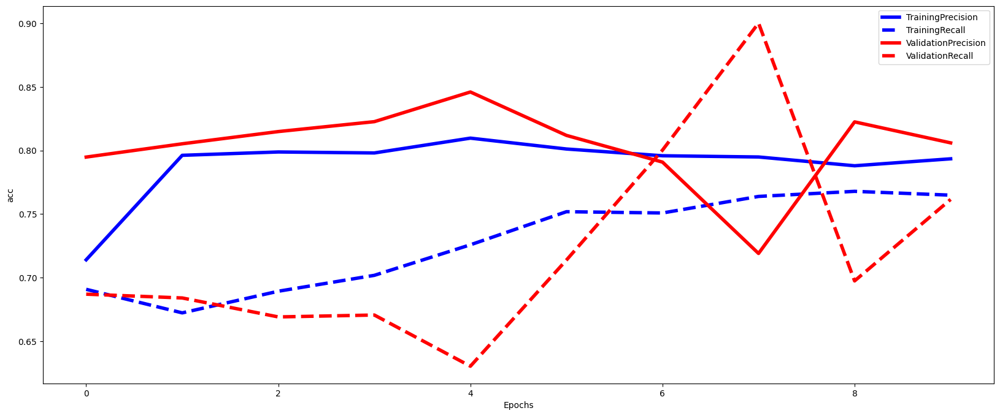

Average F1-Score over validation set is 0.78
STD of F1-Score over validation set is 0.01
42/42 [==============================] - 0s 2ms/step


Val: softplus, Validation Score: 0.780, Test Score: 0.785
Epoch 1/10
991/991 - 6s - loss: 0.5610 - precision_99: 0.7453 - recall_99: 0.7031 - val_loss: 0.5392 - val_precision_99: 0.7745 - val_recall_99: 0.6494 - 6s/epoch - 6ms/step
Epoch 2/10
991/991 - 3s - loss: 0.5062 - precision_99: 0.7989 - recall_99: 0.6961 - val_loss: 0.5118 - val_precision_99: 0.7690 - val_recall_99: 0.7104 - 3s/epoch - 3ms/step
Epoch 3/10
991/991 - 2s - loss: 0.4740 - precision_99: 0.8070 - recall_99: 0.7140 - val_loss: 0.4762 - val_precision_99: 0.7959 - val_recall_99: 0.7134 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 3s - loss: 0.4542 - precision_99: 0.8029 - recall_99: 0.7502 - val_loss: 0.4741 - val_precision_99: 0.7733 - val_recall_99: 0.7332 - 3s/epoch - 3ms/step
Epoch 5/10
991/991 - 3s - loss: 0.4478 - precision_99: 0.7939 - recall_99: 0.7651 - val_loss: 0.4615 - val_precision_99: 0.7797 - val_recall_99: 0.7713 - 3s/epoch - 3ms/step
Epoch 6/10
991/991 - 4s - loss: 0.4417 - precision_99: 0.7928 - recall_9

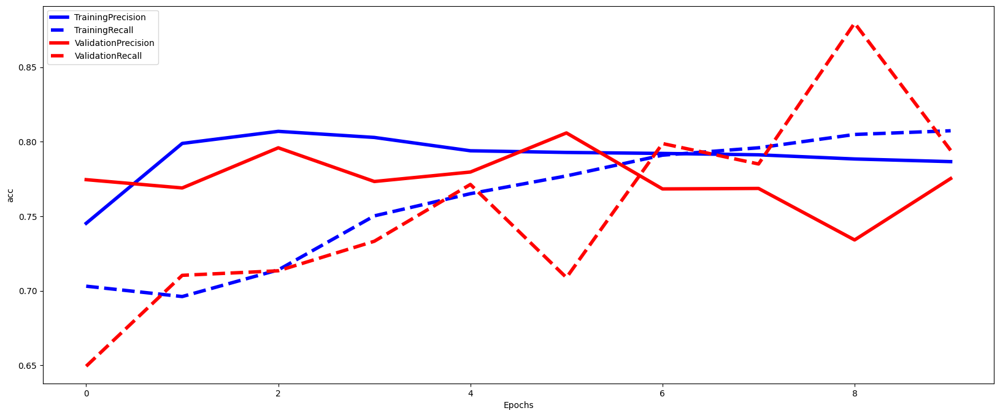

Epoch 1/10
991/991 - 5s - loss: 0.5698 - precision_100: 0.7697 - recall_100: 0.6353 - val_loss: 0.5307 - val_precision_100: 0.8026 - val_recall_100: 0.6423 - 5s/epoch - 5ms/step
Epoch 2/10
991/991 - 3s - loss: 0.5105 - precision_100: 0.7988 - recall_100: 0.6773 - val_loss: 0.4828 - val_precision_100: 0.8208 - val_recall_100: 0.7168 - 3s/epoch - 3ms/step
Epoch 3/10
991/991 - 3s - loss: 0.4819 - precision_100: 0.8020 - recall_100: 0.7114 - val_loss: 0.4541 - val_precision_100: 0.8121 - val_recall_100: 0.7601 - 3s/epoch - 3ms/step
Epoch 4/10
991/991 - 2s - loss: 0.4657 - precision_100: 0.7892 - recall_100: 0.7419 - val_loss: 0.4413 - val_precision_100: 0.7972 - val_recall_100: 0.7735 - 2s/epoch - 2ms/step
Epoch 5/10
991/991 - 2s - loss: 0.4574 - precision_100: 0.7933 - recall_100: 0.7659 - val_loss: 0.4312 - val_precision_100: 0.8028 - val_recall_100: 0.7824 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 3s - loss: 0.4533 - precision_100: 0.7862 - recall_100: 0.7724 - val_loss: 0.4255 - val_p

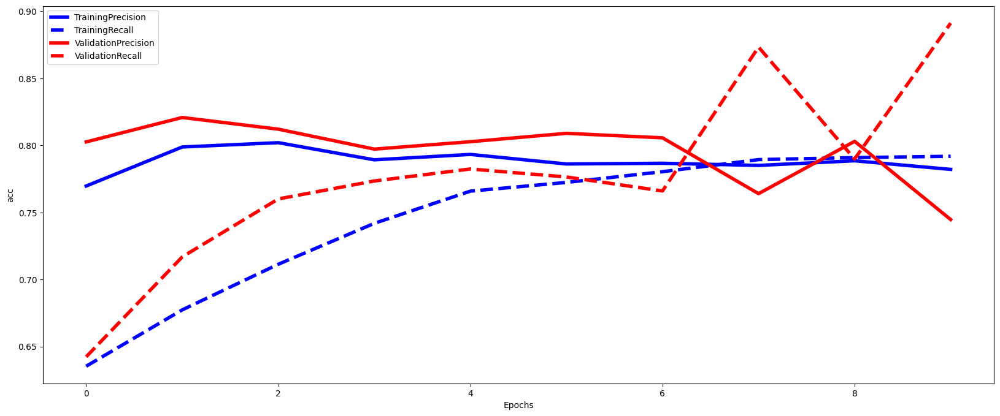

Epoch 1/10
991/991 - 5s - loss: 0.5607 - precision_101: 0.7610 - recall_101: 0.6502 - val_loss: 0.5199 - val_precision_101: 0.7927 - val_recall_101: 0.7113 - 5s/epoch - 5ms/step
Epoch 2/10
991/991 - 3s - loss: 0.5060 - precision_101: 0.7974 - recall_101: 0.6777 - val_loss: 0.4896 - val_precision_101: 0.8261 - val_recall_101: 0.6786 - 3s/epoch - 3ms/step
Epoch 3/10
991/991 - 2s - loss: 0.4740 - precision_101: 0.7955 - recall_101: 0.7262 - val_loss: 0.4667 - val_precision_101: 0.8045 - val_recall_101: 0.7411 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 2s - loss: 0.4585 - precision_101: 0.8041 - recall_101: 0.7583 - val_loss: 0.4604 - val_precision_101: 0.7997 - val_recall_101: 0.7485 - 2s/epoch - 2ms/step
Epoch 5/10
991/991 - 3s - loss: 0.4485 - precision_101: 0.7990 - recall_101: 0.7618 - val_loss: 0.4616 - val_precision_101: 0.7609 - val_recall_101: 0.8333 - 3s/epoch - 3ms/step
Epoch 6/10
991/991 - 2s - loss: 0.4455 - precision_101: 0.7930 - recall_101: 0.7803 - val_loss: 0.4525 - val_p

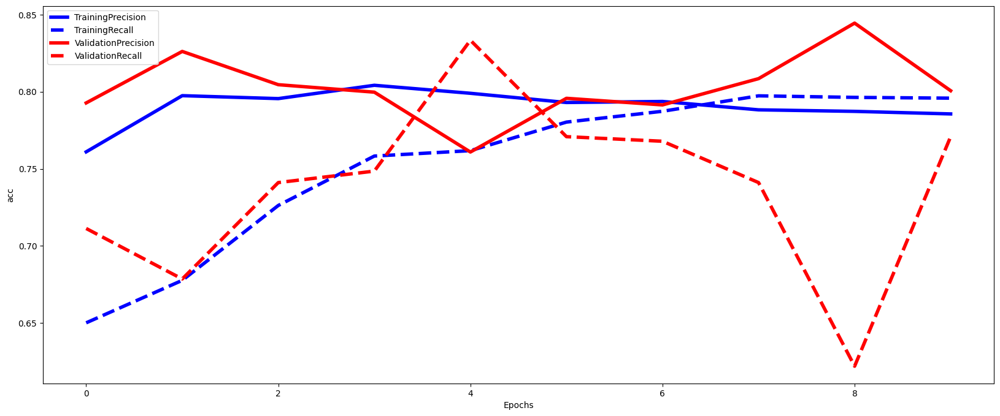

Epoch 1/10
991/991 - 4s - loss: 0.5919 - precision_102: 0.7509 - recall_102: 0.6018 - val_loss: 0.5296 - val_precision_102: 0.8018 - val_recall_102: 0.6811 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 4s - loss: 0.5178 - precision_102: 0.7973 - recall_102: 0.6828 - val_loss: 0.4900 - val_precision_102: 0.8072 - val_recall_102: 0.7049 - 4s/epoch - 4ms/step
Epoch 3/10
991/991 - 3s - loss: 0.4816 - precision_102: 0.8026 - recall_102: 0.7079 - val_loss: 0.4620 - val_precision_102: 0.7962 - val_recall_102: 0.7511 - 3s/epoch - 3ms/step
Epoch 4/10
991/991 - 2s - loss: 0.4629 - precision_102: 0.7991 - recall_102: 0.7404 - val_loss: 0.4475 - val_precision_102: 0.8038 - val_recall_102: 0.7571 - 2s/epoch - 2ms/step
Epoch 5/10
991/991 - 2s - loss: 0.4537 - precision_102: 0.7930 - recall_102: 0.7629 - val_loss: 0.4421 - val_precision_102: 0.8041 - val_recall_102: 0.7645 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 2s - loss: 0.4488 - precision_102: 0.7877 - recall_102: 0.7649 - val_loss: 0.4379 - val_p

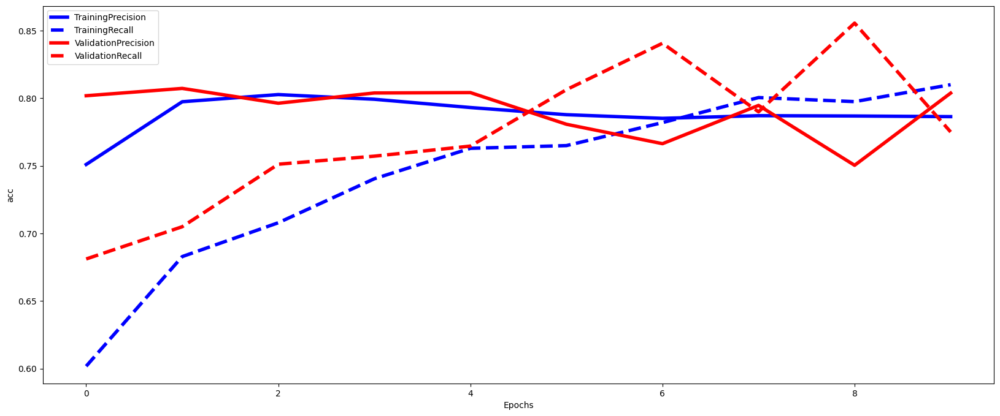

Average F1-Score over validation set is 0.79
STD of F1-Score over validation set is 0.00
42/42 [==============================] - 0s 2ms/step


Val: softsign, Validation Score: 0.786, Test Score: 0.793
Epoch 1/10
991/991 - 4s - loss: 0.5447 - precision_103: 0.7677 - recall_103: 0.6778 - val_loss: 0.5441 - val_precision_103: 0.8065 - val_recall_103: 0.6098 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 3s - loss: 0.4902 - precision_103: 0.7990 - recall_103: 0.7185 - val_loss: 0.4933 - val_precision_103: 0.7912 - val_recall_103: 0.6875 - 3s/epoch - 3ms/step
Epoch 3/10
991/991 - 3s - loss: 0.4636 - precision_103: 0.8039 - recall_103: 0.7408 - val_loss: 0.4749 - val_precision_103: 0.7718 - val_recall_103: 0.7683 - 3s/epoch - 3ms/step
Epoch 4/10
991/991 - 2s - loss: 0.4498 - precision_103: 0.7917 - recall_103: 0.7642 - val_loss: 0.4716 - val_precision_103: 0.7554 - val_recall_103: 0.7530 - 2s/epoch - 2ms/step
Epoch 5/10
991/991 - 2s - loss: 0.4455 - precision_103: 0.7986 - recall_103: 0.7716 - val_loss: 0.4560 - val_precision_103: 0.7993 - val_recall_103: 0.7348 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 3s - loss: 0.4405 - precision_1

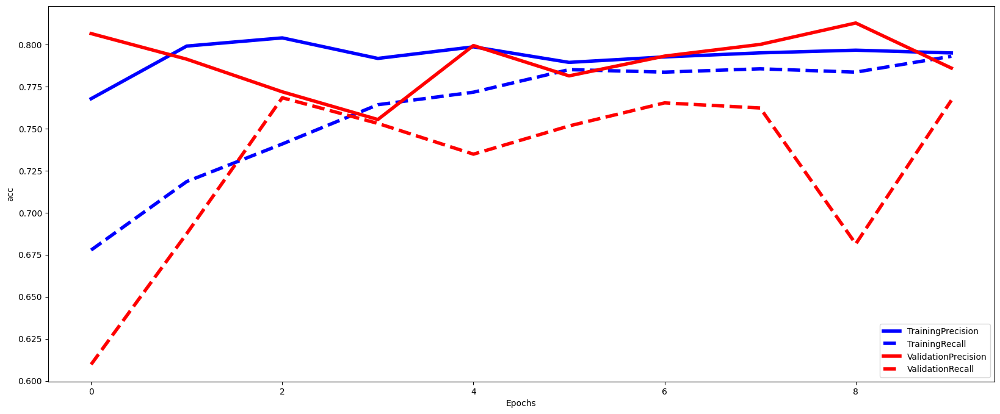

Epoch 1/10
991/991 - 4s - loss: 0.5449 - precision_104: 0.7643 - recall_104: 0.6553 - val_loss: 0.4974 - val_precision_104: 0.8000 - val_recall_104: 0.6855 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 2s - loss: 0.4920 - precision_104: 0.7861 - recall_104: 0.7169 - val_loss: 0.4765 - val_precision_104: 0.8282 - val_recall_104: 0.6751 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 4s - loss: 0.4699 - precision_104: 0.7874 - recall_104: 0.7469 - val_loss: 0.4825 - val_precision_104: 0.8569 - val_recall_104: 0.6244 - 4s/epoch - 4ms/step
Epoch 4/10
991/991 - 3s - loss: 0.4611 - precision_104: 0.7871 - recall_104: 0.7639 - val_loss: 0.4578 - val_precision_104: 0.7387 - val_recall_104: 0.8554 - 3s/epoch - 3ms/step
Epoch 5/10
991/991 - 2s - loss: 0.4562 - precision_104: 0.7797 - recall_104: 0.7719 - val_loss: 0.4699 - val_precision_104: 0.8869 - val_recall_104: 0.5842 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 2s - loss: 0.4526 - precision_104: 0.7811 - recall_104: 0.7694 - val_loss: 0.4616 - val_p

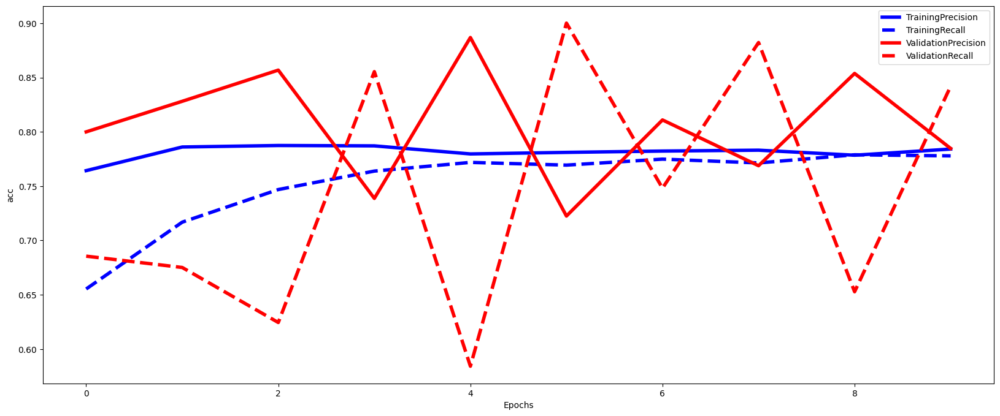

Epoch 1/10
991/991 - 4s - loss: 0.5442 - precision_105: 0.7729 - recall_105: 0.6577 - val_loss: 0.5007 - val_precision_105: 0.7838 - val_recall_105: 0.7068 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 2s - loss: 0.4891 - precision_105: 0.7900 - recall_105: 0.7212 - val_loss: 0.4691 - val_precision_105: 0.7667 - val_recall_105: 0.7872 - 2s/epoch - 3ms/step
Epoch 3/10
991/991 - 2s - loss: 0.4639 - precision_105: 0.7919 - recall_105: 0.7583 - val_loss: 0.4501 - val_precision_105: 0.8082 - val_recall_105: 0.7649 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 4s - loss: 0.4540 - precision_105: 0.7884 - recall_105: 0.7663 - val_loss: 0.4580 - val_precision_105: 0.7561 - val_recall_105: 0.8720 - 4s/epoch - 4ms/step
Epoch 5/10
991/991 - 4s - loss: 0.4454 - precision_105: 0.7897 - recall_105: 0.7818 - val_loss: 0.4548 - val_precision_105: 0.7746 - val_recall_105: 0.8333 - 4s/epoch - 4ms/step
Epoch 6/10
991/991 - 3s - loss: 0.4433 - precision_105: 0.7863 - recall_105: 0.7883 - val_loss: 0.4474 - val_p

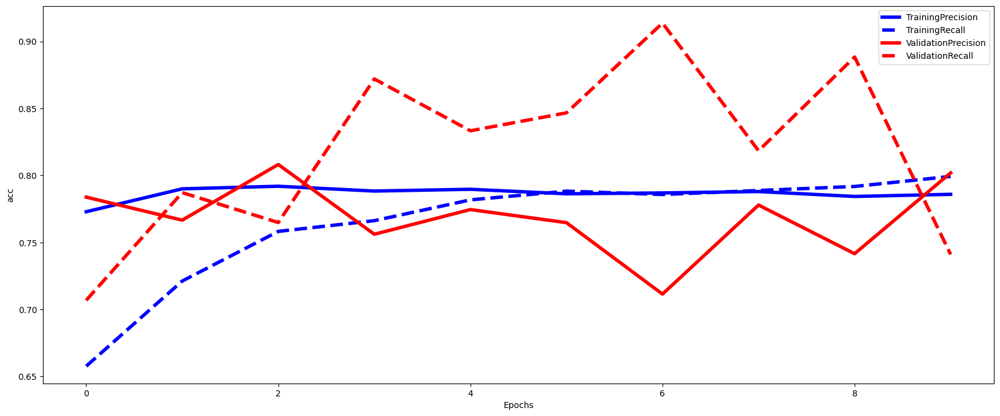

Epoch 1/10
991/991 - 4s - loss: 0.5550 - precision_106: 0.7635 - recall_106: 0.6588 - val_loss: 0.5090 - val_precision_106: 0.8154 - val_recall_106: 0.6781 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 2s - loss: 0.5005 - precision_106: 0.7936 - recall_106: 0.7174 - val_loss: 0.4766 - val_precision_106: 0.8027 - val_recall_106: 0.7154 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 2s - loss: 0.4741 - precision_106: 0.7879 - recall_106: 0.7489 - val_loss: 0.4483 - val_precision_106: 0.7936 - val_recall_106: 0.7794 - 2s/epoch - 3ms/step
Epoch 4/10
991/991 - 2s - loss: 0.4584 - precision_106: 0.7887 - recall_106: 0.7674 - val_loss: 0.4727 - val_precision_106: 0.8278 - val_recall_106: 0.6662 - 2s/epoch - 2ms/step
Epoch 5/10
991/991 - 3s - loss: 0.4521 - precision_106: 0.7812 - recall_106: 0.7789 - val_loss: 0.4401 - val_precision_106: 0.8019 - val_recall_106: 0.7541 - 3s/epoch - 4ms/step
Epoch 6/10
991/991 - 4s - loss: 0.4490 - precision_106: 0.7873 - recall_106: 0.7834 - val_loss: 0.4697 - val_p

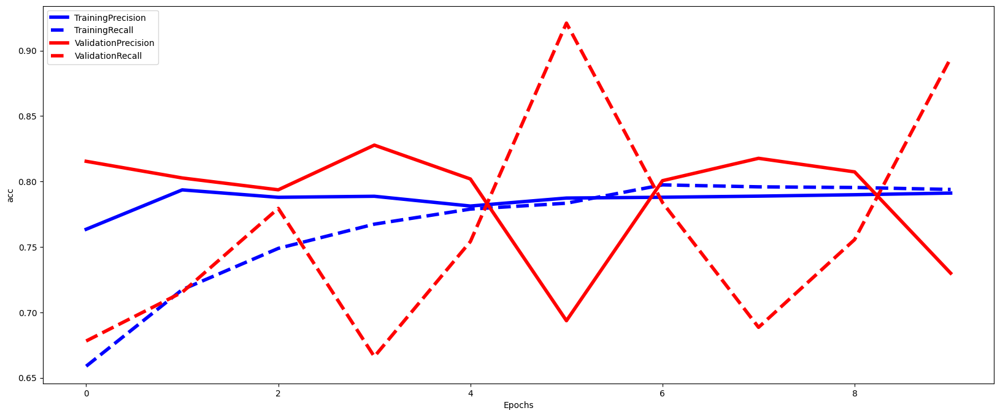

Average F1-Score over validation set is 0.78
STD of F1-Score over validation set is 0.01
42/42 [==============================] - 0s 3ms/step
Val: selu, Validation Score: 0.783, Test Score: 0.790


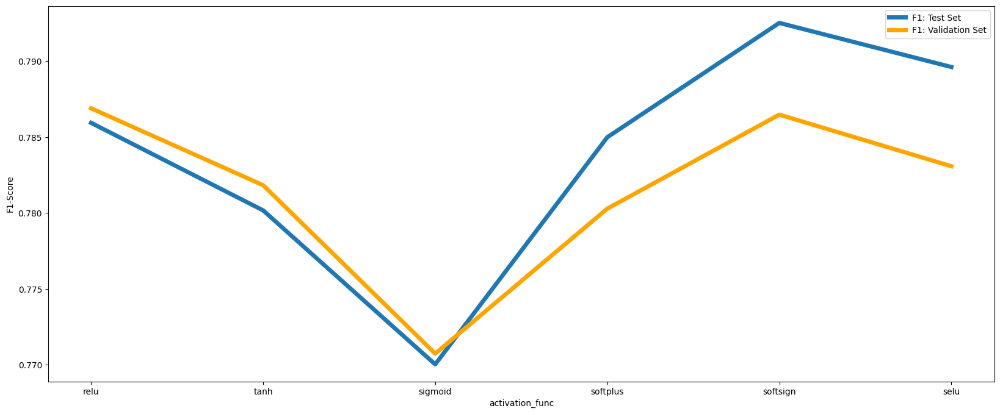

In [81]:
model,best_activation_func = evaluate_efect_param(parameter_type='model_params',parameter_name='activation_func', values_list=['relu','tanh','sigmoid','softplus','softsign','selu'])
kfold_params['model_params']['activation_func'] = best_activation_func

## softsigne is the best.

## choosing best sterategy for initializing weights:

In [88]:
 best_weight_initializer

'GlorotNormal'

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 6s - loss: 0.5490 - precision_107: 0.7599 - recall_107: 0.6787 - val_loss: 0.5227 - val_precision_107: 0.7709 - val_recall_107: 0.6616 - 6s/epoch - 6ms/step
Epoch 2/10
991/991 - 2s - loss: 0.4907 - precision_107: 0.8012 - recall_107: 0.7046 - val_loss: 0.4870 - val_precision_107: 0.8114 - val_recall_107: 0.7149 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 2s - loss: 0.4629 - precision_107: 0.8024 - recall_107: 0.7259 - val_loss: 0.4751 - val_precision_107: 0.7644 - val_recall_107: 0.7866 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 2s - loss: 0.4487 - precision_107: 0.8020 - recall_107: 0.7522 - val_loss: 0.4645 - val_precision_107: 0.8099 - val_recall_107: 0.6951 - 2s/epoch - 2ms/step
Epoch 5/10
991/991 - 2s - loss: 0.4433 - precision_107: 0.7972 - recall_107: 0.7612 - val_loss: 0.4749 - val_precision_107: 0.7217 - val_recall_107: 0.8857 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 4s - loss: 0.4415 - precision_107: 0.7923 - recall_107: 0.7691 - val_loss: 0.4547 - val_p

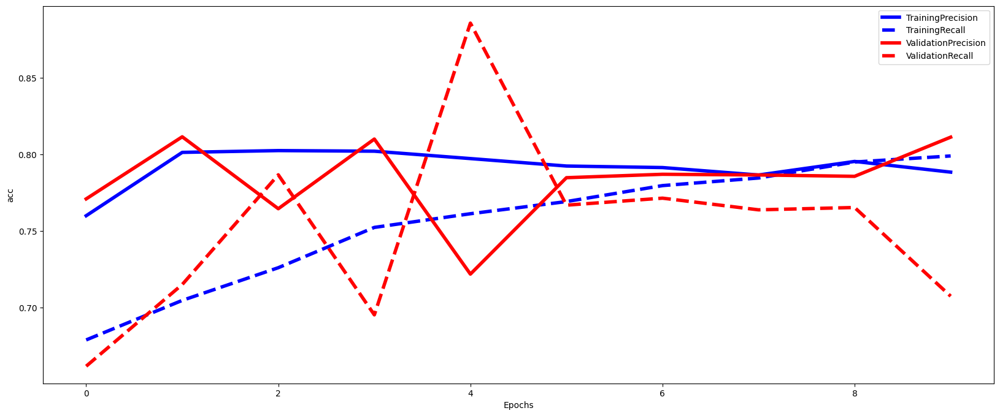

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 5s - loss: 0.5686 - precision_108: 0.7901 - recall_108: 0.6043 - val_loss: 0.5231 - val_precision_108: 0.8066 - val_recall_108: 0.6528 - 5s/epoch - 5ms/step
Epoch 2/10
991/991 - 3s - loss: 0.5025 - precision_108: 0.7937 - recall_108: 0.6928 - val_loss: 0.4733 - val_precision_108: 0.8141 - val_recall_108: 0.7049 - 3s/epoch - 3ms/step
Epoch 3/10
991/991 - 2s - loss: 0.4728 - precision_108: 0.7902 - recall_108: 0.7294 - val_loss: 0.4475 - val_precision_108: 0.8199 - val_recall_108: 0.7258 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 2s - loss: 0.4594 - precision_108: 0.7944 - recall_108: 0.7559 - val_loss: 0.4403 - val_precision_108: 0.7982 - val_recall_108: 0.7899 - 2s/epoch - 2ms/step
Epoch 5/10
991/991 - 2s - loss: 0.4547 - precision_108: 0.7797 - recall_108: 0.7629 - val_loss: 0.4308 - val_precision_108: 0.8032 - val_recall_108: 0.7481 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 2s - loss: 0.4512 - precision_108: 0.7868 - recall_108: 0.7679 - val_loss: 0.4392 - val_p

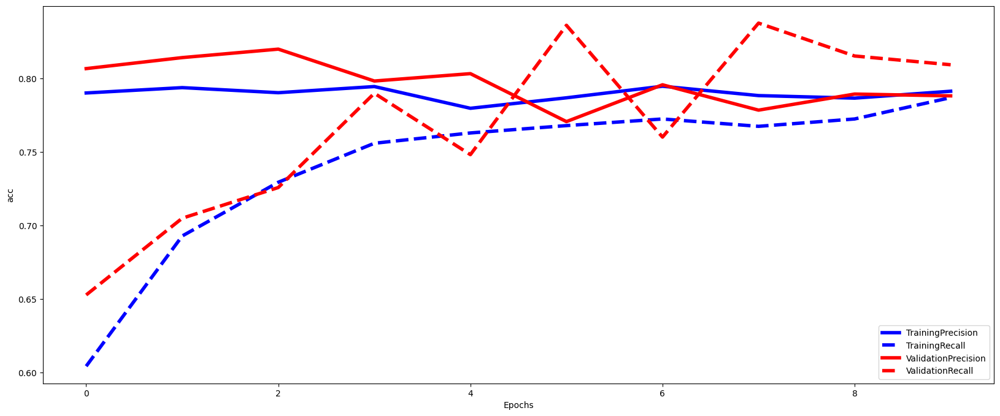

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 4s - loss: 0.5578 - precision_109: 0.7788 - recall_109: 0.6396 - val_loss: 0.5070 - val_precision_109: 0.7738 - val_recall_109: 0.7128 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 2s - loss: 0.4905 - precision_109: 0.7941 - recall_109: 0.7047 - val_loss: 0.4668 - val_precision_109: 0.7864 - val_recall_109: 0.7560 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 3s - loss: 0.4639 - precision_109: 0.7916 - recall_109: 0.7337 - val_loss: 0.4612 - val_precision_109: 0.8106 - val_recall_109: 0.7068 - 3s/epoch - 3ms/step
Epoch 4/10
991/991 - 3s - loss: 0.4513 - precision_109: 0.7987 - recall_109: 0.7608 - val_loss: 0.4693 - val_precision_109: 0.8583 - val_recall_109: 0.6131 - 3s/epoch - 3ms/step
Epoch 5/10
991/991 - 2s - loss: 0.4460 - precision_109: 0.7907 - recall_109: 0.7698 - val_loss: 0.4577 - val_precision_109: 0.8148 - val_recall_109: 0.7396 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 2s - loss: 0.4434 - precision_109: 0.7874 - recall_109: 0.7823 - val_loss: 0.4518 - val_p

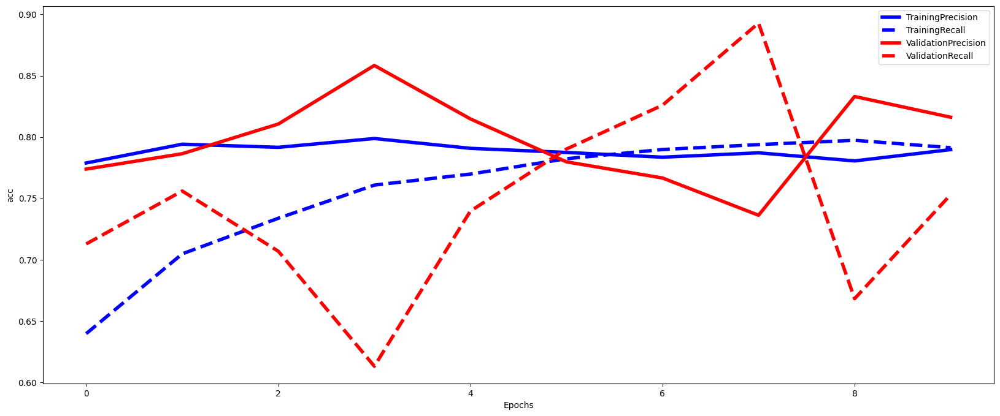

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 4s - loss: 0.5580 - precision_110: 0.7954 - recall_110: 0.6263 - val_loss: 0.5018 - val_precision_110: 0.8045 - val_recall_110: 0.6930 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 2s - loss: 0.4918 - precision_110: 0.7949 - recall_110: 0.6998 - val_loss: 0.4633 - val_precision_110: 0.8043 - val_recall_110: 0.7288 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 2s - loss: 0.4653 - precision_110: 0.7991 - recall_110: 0.7304 - val_loss: 0.4461 - val_precision_110: 0.8114 - val_recall_110: 0.7183 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 2s - loss: 0.4540 - precision_110: 0.7951 - recall_110: 0.7629 - val_loss: 0.4440 - val_precision_110: 0.7758 - val_recall_110: 0.7839 - 2s/epoch - 2ms/step
Epoch 5/10
991/991 - 4s - loss: 0.4496 - precision_110: 0.7926 - recall_110: 0.7629 - val_loss: 0.4361 - val_precision_110: 0.8048 - val_recall_110: 0.7496 - 4s/epoch - 4ms/step
Epoch 6/10
991/991 - 3s - loss: 0.4454 - precision_110: 0.7937 - recall_110: 0.7754 - val_loss: 0.4360 - val_p

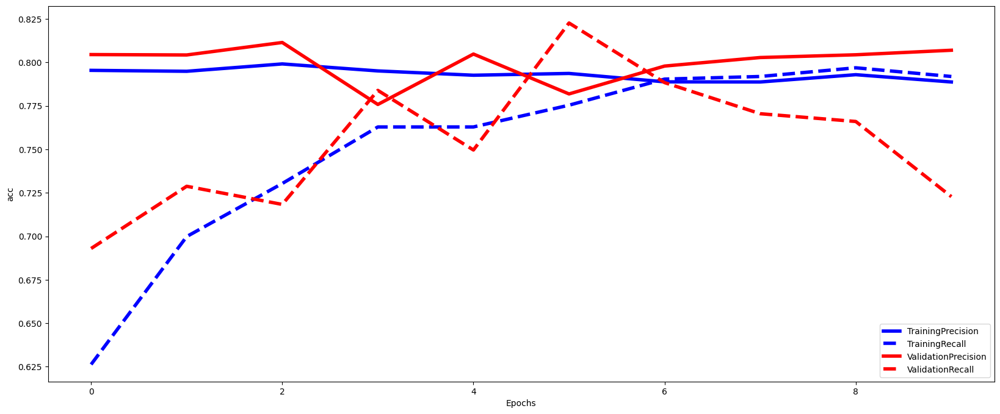

Average F1-Score over validation set is 0.78
STD of F1-Score over validation set is 0.01
42/42 [==============================] - 0s 3ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer RandomUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Val: RandomNormal, Validation Score: 0.781, Test Score: 0.781
Epoch 1/10
991/991 - 6s - loss: 0.5519 - precision_111: 0.7709 - recall_111: 0.6698 - val_loss: 0.5330 - val_precision_111: 0.7806 - val_recall_111: 0.6509 - 6s/epoch - 6ms/step
Epoch 2/10
991/991 - 2s - loss: 0.5068 - precision_111: 0.7959 - recall_111: 0.6951 - val_loss: 0.5123 - val_precision_111: 0.8082 - val_recall_111: 0.6616 - 2s/epoch - 3ms/step
Epoch 3/10
991/991 - 2s - loss: 0.4867 - precision_111: 0.8048 - recall_111: 0.6922 - val_loss: 0.5020 - val_precision_111: 0.7671 - val_recall_111: 0.7027 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 2s - loss: 0.4686 - precision_111: 0.8140 - recall_111: 0.6996 - val_loss: 0.4787 - val_precision_111: 0.8041 - val_recall_111: 0.6631 - 2s/epoch - 2ms/step
Epoch 5/10
991/991 - 2s - loss: 0.4547 - precision_111: 0.8010 - recall_111: 0.7512 - val_loss: 0.4583 - val_precision_111: 0.7898 - val_recall_111: 0.7561 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 3s - loss: 0.4437 - precisi

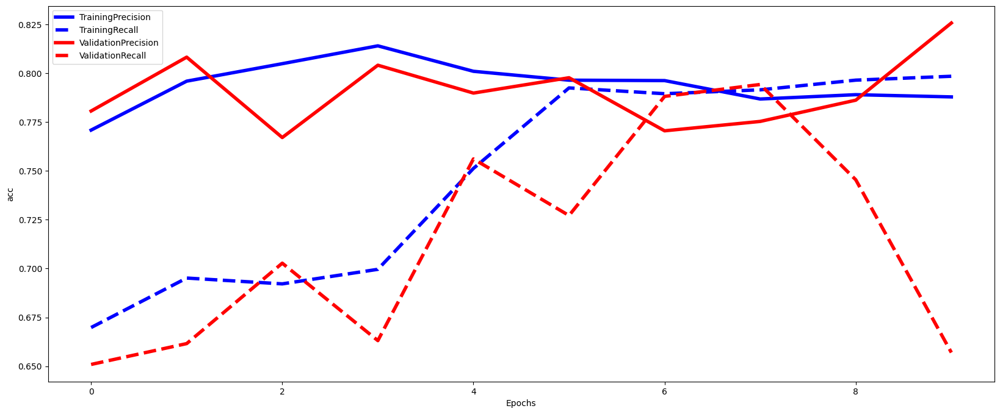

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer RandomUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 4s - loss: 0.5664 - precision_112: 0.7804 - recall_112: 0.6258 - val_loss: 0.5203 - val_precision_112: 0.8210 - val_recall_112: 0.6289 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 3s - loss: 0.5057 - precision_112: 0.7990 - recall_112: 0.6878 - val_loss: 0.4779 - val_precision_112: 0.8191 - val_recall_112: 0.7154 - 3s/epoch - 3ms/step
Epoch 3/10
991/991 - 3s - loss: 0.4797 - precision_112: 0.8003 - recall_112: 0.7059 - val_loss: 0.4638 - val_precision_112: 0.8426 - val_recall_112: 0.6542 - 3s/epoch - 3ms/step
Epoch 4/10
991/991 - 2s - loss: 0.4643 - precision_112: 0.8032 - recall_112: 0.7309 - val_loss: 0.4532 - val_precision_112: 0.8541 - val_recall_112: 0.6632 - 2s/epoch - 2ms/step
Epoch 5/10
991/991 - 2s - loss: 0.4577 - precision_112: 0.7997 - recall_112: 0.7449 - val_loss: 0.4360 - val_precision_112: 0.8015 - val_recall_112: 0.7884 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 2s - loss: 0.4551 - precision_112: 0.7951 - recall_112: 0.7514 - val_loss: 0.4311 - val_p

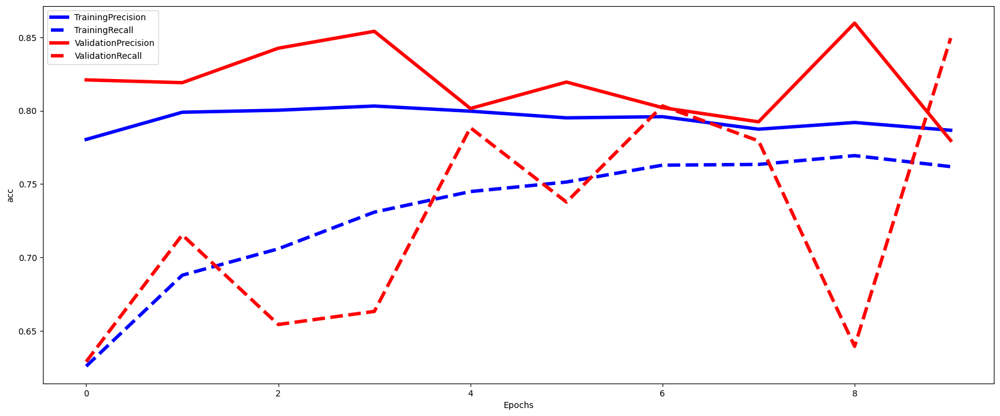

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer RandomUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 3s - loss: 0.5792 - precision_113: 0.7925 - recall_113: 0.6041 - val_loss: 0.5096 - val_precision_113: 0.7904 - val_recall_113: 0.7128 - 3s/epoch - 3ms/step
Epoch 2/10
991/991 - 2s - loss: 0.4983 - precision_113: 0.7990 - recall_113: 0.7002 - val_loss: 0.4876 - val_precision_113: 0.7693 - val_recall_113: 0.7842 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 3s - loss: 0.4698 - precision_113: 0.7984 - recall_113: 0.7432 - val_loss: 0.4699 - val_precision_113: 0.8191 - val_recall_113: 0.7009 - 3s/epoch - 3ms/step
Epoch 4/10
991/991 - 4s - loss: 0.4555 - precision_113: 0.7932 - recall_113: 0.7623 - val_loss: 0.4580 - val_precision_113: 0.7884 - val_recall_113: 0.7872 - 4s/epoch - 4ms/step
Epoch 5/10
991/991 - 2s - loss: 0.4498 - precision_113: 0.7870 - recall_113: 0.7713 - val_loss: 0.4819 - val_precision_113: 0.7199 - val_recall_113: 0.8988 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 2s - loss: 0.4429 - precision_113: 0.7834 - recall_113: 0.7818 - val_loss: 0.4583 - val_p

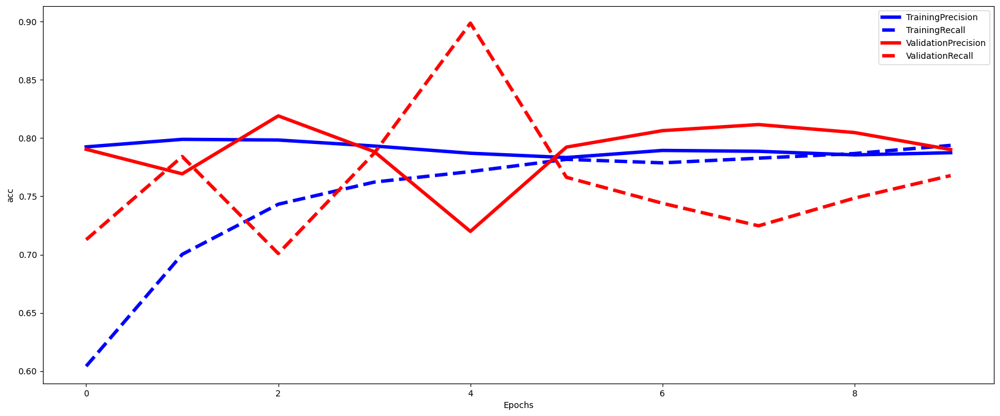

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer RandomUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 4s - loss: 0.5544 - precision_114: 0.7805 - recall_114: 0.6368 - val_loss: 0.5094 - val_precision_114: 0.7878 - val_recall_114: 0.6915 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 2s - loss: 0.5022 - precision_114: 0.7996 - recall_114: 0.6728 - val_loss: 0.4780 - val_precision_114: 0.7983 - val_recall_114: 0.7198 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 2s - loss: 0.4759 - precision_114: 0.8082 - recall_114: 0.7124 - val_loss: 0.4561 - val_precision_114: 0.8232 - val_recall_114: 0.6870 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 2s - loss: 0.4562 - precision_114: 0.7958 - recall_114: 0.7524 - val_loss: 0.4550 - val_precision_114: 0.8227 - val_recall_114: 0.6915 - 2s/epoch - 2ms/step
Epoch 5/10
991/991 - 3s - loss: 0.4494 - precision_114: 0.7908 - recall_114: 0.7679 - val_loss: 0.4348 - val_precision_114: 0.7909 - val_recall_114: 0.8063 - 3s/epoch - 3ms/step
Epoch 6/10
991/991 - 4s - loss: 0.4451 - precision_114: 0.7854 - recall_114: 0.7834 - val_loss: 0.4503 - val_p

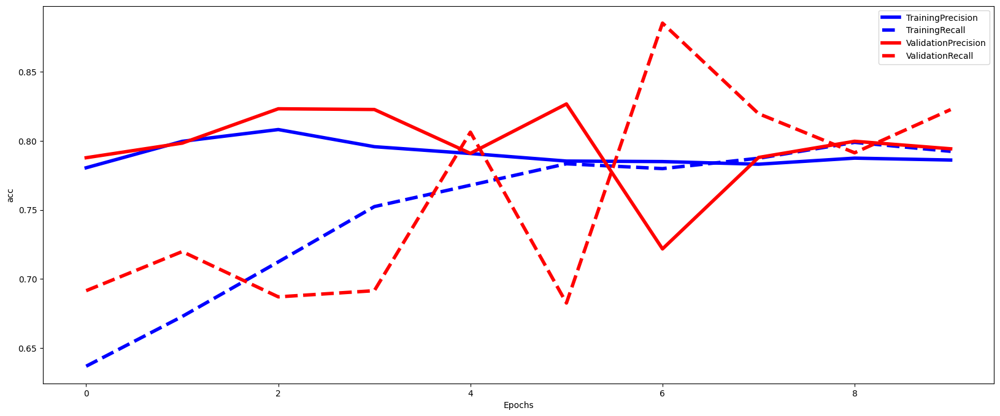

Average F1-Score over validation set is 0.78
STD of F1-Score over validation set is 0.02
42/42 [==============================] - 0s 2ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Val: RandomUniform, Validation Score: 0.785, Test Score: 0.790
Epoch 1/10
991/991 - 5s - loss: 0.5550 - precision_115: 0.7531 - recall_115: 0.6847 - val_loss: 0.5319 - val_precision_115: 0.8035 - val_recall_115: 0.6357 - 5s/epoch - 5ms/step
Epoch 2/10
991/991 - 3s - loss: 0.5059 - precision_115: 0.7900 - recall_115: 0.6912 - val_loss: 0.5068 - val_precision_115: 0.7813 - val_recall_115: 0.6753 - 3s/epoch - 3ms/step
Epoch 3/10
991/991 - 2s - loss: 0.4816 - precision_115: 0.7969 - recall_115: 0.7150 - val_loss: 0.4974 - val_precision_115: 0.8095 - val_recall_115: 0.6220 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 2s - loss: 0.4618 - precision_115: 0.8073 - recall_115: 0.7344 - val_loss: 0.4801 - val_precision_115: 0.7678 - val_recall_115: 0.7713 - 2s/epoch - 2ms/step
Epoch 5/10
991/991 - 3s - loss: 0.4499 - precision_115: 0.7985 - recall_115: 0.7537 - val_loss: 0.4746 - val_precision_115: 0.8171 - val_recall_115: 0.6402 - 3s/epoch - 3ms/step
Epoch 6/10
991/991 - 4s - loss: 0.4444 - precis

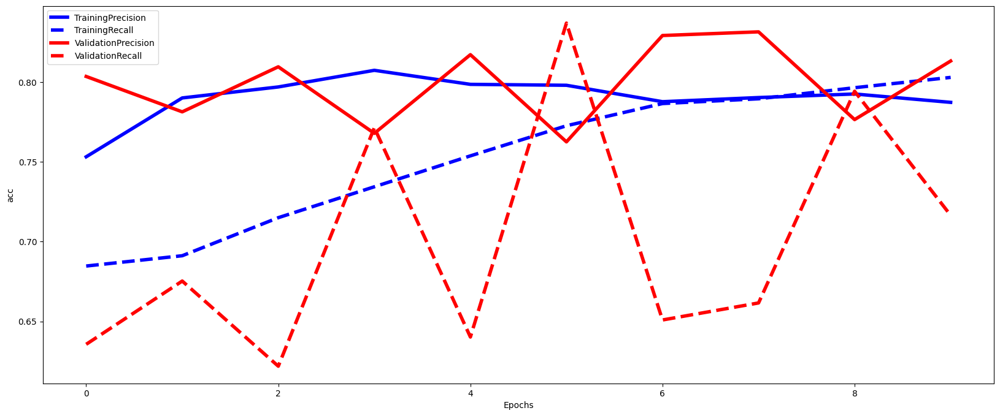

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 4s - loss: 0.5538 - precision_116: 0.7977 - recall_116: 0.6113 - val_loss: 0.5041 - val_precision_116: 0.8203 - val_recall_116: 0.6736 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 4s - loss: 0.4911 - precision_116: 0.7931 - recall_116: 0.7094 - val_loss: 0.4773 - val_precision_116: 0.7697 - val_recall_116: 0.7869 - 4s/epoch - 4ms/step
Epoch 3/10
991/991 - 3s - loss: 0.4692 - precision_116: 0.7968 - recall_116: 0.7454 - val_loss: 0.4516 - val_precision_116: 0.8090 - val_recall_116: 0.7198 - 3s/epoch - 3ms/step
Epoch 4/10
991/991 - 2s - loss: 0.4606 - precision_116: 0.7910 - recall_116: 0.7554 - val_loss: 0.4414 - val_precision_116: 0.8062 - val_recall_116: 0.7317 - 2s/epoch - 2ms/step
Epoch 5/10
991/991 - 2s - loss: 0.4533 - precision_116: 0.7823 - recall_116: 0.7714 - val_loss: 0.4424 - val_precision_116: 0.8076 - val_recall_116: 0.7317 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 2s - loss: 0.4530 - precision_116: 0.7858 - recall_116: 0.7724 - val_loss: 0.4346 - val_p

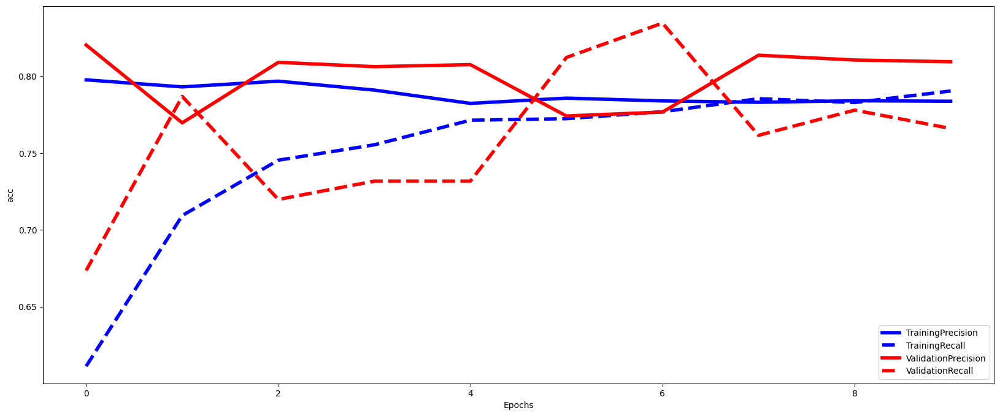

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 4s - loss: 0.5834 - precision_117: 0.7455 - recall_117: 0.6201 - val_loss: 0.5160 - val_precision_117: 0.7838 - val_recall_117: 0.7068 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 3s - loss: 0.5043 - precision_117: 0.7873 - recall_117: 0.6947 - val_loss: 0.4865 - val_precision_117: 0.7953 - val_recall_117: 0.6994 - 3s/epoch - 3ms/step
Epoch 3/10
991/991 - 3s - loss: 0.4751 - precision_117: 0.7994 - recall_117: 0.7202 - val_loss: 0.4818 - val_precision_117: 0.7504 - val_recall_117: 0.7961 - 3s/epoch - 3ms/step
Epoch 4/10
991/991 - 3s - loss: 0.4595 - precision_117: 0.8054 - recall_117: 0.7372 - val_loss: 0.4698 - val_precision_117: 0.7870 - val_recall_117: 0.7366 - 3s/epoch - 3ms/step
Epoch 5/10
991/991 - 3s - loss: 0.4523 - precision_117: 0.7994 - recall_117: 0.7558 - val_loss: 0.4678 - val_precision_117: 0.8118 - val_recall_117: 0.6935 - 3s/epoch - 3ms/step
Epoch 6/10
991/991 - 2s - loss: 0.4468 - precision_117: 0.7960 - recall_117: 0.7638 - val_loss: 0.4593 - val_p

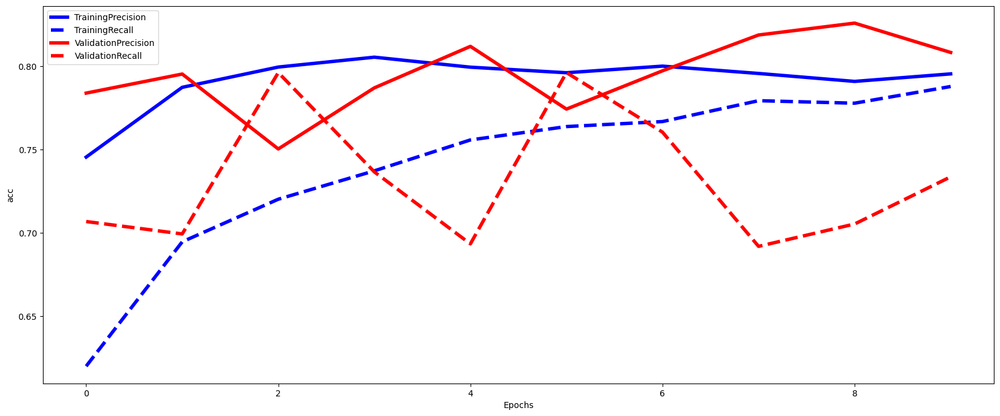

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 4s - loss: 0.5628 - precision_118: 0.7953 - recall_118: 0.5928 - val_loss: 0.5232 - val_precision_118: 0.7869 - val_recall_118: 0.6990 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 2s - loss: 0.5031 - precision_118: 0.8015 - recall_118: 0.6848 - val_loss: 0.4786 - val_precision_118: 0.7993 - val_recall_118: 0.7124 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 2s - loss: 0.4767 - precision_118: 0.8019 - recall_118: 0.7109 - val_loss: 0.4729 - val_precision_118: 0.8198 - val_recall_118: 0.6781 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 3s - loss: 0.4610 - precision_118: 0.7952 - recall_118: 0.7399 - val_loss: 0.4497 - val_precision_118: 0.7937 - val_recall_118: 0.7571 - 3s/epoch - 3ms/step
Epoch 5/10
991/991 - 4s - loss: 0.4522 - precision_118: 0.7958 - recall_118: 0.7604 - val_loss: 0.4476 - val_precision_118: 0.7890 - val_recall_118: 0.7466 - 4s/epoch - 4ms/step
Epoch 6/10
991/991 - 3s - loss: 0.4481 - precision_118: 0.7864 - recall_118: 0.7719 - val_loss: 0.4444 - val_p

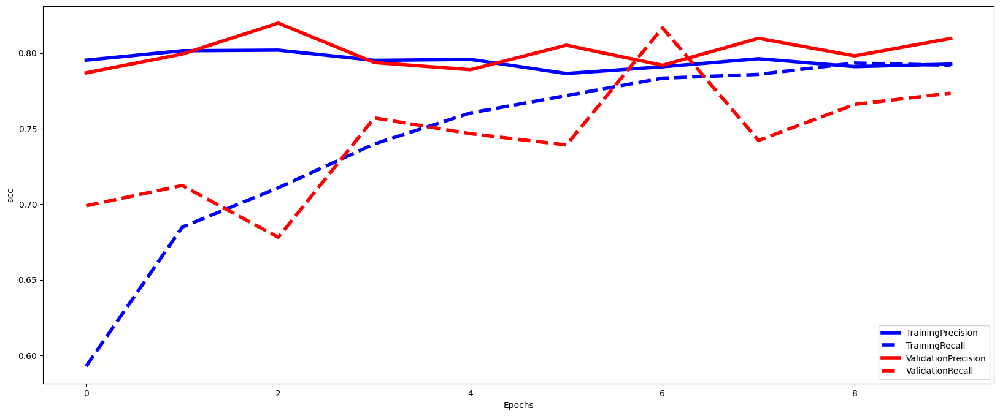

Average F1-Score over validation set is 0.78
STD of F1-Score over validation set is 0.01
42/42 [==============================] - 0s 2ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Val: GlorotUniform, Validation Score: 0.784, Test Score: 0.789
Epoch 1/10
991/991 - 6s - loss: 0.5545 - precision_119: 0.7644 - recall_119: 0.6653 - val_loss: 0.5297 - val_precision_119: 0.7636 - val_recall_119: 0.6646 - 6s/epoch - 6ms/step
Epoch 2/10
991/991 - 2s - loss: 0.4983 - precision_119: 0.7962 - recall_119: 0.7001 - val_loss: 0.4955 - val_precision_119: 0.7943 - val_recall_119: 0.6768 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 2s - loss: 0.4713 - precision_119: 0.8005 - recall_119: 0.7234 - val_loss: 0.4798 - val_precision_119: 0.7909 - val_recall_119: 0.6860 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 3s - loss: 0.4544 - precision_119: 0.7957 - recall_119: 0.7483 - val_loss: 0.4747 - val_precision_119: 0.7569 - val_recall_119: 0.8308 - 3s/epoch - 3ms/step
Epoch 5/10
991/991 - 4s - loss: 0.4481 - precision_119: 0.7945 - recall_119: 0.7716 - val_loss: 0.4586 - val_precision_119: 0.7936 - val_recall_119: 0.7561 - 4s/epoch - 4ms/step
Epoch 6/10
991/991 - 3s - loss: 0.4426 - precis

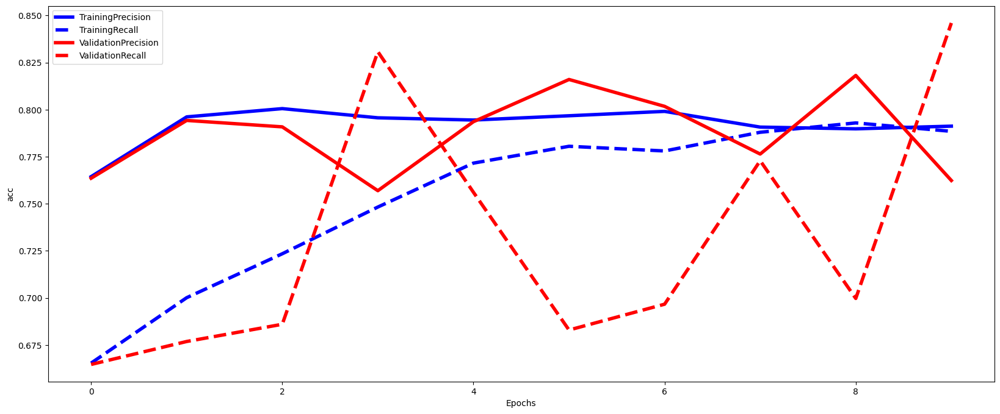

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 5s - loss: 0.5615 - precision_120: 0.7844 - recall_120: 0.6023 - val_loss: 0.5119 - val_precision_120: 0.8134 - val_recall_120: 0.6692 - 5s/epoch - 5ms/step
Epoch 2/10
991/991 - 2s - loss: 0.4983 - precision_120: 0.7919 - recall_120: 0.7024 - val_loss: 0.4812 - val_precision_120: 0.8321 - val_recall_120: 0.6721 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 2s - loss: 0.4768 - precision_120: 0.7982 - recall_120: 0.7184 - val_loss: 0.4544 - val_precision_120: 0.7978 - val_recall_120: 0.7526 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 2s - loss: 0.4629 - precision_120: 0.7931 - recall_120: 0.7344 - val_loss: 0.4424 - val_precision_120: 0.7994 - val_recall_120: 0.7601 - 2s/epoch - 2ms/step
Epoch 5/10
991/991 - 4s - loss: 0.4549 - precision_120: 0.7824 - recall_120: 0.7554 - val_loss: 0.4357 - val_precision_120: 0.7934 - val_recall_120: 0.7839 - 4s/epoch - 4ms/step
Epoch 6/10
991/991 - 4s - loss: 0.4507 - precision_120: 0.7889 - recall_120: 0.7664 - val_loss: 0.4369 - val_p

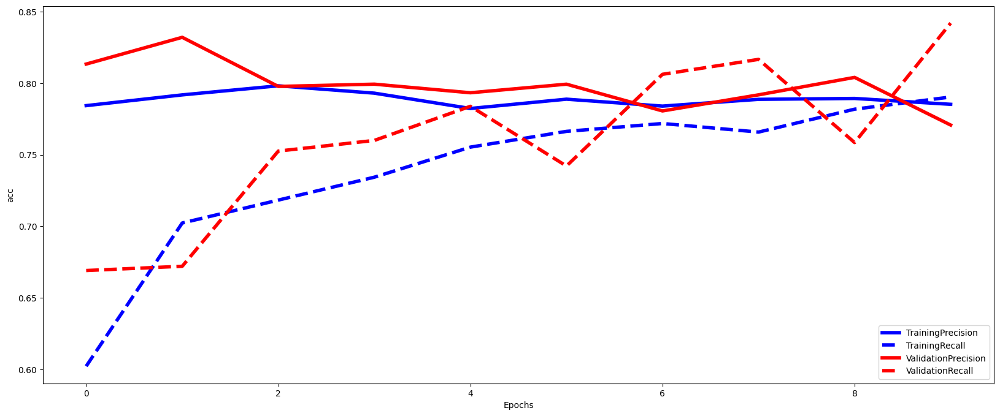

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 5s - loss: 0.5503 - precision_121: 0.7905 - recall_121: 0.6156 - val_loss: 0.5218 - val_precision_121: 0.8412 - val_recall_121: 0.5595 - 5s/epoch - 5ms/step
Epoch 2/10
991/991 - 2s - loss: 0.4959 - precision_121: 0.7991 - recall_121: 0.6787 - val_loss: 0.4776 - val_precision_121: 0.7712 - val_recall_121: 0.7574 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 2s - loss: 0.4749 - precision_121: 0.7961 - recall_121: 0.7192 - val_loss: 0.4696 - val_precision_121: 0.8019 - val_recall_121: 0.7411 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 2s - loss: 0.4600 - precision_121: 0.7984 - recall_121: 0.7412 - val_loss: 0.4635 - val_precision_121: 0.8035 - val_recall_121: 0.7485 - 2s/epoch - 3ms/step
Epoch 5/10
991/991 - 3s - loss: 0.4521 - precision_121: 0.7941 - recall_121: 0.7568 - val_loss: 0.4663 - val_precision_121: 0.7582 - val_recall_121: 0.8259 - 3s/epoch - 3ms/step
Epoch 6/10
991/991 - 4s - loss: 0.4484 - precision_121: 0.7923 - recall_121: 0.7733 - val_loss: 0.4551 - val_p

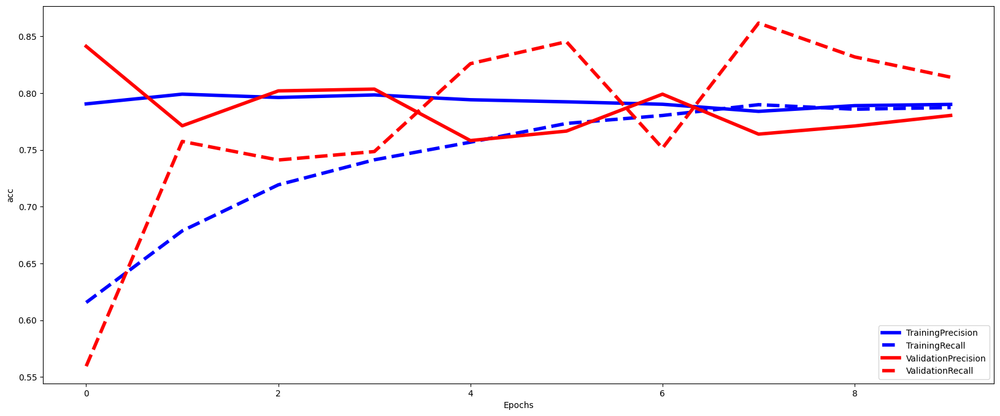

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 5s - loss: 0.5753 - precision_122: 0.7010 - recall_122: 0.7189 - val_loss: 0.5232 - val_precision_122: 0.8173 - val_recall_122: 0.6200 - 5s/epoch - 5ms/step
Epoch 2/10
991/991 - 4s - loss: 0.5076 - precision_122: 0.8004 - recall_122: 0.6778 - val_loss: 0.4795 - val_precision_122: 0.8120 - val_recall_122: 0.7079 - 4s/epoch - 4ms/step
Epoch 3/10
991/991 - 2s - loss: 0.4794 - precision_122: 0.7997 - recall_122: 0.7029 - val_loss: 0.4553 - val_precision_122: 0.8067 - val_recall_122: 0.7154 - 2s/epoch - 3ms/step
Epoch 4/10
991/991 - 2s - loss: 0.4656 - precision_122: 0.8089 - recall_122: 0.7244 - val_loss: 0.4472 - val_precision_122: 0.8022 - val_recall_122: 0.7556 - 2s/epoch - 2ms/step
Epoch 5/10
991/991 - 3s - loss: 0.4539 - precision_122: 0.7958 - recall_122: 0.7369 - val_loss: 0.4560 - val_precision_122: 0.7500 - val_recall_122: 0.8405 - 3s/epoch - 3ms/step
Epoch 6/10
991/991 - 3s - loss: 0.4484 - precision_122: 0.7949 - recall_122: 0.7659 - val_loss: 0.4369 - val_p

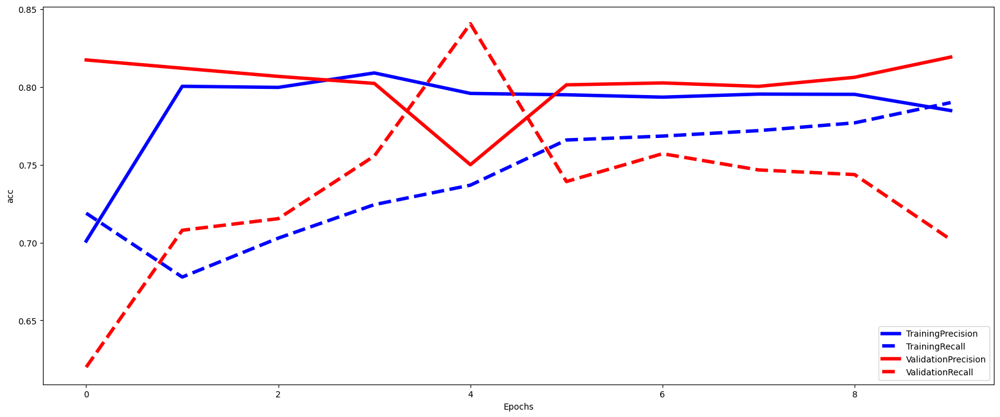

Average F1-Score over validation set is 0.79
STD of F1-Score over validation set is 0.01
42/42 [==============================] - 0s 2ms/step


Val: GlorotNormal, Validation Score: 0.785, Test Score: 0.785
Epoch 1/10
991/991 - 5s - loss: 0.5524 - precision_123: 0.7894 - recall_123: 0.6420 - val_loss: 0.5213 - val_precision_123: 0.7892 - val_recall_123: 0.6448 - 5s/epoch - 5ms/step
Epoch 2/10
991/991 - 4s - loss: 0.4924 - precision_123: 0.8013 - recall_123: 0.6927 - val_loss: 0.4883 - val_precision_123: 0.7915 - val_recall_123: 0.7058 - 4s/epoch - 4ms/step
Epoch 3/10
991/991 - 3s - loss: 0.4663 - precision_123: 0.7987 - recall_123: 0.7309 - val_loss: 0.4746 - val_precision_123: 0.7879 - val_recall_123: 0.6966 - 3s/epoch - 3ms/step
Epoch 4/10
991/991 - 3s - loss: 0.4527 - precision_123: 0.7986 - recall_123: 0.7562 - val_loss: 0.4702 - val_precision_123: 0.8147 - val_recall_123: 0.6905 - 3s/epoch - 3ms/step
Epoch 5/10
991/991 - 3s - loss: 0.4438 - precision_123: 0.7956 - recall_123: 0.7691 - val_loss: 0.4666 - val_precision_123: 0.7993 - val_recall_123: 0.7043 - 3s/epoch - 3ms/step
Epoch 6/10
991/991 - 3s - loss: 0.4406 - precisi

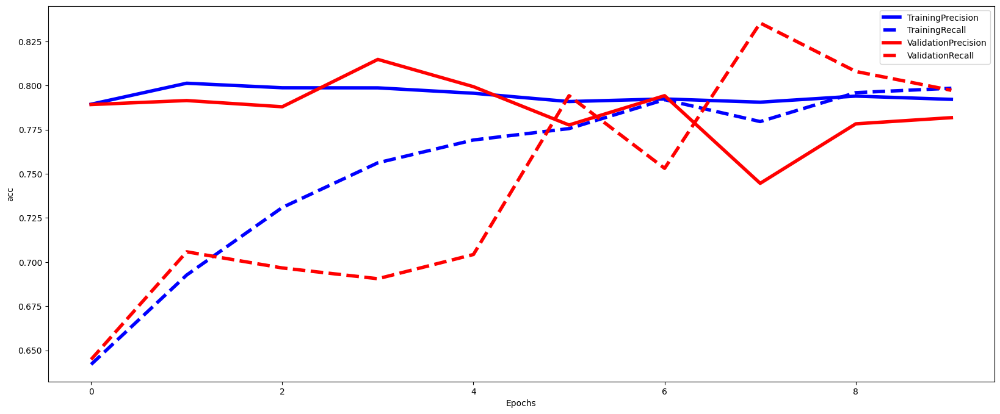

Epoch 1/10
991/991 - 3s - loss: 0.5551 - precision_124: 0.7618 - recall_124: 0.6383 - val_loss: 0.5206 - val_precision_124: 0.8144 - val_recall_124: 0.6408 - 3s/epoch - 3ms/step
Epoch 2/10
991/991 - 2s - loss: 0.5066 - precision_124: 0.8015 - recall_124: 0.6808 - val_loss: 0.4949 - val_precision_124: 0.7886 - val_recall_124: 0.7004 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 4s - loss: 0.4861 - precision_124: 0.7979 - recall_124: 0.6993 - val_loss: 0.4688 - val_precision_124: 0.8083 - val_recall_124: 0.7288 - 4s/epoch - 4ms/step
Epoch 4/10
991/991 - 3s - loss: 0.4742 - precision_124: 0.7959 - recall_124: 0.7179 - val_loss: 0.4561 - val_precision_124: 0.8030 - val_recall_124: 0.7228 - 3s/epoch - 4ms/step
Epoch 5/10
991/991 - 3s - loss: 0.4630 - precision_124: 0.7978 - recall_124: 0.7384 - val_loss: 0.4548 - val_precision_124: 0.7743 - val_recall_124: 0.8182 - 3s/epoch - 3ms/step
Epoch 6/10
991/991 - 2s - loss: 0.4578 - precision_124: 0.7909 - recall_124: 0.7474 - val_loss: 0.4443 - val_p

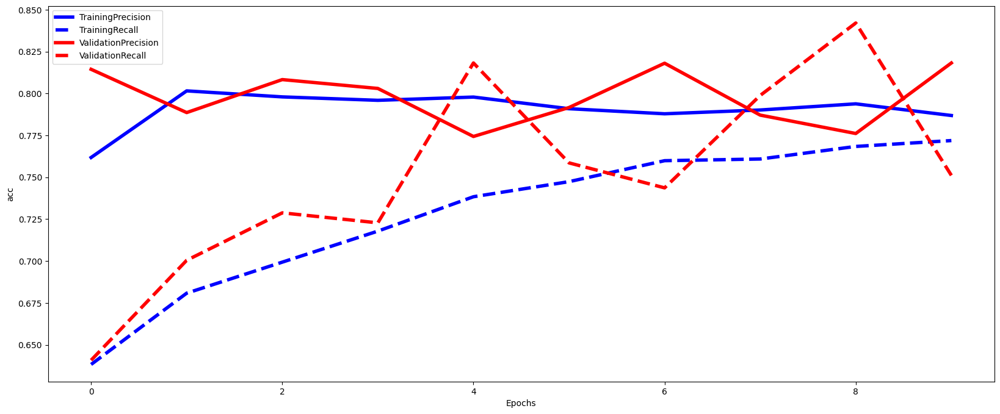

Epoch 1/10
991/991 - 4s - loss: 0.5611 - precision_125: 0.7672 - recall_125: 0.6351 - val_loss: 0.5099 - val_precision_125: 0.7926 - val_recall_125: 0.6994 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 2s - loss: 0.4984 - precision_125: 0.7977 - recall_125: 0.6967 - val_loss: 0.4885 - val_precision_125: 0.7769 - val_recall_125: 0.7307 - 2s/epoch - 3ms/step
Epoch 3/10
991/991 - 3s - loss: 0.4774 - precision_125: 0.8008 - recall_125: 0.7142 - val_loss: 0.4810 - val_precision_125: 0.7971 - val_recall_125: 0.6607 - 3s/epoch - 3ms/step
Epoch 4/10
991/991 - 4s - loss: 0.4640 - precision_125: 0.8048 - recall_125: 0.7282 - val_loss: 0.4623 - val_precision_125: 0.7922 - val_recall_125: 0.7262 - 4s/epoch - 4ms/step
Epoch 5/10
991/991 - 3s - loss: 0.4507 - precision_125: 0.8020 - recall_125: 0.7603 - val_loss: 0.4548 - val_precision_125: 0.7987 - val_recall_125: 0.7500 - 3s/epoch - 3ms/step
Epoch 6/10
991/991 - 2s - loss: 0.4479 - precision_125: 0.7936 - recall_125: 0.7658 - val_loss: 0.4531 - val_p

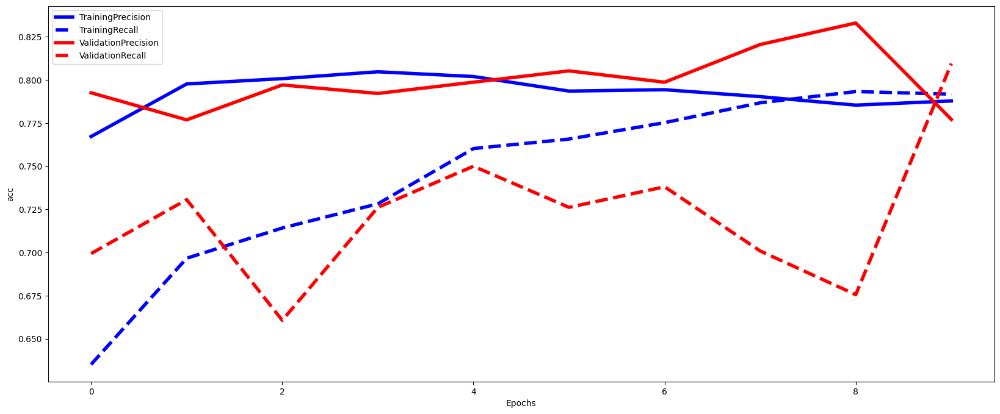

Epoch 1/10
991/991 - 5s - loss: 0.5586 - precision_126: 0.7531 - recall_126: 0.6698 - val_loss: 0.5180 - val_precision_126: 0.8176 - val_recall_126: 0.6080 - 5s/epoch - 5ms/step
Epoch 2/10
991/991 - 2s - loss: 0.5046 - precision_126: 0.7964 - recall_126: 0.6788 - val_loss: 0.4886 - val_precision_126: 0.7746 - val_recall_126: 0.7735 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 2s - loss: 0.4777 - precision_126: 0.7979 - recall_126: 0.7189 - val_loss: 0.4701 - val_precision_126: 0.8324 - val_recall_126: 0.6513 - 2s/epoch - 3ms/step
Epoch 4/10
991/991 - 3s - loss: 0.4608 - precision_126: 0.7979 - recall_126: 0.7484 - val_loss: 0.4631 - val_precision_126: 0.8296 - val_recall_126: 0.6602 - 3s/epoch - 3ms/step
Epoch 5/10
991/991 - 4s - loss: 0.4540 - precision_126: 0.7928 - recall_126: 0.7484 - val_loss: 0.4416 - val_precision_126: 0.7824 - val_recall_126: 0.7824 - 4s/epoch - 4ms/step
Epoch 6/10
991/991 - 4s - loss: 0.4467 - precision_126: 0.7954 - recall_126: 0.7664 - val_loss: 0.5008 - val_p

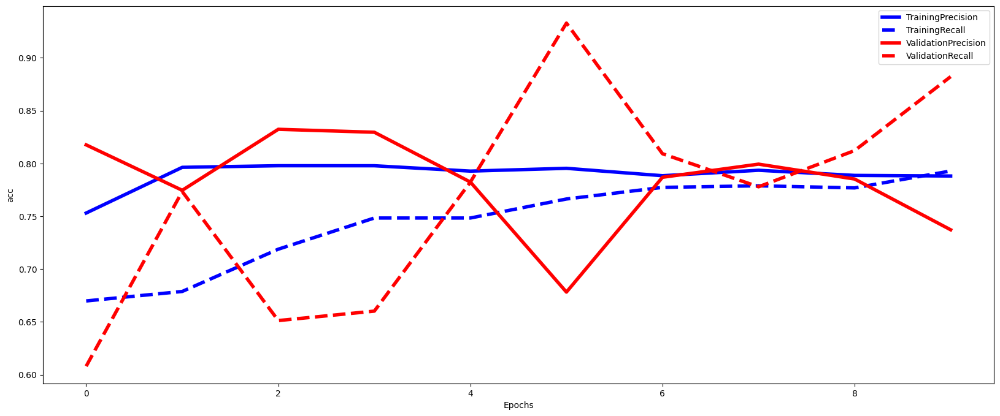

Average F1-Score over validation set is 0.79
STD of F1-Score over validation set is 0.00
42/42 [==============================] - 0s 3ms/step
Val: he_normal, Validation Score: 0.785, Test Score: 0.790


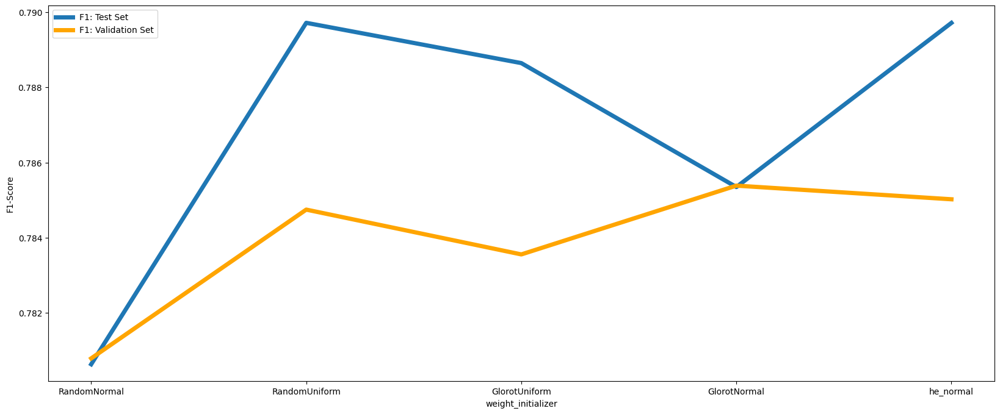

In [82]:
model,best_weight_initializer = evaluate_efect_param(parameter_type='model_params',parameter_name='weight_initializer', values_list=['RandomNormal', 'RandomUniform', 'GlorotUniform', 'GlorotNormal', 'he_normal'])
kfold_params['model_params']['weight_initializer'] = best_weight_initializer

## there are not sagnificant difference between weight initializers but he_normal and Randomuniform are doing good.

## choosing best architecture, i.e. number of neurons on and number of hidden layers:

Epoch 1/10
991/991 - 5s - loss: 0.5529 - precision_127: 0.7504 - recall_127: 0.6852 - val_loss: 0.5282 - val_precision_127: 0.7959 - val_recall_127: 0.6479 - 5s/epoch - 6ms/step
Epoch 2/10
991/991 - 2s - loss: 0.5029 - precision_127: 0.7965 - recall_127: 0.6917 - val_loss: 0.5069 - val_precision_127: 0.7894 - val_recall_127: 0.6570 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 2s - loss: 0.4801 - precision_127: 0.8030 - recall_127: 0.7145 - val_loss: 0.4919 - val_precision_127: 0.7845 - val_recall_127: 0.7271 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 2s - loss: 0.4657 - precision_127: 0.8013 - recall_127: 0.7289 - val_loss: 0.4780 - val_precision_127: 0.7837 - val_recall_127: 0.7454 - 2s/epoch - 2ms/step
Epoch 5/10
991/991 - 2s - loss: 0.4553 - precision_127: 0.8024 - recall_127: 0.7398 - val_loss: 0.4716 - val_precision_127: 0.7821 - val_recall_127: 0.7881 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 4s - loss: 0.4476 - precision_127: 0.8021 - recall_127: 0.7488 - val_loss: 0.4687 - val_p

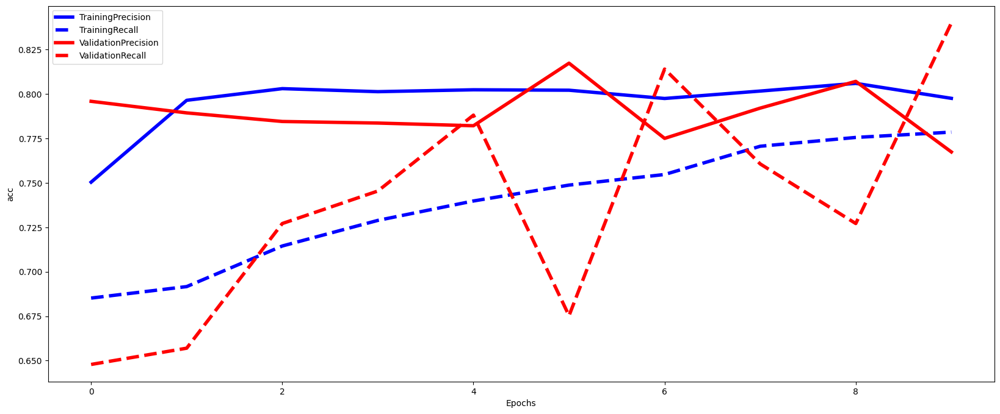

Epoch 1/10
991/991 - 4s - loss: 0.5590 - precision_128: 0.7485 - recall_128: 0.6653 - val_loss: 0.5225 - val_precision_128: 0.7909 - val_recall_128: 0.6706 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 4s - loss: 0.5076 - precision_128: 0.7964 - recall_128: 0.6828 - val_loss: 0.4940 - val_precision_128: 0.8064 - val_recall_128: 0.6766 - 4s/epoch - 4ms/step
Epoch 3/10
991/991 - 3s - loss: 0.4854 - precision_128: 0.7923 - recall_128: 0.7059 - val_loss: 0.4713 - val_precision_128: 0.8153 - val_recall_128: 0.6975 - 3s/epoch - 3ms/step
Epoch 4/10
991/991 - 2s - loss: 0.4725 - precision_128: 0.7987 - recall_128: 0.7224 - val_loss: 0.4595 - val_precision_128: 0.7945 - val_recall_128: 0.7317 - 2s/epoch - 2ms/step
Epoch 5/10
991/991 - 2s - loss: 0.4627 - precision_128: 0.7935 - recall_128: 0.7304 - val_loss: 0.4496 - val_precision_128: 0.8258 - val_recall_128: 0.7064 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 2s - loss: 0.4562 - precision_128: 0.7969 - recall_128: 0.7459 - val_loss: 0.4438 - val_p

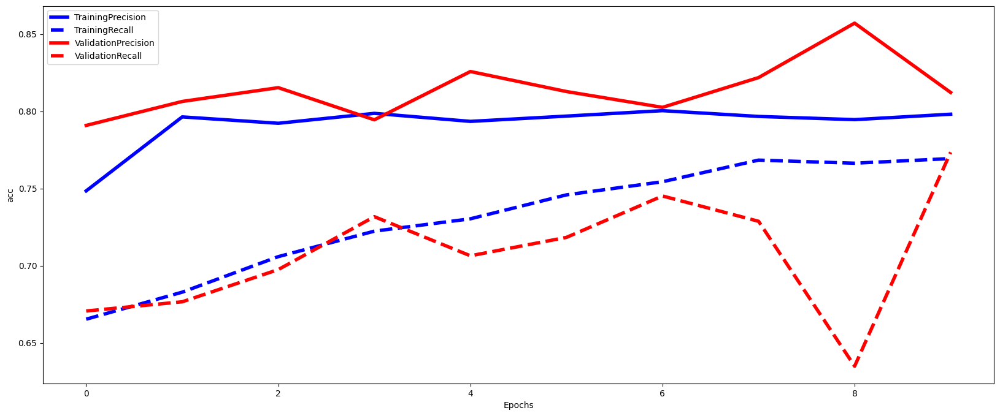

Epoch 1/10
991/991 - 3s - loss: 0.5683 - precision_129: 0.7458 - recall_129: 0.6667 - val_loss: 0.5165 - val_precision_129: 0.7774 - val_recall_129: 0.7068 - 3s/epoch - 3ms/step
Epoch 2/10
991/991 - 2s - loss: 0.5071 - precision_129: 0.7992 - recall_129: 0.6832 - val_loss: 0.4881 - val_precision_129: 0.8020 - val_recall_129: 0.7173 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 3s - loss: 0.4820 - precision_129: 0.8005 - recall_129: 0.7067 - val_loss: 0.4734 - val_precision_129: 0.7927 - val_recall_129: 0.7396 - 3s/epoch - 4ms/step
Epoch 4/10
991/991 - 4s - loss: 0.4655 - precision_129: 0.7976 - recall_129: 0.7257 - val_loss: 0.4650 - val_precision_129: 0.8141 - val_recall_129: 0.7232 - 4s/epoch - 4ms/step
Epoch 5/10
991/991 - 2s - loss: 0.4571 - precision_129: 0.8044 - recall_129: 0.7387 - val_loss: 0.4593 - val_precision_129: 0.7981 - val_recall_129: 0.7351 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 2s - loss: 0.4498 - precision_129: 0.8027 - recall_129: 0.7573 - val_loss: 0.4541 - val_p

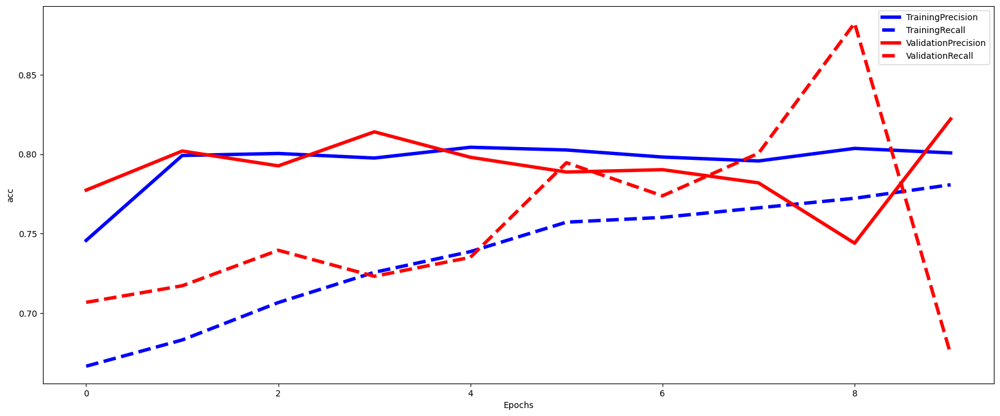

Epoch 1/10
991/991 - 3s - loss: 0.5584 - precision_130: 0.7519 - recall_130: 0.6763 - val_loss: 0.5111 - val_precision_130: 0.8056 - val_recall_130: 0.6855 - 3s/epoch - 3ms/step
Epoch 2/10
991/991 - 2s - loss: 0.5049 - precision_130: 0.7940 - recall_130: 0.6863 - val_loss: 0.4838 - val_precision_130: 0.8020 - val_recall_130: 0.7183 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 2s - loss: 0.4821 - precision_130: 0.8083 - recall_130: 0.6983 - val_loss: 0.4727 - val_precision_130: 0.7855 - val_recall_130: 0.7914 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 3s - loss: 0.4687 - precision_130: 0.8077 - recall_130: 0.7209 - val_loss: 0.4524 - val_precision_130: 0.8087 - val_recall_130: 0.7183 - 3s/epoch - 3ms/step
Epoch 5/10
991/991 - 4s - loss: 0.4581 - precision_130: 0.8003 - recall_130: 0.7399 - val_loss: 0.4470 - val_precision_130: 0.7922 - val_recall_130: 0.7556 - 4s/epoch - 4ms/step
Epoch 6/10
991/991 - 2s - loss: 0.4524 - precision_130: 0.8017 - recall_130: 0.7464 - val_loss: 0.4464 - val_p

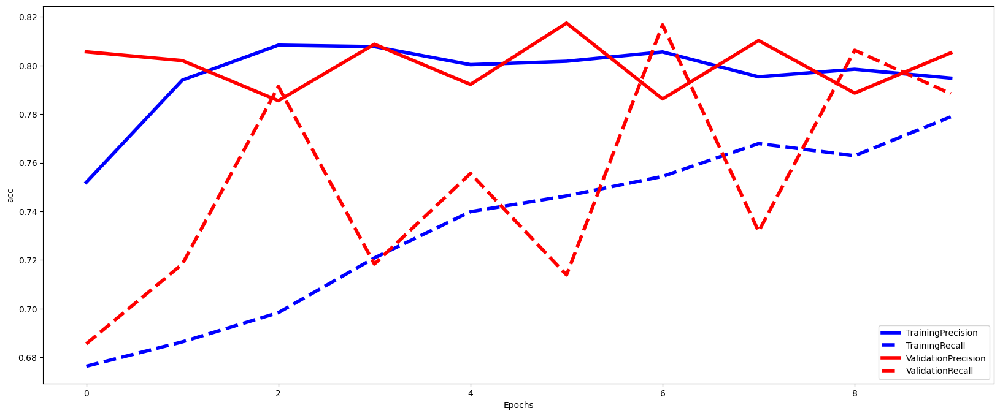

Average F1-Score over validation set is 0.79
STD of F1-Score over validation set is 0.02
42/42 [==============================] - 0s 3ms/step
Val: [32], Validation Score: 0.785, Test Score: 0.789


/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 5s - loss: 0.5529 - precision_131: 0.7756 - recall_131: 0.6281 - val_loss: 0.5300 - val_precision_131: 0.7701 - val_recall_131: 0.6433 - 5s/epoch - 5ms/step
Epoch 2/10
991/991 - 2s - loss: 0.5041 - precision_131: 0.7969 - recall_131: 0.6897 - val_loss: 0.5045 - val_precision_131: 0.8115 - val_recall_131: 0.6235 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 2s - loss: 0.4786 - precision_131: 0.8064 - recall_131: 0.7031 - val_loss: 0.4872 - val_precision_131: 0.7828 - val_recall_131: 0.7195 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 2s - loss: 0.4627 - precision_131: 0.8012 - recall_131: 0.7403 - val_loss: 0.4749 - val_precision_131: 0.8018 - val_recall_131: 0.6966 - 2s/epoch - 2ms/step
Epoch 5/10
991/991 - 4s - loss: 0.4528 - precision_131: 0.7924 - recall_131: 0.7562 - val_loss: 0.4620 - val_precision_131: 0.7919 - val_recall_131: 0.7485 - 4s/epoch - 4ms/step
Epoch 6/10
991/991 - 4s - loss: 0.4414 - precision_131: 0.7863 - recall_131: 0.7781 - val_loss: 0.4733 - val_p

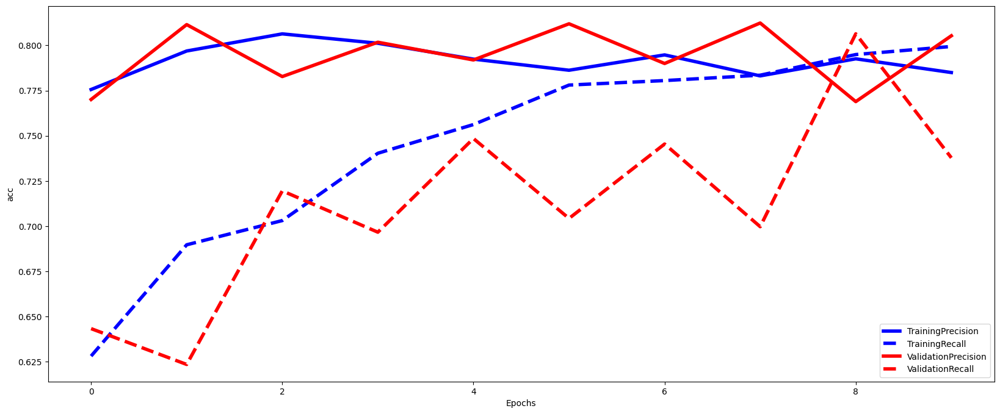

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 5s - loss: 0.5563 - precision_132: 0.7279 - recall_132: 0.6958 - val_loss: 0.5206 - val_precision_132: 0.8273 - val_recall_132: 0.6498 - 5s/epoch - 5ms/step
Epoch 2/10
991/991 - 3s - loss: 0.5075 - precision_132: 0.7928 - recall_132: 0.6793 - val_loss: 0.4885 - val_precision_132: 0.8144 - val_recall_132: 0.6736 - 3s/epoch - 3ms/step
Epoch 3/10
991/991 - 2s - loss: 0.4833 - precision_132: 0.7995 - recall_132: 0.6903 - val_loss: 0.4644 - val_precision_132: 0.8273 - val_recall_132: 0.6855 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 2s - loss: 0.4683 - precision_132: 0.7988 - recall_132: 0.7149 - val_loss: 0.4488 - val_precision_132: 0.7987 - val_recall_132: 0.7392 - 2s/epoch - 2ms/step
Epoch 5/10
991/991 - 2s - loss: 0.4585 - precision_132: 0.7970 - recall_132: 0.7484 - val_loss: 0.4493 - val_precision_132: 0.8240 - val_recall_132: 0.7049 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 3s - loss: 0.4536 - precision_132: 0.7929 - recall_132: 0.7489 - val_loss: 0.4490 - val_p

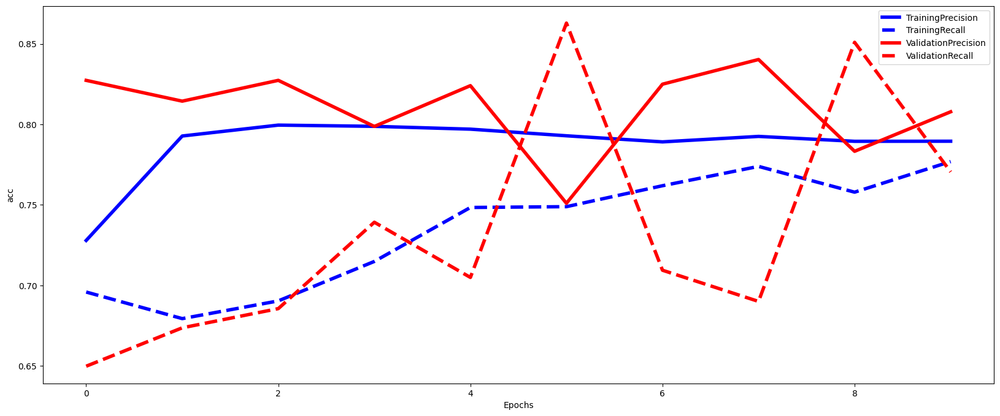

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 4s - loss: 0.5573 - precision_133: 0.7274 - recall_133: 0.6892 - val_loss: 0.5158 - val_precision_133: 0.8065 - val_recall_133: 0.6324 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 3s - loss: 0.5042 - precision_133: 0.7865 - recall_133: 0.6857 - val_loss: 0.5031 - val_precision_133: 0.7734 - val_recall_133: 0.7619 - 3s/epoch - 3ms/step
Epoch 3/10
991/991 - 3s - loss: 0.4830 - precision_133: 0.8007 - recall_133: 0.7057 - val_loss: 0.4833 - val_precision_133: 0.7762 - val_recall_133: 0.7381 - 3s/epoch - 3ms/step
Epoch 4/10
991/991 - 2s - loss: 0.4688 - precision_133: 0.8071 - recall_133: 0.7287 - val_loss: 0.4795 - val_precision_133: 0.7598 - val_recall_133: 0.8095 - 2s/epoch - 2ms/step
Epoch 5/10
991/991 - 2s - loss: 0.4585 - precision_133: 0.7991 - recall_133: 0.7407 - val_loss: 0.4845 - val_precision_133: 0.7379 - val_recall_133: 0.8631 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 2s - loss: 0.4526 - precision_133: 0.7984 - recall_133: 0.7553 - val_loss: 0.4660 - val_p

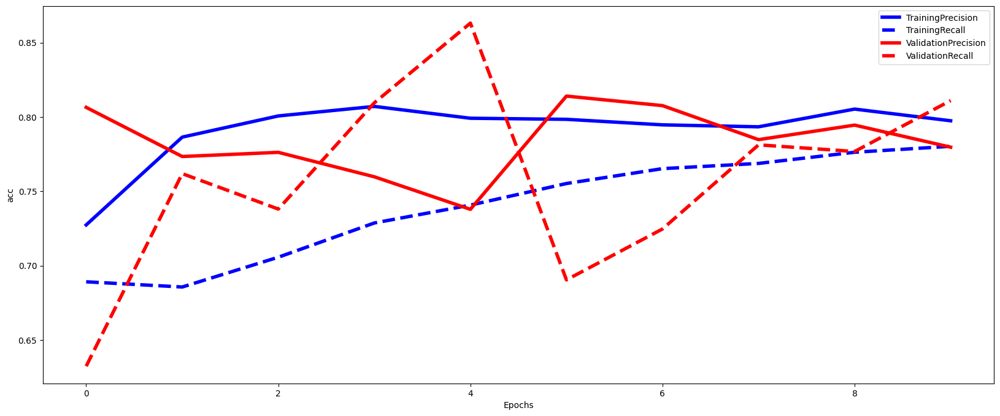

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 4s - loss: 0.5663 - precision_134: 0.7943 - recall_134: 0.5873 - val_loss: 0.5136 - val_precision_134: 0.8035 - val_recall_134: 0.6766 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 3s - loss: 0.5056 - precision_134: 0.7902 - recall_134: 0.6838 - val_loss: 0.4831 - val_precision_134: 0.7704 - val_recall_134: 0.7601 - 3s/epoch - 3ms/step
Epoch 3/10
991/991 - 4s - loss: 0.4746 - precision_134: 0.7914 - recall_134: 0.7289 - val_loss: 0.4612 - val_precision_134: 0.8129 - val_recall_134: 0.7124 - 4s/epoch - 4ms/step
Epoch 4/10
991/991 - 2s - loss: 0.4592 - precision_134: 0.7919 - recall_134: 0.7499 - val_loss: 0.4534 - val_precision_134: 0.8484 - val_recall_134: 0.6423 - 2s/epoch - 2ms/step
Epoch 5/10
991/991 - 2s - loss: 0.4508 - precision_134: 0.7911 - recall_134: 0.7634 - val_loss: 0.4443 - val_precision_134: 0.8039 - val_recall_134: 0.7392 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 2s - loss: 0.4453 - precision_134: 0.7825 - recall_134: 0.7974 - val_loss: 0.4404 - val_p

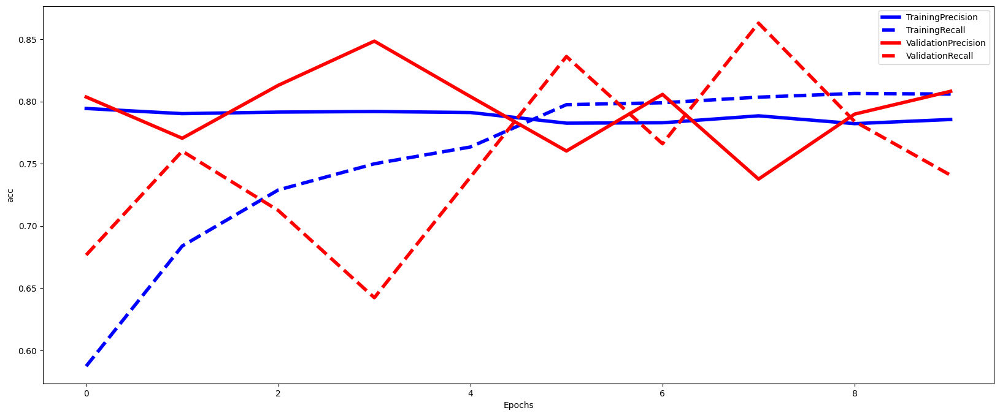

Average F1-Score over validation set is 0.78
STD of F1-Score over validation set is 0.00
42/42 [==============================] - 0s 2ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Val: [16, 32], Validation Score: 0.784, Test Score: 0.782
Epoch 1/10
991/991 - 3s - loss: 0.5513 - precision_135: 0.7567 - recall_135: 0.6763 - val_loss: 0.5265 - val_precision_135: 0.7736 - val_recall_135: 0.6616 - 3s/epoch - 3ms/step
Epoch 2/10
991/991 - 2s - loss: 0.4977 - precision_135: 0.8016 - recall_135: 0.6902 - val_loss: 0.4969 - val_precision_135: 0.7719 - val_recall_135: 0.7378 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 3s - loss: 0.4709 - precision_135: 0.7971 - recall_135: 0.7294 - val_loss: 0.4720 - val_precision_135: 0.8049 - val_recall_135: 0.7043 - 3s/epoch - 3ms/step
Epoch 4/10
991/991 - 3s - loss: 0.4559 - precision_135: 0.7973 - recall_135: 0.7577 - val_loss: 0.4680 - val_precision_135: 0.7448 - val_recall_135: 0.8186 - 3s/epoch - 3ms/step
Epoch 5/10
991/991 - 3s - loss: 0.4468 - precision_135: 0.7905 - recall_135: 0.7776 - val_loss: 0.4566 - val_precision_135: 0.7886 - val_recall_135: 0.7622 - 3s/epoch - 3ms/step
Epoch 6/10
991/991 - 2s - loss: 0.4430 - precision_1

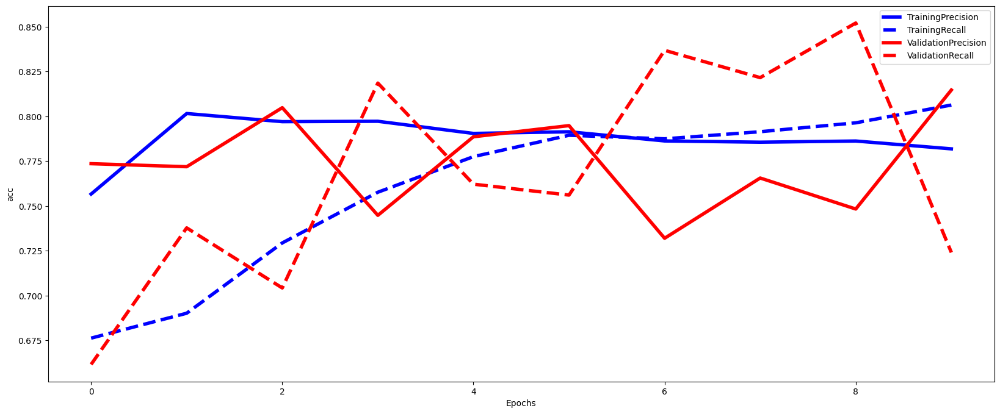

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 4s - loss: 0.5485 - precision_136: 0.7685 - recall_136: 0.6508 - val_loss: 0.5067 - val_precision_136: 0.8086 - val_recall_136: 0.6990 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 2s - loss: 0.4929 - precision_136: 0.7986 - recall_136: 0.6883 - val_loss: 0.4681 - val_precision_136: 0.7983 - val_recall_136: 0.7139 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 2s - loss: 0.4745 - precision_136: 0.7966 - recall_136: 0.7169 - val_loss: 0.4464 - val_precision_136: 0.8066 - val_recall_136: 0.7645 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 2s - loss: 0.4618 - precision_136: 0.7880 - recall_136: 0.7569 - val_loss: 0.4473 - val_precision_136: 0.8105 - val_recall_136: 0.7392 - 2s/epoch - 2ms/step
Epoch 5/10
991/991 - 3s - loss: 0.4573 - precision_136: 0.7891 - recall_136: 0.7654 - val_loss: 0.4375 - val_precision_136: 0.8090 - val_recall_136: 0.7258 - 3s/epoch - 3ms/step
Epoch 6/10
991/991 - 3s - loss: 0.4512 - precision_136: 0.7852 - recall_136: 0.7789 - val_loss: 0.4323 - val_p

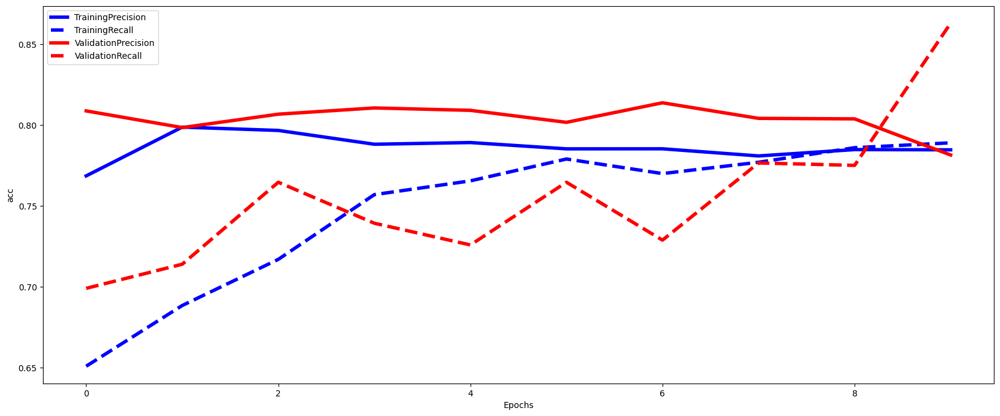

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 6s - loss: 0.5464 - precision_137: 0.7507 - recall_137: 0.6752 - val_loss: 0.4926 - val_precision_137: 0.8040 - val_recall_137: 0.7202 - 6s/epoch - 6ms/step
Epoch 2/10
991/991 - 3s - loss: 0.4848 - precision_137: 0.7986 - recall_137: 0.7047 - val_loss: 0.4782 - val_precision_137: 0.7756 - val_recall_137: 0.7098 - 3s/epoch - 3ms/step
Epoch 3/10
991/991 - 2s - loss: 0.4649 - precision_137: 0.7952 - recall_137: 0.7462 - val_loss: 0.4837 - val_precision_137: 0.8468 - val_recall_137: 0.6086 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 2s - loss: 0.4522 - precision_137: 0.7956 - recall_137: 0.7598 - val_loss: 0.4726 - val_precision_137: 0.7343 - val_recall_137: 0.8884 - 2s/epoch - 2ms/step
Epoch 5/10
991/991 - 2s - loss: 0.4462 - precision_137: 0.7916 - recall_137: 0.7698 - val_loss: 0.4556 - val_precision_137: 0.7901 - val_recall_137: 0.7619 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 4s - loss: 0.4440 - precision_137: 0.7892 - recall_137: 0.7833 - val_loss: 0.4564 - val_p

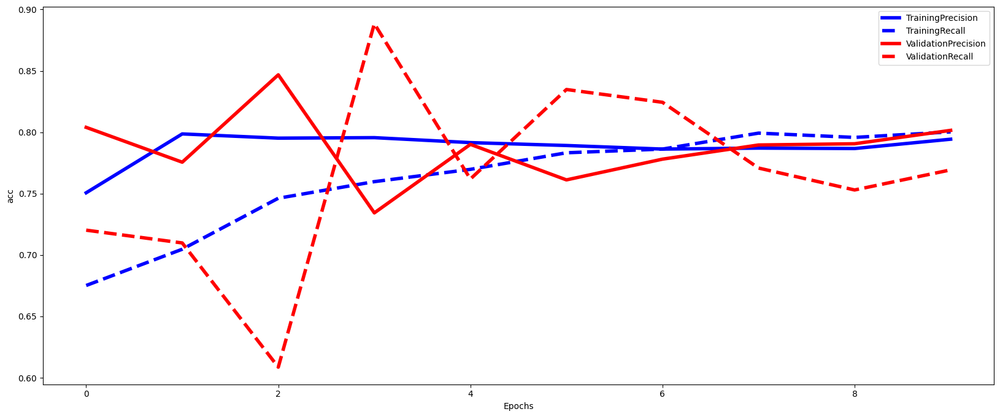

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 5s - loss: 0.5521 - precision_138: 0.7833 - recall_138: 0.6328 - val_loss: 0.5167 - val_precision_138: 0.8194 - val_recall_138: 0.6155 - 5s/epoch - 5ms/step
Epoch 2/10
991/991 - 3s - loss: 0.4946 - precision_138: 0.8014 - recall_138: 0.6823 - val_loss: 0.4623 - val_precision_138: 0.7968 - val_recall_138: 0.7422 - 3s/epoch - 3ms/step
Epoch 3/10
991/991 - 2s - loss: 0.4698 - precision_138: 0.7943 - recall_138: 0.7359 - val_loss: 0.4846 - val_precision_138: 0.8299 - val_recall_138: 0.6617 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 2s - loss: 0.4573 - precision_138: 0.7883 - recall_138: 0.7544 - val_loss: 0.4837 - val_precision_138: 0.6899 - val_recall_138: 0.9151 - 2s/epoch - 2ms/step
Epoch 5/10
991/991 - 2s - loss: 0.4502 - precision_138: 0.7850 - recall_138: 0.7819 - val_loss: 0.4449 - val_precision_138: 0.8123 - val_recall_138: 0.7288 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 2s - loss: 0.4462 - precision_138: 0.7903 - recall_138: 0.7824 - val_loss: 0.4334 - val_p

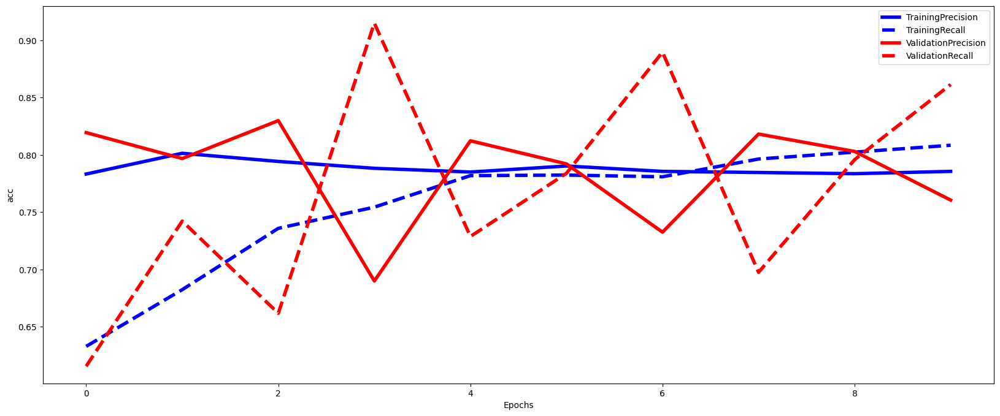

Average F1-Score over validation set is 0.79
STD of F1-Score over validation set is 0.01
42/42 [==============================] - 0s 2ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Val: [32, 32], Validation Score: 0.791, Test Score: 0.791
Epoch 1/10
991/991 - 4s - loss: 0.5389 - precision_139: 0.7874 - recall_139: 0.6584 - val_loss: 0.5074 - val_precision_139: 0.7856 - val_recall_139: 0.6814 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 3s - loss: 0.4861 - precision_139: 0.7927 - recall_139: 0.7140 - val_loss: 0.4882 - val_precision_139: 0.7692 - val_recall_139: 0.7470 - 3s/epoch - 3ms/step
Epoch 3/10
991/991 - 4s - loss: 0.4722 - precision_139: 0.7922 - recall_139: 0.7478 - val_loss: 0.4747 - val_precision_139: 0.8062 - val_recall_139: 0.7104 - 4s/epoch - 4ms/step
Epoch 4/10
991/991 - 3s - loss: 0.4595 - precision_139: 0.7854 - recall_139: 0.7651 - val_loss: 0.4957 - val_precision_139: 0.8168 - val_recall_139: 0.6524 - 3s/epoch - 3ms/step
Epoch 5/10
991/991 - 2s - loss: 0.4524 - precision_139: 0.7878 - recall_139: 0.7761 - val_loss: 0.4605 - val_precision_139: 0.7708 - val_recall_139: 0.7896 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 2s - loss: 0.4462 - precision_1

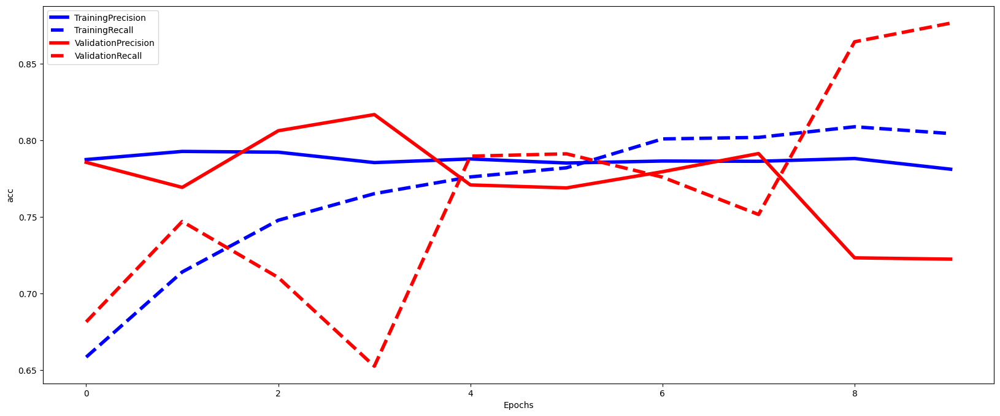

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 4s - loss: 0.5564 - precision_140: 0.7684 - recall_140: 0.6473 - val_loss: 0.5125 - val_precision_140: 0.8247 - val_recall_140: 0.6662 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 3s - loss: 0.4959 - precision_140: 0.7970 - recall_140: 0.6913 - val_loss: 0.4939 - val_precision_140: 0.8894 - val_recall_140: 0.5395 - 3s/epoch - 3ms/step
Epoch 3/10
991/991 - 4s - loss: 0.4731 - precision_140: 0.7966 - recall_140: 0.7269 - val_loss: 0.4531 - val_precision_140: 0.7768 - val_recall_140: 0.8301 - 4s/epoch - 4ms/step
Epoch 4/10
991/991 - 3s - loss: 0.4616 - precision_140: 0.7917 - recall_140: 0.7474 - val_loss: 0.4405 - val_precision_140: 0.7822 - val_recall_140: 0.8241 - 3s/epoch - 3ms/step
Epoch 5/10
991/991 - 2s - loss: 0.4556 - precision_140: 0.7873 - recall_140: 0.7594 - val_loss: 0.4334 - val_precision_140: 0.8119 - val_recall_140: 0.7332 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 3s - loss: 0.4501 - precision_140: 0.7855 - recall_140: 0.7729 - val_loss: 0.4216 - val_p

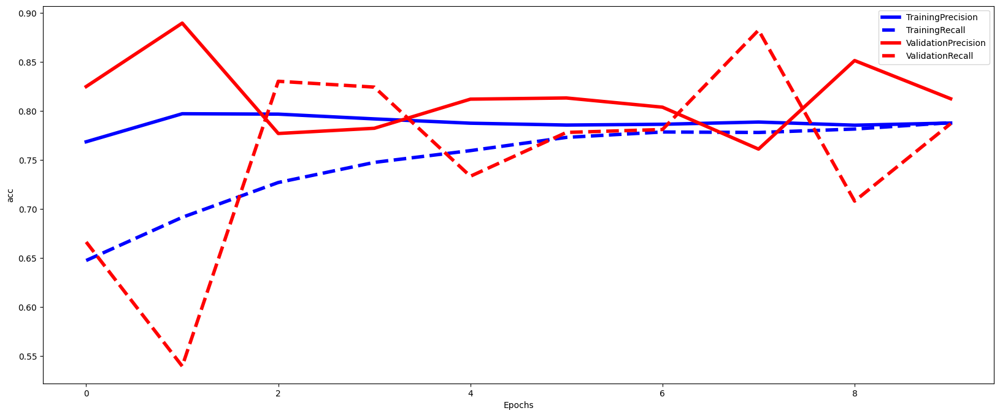

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 4s - loss: 0.5500 - precision_141: 0.7743 - recall_141: 0.6421 - val_loss: 0.5084 - val_precision_141: 0.7907 - val_recall_141: 0.6801 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 2s - loss: 0.4903 - precision_141: 0.7889 - recall_141: 0.7127 - val_loss: 0.4777 - val_precision_141: 0.7872 - val_recall_141: 0.7485 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 2s - loss: 0.4673 - precision_141: 0.7954 - recall_141: 0.7452 - val_loss: 0.4649 - val_precision_141: 0.7956 - val_recall_141: 0.7530 - 2s/epoch - 3ms/step
Epoch 4/10
991/991 - 3s - loss: 0.4545 - precision_141: 0.7888 - recall_141: 0.7663 - val_loss: 0.4855 - val_precision_141: 0.7273 - val_recall_141: 0.8810 - 3s/epoch - 3ms/step
Epoch 5/10
991/991 - 4s - loss: 0.4511 - precision_141: 0.7838 - recall_141: 0.7803 - val_loss: 0.4586 - val_precision_141: 0.8009 - val_recall_141: 0.7604 - 4s/epoch - 4ms/step
Epoch 6/10
991/991 - 3s - loss: 0.4450 - precision_141: 0.7908 - recall_141: 0.7778 - val_loss: 0.4579 - val_p

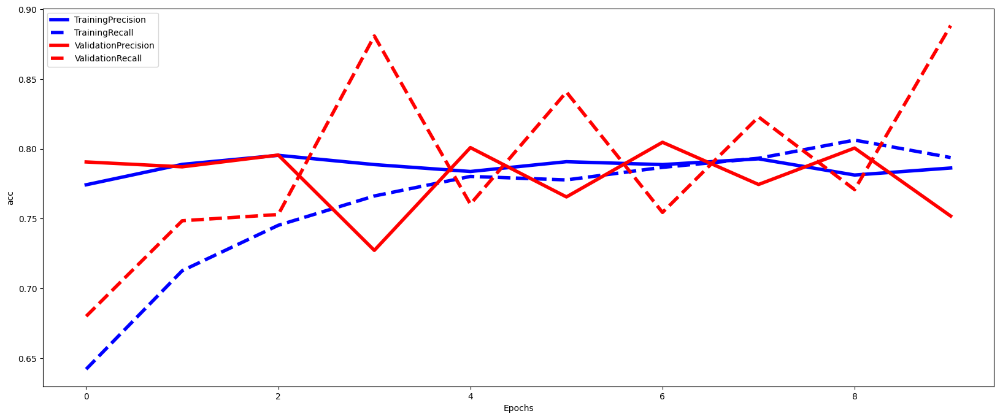

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 6s - loss: 0.5626 - precision_142: 0.7750 - recall_142: 0.6288 - val_loss: 0.5119 - val_precision_142: 0.8106 - val_recall_142: 0.6632 - 6s/epoch - 6ms/step
Epoch 2/10
991/991 - 3s - loss: 0.4998 - precision_142: 0.7862 - recall_142: 0.6933 - val_loss: 0.4638 - val_precision_142: 0.8100 - val_recall_142: 0.6990 - 3s/epoch - 3ms/step
Epoch 3/10
991/991 - 2s - loss: 0.4689 - precision_142: 0.7896 - recall_142: 0.7324 - val_loss: 0.4534 - val_precision_142: 0.8182 - val_recall_142: 0.6841 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 3s - loss: 0.4573 - precision_142: 0.7901 - recall_142: 0.7534 - val_loss: 0.4493 - val_precision_142: 0.8110 - val_recall_142: 0.7228 - 3s/epoch - 3ms/step
Epoch 5/10
991/991 - 2s - loss: 0.4521 - precision_142: 0.7827 - recall_142: 0.7624 - val_loss: 0.4434 - val_precision_142: 0.7966 - val_recall_142: 0.7765 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 4s - loss: 0.4467 - precision_142: 0.7814 - recall_142: 0.7759 - val_loss: 0.4569 - val_p

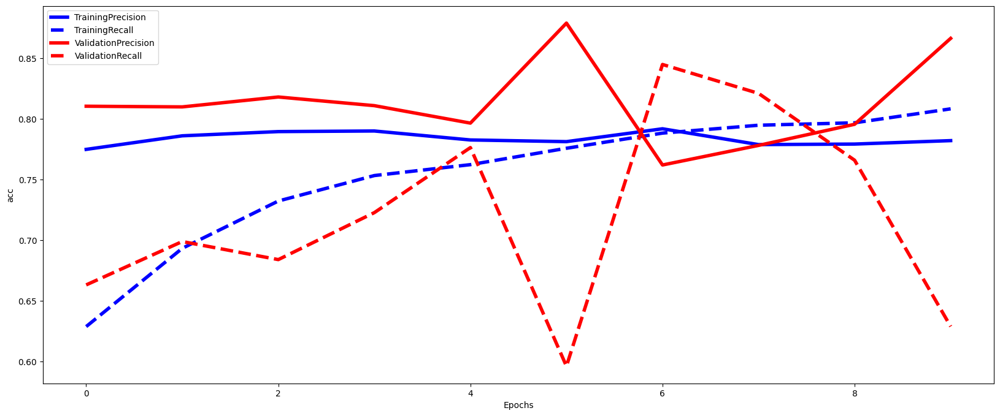

Average F1-Score over validation set is 0.78
STD of F1-Score over validation set is 0.02
42/42 [==============================] - 0s 2ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Val: [16, 32, 32], Validation Score: 0.780, Test Score: 0.793
Epoch 1/10
991/991 - 8s - loss: 0.5437 - precision_143: 0.7729 - recall_143: 0.6693 - val_loss: 0.5239 - val_precision_143: 0.8163 - val_recall_143: 0.5960 - 8s/epoch - 8ms/step
Epoch 2/10
991/991 - 3s - loss: 0.4911 - precision_143: 0.7902 - recall_143: 0.7145 - val_loss: 0.4942 - val_precision_143: 0.7598 - val_recall_143: 0.7668 - 3s/epoch - 3ms/step
Epoch 3/10
991/991 - 3s - loss: 0.4676 - precision_143: 0.7901 - recall_143: 0.7532 - val_loss: 0.5112 - val_precision_143: 0.7411 - val_recall_143: 0.8293 - 3s/epoch - 3ms/step
Epoch 4/10
991/991 - 3s - loss: 0.4550 - precision_143: 0.7859 - recall_143: 0.7711 - val_loss: 0.4780 - val_precision_143: 0.7406 - val_recall_143: 0.8140 - 3s/epoch - 3ms/step
Epoch 5/10
991/991 - 3s - loss: 0.4486 - precision_143: 0.7863 - recall_143: 0.7820 - val_loss: 0.4633 - val_precision_143: 0.7973 - val_recall_143: 0.7134 - 3s/epoch - 3ms/step
Epoch 6/10
991/991 - 5s - loss: 0.4426 - precisi

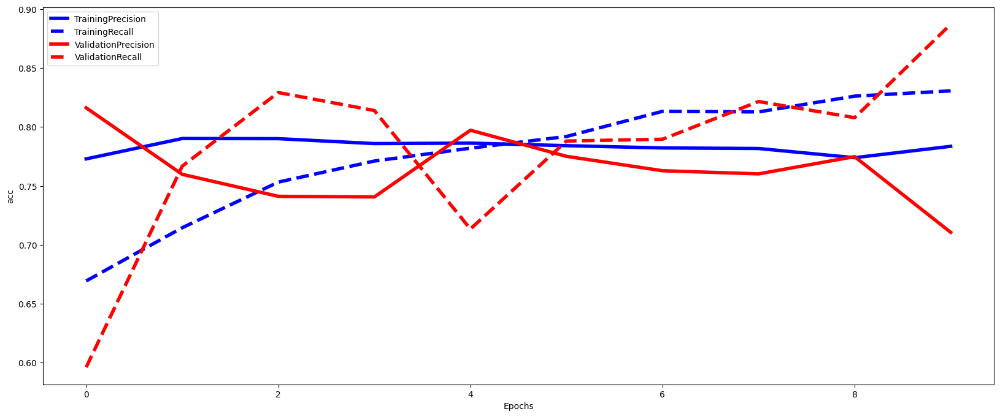

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 4s - loss: 0.5441 - precision_144: 0.7600 - recall_144: 0.6668 - val_loss: 0.5100 - val_precision_144: 0.8021 - val_recall_144: 0.6766 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 4s - loss: 0.4932 - precision_144: 0.7787 - recall_144: 0.7149 - val_loss: 0.4665 - val_precision_144: 0.7861 - val_recall_144: 0.7228 - 4s/epoch - 4ms/step
Epoch 3/10
991/991 - 4s - loss: 0.4755 - precision_144: 0.7747 - recall_144: 0.7449 - val_loss: 0.4622 - val_precision_144: 0.7493 - val_recall_144: 0.8286 - 4s/epoch - 4ms/step
Epoch 4/10
991/991 - 3s - loss: 0.4687 - precision_144: 0.7774 - recall_144: 0.7704 - val_loss: 0.4439 - val_precision_144: 0.8138 - val_recall_144: 0.7556 - 3s/epoch - 3ms/step
Epoch 5/10
991/991 - 3s - loss: 0.4602 - precision_144: 0.7726 - recall_144: 0.7699 - val_loss: 0.4359 - val_precision_144: 0.8183 - val_recall_144: 0.7586 - 3s/epoch - 3ms/step
Epoch 6/10
991/991 - 3s - loss: 0.4564 - precision_144: 0.7731 - recall_144: 0.7754 - val_loss: 0.4378 - val_p

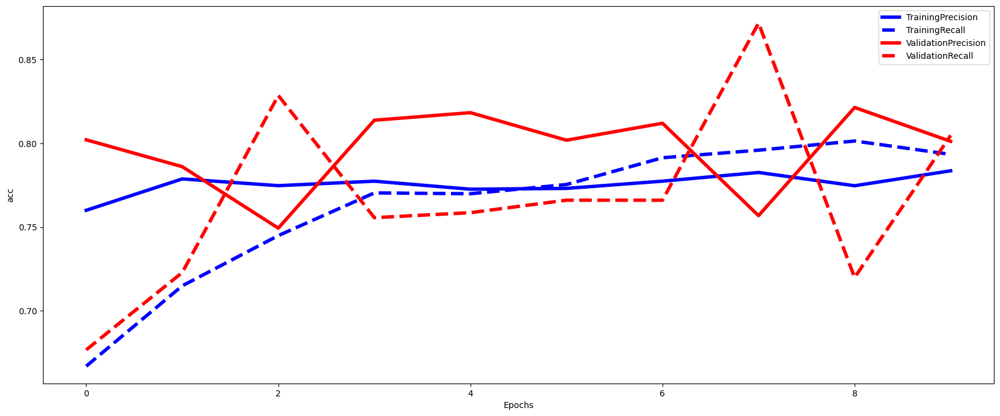

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 4s - loss: 0.5431 - precision_145: 0.7700 - recall_145: 0.6517 - val_loss: 0.5270 - val_precision_145: 0.7398 - val_recall_145: 0.7827 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 3s - loss: 0.4874 - precision_145: 0.7908 - recall_145: 0.7152 - val_loss: 0.4694 - val_precision_145: 0.8006 - val_recall_145: 0.7351 - 3s/epoch - 3ms/step
Epoch 3/10
991/991 - 3s - loss: 0.4681 - precision_145: 0.7841 - recall_145: 0.7487 - val_loss: 0.4692 - val_precision_145: 0.7622 - val_recall_145: 0.8155 - 3s/epoch - 3ms/step
Epoch 4/10
991/991 - 5s - loss: 0.4547 - precision_145: 0.7851 - recall_145: 0.7863 - val_loss: 0.4878 - val_precision_145: 0.8390 - val_recall_145: 0.6280 - 5s/epoch - 5ms/step
Epoch 5/10
991/991 - 3s - loss: 0.4480 - precision_145: 0.7870 - recall_145: 0.7823 - val_loss: 0.4592 - val_precision_145: 0.7765 - val_recall_145: 0.8065 - 3s/epoch - 3ms/step
Epoch 6/10
991/991 - 3s - loss: 0.4425 - precision_145: 0.7838 - recall_145: 0.8018 - val_loss: 0.4553 - val_p

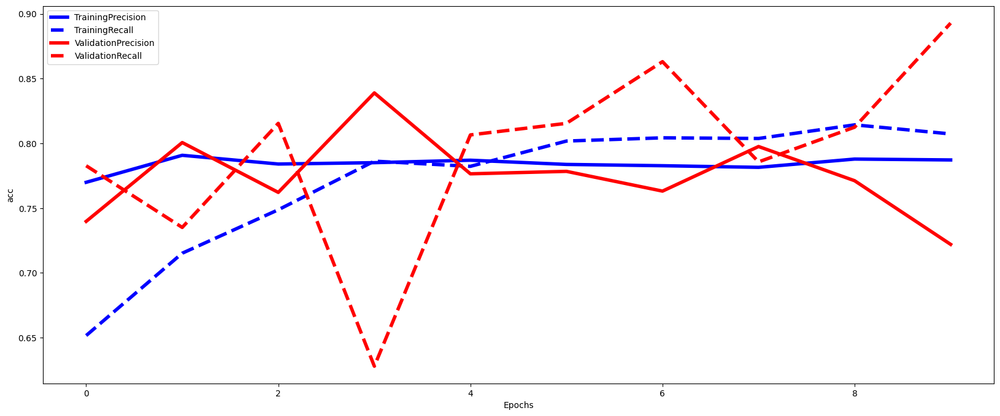

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 4s - loss: 0.5500 - precision_146: 0.7714 - recall_146: 0.6313 - val_loss: 0.5033 - val_precision_146: 0.8182 - val_recall_146: 0.6304 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 3s - loss: 0.4975 - precision_146: 0.7899 - recall_146: 0.6978 - val_loss: 0.4741 - val_precision_146: 0.7740 - val_recall_146: 0.7809 - 3s/epoch - 3ms/step
Epoch 3/10
991/991 - 4s - loss: 0.4726 - precision_146: 0.7930 - recall_146: 0.7359 - val_loss: 0.4790 - val_precision_146: 0.7194 - val_recall_146: 0.8748 - 4s/epoch - 4ms/step
Epoch 4/10
991/991 - 4s - loss: 0.4616 - precision_146: 0.7799 - recall_146: 0.7694 - val_loss: 0.4647 - val_precision_146: 0.8135 - val_recall_146: 0.7019 - 4s/epoch - 4ms/step
Epoch 5/10
991/991 - 3s - loss: 0.4520 - precision_146: 0.7814 - recall_146: 0.7849 - val_loss: 0.4469 - val_precision_146: 0.7839 - val_recall_146: 0.8107 - 3s/epoch - 3ms/step
Epoch 6/10
991/991 - 3s - loss: 0.4503 - precision_146: 0.7745 - recall_146: 0.7939 - val_loss: 0.4401 - val_p

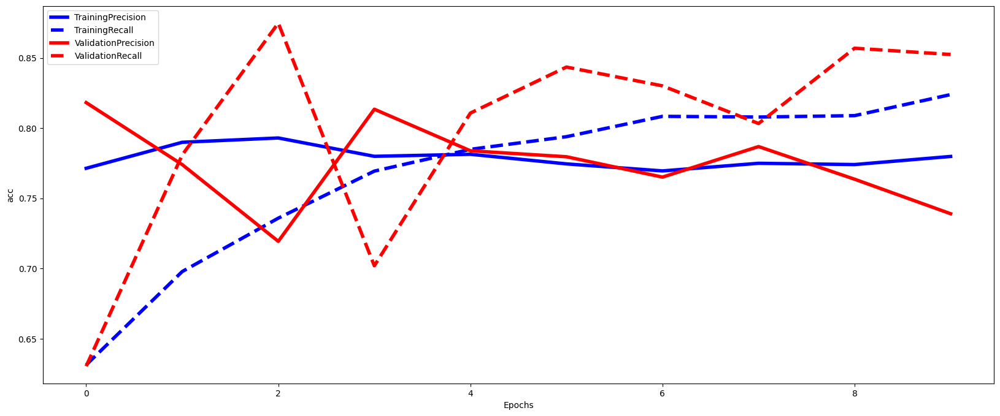

Average F1-Score over validation set is 0.77
STD of F1-Score over validation set is 0.01
42/42 [==============================] - 0s 2ms/step
Val: [32, 32, 32, 64], Validation Score: 0.774, Test Score: 0.794


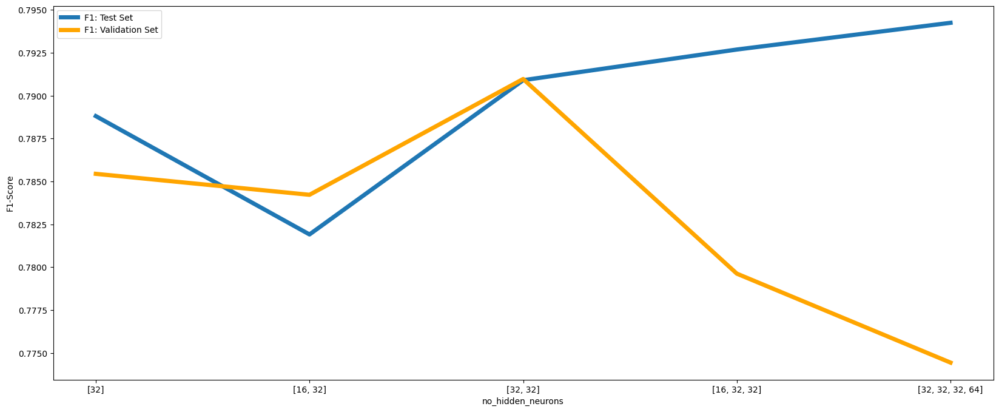

In [83]:
model,best_architecture = evaluate_efect_param(parameter_type='model_params',parameter_name='no_hidden_neurons',values_list=[[32],[16, 32],[32, 32], [16, 32, 32], [32, 32, 32, 64]])
kfold_params['model_params']['no_hidden_neurons'] = best_architecture

## choosing best value for L1 reqularizer:

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 4s - loss: 0.5441 - precision_147: 0.7636 - recall_147: 0.6609 - val_loss: 0.5097 - val_precision_147: 0.7921 - val_recall_147: 0.6448 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 2s - loss: 0.4824 - precision_147: 0.8048 - recall_147: 0.7041 - val_loss: 0.5101 - val_precision_147: 0.7471 - val_recall_147: 0.7835 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 2s - loss: 0.4638 - precision_147: 0.7977 - recall_147: 0.7498 - val_loss: 0.4668 - val_precision_147: 0.7827 - val_recall_147: 0.7470 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 3s - loss: 0.4500 - precision_147: 0.7926 - recall_147: 0.7686 - val_loss: 0.4811 - val_precision_147: 0.7504 - val_recall_147: 0.8018 - 3s/epoch - 3ms/step
Epoch 5/10
991/991 - 4s - loss: 0.4440 - precision_147: 0.7892 - recall_147: 0.7825 - val_loss: 0.4758 - val_precision_147: 0.8337 - val_recall_147: 0.6341 - 4s/epoch - 4ms/step
Epoch 6/10
991/991 - 3s - loss: 0.4399 - precision_147: 0.7906 - recall_147: 0.7910 - val_loss: 0.4512 - val_p

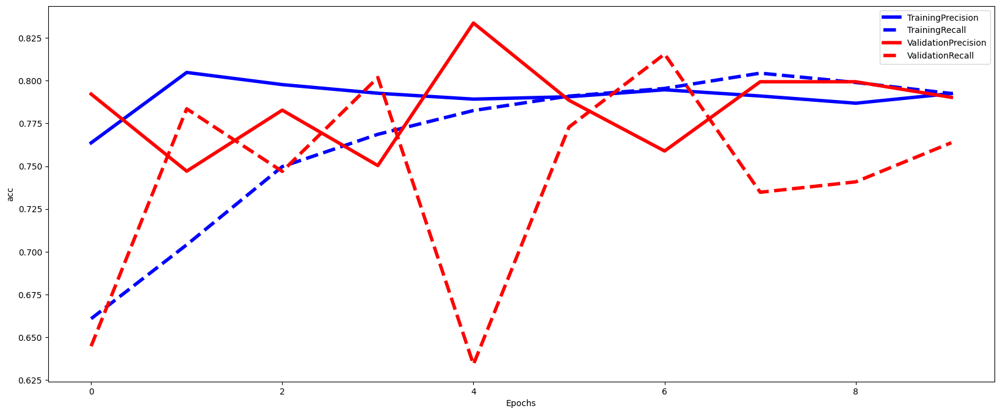

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 6s - loss: 0.5481 - precision_148: 0.7472 - recall_148: 0.6743 - val_loss: 0.5080 - val_precision_148: 0.8310 - val_recall_148: 0.6080 - 6s/epoch - 6ms/step
Epoch 2/10
991/991 - 2s - loss: 0.4940 - precision_148: 0.8006 - recall_148: 0.6908 - val_loss: 0.4688 - val_precision_148: 0.8048 - val_recall_148: 0.7064 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 2s - loss: 0.4724 - precision_148: 0.8075 - recall_148: 0.7284 - val_loss: 0.4567 - val_precision_148: 0.8278 - val_recall_148: 0.6736 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 2s - loss: 0.4628 - precision_148: 0.7914 - recall_148: 0.7419 - val_loss: 0.4424 - val_precision_148: 0.8098 - val_recall_148: 0.7615 - 2s/epoch - 2ms/step
Epoch 5/10
991/991 - 2s - loss: 0.4570 - precision_148: 0.7960 - recall_148: 0.7614 - val_loss: 0.4386 - val_precision_148: 0.7884 - val_recall_148: 0.8107 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 4s - loss: 0.4518 - precision_148: 0.7951 - recall_148: 0.7669 - val_loss: 0.4428 - val_p

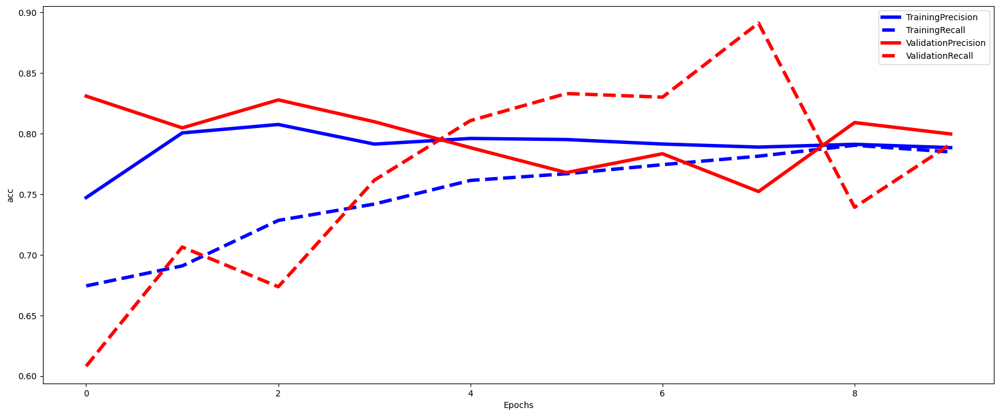

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 5s - loss: 0.5596 - precision_149: 0.7927 - recall_149: 0.6011 - val_loss: 0.5070 - val_precision_149: 0.7703 - val_recall_149: 0.7485 - 5s/epoch - 5ms/step
Epoch 2/10
991/991 - 4s - loss: 0.4887 - precision_149: 0.7983 - recall_149: 0.7072 - val_loss: 0.4799 - val_precision_149: 0.7664 - val_recall_149: 0.7812 - 4s/epoch - 4ms/step
Epoch 3/10
991/991 - 3s - loss: 0.4632 - precision_149: 0.7969 - recall_149: 0.7563 - val_loss: 0.4630 - val_precision_149: 0.7720 - val_recall_149: 0.8214 - 3s/epoch - 3ms/step
Epoch 4/10
991/991 - 2s - loss: 0.4540 - precision_149: 0.7845 - recall_149: 0.7763 - val_loss: 0.4580 - val_precision_149: 0.7799 - val_recall_149: 0.7961 - 2s/epoch - 3ms/step
Epoch 5/10
991/991 - 2s - loss: 0.4498 - precision_149: 0.7839 - recall_149: 0.7773 - val_loss: 0.4665 - val_precision_149: 0.7852 - val_recall_149: 0.7887 - 2s/epoch - 3ms/step
Epoch 6/10
991/991 - 3s - loss: 0.4450 - precision_149: 0.7855 - recall_149: 0.7863 - val_loss: 0.4684 - val_p

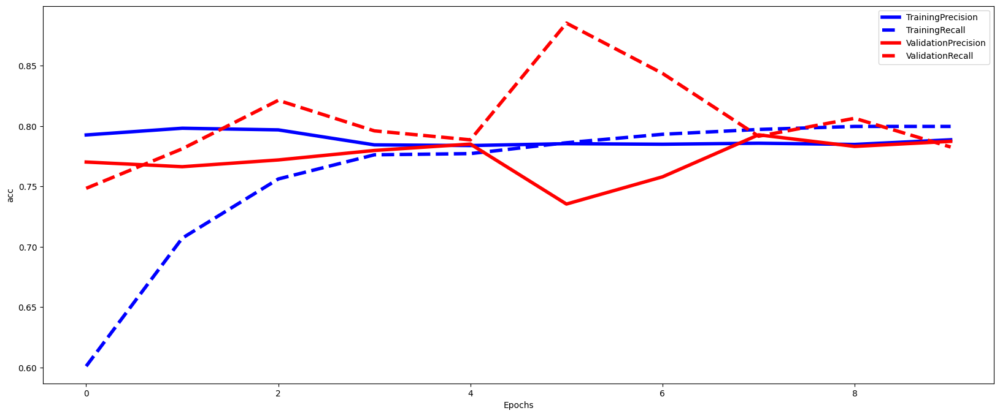

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 4s - loss: 0.5506 - precision_150: 0.7506 - recall_150: 0.6803 - val_loss: 0.5026 - val_precision_150: 0.8177 - val_recall_150: 0.6751 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 2s - loss: 0.4962 - precision_150: 0.8014 - recall_150: 0.6923 - val_loss: 0.4700 - val_precision_150: 0.8050 - val_recall_150: 0.7258 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 4s - loss: 0.4698 - precision_150: 0.7914 - recall_150: 0.7419 - val_loss: 0.4708 - val_precision_150: 0.8649 - val_recall_150: 0.6200 - 4s/epoch - 4ms/step
Epoch 4/10
991/991 - 4s - loss: 0.4571 - precision_150: 0.7914 - recall_150: 0.7649 - val_loss: 0.4479 - val_precision_150: 0.7900 - val_recall_150: 0.7794 - 4s/epoch - 4ms/step
Epoch 5/10
991/991 - 3s - loss: 0.4488 - precision_150: 0.7892 - recall_150: 0.7864 - val_loss: 0.4539 - val_precision_150: 0.8065 - val_recall_150: 0.7392 - 3s/epoch - 3ms/step
Epoch 6/10
991/991 - 3s - loss: 0.4440 - precision_150: 0.7898 - recall_150: 0.7839 - val_loss: 0.4499 - val_p

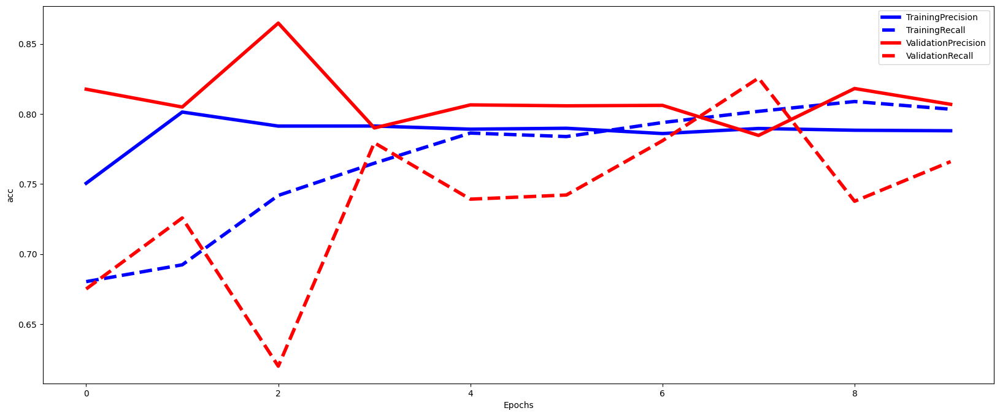

Average F1-Score over validation set is 0.79
STD of F1-Score over validation set is 0.00
42/42 [==============================] - 0s 2ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Val: 1e-05, Validation Score: 0.786, Test Score: 0.791
Epoch 1/10
991/991 - 5s - loss: 0.5634 - precision_151: 0.7761 - recall_151: 0.6643 - val_loss: 0.5464 - val_precision_151: 0.7944 - val_recall_151: 0.6951 - 5s/epoch - 5ms/step
Epoch 2/10
991/991 - 2s - loss: 0.5059 - precision_151: 0.8093 - recall_151: 0.7036 - val_loss: 0.5042 - val_precision_151: 0.8064 - val_recall_151: 0.6921 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 2s - loss: 0.4866 - precision_151: 0.7965 - recall_151: 0.7443 - val_loss: 0.4979 - val_precision_151: 0.7490 - val_recall_151: 0.8232 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 2s - loss: 0.4762 - precision_151: 0.7926 - recall_151: 0.7627 - val_loss: 0.4890 - val_precision_151: 0.7637 - val_recall_151: 0.8079 - 2s/epoch - 2ms/step
Epoch 5/10
991/991 - 3s - loss: 0.4700 - precision_151: 0.7855 - recall_151: 0.7781 - val_loss: 0.4813 - val_precision_151: 0.7840 - val_recall_151: 0.7912 - 3s/epoch - 3ms/step
Epoch 6/10
991/991 - 4s - loss: 0.4669 - precision_151:

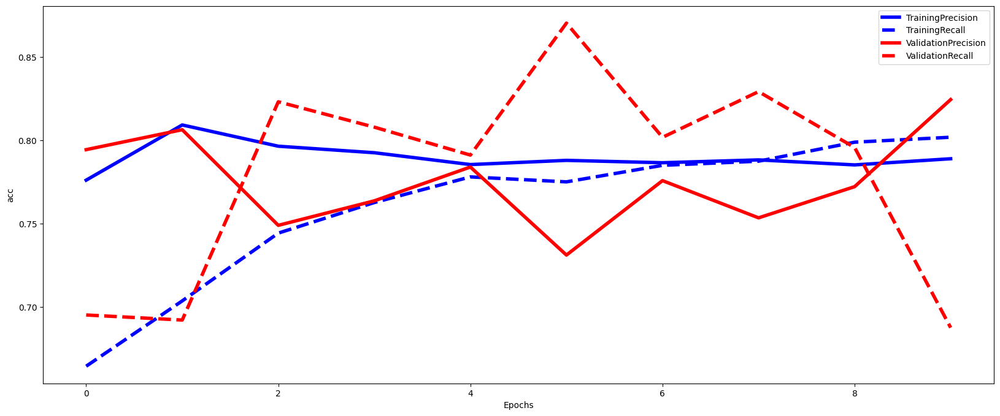

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 6s - loss: 0.5650 - precision_152: 0.7593 - recall_152: 0.6768 - val_loss: 0.5262 - val_precision_152: 0.7833 - val_recall_152: 0.6841 - 6s/epoch - 6ms/step
Epoch 2/10
991/991 - 3s - loss: 0.5171 - precision_152: 0.7951 - recall_152: 0.6948 - val_loss: 0.4966 - val_precision_152: 0.8066 - val_recall_152: 0.6960 - 3s/epoch - 3ms/step
Epoch 3/10
991/991 - 3s - loss: 0.4967 - precision_152: 0.7929 - recall_152: 0.7239 - val_loss: 0.4842 - val_precision_152: 0.7791 - val_recall_152: 0.7988 - 3s/epoch - 3ms/step
Epoch 4/10
991/991 - 2s - loss: 0.4823 - precision_152: 0.7907 - recall_152: 0.7464 - val_loss: 0.4733 - val_precision_152: 0.7716 - val_recall_152: 0.8510 - 2s/epoch - 2ms/step
Epoch 5/10
991/991 - 2s - loss: 0.4773 - precision_152: 0.7883 - recall_152: 0.7564 - val_loss: 0.4529 - val_precision_152: 0.8214 - val_recall_152: 0.7675 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 4s - loss: 0.4739 - precision_152: 0.7861 - recall_152: 0.7649 - val_loss: 0.4578 - val_p

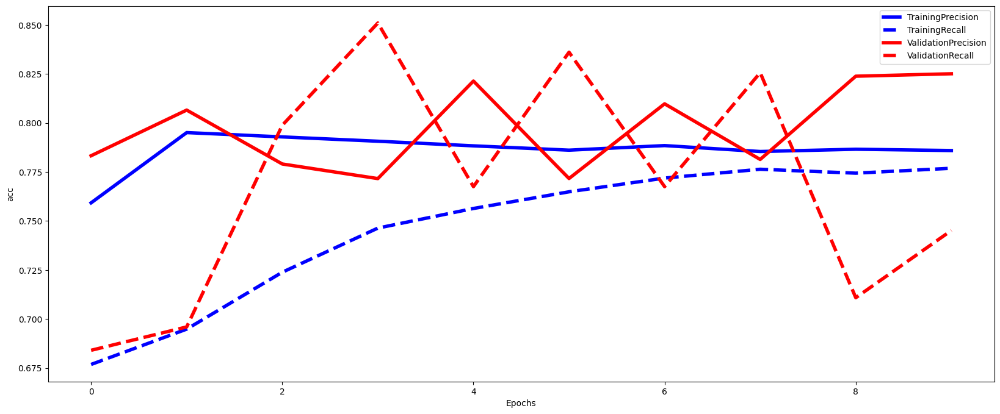

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 4s - loss: 0.5667 - precision_153: 0.7636 - recall_153: 0.6627 - val_loss: 0.5326 - val_precision_153: 0.7492 - val_recall_153: 0.7381 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 4s - loss: 0.5137 - precision_153: 0.7943 - recall_153: 0.6917 - val_loss: 0.5107 - val_precision_153: 0.7493 - val_recall_153: 0.7827 - 4s/epoch - 4ms/step
Epoch 3/10
991/991 - 4s - loss: 0.4899 - precision_153: 0.7897 - recall_153: 0.7312 - val_loss: 0.4888 - val_precision_153: 0.7987 - val_recall_153: 0.7381 - 4s/epoch - 4ms/step
Epoch 4/10
991/991 - 2s - loss: 0.4791 - precision_153: 0.7865 - recall_153: 0.7578 - val_loss: 0.4928 - val_precision_153: 0.7599 - val_recall_153: 0.7961 - 2s/epoch - 2ms/step
Epoch 5/10
991/991 - 2s - loss: 0.4702 - precision_153: 0.7888 - recall_153: 0.7703 - val_loss: 0.4860 - val_precision_153: 0.7564 - val_recall_153: 0.8363 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 2s - loss: 0.4662 - precision_153: 0.7876 - recall_153: 0.7758 - val_loss: 0.4716 - val_p

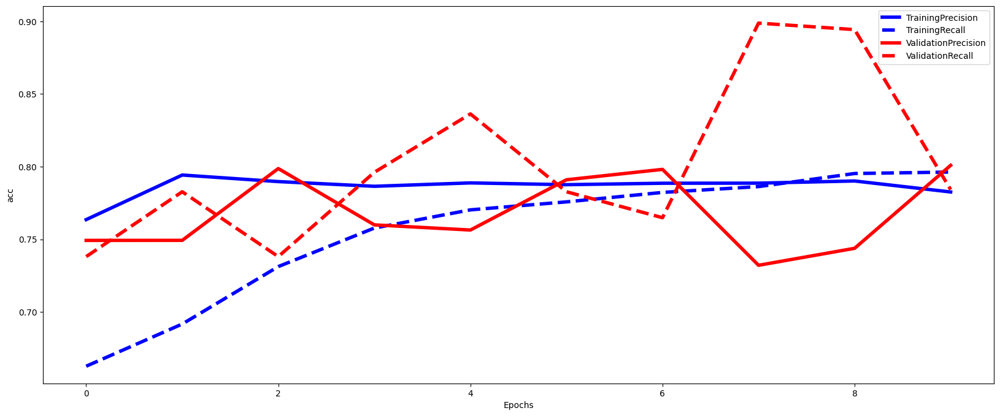

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 4s - loss: 0.5664 - precision_154: 0.7905 - recall_154: 0.6343 - val_loss: 0.5129 - val_precision_154: 0.7960 - val_recall_154: 0.7154 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 2s - loss: 0.5099 - precision_154: 0.7904 - recall_154: 0.7039 - val_loss: 0.4892 - val_precision_154: 0.8027 - val_recall_154: 0.7154 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 4s - loss: 0.4905 - precision_154: 0.7941 - recall_154: 0.7334 - val_loss: 0.4788 - val_precision_154: 0.7558 - val_recall_154: 0.8212 - 4s/epoch - 4ms/step
Epoch 4/10
991/991 - 3s - loss: 0.4784 - precision_154: 0.7862 - recall_154: 0.7689 - val_loss: 0.4667 - val_precision_154: 0.7937 - val_recall_154: 0.7452 - 3s/epoch - 3ms/step
Epoch 5/10
991/991 - 2s - loss: 0.4738 - precision_154: 0.7884 - recall_154: 0.7809 - val_loss: 0.4590 - val_precision_154: 0.7856 - val_recall_154: 0.8137 - 2s/epoch - 3ms/step
Epoch 6/10
991/991 - 3s - loss: 0.4667 - precision_154: 0.7868 - recall_154: 0.7809 - val_loss: 0.4617 - val_p

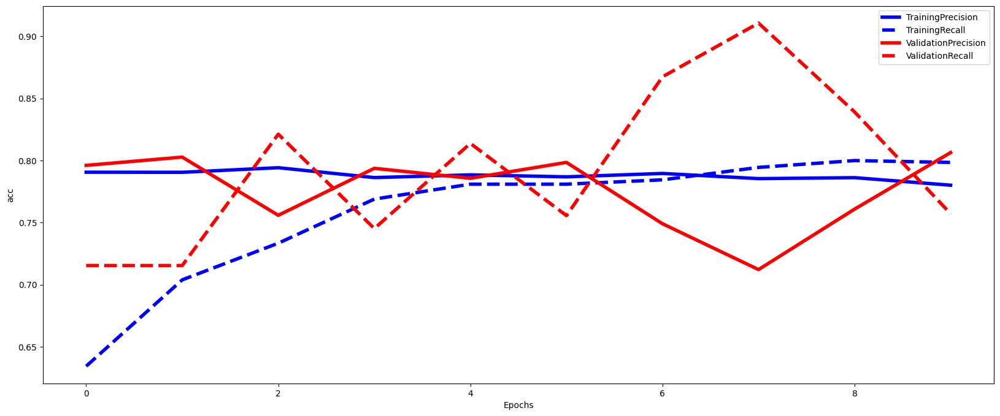

Average F1-Score over validation set is 0.78
STD of F1-Score over validation set is 0.01
42/42 [==============================] - 0s 2ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Val: 0.0001, Validation Score: 0.784, Test Score: 0.793
Epoch 1/10
991/991 - 4s - loss: 0.6816 - precision_155: 0.7533 - recall_155: 0.6703 - val_loss: 0.6320 - val_precision_155: 0.7579 - val_recall_155: 0.6585 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 2s - loss: 0.6060 - precision_155: 0.7803 - recall_155: 0.6842 - val_loss: 0.6003 - val_precision_155: 0.8129 - val_recall_155: 0.6357 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 2s - loss: 0.5787 - precision_155: 0.7944 - recall_155: 0.6907 - val_loss: 0.5819 - val_precision_155: 0.7812 - val_recall_155: 0.6966 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 2s - loss: 0.5585 - precision_155: 0.7947 - recall_155: 0.7110 - val_loss: 0.5673 - val_precision_155: 0.8053 - val_recall_155: 0.6494 - 2s/epoch - 2ms/step
Epoch 5/10
991/991 - 4s - loss: 0.5405 - precision_155: 0.8031 - recall_155: 0.7229 - val_loss: 0.5470 - val_precision_155: 0.7975 - val_recall_155: 0.6845 - 4s/epoch - 4ms/step
Epoch 6/10
991/991 - 4s - loss: 0.5272 - precision_155

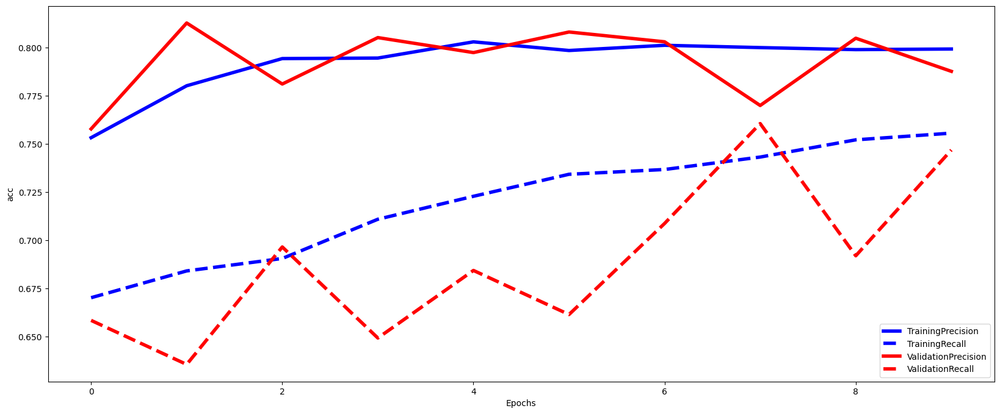

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 5s - loss: 0.7050 - precision_156: 0.7747 - recall_156: 0.6313 - val_loss: 0.6443 - val_precision_156: 0.7604 - val_recall_156: 0.6811 - 5s/epoch - 5ms/step
Epoch 2/10
991/991 - 3s - loss: 0.6202 - precision_156: 0.7806 - recall_156: 0.6603 - val_loss: 0.6005 - val_precision_156: 0.7921 - val_recall_156: 0.6587 - 3s/epoch - 3ms/step
Epoch 3/10
991/991 - 2s - loss: 0.5923 - precision_156: 0.7891 - recall_156: 0.6643 - val_loss: 0.5826 - val_precision_156: 0.8124 - val_recall_156: 0.6453 - 2s/epoch - 3ms/step
Epoch 4/10
991/991 - 2s - loss: 0.5756 - precision_156: 0.7921 - recall_156: 0.6728 - val_loss: 0.5683 - val_precision_156: 0.7768 - val_recall_156: 0.6900 - 2s/epoch - 2ms/step
Epoch 5/10
991/991 - 2s - loss: 0.5605 - precision_156: 0.7933 - recall_156: 0.6853 - val_loss: 0.5501 - val_precision_156: 0.8000 - val_recall_156: 0.7273 - 2s/epoch - 3ms/step
Epoch 6/10
991/991 - 3s - loss: 0.5465 - precision_156: 0.7997 - recall_156: 0.6968 - val_loss: 0.5430 - val_p

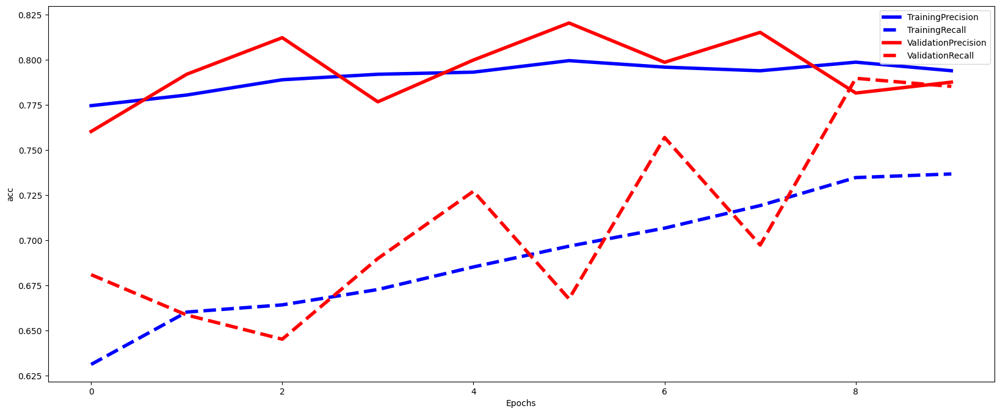

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 4s - loss: 0.6811 - precision_157: 0.7528 - recall_157: 0.6677 - val_loss: 0.6150 - val_precision_157: 0.7625 - val_recall_157: 0.7024 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 3s - loss: 0.6042 - precision_157: 0.7850 - recall_157: 0.6617 - val_loss: 0.5860 - val_precision_157: 0.7753 - val_recall_157: 0.6830 - 3s/epoch - 3ms/step
Epoch 3/10
991/991 - 3s - loss: 0.5760 - precision_157: 0.7983 - recall_157: 0.6597 - val_loss: 0.5853 - val_precision_157: 0.7428 - val_recall_157: 0.7649 - 3s/epoch - 3ms/step
Epoch 4/10
991/991 - 2s - loss: 0.5583 - precision_157: 0.8018 - recall_157: 0.6782 - val_loss: 0.5484 - val_precision_157: 0.7705 - val_recall_157: 0.7143 - 2s/epoch - 2ms/step
Epoch 5/10
991/991 - 3s - loss: 0.5375 - precision_157: 0.8037 - recall_157: 0.6947 - val_loss: 0.5383 - val_precision_157: 0.7672 - val_recall_157: 0.7798 - 3s/epoch - 3ms/step
Epoch 6/10
991/991 - 3s - loss: 0.5228 - precision_157: 0.8031 - recall_157: 0.7267 - val_loss: 0.5154 - val_p

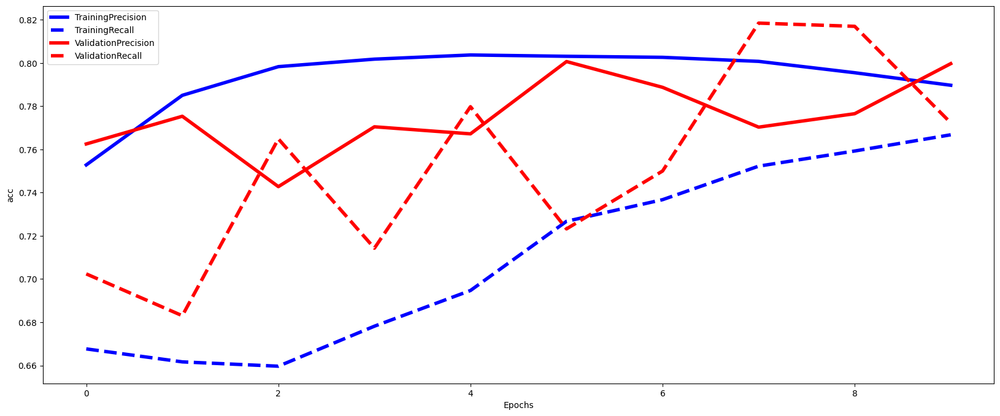

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 4s - loss: 0.6941 - precision_158: 0.7653 - recall_158: 0.6458 - val_loss: 0.6203 - val_precision_158: 0.7903 - val_recall_158: 0.6796 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 3s - loss: 0.6155 - precision_158: 0.7861 - recall_158: 0.6583 - val_loss: 0.5844 - val_precision_158: 0.7982 - val_recall_158: 0.6781 - 3s/epoch - 3ms/step
Epoch 3/10
991/991 - 4s - loss: 0.5859 - precision_158: 0.7975 - recall_158: 0.6698 - val_loss: 0.5678 - val_precision_158: 0.8039 - val_recall_158: 0.6841 - 4s/epoch - 4ms/step
Epoch 4/10
991/991 - 3s - loss: 0.5667 - precision_158: 0.7998 - recall_158: 0.6813 - val_loss: 0.5441 - val_precision_158: 0.8165 - val_recall_158: 0.6766 - 3s/epoch - 3ms/step
Epoch 5/10
991/991 - 2s - loss: 0.5485 - precision_158: 0.7986 - recall_158: 0.6883 - val_loss: 0.5305 - val_precision_158: 0.7890 - val_recall_158: 0.7466 - 2s/epoch - 3ms/step
Epoch 6/10
991/991 - 2s - loss: 0.5352 - precision_158: 0.8010 - recall_158: 0.7009 - val_loss: 0.5161 - val_p

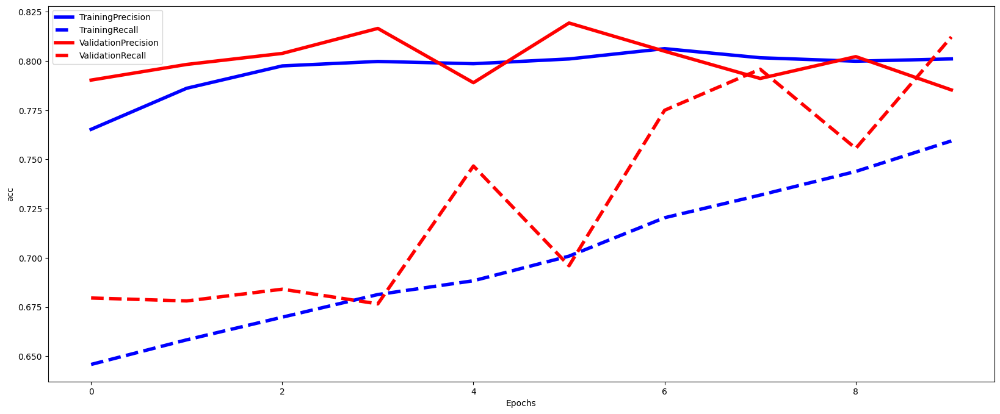

Average F1-Score over validation set is 0.78
STD of F1-Score over validation set is 0.01
42/42 [==============================] - 0s 2ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Val: 0.001, Validation Score: 0.784, Test Score: 0.787
Epoch 1/10
991/991 - 4s - loss: 0.9225 - precision_159: 0.7524 - recall_159: 0.6202 - val_loss: 0.6791 - val_precision_159: 0.7800 - val_recall_159: 0.6052 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 2s - loss: 0.6388 - precision_159: 0.7933 - recall_159: 0.6251 - val_loss: 0.6333 - val_precision_159: 0.7531 - val_recall_159: 0.6509 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 3s - loss: 0.6088 - precision_159: 0.7840 - recall_159: 0.6360 - val_loss: 0.6093 - val_precision_159: 0.7553 - val_recall_159: 0.6494 - 3s/epoch - 3ms/step
Epoch 4/10
991/991 - 4s - loss: 0.5923 - precision_159: 0.7759 - recall_159: 0.6584 - val_loss: 0.6010 - val_precision_159: 0.8004 - val_recall_159: 0.5869 - 4s/epoch - 4ms/step
Epoch 5/10
991/991 - 2s - loss: 0.5881 - precision_159: 0.7754 - recall_159: 0.6564 - val_loss: 0.5961 - val_precision_159: 0.7804 - val_recall_159: 0.6067 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 2s - loss: 0.5841 - precision_159:

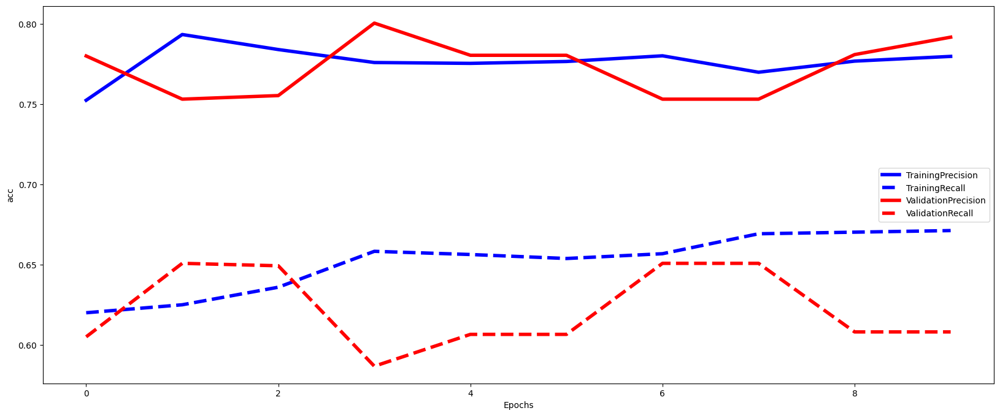

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 4s - loss: 0.9422 - precision_160: 0.7810 - recall_160: 0.6013 - val_loss: 0.6880 - val_precision_160: 0.8218 - val_recall_160: 0.5499 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 2s - loss: 0.6472 - precision_160: 0.7960 - recall_160: 0.6033 - val_loss: 0.6385 - val_precision_160: 0.8218 - val_recall_160: 0.5499 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 2s - loss: 0.6210 - precision_160: 0.7915 - recall_160: 0.6343 - val_loss: 0.6191 - val_precision_160: 0.8004 - val_recall_160: 0.6036 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 2s - loss: 0.6090 - precision_160: 0.7802 - recall_160: 0.6373 - val_loss: 0.6144 - val_precision_160: 0.7634 - val_recall_160: 0.6587 - 2s/epoch - 2ms/step
Epoch 5/10
991/991 - 4s - loss: 0.6034 - precision_160: 0.7743 - recall_160: 0.6468 - val_loss: 0.6040 - val_precision_160: 0.7646 - val_recall_160: 0.6632 - 4s/epoch - 4ms/step
Epoch 6/10
991/991 - 4s - loss: 0.5981 - precision_160: 0.7723 - recall_160: 0.6483 - val_loss: 0.5988 - val_p

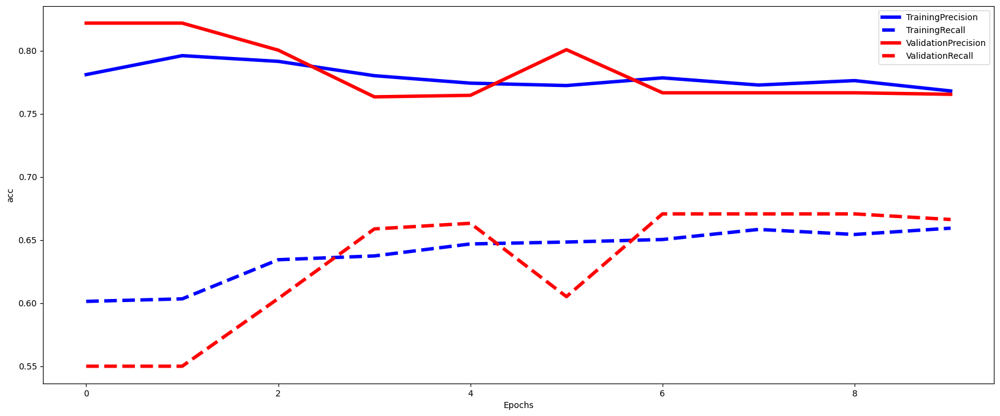

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 5s - loss: 0.9566 - precision_161: 0.7568 - recall_161: 0.6306 - val_loss: 0.6913 - val_precision_161: 0.8023 - val_recall_161: 0.6339 - 5s/epoch - 5ms/step
Epoch 2/10
991/991 - 3s - loss: 0.6645 - precision_161: 0.7757 - recall_161: 0.6196 - val_loss: 0.6319 - val_precision_161: 0.7536 - val_recall_161: 0.7054 - 3s/epoch - 3ms/step
Epoch 3/10
991/991 - 2s - loss: 0.6310 - precision_161: 0.7777 - recall_161: 0.6181 - val_loss: 0.6078 - val_precision_161: 0.7887 - val_recall_161: 0.6443 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 2s - loss: 0.6131 - precision_161: 0.7803 - recall_161: 0.6276 - val_loss: 0.5922 - val_precision_161: 0.7734 - val_recall_161: 0.6756 - 2s/epoch - 2ms/step
Epoch 5/10
991/991 - 2s - loss: 0.6008 - precision_161: 0.7711 - recall_161: 0.6391 - val_loss: 0.5867 - val_precision_161: 0.7622 - val_recall_161: 0.6964 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 3s - loss: 0.5928 - precision_161: 0.7708 - recall_161: 0.6532 - val_loss: 0.5781 - val_p

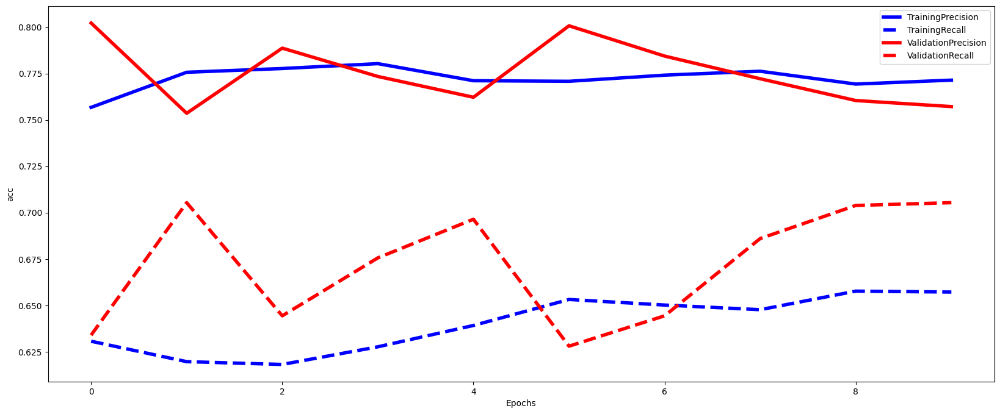

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 4s - loss: 0.8996 - precision_162: 0.7522 - recall_162: 0.6408 - val_loss: 0.6586 - val_precision_162: 0.7907 - val_recall_162: 0.6304 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 4s - loss: 0.6397 - precision_162: 0.7943 - recall_162: 0.6103 - val_loss: 0.6161 - val_precision_162: 0.7869 - val_recall_162: 0.6438 - 4s/epoch - 4ms/step
Epoch 3/10
991/991 - 3s - loss: 0.6142 - precision_162: 0.7867 - recall_162: 0.6218 - val_loss: 0.6083 - val_precision_162: 0.7766 - val_recall_162: 0.6841 - 3s/epoch - 3ms/step
Epoch 4/10
991/991 - 2s - loss: 0.6009 - precision_162: 0.7829 - recall_162: 0.6348 - val_loss: 0.5920 - val_precision_162: 0.8068 - val_recall_162: 0.6036 - 2s/epoch - 2ms/step
Epoch 5/10
991/991 - 2s - loss: 0.5921 - precision_162: 0.7812 - recall_162: 0.6288 - val_loss: 0.5820 - val_precision_162: 0.7896 - val_recall_162: 0.6319 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 2s - loss: 0.5870 - precision_162: 0.7868 - recall_162: 0.6313 - val_loss: 0.5844 - val_p

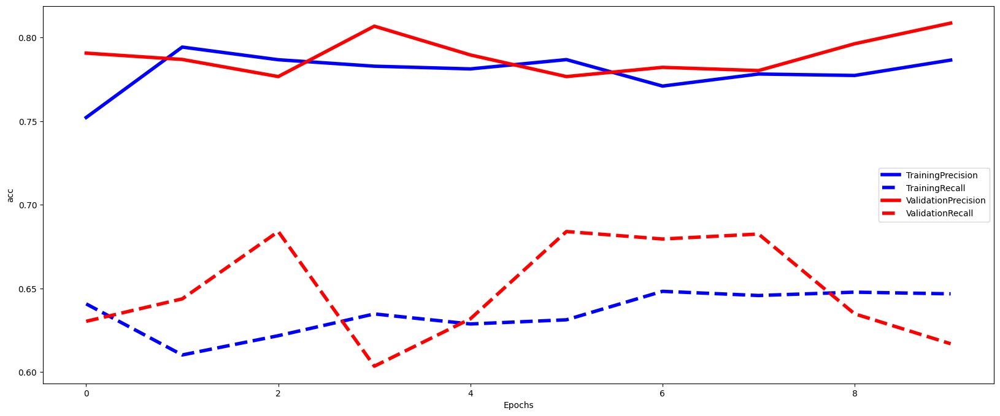

Average F1-Score over validation set is 0.73
STD of F1-Score over validation set is 0.00
42/42 [==============================] - 0s 2ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Val: 0.005, Validation Score: 0.728, Test Score: 0.726
Epoch 1/10
991/991 - 4s - loss: 1.0947 - precision_163: 0.7548 - recall_163: 0.6405 - val_loss: 0.6893 - val_precision_163: 0.8043 - val_recall_163: 0.5701 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 2s - loss: 0.6562 - precision_163: 0.8129 - recall_163: 0.5889 - val_loss: 0.6551 - val_precision_163: 0.8066 - val_recall_163: 0.5595 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 3s - loss: 0.6299 - precision_163: 0.8017 - recall_163: 0.6102 - val_loss: 0.6296 - val_precision_163: 0.8060 - val_recall_163: 0.5762 - 3s/epoch - 3ms/step
Epoch 4/10
991/991 - 4s - loss: 0.6139 - precision_163: 0.7957 - recall_163: 0.6132 - val_loss: 0.6172 - val_precision_163: 0.8068 - val_recall_163: 0.5793 - 4s/epoch - 4ms/step
Epoch 5/10
991/991 - 3s - loss: 0.6054 - precision_163: 0.7855 - recall_163: 0.6400 - val_loss: 0.6111 - val_precision_163: 0.7562 - val_recall_163: 0.6479 - 3s/epoch - 3ms/step
Epoch 6/10
991/991 - 2s - loss: 0.5985 - precision_163:

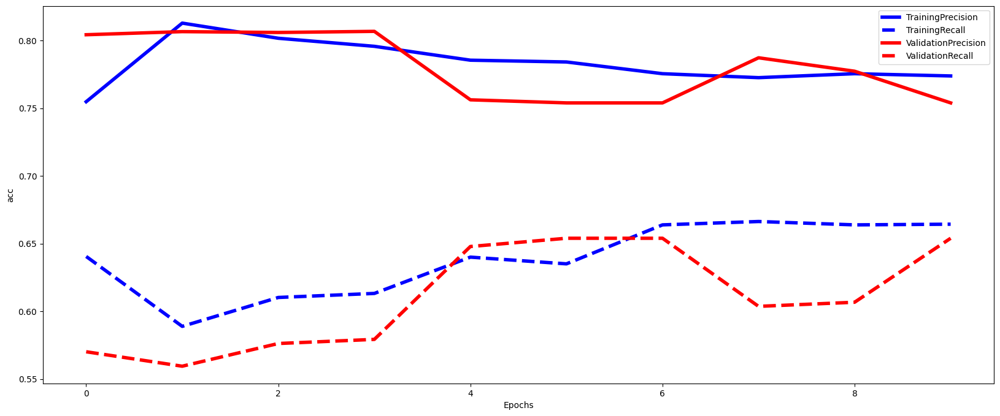

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 4s - loss: 1.1216 - precision_164: 0.7959 - recall_164: 0.5658 - val_loss: 0.7029 - val_precision_164: 0.8218 - val_recall_164: 0.5499 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 2s - loss: 0.6641 - precision_164: 0.7999 - recall_164: 0.6038 - val_loss: 0.6506 - val_precision_164: 0.8218 - val_recall_164: 0.5499 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 2s - loss: 0.6348 - precision_164: 0.7987 - recall_164: 0.6073 - val_loss: 0.6296 - val_precision_164: 0.7938 - val_recall_164: 0.6140 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 4s - loss: 0.6204 - precision_164: 0.7836 - recall_164: 0.6323 - val_loss: 0.6176 - val_precision_164: 0.7666 - val_recall_164: 0.6706 - 4s/epoch - 4ms/step
Epoch 5/10
991/991 - 4s - loss: 0.6102 - precision_164: 0.7828 - recall_164: 0.6508 - val_loss: 0.6097 - val_precision_164: 0.7666 - val_recall_164: 0.6706 - 4s/epoch - 4ms/step
Epoch 6/10
991/991 - 2s - loss: 0.6034 - precision_164: 0.7723 - recall_164: 0.6583 - val_loss: 0.6042 - val_p

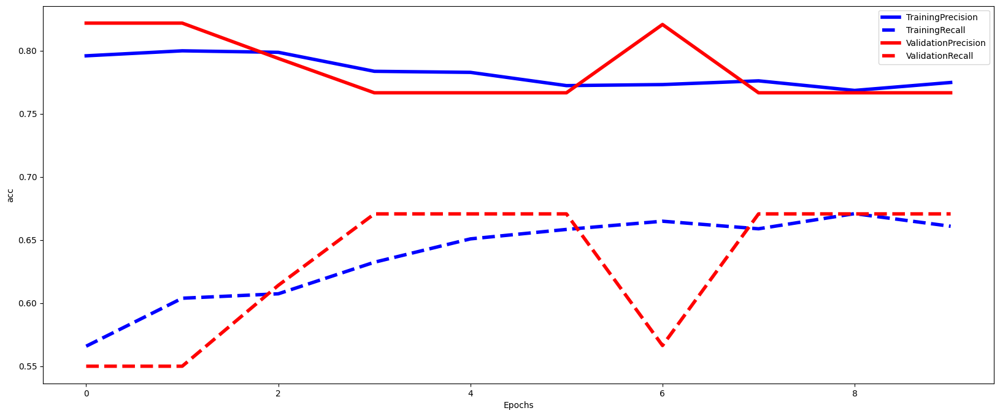

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 4s - loss: 1.0837 - precision_165: 0.7586 - recall_165: 0.6151 - val_loss: 0.6674 - val_precision_165: 0.8248 - val_recall_165: 0.6027 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 2s - loss: 0.6563 - precision_165: 0.8139 - recall_165: 0.5691 - val_loss: 0.6322 - val_precision_165: 0.8075 - val_recall_165: 0.6116 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 2s - loss: 0.6351 - precision_165: 0.8066 - recall_165: 0.6011 - val_loss: 0.6145 - val_precision_165: 0.8119 - val_recall_165: 0.6101 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 2s - loss: 0.6223 - precision_165: 0.7902 - recall_165: 0.6106 - val_loss: 0.6106 - val_precision_165: 0.8232 - val_recall_165: 0.6027 - 2s/epoch - 2ms/step
Epoch 5/10
991/991 - 4s - loss: 0.6174 - precision_165: 0.7823 - recall_165: 0.6276 - val_loss: 0.6010 - val_precision_165: 0.7838 - val_recall_165: 0.6473 - 4s/epoch - 4ms/step
Epoch 6/10
991/991 - 4s - loss: 0.6129 - precision_165: 0.7725 - recall_165: 0.6476 - val_loss: 0.5972 - val_p

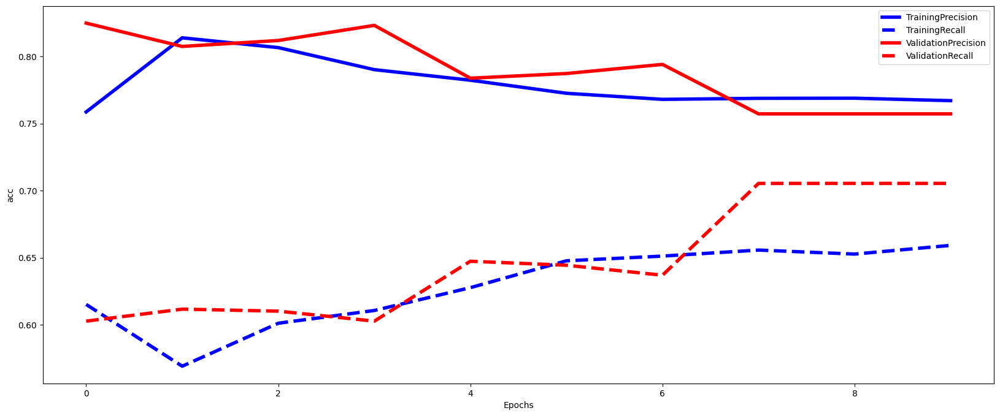

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 6s - loss: 1.0802 - precision_166: 0.7602 - recall_166: 0.6073 - val_loss: 0.6731 - val_precision_166: 0.8128 - val_recall_166: 0.5887 - 6s/epoch - 6ms/step
Epoch 2/10
991/991 - 2s - loss: 0.6493 - precision_166: 0.8026 - recall_166: 0.5918 - val_loss: 0.6298 - val_precision_166: 0.7910 - val_recall_166: 0.6259 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 3s - loss: 0.6234 - precision_166: 0.7929 - recall_166: 0.6013 - val_loss: 0.6146 - val_precision_166: 0.8119 - val_recall_166: 0.5917 - 3s/epoch - 3ms/step
Epoch 4/10
991/991 - 2s - loss: 0.6123 - precision_166: 0.7718 - recall_166: 0.6363 - val_loss: 0.6029 - val_precision_166: 0.8068 - val_recall_166: 0.6036 - 2s/epoch - 2ms/step
Epoch 5/10
991/991 - 2s - loss: 0.6048 - precision_166: 0.7825 - recall_166: 0.6388 - val_loss: 0.5977 - val_precision_166: 0.7766 - val_recall_166: 0.6841 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 4s - loss: 0.5987 - precision_166: 0.7826 - recall_166: 0.6448 - val_loss: 0.5912 - val_p

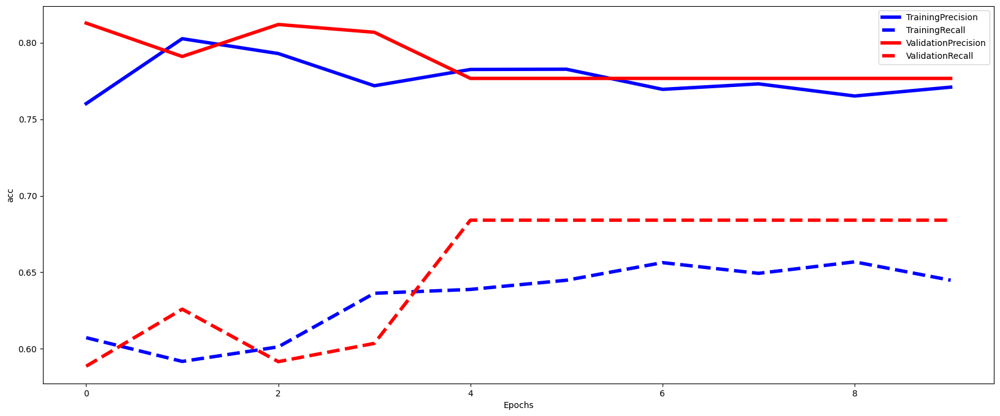

Average F1-Score over validation set is 0.73
STD of F1-Score over validation set is 0.01
42/42 [==============================] - 0s 2ms/step
Val: 0.01, Validation Score: 0.731, Test Score: 0.725


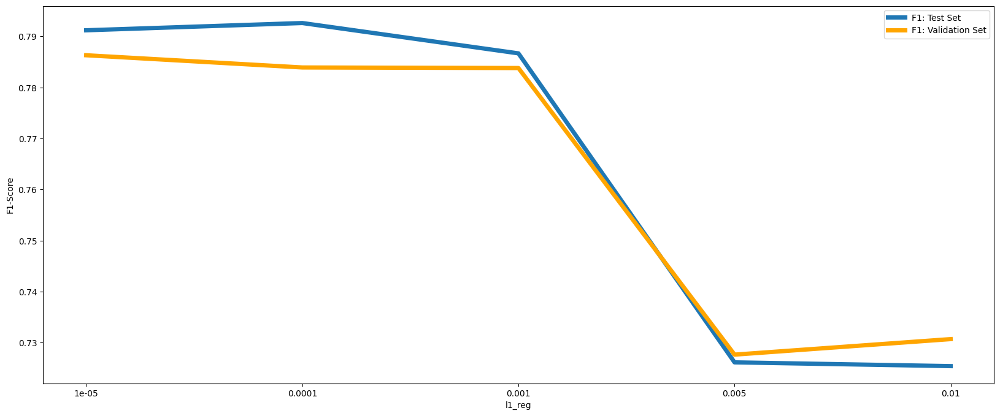

In [84]:
model,best_l1_reg = evaluate_efect_param(parameter_type='model_params',parameter_name='l1_reg', values_list=[0.00001, 0.0001, 0.001,  0.005, 0.01])
kfold_params['model_params']['l1_reg'] = best_l1_reg

## choosing best value for L2 reqularizer:


/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 4s - loss: 0.5417 - precision_167: 0.7775 - recall_167: 0.6594 - val_loss: 0.5227 - val_precision_167: 0.7792 - val_recall_167: 0.6616 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 3s - loss: 0.4998 - precision_167: 0.7998 - recall_167: 0.6981 - val_loss: 0.4947 - val_precision_167: 0.8015 - val_recall_167: 0.6524 - 3s/epoch - 4ms/step
Epoch 3/10
991/991 - 3s - loss: 0.4718 - precision_167: 0.8035 - recall_167: 0.7249 - val_loss: 0.4810 - val_precision_167: 0.7794 - val_recall_167: 0.7378 - 3s/epoch - 3ms/step
Epoch 4/10
991/991 - 2s - loss: 0.4581 - precision_167: 0.7952 - recall_167: 0.7617 - val_loss: 0.4703 - val_precision_167: 0.7733 - val_recall_167: 0.7332 - 2s/epoch - 3ms/step
Epoch 5/10
991/991 - 2s - loss: 0.4505 - precision_167: 0.7984 - recall_167: 0.7632 - val_loss: 0.4904 - val_precision_167: 0.7190 - val_recall_167: 0.8659 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 2s - loss: 0.4445 - precision_167: 0.7952 - recall_167: 0.7771 - val_loss: 0.4719 - val_p

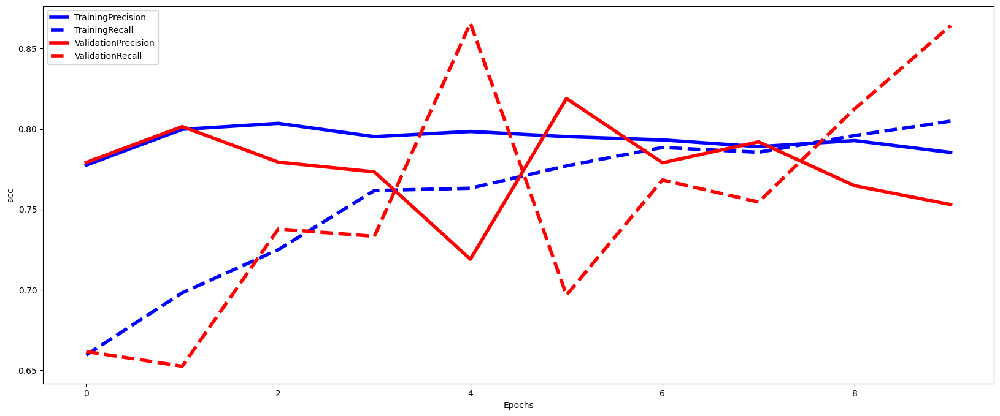

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 6s - loss: 0.5501 - precision_168: 0.7827 - recall_168: 0.6468 - val_loss: 0.5100 - val_precision_168: 0.7885 - val_recall_168: 0.7332 - 6s/epoch - 6ms/step
Epoch 2/10
991/991 - 3s - loss: 0.4959 - precision_168: 0.7940 - recall_168: 0.7134 - val_loss: 0.4793 - val_precision_168: 0.8343 - val_recall_168: 0.6230 - 3s/epoch - 3ms/step
Epoch 3/10
991/991 - 4s - loss: 0.4757 - precision_168: 0.7881 - recall_168: 0.7329 - val_loss: 0.4549 - val_precision_168: 0.7928 - val_recall_168: 0.7928 - 4s/epoch - 4ms/step
Epoch 4/10
991/991 - 3s - loss: 0.4664 - precision_168: 0.7855 - recall_168: 0.7564 - val_loss: 0.4498 - val_precision_168: 0.8435 - val_recall_168: 0.6826 - 3s/epoch - 3ms/step
Epoch 5/10
991/991 - 2s - loss: 0.4588 - precision_168: 0.7881 - recall_168: 0.7664 - val_loss: 0.4335 - val_precision_168: 0.8096 - val_recall_168: 0.7794 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 3s - loss: 0.4548 - precision_168: 0.7866 - recall_168: 0.7689 - val_loss: 0.4460 - val_p

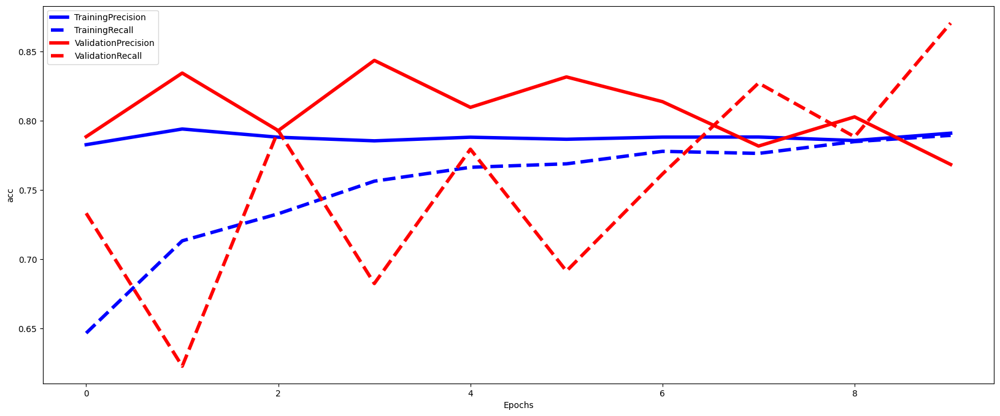

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 4s - loss: 0.5535 - precision_169: 0.7513 - recall_169: 0.6607 - val_loss: 0.5045 - val_precision_169: 0.8082 - val_recall_169: 0.7024 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 3s - loss: 0.4951 - precision_169: 0.8006 - recall_169: 0.6952 - val_loss: 0.4883 - val_precision_169: 0.8188 - val_recall_169: 0.6726 - 3s/epoch - 3ms/step
Epoch 3/10
991/991 - 2s - loss: 0.4715 - precision_169: 0.8048 - recall_169: 0.7222 - val_loss: 0.4773 - val_precision_169: 0.7587 - val_recall_169: 0.8095 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 4s - loss: 0.4602 - precision_169: 0.7989 - recall_169: 0.7538 - val_loss: 0.4593 - val_precision_169: 0.7811 - val_recall_169: 0.8125 - 4s/epoch - 4ms/step
Epoch 5/10
991/991 - 4s - loss: 0.4528 - precision_169: 0.7934 - recall_169: 0.7593 - val_loss: 0.4579 - val_precision_169: 0.7876 - val_recall_169: 0.7723 - 4s/epoch - 4ms/step
Epoch 6/10
991/991 - 3s - loss: 0.4472 - precision_169: 0.7905 - recall_169: 0.7688 - val_loss: 0.4924 - val_p

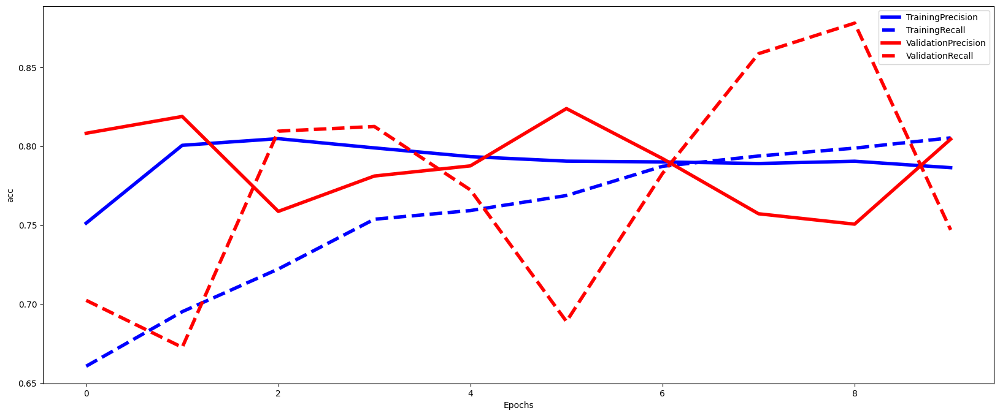

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 4s - loss: 0.5404 - precision_170: 0.7667 - recall_170: 0.6708 - val_loss: 0.4974 - val_precision_170: 0.8048 - val_recall_170: 0.7004 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 2s - loss: 0.4934 - precision_170: 0.7925 - recall_170: 0.7014 - val_loss: 0.4630 - val_precision_170: 0.7958 - val_recall_170: 0.7377 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 3s - loss: 0.4713 - precision_170: 0.7887 - recall_170: 0.7359 - val_loss: 0.4507 - val_precision_170: 0.7959 - val_recall_170: 0.7556 - 3s/epoch - 3ms/step
Epoch 4/10
991/991 - 3s - loss: 0.4580 - precision_170: 0.7897 - recall_170: 0.7629 - val_loss: 0.4433 - val_precision_170: 0.7876 - val_recall_170: 0.8122 - 3s/epoch - 3ms/step
Epoch 5/10
991/991 - 4s - loss: 0.4526 - precision_170: 0.7856 - recall_170: 0.7774 - val_loss: 0.4428 - val_precision_170: 0.8034 - val_recall_170: 0.7735 - 4s/epoch - 4ms/step
Epoch 6/10
991/991 - 3s - loss: 0.4490 - precision_170: 0.7816 - recall_170: 0.7969 - val_loss: 0.4409 - val_p

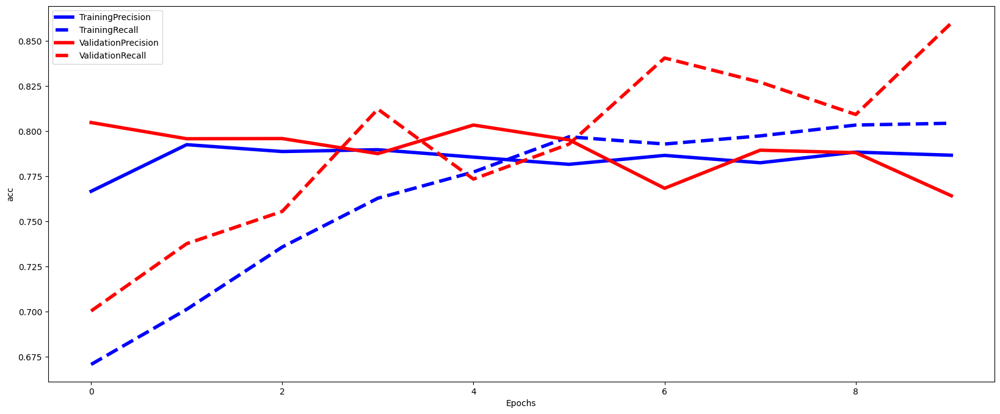

Average F1-Score over validation set is 0.79
STD of F1-Score over validation set is 0.01
42/42 [==============================] - 0s 3ms/step
Val: 1e-05, Validation Score: 0.791, Test Score: 0.783


/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 5s - loss: 0.5546 - precision_171: 0.7583 - recall_171: 0.6698 - val_loss: 0.5286 - val_precision_171: 0.7845 - val_recall_171: 0.6494 - 5s/epoch - 6ms/step
Epoch 2/10
991/991 - 2s - loss: 0.5043 - precision_171: 0.7943 - recall_171: 0.7016 - val_loss: 0.5067 - val_precision_171: 0.8340 - val_recall_171: 0.5976 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 3s - loss: 0.4789 - precision_171: 0.7996 - recall_171: 0.7329 - val_loss: 0.4871 - val_precision_171: 0.7830 - val_recall_171: 0.7317 - 3s/epoch - 3ms/step
Epoch 4/10
991/991 - 2s - loss: 0.4653 - precision_171: 0.8002 - recall_171: 0.7517 - val_loss: 0.4831 - val_precision_171: 0.7535 - val_recall_171: 0.8155 - 2s/epoch - 2ms/step
Epoch 5/10
991/991 - 2s - loss: 0.4616 - precision_171: 0.7937 - recall_171: 0.7681 - val_loss: 0.4702 - val_precision_171: 0.7725 - val_recall_171: 0.7866 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 4s - loss: 0.4548 - precision_171: 0.7928 - recall_171: 0.7711 - val_loss: 0.4773 - val_p

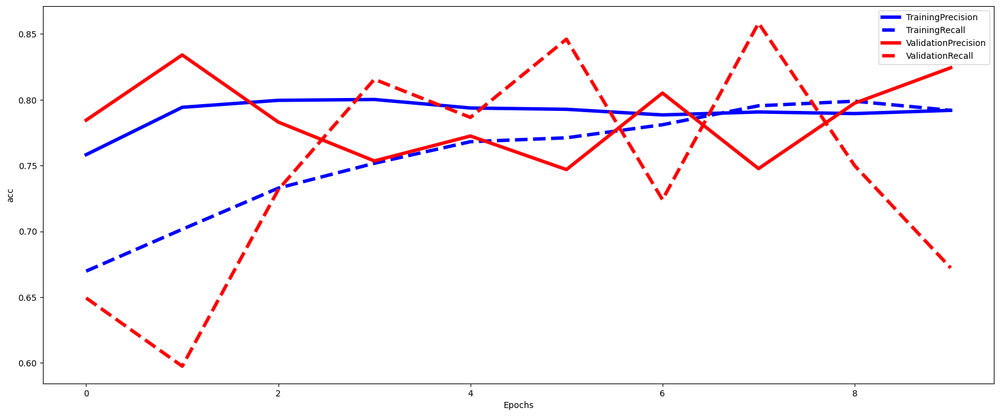

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 5s - loss: 0.5523 - precision_172: 0.7845 - recall_172: 0.6463 - val_loss: 0.5295 - val_precision_172: 0.8636 - val_recall_172: 0.5380 - 5s/epoch - 5ms/step
Epoch 2/10
991/991 - 4s - loss: 0.4998 - precision_172: 0.7970 - recall_172: 0.6873 - val_loss: 0.4833 - val_precision_172: 0.8274 - val_recall_172: 0.6572 - 4s/epoch - 4ms/step
Epoch 3/10
991/991 - 3s - loss: 0.4831 - precision_172: 0.7985 - recall_172: 0.7314 - val_loss: 0.4739 - val_precision_172: 0.8249 - val_recall_172: 0.6811 - 3s/epoch - 3ms/step
Epoch 4/10
991/991 - 3s - loss: 0.4748 - precision_172: 0.7891 - recall_172: 0.7524 - val_loss: 0.4530 - val_precision_172: 0.8197 - val_recall_172: 0.7183 - 3s/epoch - 3ms/step
Epoch 5/10
991/991 - 3s - loss: 0.4698 - precision_172: 0.7933 - recall_172: 0.7564 - val_loss: 0.4620 - val_precision_172: 0.7584 - val_recall_172: 0.8793 - 3s/epoch - 3ms/step
Epoch 6/10
991/991 - 2s - loss: 0.4645 - precision_172: 0.7853 - recall_172: 0.7684 - val_loss: 0.4442 - val_p

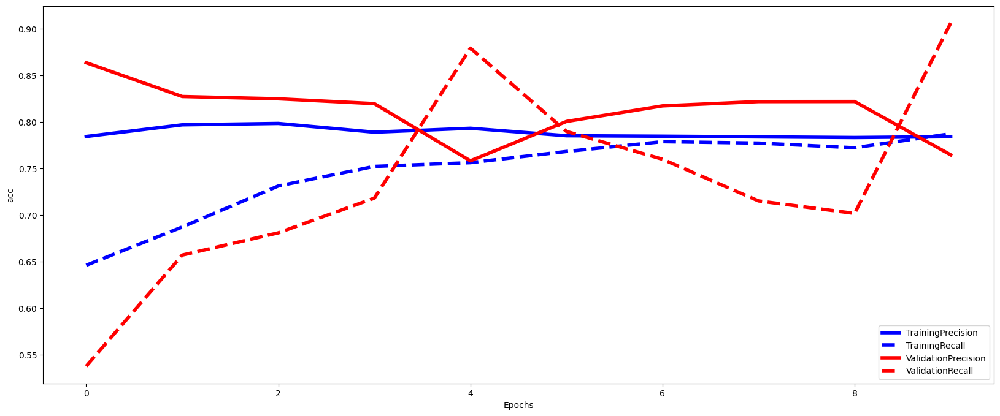

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 4s - loss: 0.5504 - precision_173: 0.7665 - recall_173: 0.6557 - val_loss: 0.5188 - val_precision_173: 0.7519 - val_recall_173: 0.7351 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 4s - loss: 0.5016 - precision_173: 0.7975 - recall_173: 0.6897 - val_loss: 0.4855 - val_precision_173: 0.8024 - val_recall_173: 0.7068 - 4s/epoch - 4ms/step
Epoch 3/10
991/991 - 3s - loss: 0.4801 - precision_173: 0.7965 - recall_173: 0.7247 - val_loss: 0.4751 - val_precision_173: 0.7928 - val_recall_173: 0.7515 - 3s/epoch - 3ms/step
Epoch 4/10
991/991 - 2s - loss: 0.4673 - precision_173: 0.7951 - recall_173: 0.7437 - val_loss: 0.4727 - val_precision_173: 0.7950 - val_recall_173: 0.7560 - 2s/epoch - 3ms/step
Epoch 5/10
991/991 - 2s - loss: 0.4609 - precision_173: 0.7883 - recall_173: 0.7658 - val_loss: 0.4771 - val_precision_173: 0.7657 - val_recall_173: 0.7976 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 2s - loss: 0.4590 - precision_173: 0.7921 - recall_173: 0.7763 - val_loss: 0.4729 - val_p

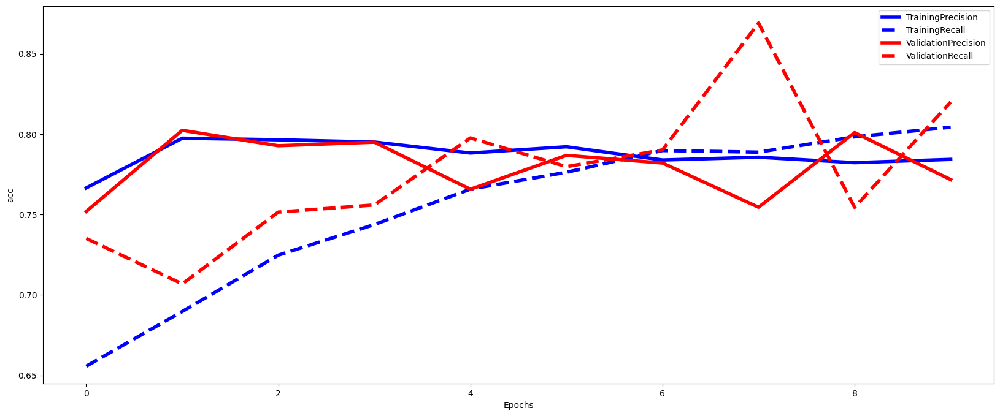

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 4s - loss: 0.5589 - precision_174: 0.7924 - recall_174: 0.6223 - val_loss: 0.5034 - val_precision_174: 0.8111 - val_recall_174: 0.6781 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 3s - loss: 0.5032 - precision_174: 0.7978 - recall_174: 0.6968 - val_loss: 0.4915 - val_precision_174: 0.8463 - val_recall_174: 0.6155 - 3s/epoch - 3ms/step
Epoch 3/10
991/991 - 4s - loss: 0.4818 - precision_174: 0.7941 - recall_174: 0.7254 - val_loss: 0.4770 - val_precision_174: 0.8678 - val_recall_174: 0.6066 - 4s/epoch - 4ms/step
Epoch 4/10
991/991 - 3s - loss: 0.4712 - precision_174: 0.7961 - recall_174: 0.7404 - val_loss: 0.4542 - val_precision_174: 0.7991 - val_recall_174: 0.7705 - 3s/epoch - 3ms/step
Epoch 5/10
991/991 - 2s - loss: 0.4648 - precision_174: 0.7950 - recall_174: 0.7529 - val_loss: 0.4567 - val_precision_174: 0.7746 - val_recall_174: 0.8346 - 2s/epoch - 3ms/step
Epoch 6/10
991/991 - 2s - loss: 0.4611 - precision_174: 0.7918 - recall_174: 0.7724 - val_loss: 0.4555 - val_p

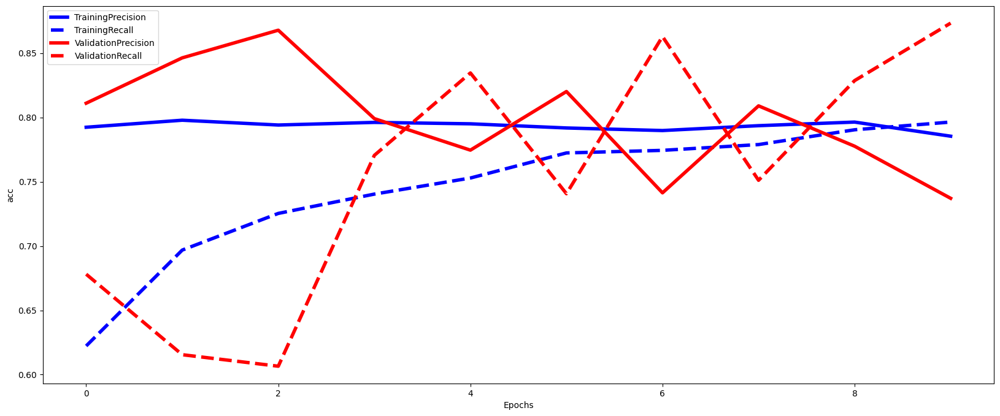

Average F1-Score over validation set is 0.78
STD of F1-Score over validation set is 0.02
42/42 [==============================] - 0s 2ms/step
Val: 0.0001, Validation Score: 0.783, Test Score: 0.782


/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 4s - loss: 0.5862 - precision_175: 0.7588 - recall_175: 0.6653 - val_loss: 0.5609 - val_precision_175: 0.7596 - val_recall_175: 0.6601 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 3s - loss: 0.5371 - precision_175: 0.7936 - recall_175: 0.6872 - val_loss: 0.5460 - val_precision_175: 0.8127 - val_recall_175: 0.6418 - 3s/epoch - 3ms/step
Epoch 3/10
991/991 - 3s - loss: 0.5202 - precision_175: 0.7955 - recall_175: 0.7145 - val_loss: 0.5223 - val_precision_175: 0.8057 - val_recall_175: 0.6890 - 3s/epoch - 3ms/step
Epoch 4/10
991/991 - 4s - loss: 0.5072 - precision_175: 0.7989 - recall_175: 0.7219 - val_loss: 0.5221 - val_precision_175: 0.7971 - val_recall_175: 0.6768 - 4s/epoch - 4ms/step
Epoch 5/10
991/991 - 3s - loss: 0.5025 - precision_175: 0.8001 - recall_175: 0.7373 - val_loss: 0.5097 - val_precision_175: 0.8080 - val_recall_175: 0.7058 - 3s/epoch - 3ms/step
Epoch 6/10
991/991 - 2s - loss: 0.4960 - precision_175: 0.7966 - recall_175: 0.7507 - val_loss: 0.5092 - val_p

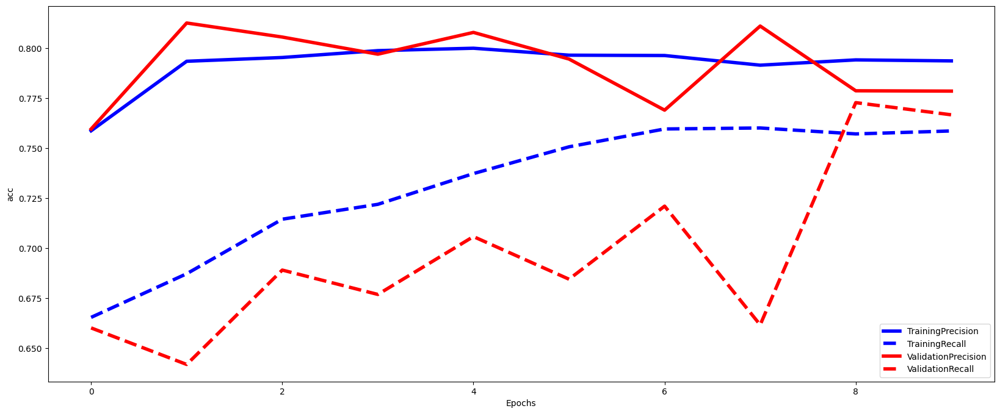

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 4s - loss: 0.5898 - precision_176: 0.7656 - recall_176: 0.6453 - val_loss: 0.5576 - val_precision_176: 0.7949 - val_recall_176: 0.6468 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 2s - loss: 0.5414 - precision_176: 0.7956 - recall_176: 0.6738 - val_loss: 0.5272 - val_precision_176: 0.7993 - val_recall_176: 0.6826 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 3s - loss: 0.5269 - precision_176: 0.7868 - recall_176: 0.6903 - val_loss: 0.5106 - val_precision_176: 0.8118 - val_recall_176: 0.6945 - 3s/epoch - 3ms/step
Epoch 4/10
991/991 - 4s - loss: 0.5166 - precision_176: 0.7920 - recall_176: 0.7069 - val_loss: 0.5034 - val_precision_176: 0.8000 - val_recall_176: 0.7690 - 4s/epoch - 4ms/step
Epoch 5/10
991/991 - 3s - loss: 0.5108 - precision_176: 0.7942 - recall_176: 0.7279 - val_loss: 0.4944 - val_precision_176: 0.8171 - val_recall_176: 0.6990 - 3s/epoch - 3ms/step
Epoch 6/10
991/991 - 2s - loss: 0.5070 - precision_176: 0.7883 - recall_176: 0.7339 - val_loss: 0.4908 - val_p

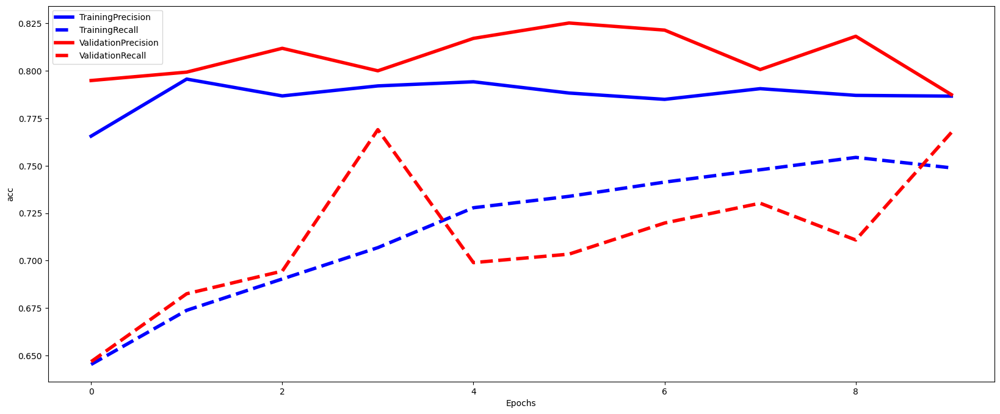

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 4s - loss: 0.5964 - precision_177: 0.7681 - recall_177: 0.6266 - val_loss: 0.5424 - val_precision_177: 0.7719 - val_recall_177: 0.7351 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 2s - loss: 0.5356 - precision_177: 0.7922 - recall_177: 0.6947 - val_loss: 0.5292 - val_precision_177: 0.7986 - val_recall_177: 0.6905 - 2s/epoch - 3ms/step
Epoch 3/10
991/991 - 3s - loss: 0.5179 - precision_177: 0.7963 - recall_177: 0.7122 - val_loss: 0.5219 - val_precision_177: 0.7641 - val_recall_177: 0.7857 - 3s/epoch - 3ms/step
Epoch 4/10
991/991 - 4s - loss: 0.5107 - precision_177: 0.7980 - recall_177: 0.7337 - val_loss: 0.5089 - val_precision_177: 0.8119 - val_recall_177: 0.7128 - 4s/epoch - 4ms/step
Epoch 5/10
991/991 - 4s - loss: 0.5051 - precision_177: 0.7910 - recall_177: 0.7387 - val_loss: 0.5219 - val_precision_177: 0.7322 - val_recall_177: 0.8705 - 4s/epoch - 4ms/step
Epoch 6/10
991/991 - 2s - loss: 0.4993 - precision_177: 0.7886 - recall_177: 0.7523 - val_loss: 0.5041 - val_p

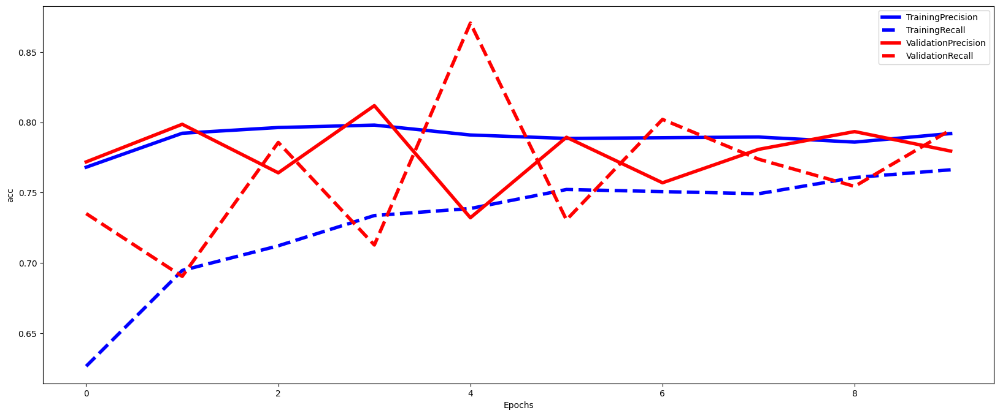

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 4s - loss: 0.5871 - precision_178: 0.7677 - recall_178: 0.6498 - val_loss: 0.5352 - val_precision_178: 0.7990 - val_recall_178: 0.6870 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 2s - loss: 0.5389 - precision_178: 0.7910 - recall_178: 0.6798 - val_loss: 0.5133 - val_precision_178: 0.8104 - val_recall_178: 0.6945 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 2s - loss: 0.5197 - precision_178: 0.7899 - recall_178: 0.7074 - val_loss: 0.5024 - val_precision_178: 0.7868 - val_recall_178: 0.7645 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 2s - loss: 0.5093 - precision_178: 0.7914 - recall_178: 0.7269 - val_loss: 0.4903 - val_precision_178: 0.7975 - val_recall_178: 0.7630 - 2s/epoch - 2ms/step
Epoch 5/10
991/991 - 4s - loss: 0.5004 - precision_178: 0.7877 - recall_178: 0.7444 - val_loss: 0.4873 - val_precision_178: 0.7967 - val_recall_178: 0.7243 - 4s/epoch - 4ms/step
Epoch 6/10
991/991 - 3s - loss: 0.4995 - precision_178: 0.7891 - recall_178: 0.7469 - val_loss: 0.4892 - val_p

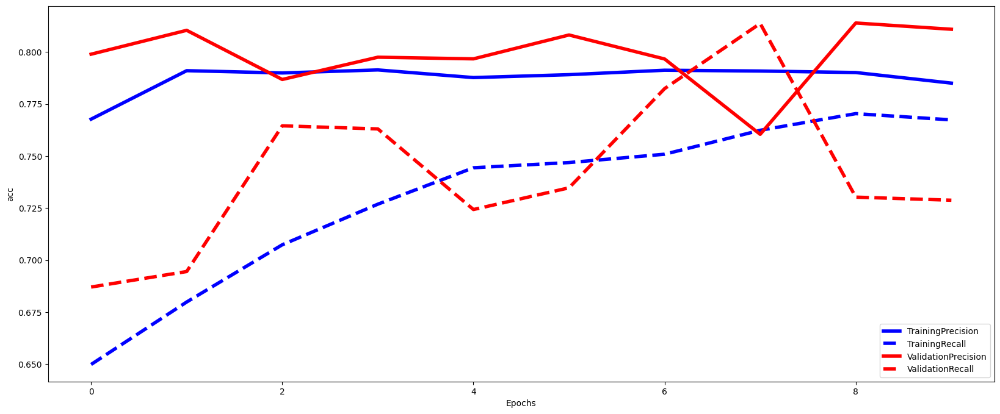

Average F1-Score over validation set is 0.78
STD of F1-Score over validation set is 0.00
42/42 [==============================] - 0s 3ms/step
Val: 0.001, Validation Score: 0.777, Test Score: 0.797


/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 5s - loss: 0.7574 - precision_179: 0.7657 - recall_179: 0.6554 - val_loss: 0.6376 - val_precision_179: 0.7810 - val_recall_179: 0.6143 - 5s/epoch - 5ms/step
Epoch 2/10
991/991 - 2s - loss: 0.6030 - precision_179: 0.7816 - recall_179: 0.6539 - val_loss: 0.5991 - val_precision_179: 0.7579 - val_recall_179: 0.6585 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 2s - loss: 0.5788 - precision_179: 0.7816 - recall_179: 0.6663 - val_loss: 0.5895 - val_precision_179: 0.7466 - val_recall_179: 0.6601 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 2s - loss: 0.5682 - precision_179: 0.7840 - recall_179: 0.6668 - val_loss: 0.5776 - val_precision_179: 0.7580 - val_recall_179: 0.6540 - 2s/epoch - 2ms/step
Epoch 5/10
991/991 - 2s - loss: 0.5625 - precision_179: 0.7850 - recall_179: 0.6653 - val_loss: 0.5672 - val_precision_179: 0.8024 - val_recall_179: 0.6067 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 4s - loss: 0.5536 - precision_179: 0.7894 - recall_179: 0.6698 - val_loss: 0.5769 - val_p

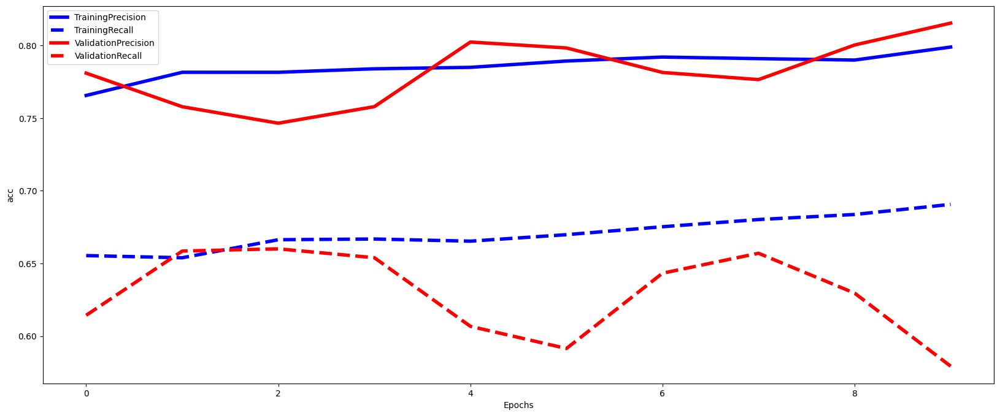

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 5s - loss: 0.7151 - precision_180: 0.7326 - recall_180: 0.6538 - val_loss: 0.6079 - val_precision_180: 0.8079 - val_recall_180: 0.5827 - 5s/epoch - 5ms/step
Epoch 2/10
991/991 - 4s - loss: 0.5842 - precision_180: 0.7769 - recall_180: 0.6463 - val_loss: 0.5748 - val_precision_180: 0.8112 - val_recall_180: 0.6274 - 4s/epoch - 4ms/step
Epoch 3/10
991/991 - 2s - loss: 0.5710 - precision_180: 0.7837 - recall_180: 0.6543 - val_loss: 0.5651 - val_precision_180: 0.8081 - val_recall_180: 0.6274 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 2s - loss: 0.5624 - precision_180: 0.7808 - recall_180: 0.6593 - val_loss: 0.5660 - val_precision_180: 0.8096 - val_recall_180: 0.6021 - 2s/epoch - 2ms/step
Epoch 5/10
991/991 - 2s - loss: 0.5573 - precision_180: 0.7850 - recall_180: 0.6538 - val_loss: 0.5685 - val_precision_180: 0.7632 - val_recall_180: 0.6870 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 3s - loss: 0.5549 - precision_180: 0.7858 - recall_180: 0.6623 - val_loss: 0.5489 - val_p

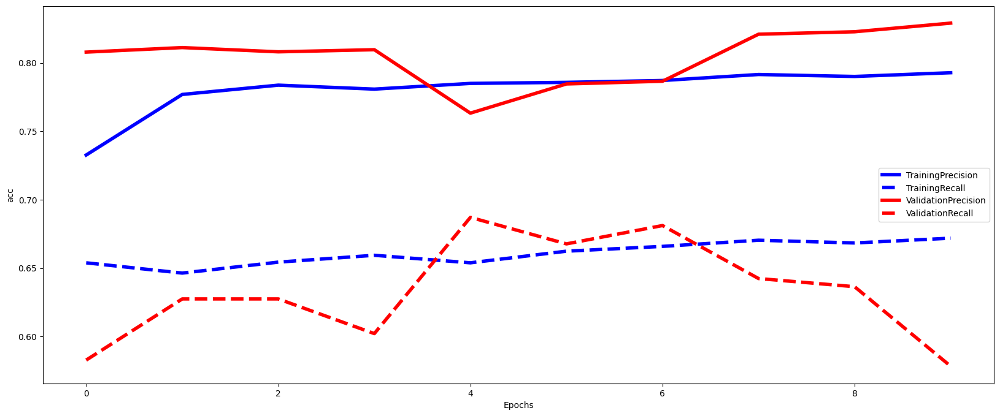

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 4s - loss: 0.7270 - precision_181: 0.7637 - recall_181: 0.6436 - val_loss: 0.6079 - val_precision_181: 0.8037 - val_recall_181: 0.6399 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 3s - loss: 0.5966 - precision_181: 0.7815 - recall_181: 0.6517 - val_loss: 0.5787 - val_precision_181: 0.8007 - val_recall_181: 0.6458 - 3s/epoch - 3ms/step
Epoch 3/10
991/991 - 4s - loss: 0.5780 - precision_181: 0.7852 - recall_181: 0.6552 - val_loss: 0.5641 - val_precision_181: 0.7800 - val_recall_181: 0.6964 - 4s/epoch - 4ms/step
Epoch 4/10
991/991 - 3s - loss: 0.5685 - precision_181: 0.7826 - recall_181: 0.6577 - val_loss: 0.5609 - val_precision_181: 0.7760 - val_recall_181: 0.7113 - 3s/epoch - 4ms/step
Epoch 5/10
991/991 - 2s - loss: 0.5618 - precision_181: 0.7889 - recall_181: 0.6602 - val_loss: 0.5518 - val_precision_181: 0.7743 - val_recall_181: 0.6994 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 2s - loss: 0.5575 - precision_181: 0.7893 - recall_181: 0.6602 - val_loss: 0.5486 - val_p

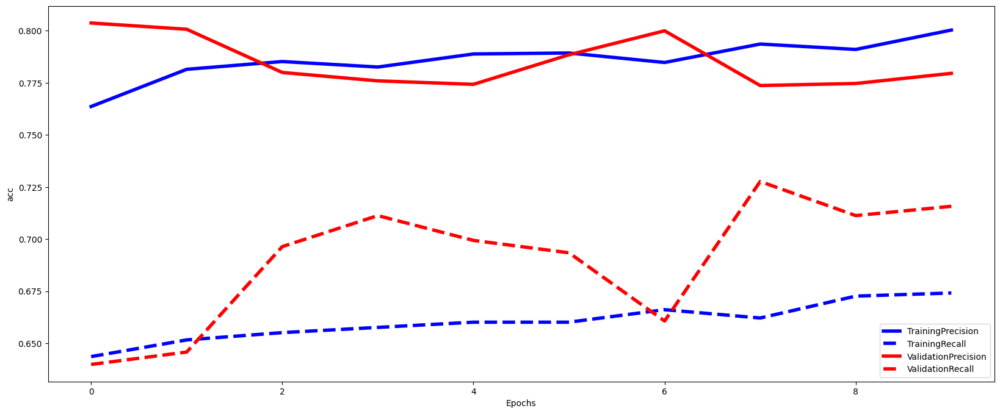

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 5s - loss: 0.7110 - precision_182: 0.7435 - recall_182: 0.6293 - val_loss: 0.5875 - val_precision_182: 0.8034 - val_recall_182: 0.6393 - 5s/epoch - 5ms/step
Epoch 2/10
991/991 - 2s - loss: 0.5841 - precision_182: 0.7865 - recall_182: 0.6448 - val_loss: 0.5714 - val_precision_182: 0.8019 - val_recall_182: 0.6453 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 2s - loss: 0.5728 - precision_182: 0.7908 - recall_182: 0.6428 - val_loss: 0.5602 - val_precision_182: 0.7763 - val_recall_182: 0.6930 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 2s - loss: 0.5648 - precision_182: 0.7847 - recall_182: 0.6563 - val_loss: 0.5589 - val_precision_182: 0.8145 - val_recall_182: 0.6021 - 2s/epoch - 2ms/step
Epoch 5/10
991/991 - 4s - loss: 0.5610 - precision_182: 0.7906 - recall_182: 0.6423 - val_loss: 0.5574 - val_precision_182: 0.8143 - val_recall_182: 0.5946 - 4s/epoch - 4ms/step
Epoch 6/10
991/991 - 4s - loss: 0.5573 - precision_182: 0.7895 - recall_182: 0.6528 - val_loss: 0.5431 - val_p

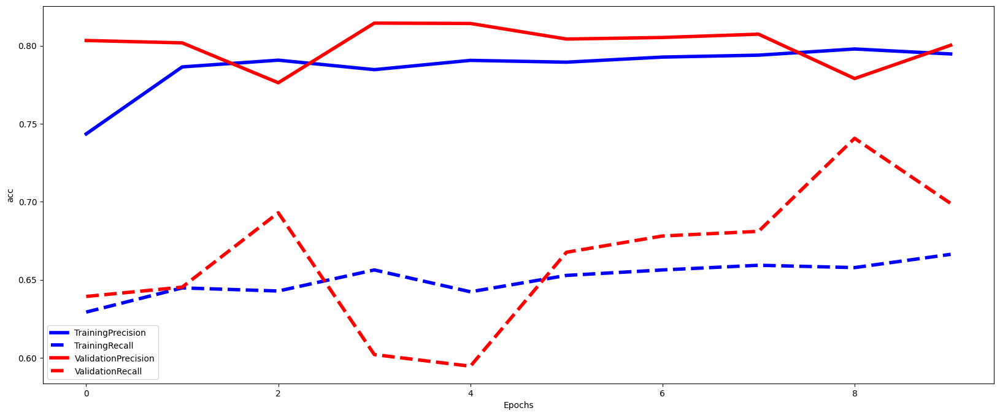

Average F1-Score over validation set is 0.74
STD of F1-Score over validation set is 0.02
42/42 [==============================] - 0s 2ms/step
Val: 0.01, Validation Score: 0.737, Test Score: 0.753


/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 5s - loss: 1.0051 - precision_183: 0.7625 - recall_183: 0.6266 - val_loss: 0.6389 - val_precision_183: 0.7657 - val_recall_183: 0.6128 - 5s/epoch - 6ms/step
Epoch 2/10
991/991 - 3s - loss: 0.6190 - precision_183: 0.7770 - recall_183: 0.6455 - val_loss: 0.6196 - val_precision_183: 0.7427 - val_recall_183: 0.6601 - 3s/epoch - 3ms/step
Epoch 3/10
991/991 - 2s - loss: 0.6060 - precision_183: 0.7761 - recall_183: 0.6504 - val_loss: 0.6070 - val_precision_183: 0.7804 - val_recall_183: 0.6067 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 2s - loss: 0.5985 - precision_183: 0.7873 - recall_183: 0.6544 - val_loss: 0.6071 - val_precision_183: 0.7267 - val_recall_183: 0.6646 - 2s/epoch - 2ms/step
Epoch 5/10
991/991 - 2s - loss: 0.5937 - precision_183: 0.7741 - recall_183: 0.6549 - val_loss: 0.6020 - val_precision_183: 0.7771 - val_recall_183: 0.5899 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 3s - loss: 0.5893 - precision_183: 0.7788 - recall_183: 0.6519 - val_loss: 0.6046 - val_p

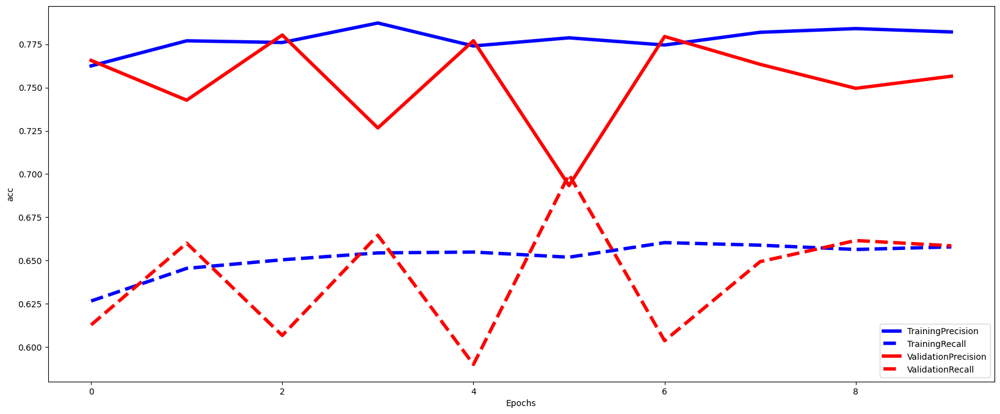

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 4s - loss: 1.0275 - precision_184: 0.7537 - recall_184: 0.6293 - val_loss: 0.6446 - val_precision_184: 0.7580 - val_recall_184: 0.6677 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 4s - loss: 0.6244 - precision_184: 0.7840 - recall_184: 0.6263 - val_loss: 0.6220 - val_precision_184: 0.7613 - val_recall_184: 0.6796 - 4s/epoch - 4ms/step
Epoch 3/10
991/991 - 4s - loss: 0.6128 - precision_184: 0.7770 - recall_184: 0.6363 - val_loss: 0.6070 - val_precision_184: 0.7784 - val_recall_184: 0.6438 - 4s/epoch - 4ms/step
Epoch 4/10
991/991 - 3s - loss: 0.6057 - precision_184: 0.7742 - recall_184: 0.6448 - val_loss: 0.6010 - val_precision_184: 0.8065 - val_recall_184: 0.5961 - 3s/epoch - 3ms/step
Epoch 5/10
991/991 - 2s - loss: 0.5988 - precision_184: 0.7792 - recall_184: 0.6513 - val_loss: 0.6026 - val_precision_184: 0.7684 - val_recall_184: 0.7019 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 3s - loss: 0.5953 - precision_184: 0.7826 - recall_184: 0.6463 - val_loss: 0.6035 - val_p

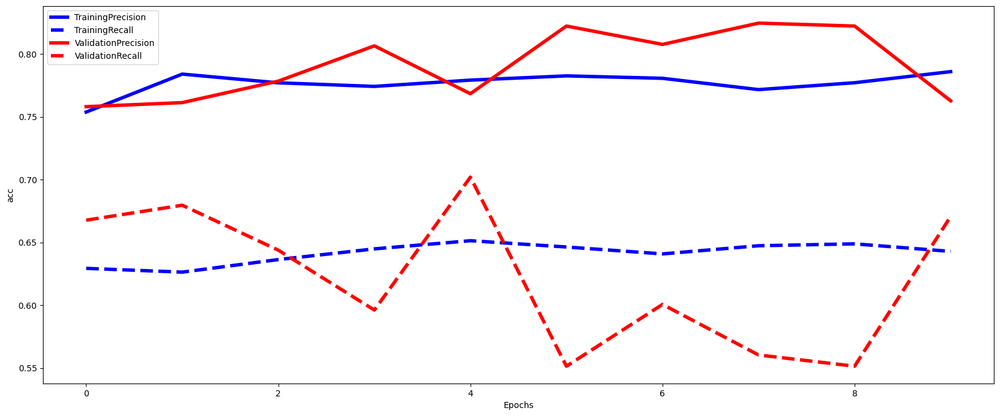

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 4s - loss: 0.9838 - precision_185: 0.7511 - recall_185: 0.5921 - val_loss: 0.6225 - val_precision_185: 0.8049 - val_recall_185: 0.6324 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 4s - loss: 0.6239 - precision_185: 0.7817 - recall_185: 0.6361 - val_loss: 0.6041 - val_precision_185: 0.7960 - val_recall_185: 0.6443 - 4s/epoch - 4ms/step
Epoch 3/10
991/991 - 4s - loss: 0.6111 - precision_185: 0.7667 - recall_185: 0.6431 - val_loss: 0.5960 - val_precision_185: 0.7985 - val_recall_185: 0.6369 - 4s/epoch - 4ms/step
Epoch 4/10
991/991 - 3s - loss: 0.6054 - precision_185: 0.7803 - recall_185: 0.6451 - val_loss: 0.5926 - val_precision_185: 0.7676 - val_recall_185: 0.6979 - 3s/epoch - 3ms/step
Epoch 5/10
991/991 - 2s - loss: 0.6008 - precision_185: 0.7729 - recall_185: 0.6456 - val_loss: 0.5875 - val_precision_185: 0.7548 - val_recall_185: 0.7054 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 2s - loss: 0.5975 - precision_185: 0.7739 - recall_185: 0.6371 - val_loss: 0.5820 - val_p

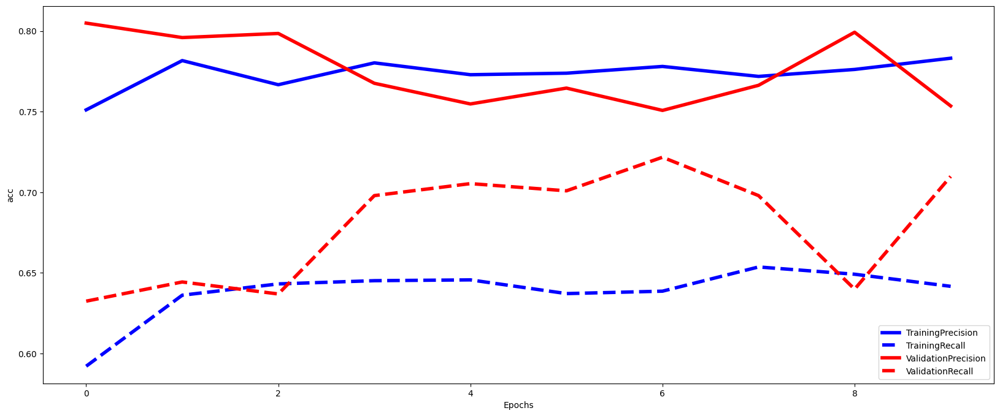

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 4s - loss: 1.0206 - precision_186: 0.7443 - recall_186: 0.6203 - val_loss: 0.6286 - val_precision_186: 0.8131 - val_recall_186: 0.5902 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 2s - loss: 0.6242 - precision_186: 0.7817 - recall_186: 0.6253 - val_loss: 0.6058 - val_precision_186: 0.7955 - val_recall_186: 0.6379 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 4s - loss: 0.6123 - precision_186: 0.7816 - recall_186: 0.6303 - val_loss: 0.6164 - val_precision_186: 0.7032 - val_recall_186: 0.7273 - 4s/epoch - 4ms/step
Epoch 4/10
991/991 - 3s - loss: 0.6045 - precision_186: 0.7811 - recall_186: 0.6373 - val_loss: 0.5911 - val_precision_186: 0.7958 - val_recall_186: 0.6274 - 3s/epoch - 3ms/step
Epoch 5/10
991/991 - 3s - loss: 0.6013 - precision_186: 0.7795 - recall_186: 0.6383 - val_loss: 0.5882 - val_precision_186: 0.7787 - val_recall_186: 0.6870 - 3s/epoch - 3ms/step
Epoch 6/10
991/991 - 2s - loss: 0.5959 - precision_186: 0.7771 - recall_186: 0.6418 - val_loss: 0.5865 - val_p

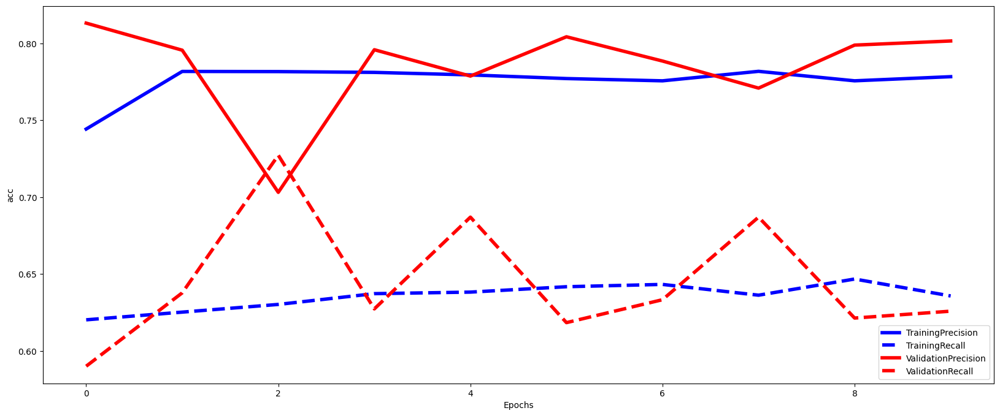

Average F1-Score over validation set is 0.73
STD of F1-Score over validation set is 0.00
42/42 [==============================] - 0s 4ms/step
Val: 0.05, Validation Score: 0.728, Test Score: 0.729


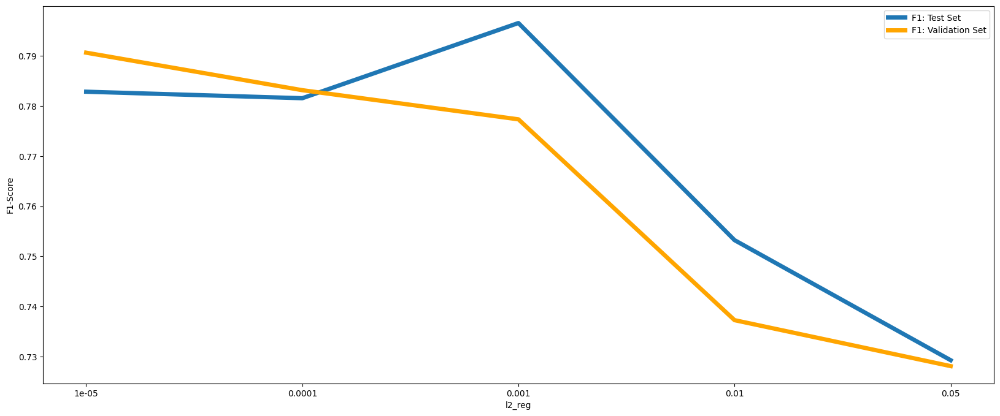

In [85]:
model,best_l2_reg = evaluate_efect_param(parameter_type='model_params',parameter_name='l2_reg', values_list=[0.00001, 0.0001, 0.001, 0.01, 0.05])
kfold_params['model_params']['l2_reg'] = best_l2_reg

##choosing best droput rate:

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 4s - loss: 0.5516 - precision_187: 0.7817 - recall_187: 0.6524 - val_loss: 0.5189 - val_precision_187: 0.7821 - val_recall_187: 0.6509 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 2s - loss: 0.4826 - precision_187: 0.8014 - recall_187: 0.7234 - val_loss: 0.4824 - val_precision_187: 0.7838 - val_recall_187: 0.7241 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 2s - loss: 0.4626 - precision_187: 0.7999 - recall_187: 0.7502 - val_loss: 0.4765 - val_precision_187: 0.7898 - val_recall_187: 0.7104 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 3s - loss: 0.4524 - precision_187: 0.7876 - recall_187: 0.7716 - val_loss: 0.4659 - val_precision_187: 0.8090 - val_recall_187: 0.7165 - 3s/epoch - 3ms/step
Epoch 5/10
991/991 - 4s - loss: 0.4471 - precision_187: 0.7942 - recall_187: 0.7800 - val_loss: 0.4571 - val_precision_187: 0.7958 - val_recall_187: 0.7485 - 4s/epoch - 4ms/step
Epoch 6/10
991/991 - 3s - loss: 0.4413 - precision_187: 0.7885 - recall_187: 0.7850 - val_loss: 0.4614 - val_p

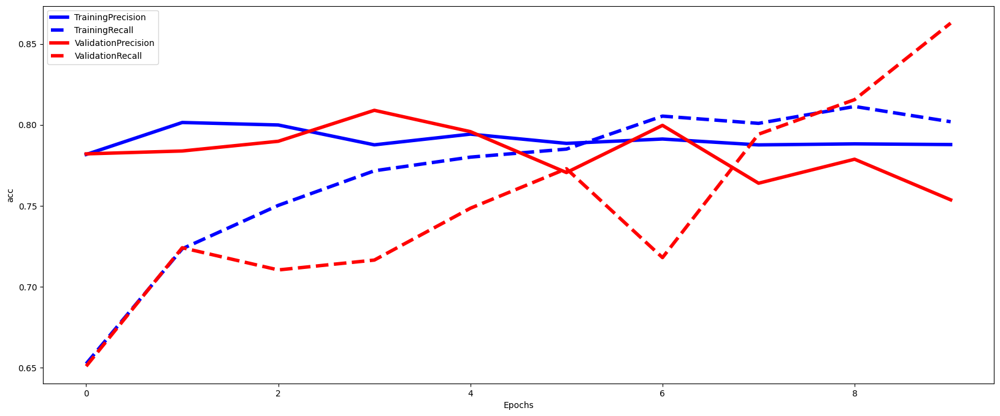

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 5s - loss: 0.5471 - precision_188: 0.7780 - recall_188: 0.6558 - val_loss: 0.5059 - val_precision_188: 0.7882 - val_recall_188: 0.6990 - 5s/epoch - 5ms/step
Epoch 2/10
991/991 - 3s - loss: 0.4953 - precision_188: 0.7929 - recall_188: 0.7049 - val_loss: 0.4735 - val_precision_188: 0.7958 - val_recall_188: 0.7317 - 3s/epoch - 3ms/step
Epoch 3/10
991/991 - 2s - loss: 0.4751 - precision_188: 0.7906 - recall_188: 0.7289 - val_loss: 0.4521 - val_precision_188: 0.8157 - val_recall_188: 0.7258 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 3s - loss: 0.4652 - precision_188: 0.7917 - recall_188: 0.7434 - val_loss: 0.4437 - val_precision_188: 0.8205 - val_recall_188: 0.7288 - 3s/epoch - 3ms/step
Epoch 5/10
991/991 - 3s - loss: 0.4580 - precision_188: 0.7899 - recall_188: 0.7559 - val_loss: 0.4411 - val_precision_188: 0.8061 - val_recall_188: 0.7437 - 3s/epoch - 3ms/step
Epoch 6/10
991/991 - 4s - loss: 0.4538 - precision_188: 0.7923 - recall_188: 0.7654 - val_loss: 0.4352 - val_p

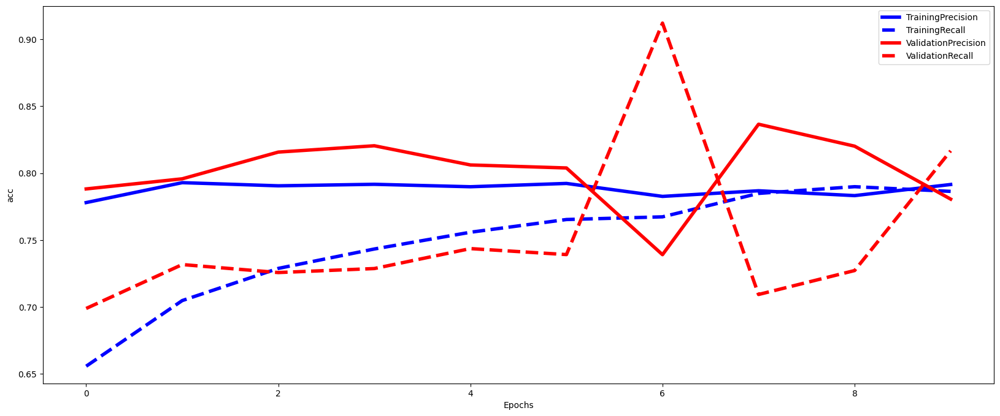

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 6s - loss: 0.5583 - precision_189: 0.7616 - recall_189: 0.6266 - val_loss: 0.5009 - val_precision_189: 0.7877 - val_recall_189: 0.7068 - 6s/epoch - 6ms/step
Epoch 2/10
991/991 - 3s - loss: 0.4953 - precision_189: 0.7951 - recall_189: 0.6972 - val_loss: 0.4940 - val_precision_189: 0.7337 - val_recall_189: 0.8363 - 3s/epoch - 3ms/step
Epoch 3/10
991/991 - 2s - loss: 0.4694 - precision_189: 0.7975 - recall_189: 0.7332 - val_loss: 0.4765 - val_precision_189: 0.7538 - val_recall_189: 0.8021 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 2s - loss: 0.4598 - precision_189: 0.7906 - recall_189: 0.7633 - val_loss: 0.4650 - val_precision_189: 0.7969 - val_recall_189: 0.7530 - 2s/epoch - 3ms/step
Epoch 5/10
991/991 - 2s - loss: 0.4519 - precision_189: 0.7940 - recall_189: 0.7773 - val_loss: 0.4578 - val_precision_189: 0.7773 - val_recall_189: 0.7946 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 3s - loss: 0.4484 - precision_189: 0.7864 - recall_189: 0.7703 - val_loss: 0.4599 - val_p

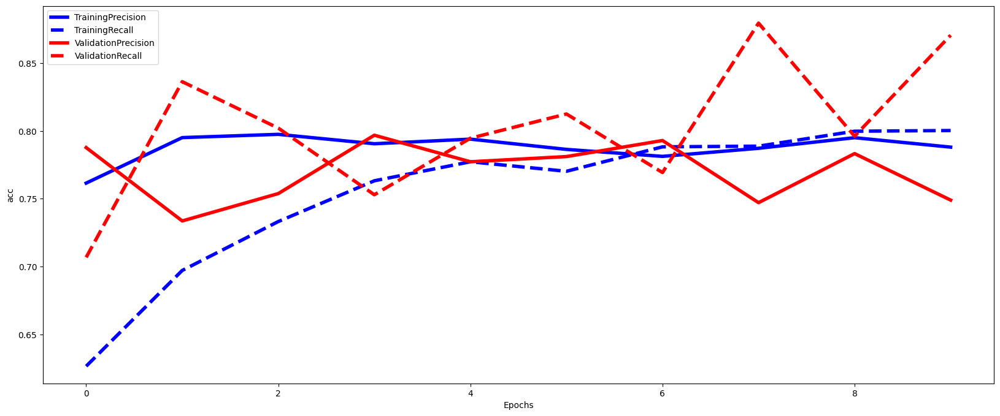

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 4s - loss: 0.5563 - precision_190: 0.7665 - recall_190: 0.6583 - val_loss: 0.4996 - val_precision_190: 0.8088 - val_recall_190: 0.6811 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 3s - loss: 0.4951 - precision_190: 0.7943 - recall_190: 0.6933 - val_loss: 0.4863 - val_precision_190: 0.8286 - val_recall_190: 0.6557 - 3s/epoch - 3ms/step
Epoch 3/10
991/991 - 4s - loss: 0.4733 - precision_190: 0.7950 - recall_190: 0.7294 - val_loss: 0.4627 - val_precision_190: 0.7826 - val_recall_190: 0.7779 - 4s/epoch - 4ms/step
Epoch 4/10
991/991 - 3s - loss: 0.4611 - precision_190: 0.7902 - recall_190: 0.7629 - val_loss: 0.4488 - val_precision_190: 0.7956 - val_recall_190: 0.7601 - 3s/epoch - 3ms/step
Epoch 5/10
991/991 - 3s - loss: 0.4541 - precision_190: 0.7889 - recall_190: 0.7759 - val_loss: 0.4474 - val_precision_190: 0.7975 - val_recall_190: 0.7571 - 3s/epoch - 3ms/step
Epoch 6/10
991/991 - 2s - loss: 0.4526 - precision_190: 0.7816 - recall_190: 0.7754 - val_loss: 0.4513 - val_p

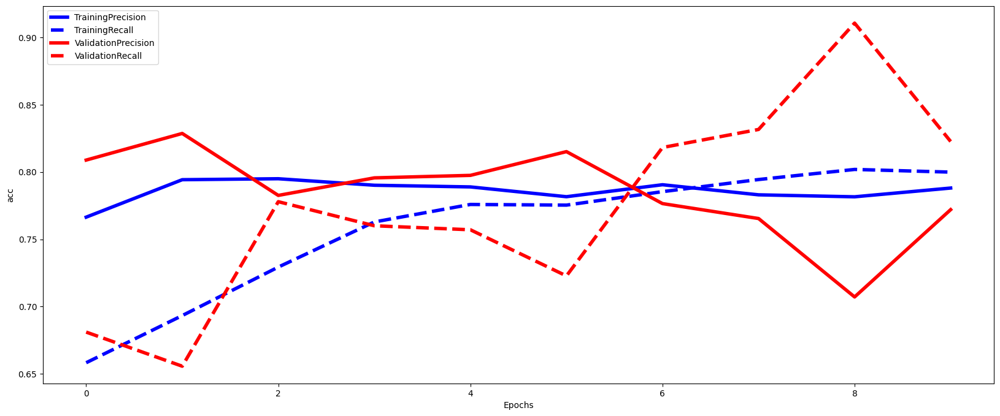

Average F1-Score over validation set is 0.79
STD of F1-Score over validation set is 0.00
42/42 [==============================] - 0s 2ms/step
Val: 0.0001, Validation Score: 0.788, Test Score: 0.785


/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 4s - loss: 0.5404 - precision_191: 0.7689 - recall_191: 0.6723 - val_loss: 0.5147 - val_precision_191: 0.7837 - val_recall_191: 0.6905 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 2s - loss: 0.4873 - precision_191: 0.7991 - recall_191: 0.7090 - val_loss: 0.4930 - val_precision_191: 0.8118 - val_recall_191: 0.6707 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 4s - loss: 0.4667 - precision_191: 0.7980 - recall_191: 0.7473 - val_loss: 0.4703 - val_precision_191: 0.7976 - val_recall_191: 0.7027 - 4s/epoch - 4ms/step
Epoch 4/10
991/991 - 3s - loss: 0.4555 - precision_191: 0.7882 - recall_191: 0.7781 - val_loss: 0.4626 - val_precision_191: 0.8034 - val_recall_191: 0.7226 - 3s/epoch - 3ms/step
Epoch 5/10
991/991 - 2s - loss: 0.4480 - precision_191: 0.7886 - recall_191: 0.7726 - val_loss: 0.4597 - val_precision_191: 0.7707 - val_recall_191: 0.7790 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 3s - loss: 0.4434 - precision_191: 0.7865 - recall_191: 0.7939 - val_loss: 0.4572 - val_p

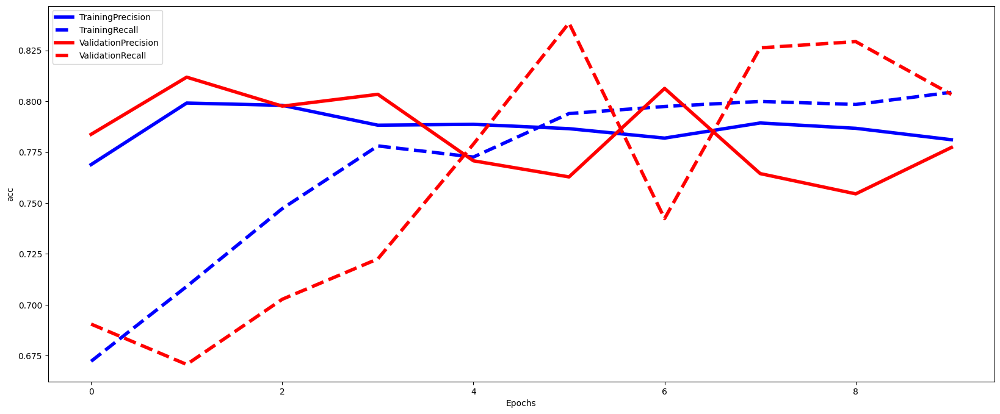

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 5s - loss: 0.5610 - precision_192: 0.7399 - recall_192: 0.6843 - val_loss: 0.5087 - val_precision_192: 0.7982 - val_recall_192: 0.6721 - 5s/epoch - 5ms/step
Epoch 2/10
991/991 - 3s - loss: 0.5023 - precision_192: 0.7898 - recall_192: 0.6918 - val_loss: 0.4765 - val_precision_192: 0.7934 - val_recall_192: 0.7154 - 3s/epoch - 3ms/step
Epoch 3/10
991/991 - 2s - loss: 0.4803 - precision_192: 0.7966 - recall_192: 0.7229 - val_loss: 0.4555 - val_precision_192: 0.8122 - val_recall_192: 0.7154 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 2s - loss: 0.4682 - precision_192: 0.7942 - recall_192: 0.7489 - val_loss: 0.4443 - val_precision_192: 0.8083 - val_recall_192: 0.7794 - 2s/epoch - 3ms/step
Epoch 5/10
991/991 - 4s - loss: 0.4621 - precision_192: 0.7868 - recall_192: 0.7589 - val_loss: 0.4388 - val_precision_192: 0.7975 - val_recall_192: 0.7750 - 4s/epoch - 4ms/step
Epoch 6/10
991/991 - 3s - loss: 0.4575 - precision_192: 0.7916 - recall_192: 0.7639 - val_loss: 0.4440 - val_p

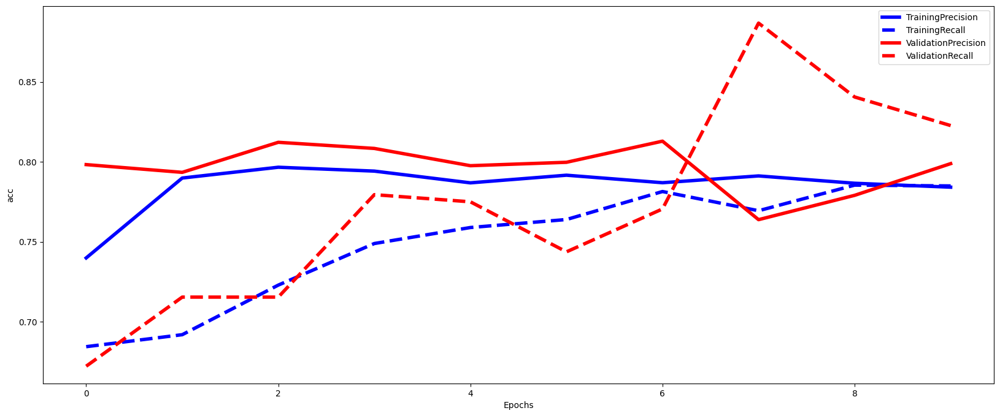

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 6s - loss: 0.5526 - precision_193: 0.7461 - recall_193: 0.6767 - val_loss: 0.5139 - val_precision_193: 0.7816 - val_recall_193: 0.6711 - 6s/epoch - 6ms/step
Epoch 2/10
991/991 - 2s - loss: 0.4998 - precision_193: 0.8000 - recall_193: 0.6827 - val_loss: 0.5085 - val_precision_193: 0.7511 - val_recall_193: 0.7946 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 3s - loss: 0.4766 - precision_193: 0.7980 - recall_193: 0.7177 - val_loss: 0.4874 - val_precision_193: 0.8122 - val_recall_193: 0.7143 - 3s/epoch - 3ms/step
Epoch 4/10
991/991 - 3s - loss: 0.4617 - precision_193: 0.8001 - recall_193: 0.7432 - val_loss: 0.4707 - val_precision_193: 0.7869 - val_recall_193: 0.7693 - 3s/epoch - 3ms/step
Epoch 5/10
991/991 - 2s - loss: 0.4533 - precision_193: 0.7985 - recall_193: 0.7678 - val_loss: 0.4669 - val_precision_193: 0.7969 - val_recall_193: 0.7530 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 3s - loss: 0.4491 - precision_193: 0.7978 - recall_193: 0.7683 - val_loss: 0.4693 - val_p

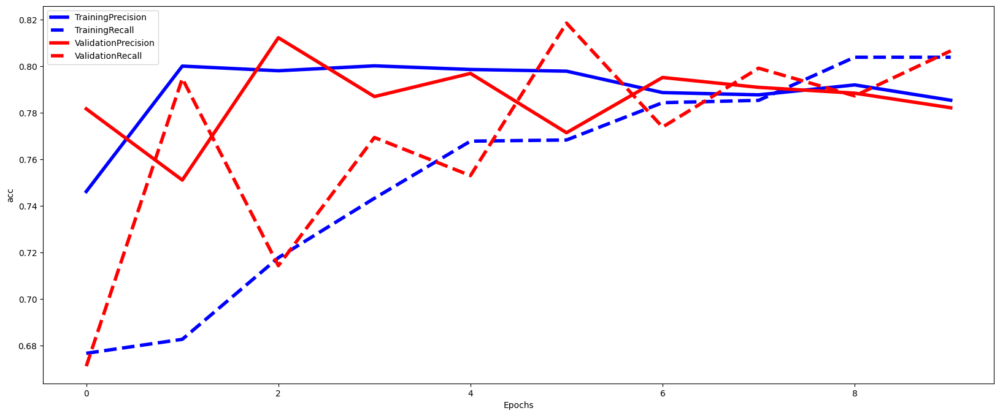

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 5s - loss: 0.5481 - precision_194: 0.7748 - recall_194: 0.6573 - val_loss: 0.4992 - val_precision_194: 0.8058 - val_recall_194: 0.6990 - 5s/epoch - 5ms/step
Epoch 2/10
991/991 - 3s - loss: 0.4978 - precision_194: 0.7933 - recall_194: 0.6948 - val_loss: 0.4725 - val_precision_194: 0.8333 - val_recall_194: 0.6632 - 3s/epoch - 3ms/step
Epoch 3/10
991/991 - 2s - loss: 0.4732 - precision_194: 0.7902 - recall_194: 0.7369 - val_loss: 0.4539 - val_precision_194: 0.7954 - val_recall_194: 0.7765 - 2s/epoch - 3ms/step
Epoch 4/10
991/991 - 3s - loss: 0.4616 - precision_194: 0.7874 - recall_194: 0.7579 - val_loss: 0.4455 - val_precision_194: 0.7902 - val_recall_194: 0.7690 - 3s/epoch - 3ms/step
Epoch 5/10
991/991 - 2s - loss: 0.4542 - precision_194: 0.7929 - recall_194: 0.7699 - val_loss: 0.4430 - val_precision_194: 0.8009 - val_recall_194: 0.7615 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 3s - loss: 0.4494 - precision_194: 0.7866 - recall_194: 0.7854 - val_loss: 0.4439 - val_p

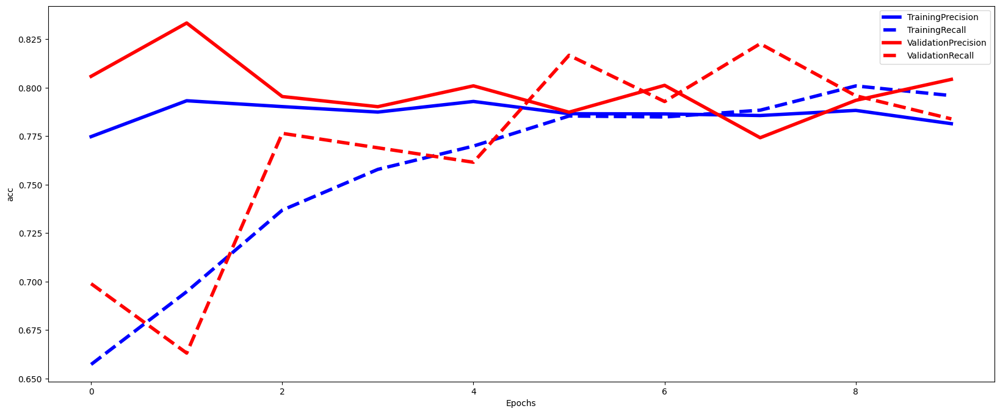

Average F1-Score over validation set is 0.79
STD of F1-Score over validation set is 0.01
42/42 [==============================] - 0s 2ms/step
Val: 0.01, Validation Score: 0.793, Test Score: 0.792


/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 4s - loss: 0.5588 - precision_195: 0.7635 - recall_195: 0.6683 - val_loss: 0.5247 - val_precision_195: 0.7782 - val_recall_195: 0.6524 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 3s - loss: 0.5016 - precision_195: 0.8035 - recall_195: 0.6882 - val_loss: 0.4908 - val_precision_195: 0.8051 - val_recall_195: 0.6799 - 3s/epoch - 3ms/step
Epoch 3/10
991/991 - 4s - loss: 0.4775 - precision_195: 0.8062 - recall_195: 0.7210 - val_loss: 0.5043 - val_precision_195: 0.6783 - val_recall_195: 0.8902 - 4s/epoch - 4ms/step
Epoch 4/10
991/991 - 2s - loss: 0.4677 - precision_195: 0.7876 - recall_195: 0.7438 - val_loss: 0.4708 - val_precision_195: 0.8045 - val_recall_195: 0.7149 - 2s/epoch - 3ms/step
Epoch 5/10
991/991 - 2s - loss: 0.4544 - precision_195: 0.7960 - recall_195: 0.7671 - val_loss: 0.4791 - val_precision_195: 0.8202 - val_recall_195: 0.6677 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 2s - loss: 0.4555 - precision_195: 0.7915 - recall_195: 0.7671 - val_loss: 0.4592 - val_p

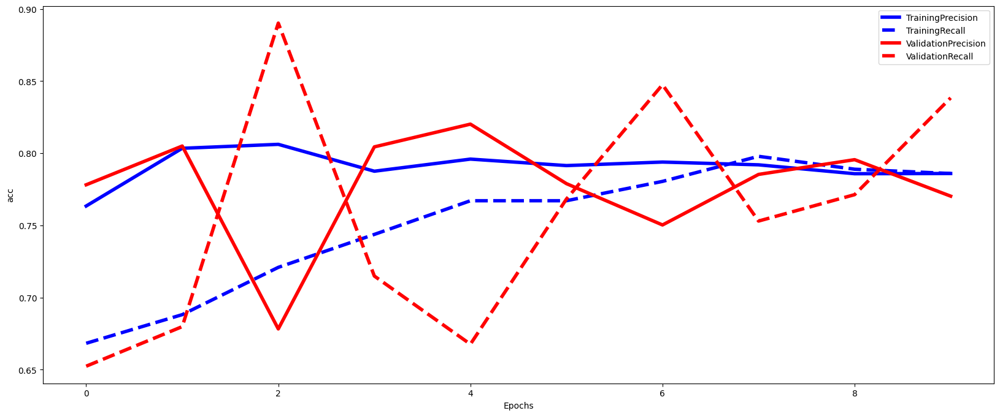

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 4s - loss: 0.5480 - precision_196: 0.7540 - recall_196: 0.6793 - val_loss: 0.5141 - val_precision_196: 0.7925 - val_recall_196: 0.6602 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 2s - loss: 0.5071 - precision_196: 0.7882 - recall_196: 0.6888 - val_loss: 0.4807 - val_precision_196: 0.8091 - val_recall_196: 0.6885 - 2s/epoch - 3ms/step
Epoch 3/10
991/991 - 4s - loss: 0.4826 - precision_196: 0.7960 - recall_196: 0.7184 - val_loss: 0.4602 - val_precision_196: 0.8041 - val_recall_196: 0.7034 - 4s/epoch - 4ms/step
Epoch 4/10
991/991 - 4s - loss: 0.4746 - precision_196: 0.7876 - recall_196: 0.7384 - val_loss: 0.4499 - val_precision_196: 0.7972 - val_recall_196: 0.7556 - 4s/epoch - 4ms/step
Epoch 5/10
991/991 - 2s - loss: 0.4664 - precision_196: 0.7925 - recall_196: 0.7509 - val_loss: 0.4457 - val_precision_196: 0.8133 - val_recall_196: 0.7466 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 2s - loss: 0.4597 - precision_196: 0.7889 - recall_196: 0.7609 - val_loss: 0.4397 - val_p

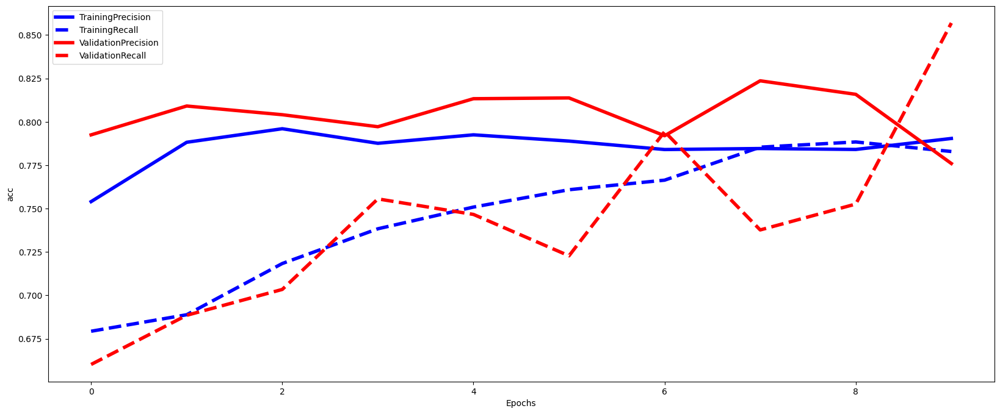

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 4s - loss: 0.5507 - precision_197: 0.7529 - recall_197: 0.6862 - val_loss: 0.5056 - val_precision_197: 0.7801 - val_recall_197: 0.7128 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 3s - loss: 0.5053 - precision_197: 0.7890 - recall_197: 0.6852 - val_loss: 0.4837 - val_precision_197: 0.7725 - val_recall_197: 0.7530 - 3s/epoch - 3ms/step
Epoch 3/10
991/991 - 4s - loss: 0.4784 - precision_197: 0.7860 - recall_197: 0.7207 - val_loss: 0.4832 - val_precision_197: 0.8288 - val_recall_197: 0.6845 - 4s/epoch - 4ms/step
Epoch 4/10
991/991 - 4s - loss: 0.4655 - precision_197: 0.8024 - recall_197: 0.7277 - val_loss: 0.4760 - val_precision_197: 0.7603 - val_recall_197: 0.8259 - 4s/epoch - 4ms/step
Epoch 5/10
991/991 - 2s - loss: 0.4601 - precision_197: 0.7880 - recall_197: 0.7553 - val_loss: 0.4660 - val_precision_197: 0.7859 - val_recall_197: 0.7649 - 2s/epoch - 2ms/step
Epoch 6/10
991/991 - 2s - loss: 0.4545 - precision_197: 0.7883 - recall_197: 0.7773 - val_loss: 0.4550 - val_p

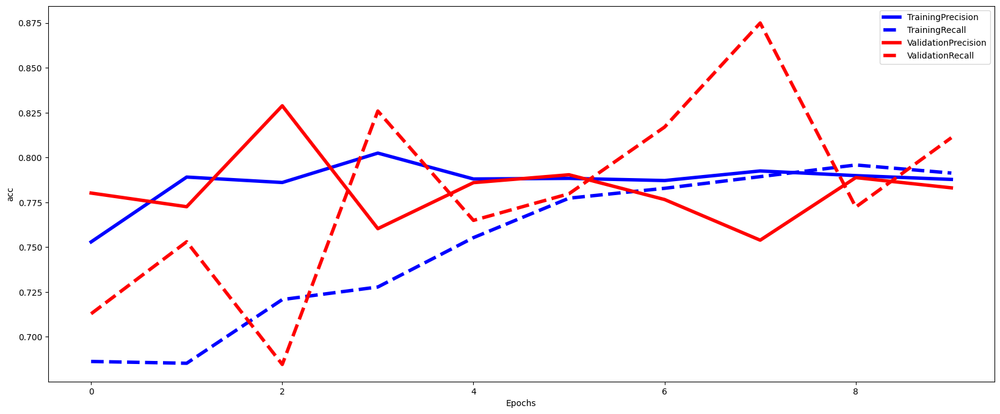

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 4s - loss: 0.5531 - precision_198: 0.7696 - recall_198: 0.6368 - val_loss: 0.5047 - val_precision_198: 0.7867 - val_recall_198: 0.6870 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 3s - loss: 0.5074 - precision_198: 0.7959 - recall_198: 0.6748 - val_loss: 0.4788 - val_precision_198: 0.8010 - val_recall_198: 0.7317 - 3s/epoch - 3ms/step
Epoch 3/10
991/991 - 3s - loss: 0.4859 - precision_198: 0.7952 - recall_198: 0.7129 - val_loss: 0.4705 - val_precision_198: 0.8245 - val_recall_198: 0.6721 - 3s/epoch - 3ms/step
Epoch 4/10
991/991 - 3s - loss: 0.4705 - precision_198: 0.7928 - recall_198: 0.7294 - val_loss: 0.4536 - val_precision_198: 0.7891 - val_recall_198: 0.7750 - 3s/epoch - 3ms/step
Epoch 5/10
991/991 - 4s - loss: 0.4675 - precision_198: 0.7906 - recall_198: 0.7649 - val_loss: 0.4513 - val_precision_198: 0.7759 - val_recall_198: 0.8048 - 4s/epoch - 4ms/step
Epoch 6/10
991/991 - 3s - loss: 0.4586 - precision_198: 0.7918 - recall_198: 0.7669 - val_loss: 0.4457 - val_p

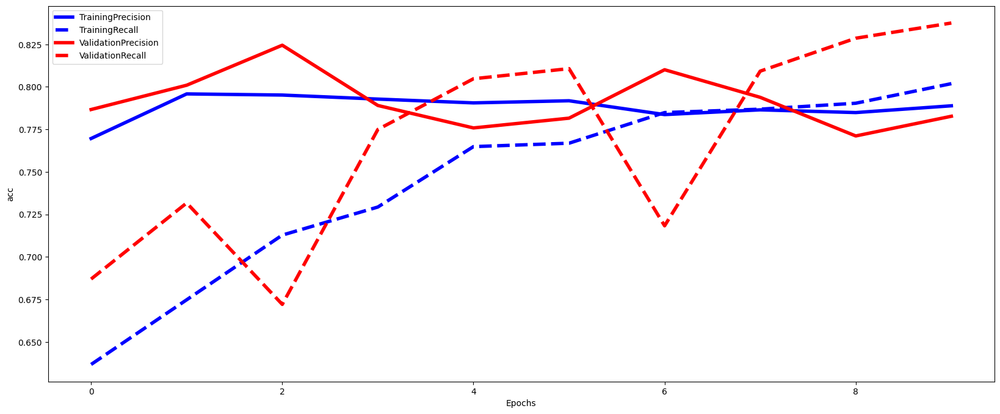

Average F1-Score over validation set is 0.80
STD of F1-Score over validation set is 0.00
42/42 [==============================] - 0s 3ms/step
Val: 0.1, Validation Score: 0.796, Test Score: 0.794


/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 4s - loss: 0.5748 - precision_199: 0.7273 - recall_199: 0.6435 - val_loss: 0.5319 - val_precision_199: 0.7924 - val_recall_199: 0.6341 - 4s/epoch - 4ms/step
Epoch 2/10
991/991 - 2s - loss: 0.5247 - precision_199: 0.7922 - recall_199: 0.6797 - val_loss: 0.5145 - val_precision_199: 0.7730 - val_recall_199: 0.6905 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 2s - loss: 0.5022 - precision_199: 0.7934 - recall_199: 0.6996 - val_loss: 0.4876 - val_precision_199: 0.7935 - val_recall_199: 0.7088 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 3s - loss: 0.4867 - precision_199: 0.7992 - recall_199: 0.7393 - val_loss: 0.4742 - val_precision_199: 0.7953 - val_recall_199: 0.7226 - 3s/epoch - 3ms/step
Epoch 5/10
991/991 - 4s - loss: 0.4742 - precision_199: 0.7901 - recall_199: 0.7418 - val_loss: 0.4679 - val_precision_199: 0.8108 - val_recall_199: 0.7119 - 4s/epoch - 4ms/step
Epoch 6/10
991/991 - 3s - loss: 0.4622 - precision_199: 0.7840 - recall_199: 0.7676 - val_loss: 0.4626 - val_p

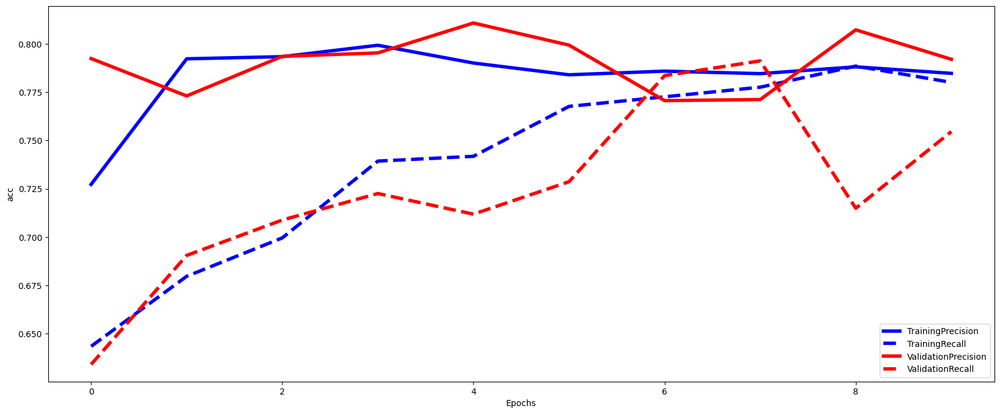

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 5s - loss: 0.5800 - precision_200: 0.7202 - recall_200: 0.6668 - val_loss: 0.5328 - val_precision_200: 0.8077 - val_recall_200: 0.6572 - 5s/epoch - 5ms/step
Epoch 2/10
991/991 - 2s - loss: 0.5303 - precision_200: 0.7852 - recall_200: 0.6673 - val_loss: 0.5062 - val_precision_200: 0.8076 - val_recall_200: 0.6692 - 2s/epoch - 2ms/step
Epoch 3/10
991/991 - 3s - loss: 0.5092 - precision_200: 0.7865 - recall_200: 0.6838 - val_loss: 0.4845 - val_precision_200: 0.8132 - val_recall_200: 0.6811 - 3s/epoch - 3ms/step
Epoch 4/10
991/991 - 2s - loss: 0.4969 - precision_200: 0.7872 - recall_200: 0.7144 - val_loss: 0.4718 - val_precision_200: 0.8234 - val_recall_200: 0.7228 - 2s/epoch - 3ms/step
Epoch 5/10
991/991 - 4s - loss: 0.4855 - precision_200: 0.7919 - recall_200: 0.7139 - val_loss: 0.4570 - val_precision_200: 0.8056 - val_recall_200: 0.7347 - 4s/epoch - 4ms/step
Epoch 6/10
991/991 - 4s - loss: 0.4800 - precision_200: 0.7830 - recall_200: 0.7364 - val_loss: 0.4456 - val_p

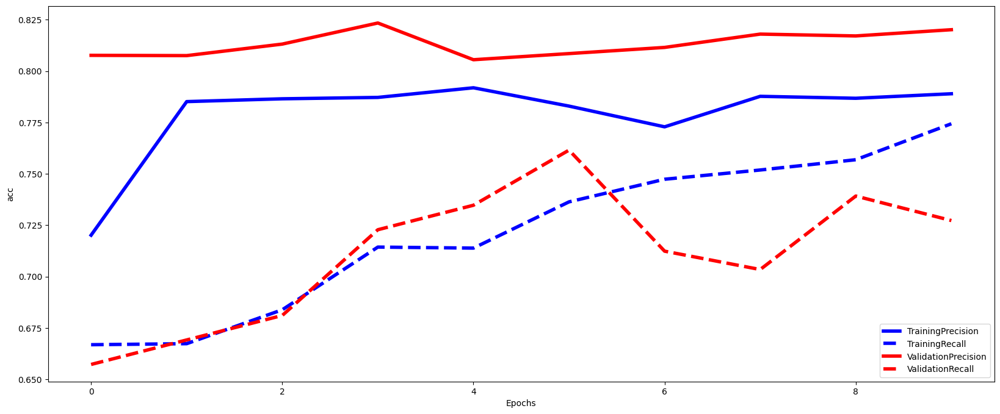

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 6s - loss: 0.5646 - precision_201: 0.7546 - recall_201: 0.6431 - val_loss: 0.5130 - val_precision_201: 0.7698 - val_recall_201: 0.7217 - 6s/epoch - 6ms/step
Epoch 2/10
991/991 - 3s - loss: 0.5184 - precision_201: 0.7840 - recall_201: 0.6667 - val_loss: 0.4902 - val_precision_201: 0.7947 - val_recall_201: 0.7083 - 3s/epoch - 3ms/step
Epoch 3/10
991/991 - 2s - loss: 0.4964 - precision_201: 0.7952 - recall_201: 0.7072 - val_loss: 0.4937 - val_precision_201: 0.8029 - val_recall_201: 0.6607 - 2s/epoch - 2ms/step
Epoch 4/10
991/991 - 3s - loss: 0.4864 - precision_201: 0.7882 - recall_201: 0.7132 - val_loss: 0.4802 - val_precision_201: 0.7805 - val_recall_201: 0.7723 - 3s/epoch - 3ms/step
Epoch 5/10
991/991 - 3s - loss: 0.4723 - precision_201: 0.7968 - recall_201: 0.7322 - val_loss: 0.4715 - val_precision_201: 0.7978 - val_recall_201: 0.7515 - 3s/epoch - 3ms/step
Epoch 6/10
991/991 - 4s - loss: 0.4656 - precision_201: 0.7919 - recall_201: 0.7598 - val_loss: 0.4686 - val_p

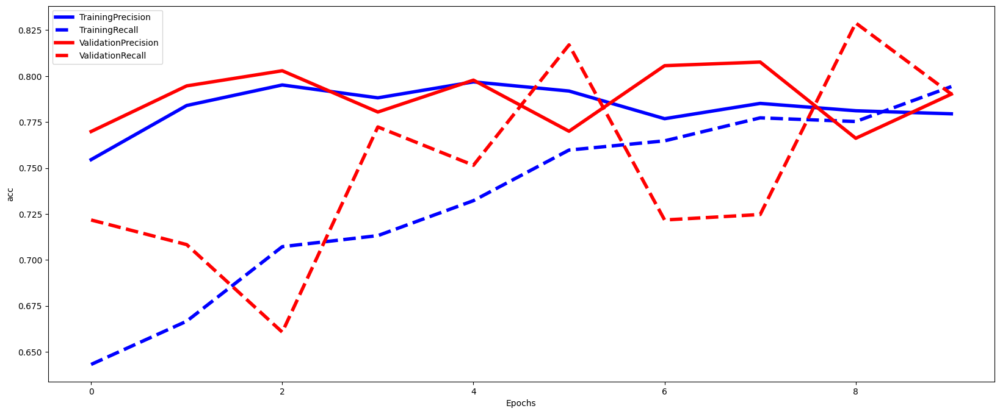

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/10
991/991 - 6s - loss: 0.5776 - precision_202: 0.7587 - recall_202: 0.6118 - val_loss: 0.5127 - val_precision_202: 0.7925 - val_recall_202: 0.6945 - 6s/epoch - 7ms/step
Epoch 2/10
991/991 - 3s - loss: 0.5167 - precision_202: 0.7967 - recall_202: 0.6703 - val_loss: 0.4879 - val_precision_202: 0.8207 - val_recall_202: 0.6617 - 3s/epoch - 3ms/step
Epoch 3/10
991/991 - 3s - loss: 0.4936 - precision_202: 0.7998 - recall_202: 0.6973 - val_loss: 0.4678 - val_precision_202: 0.8121 - val_recall_202: 0.7019 - 3s/epoch - 3ms/step
Epoch 4/10
991/991 - 3s - loss: 0.4842 - precision_202: 0.7947 - recall_202: 0.7184 - val_loss: 0.4542 - val_precision_202: 0.8109 - val_recall_202: 0.7347 - 3s/epoch - 3ms/step
Epoch 5/10
991/991 - 3s - loss: 0.4755 - precision_202: 0.7861 - recall_202: 0.7499 - val_loss: 0.4523 - val_precision_202: 0.7984 - val_recall_202: 0.7496 - 3s/epoch - 3ms/step
Epoch 6/10
991/991 - 4s - loss: 0.4687 - precision_202: 0.7864 - recall_202: 0.7569 - val_loss: 0.4438 - val_p

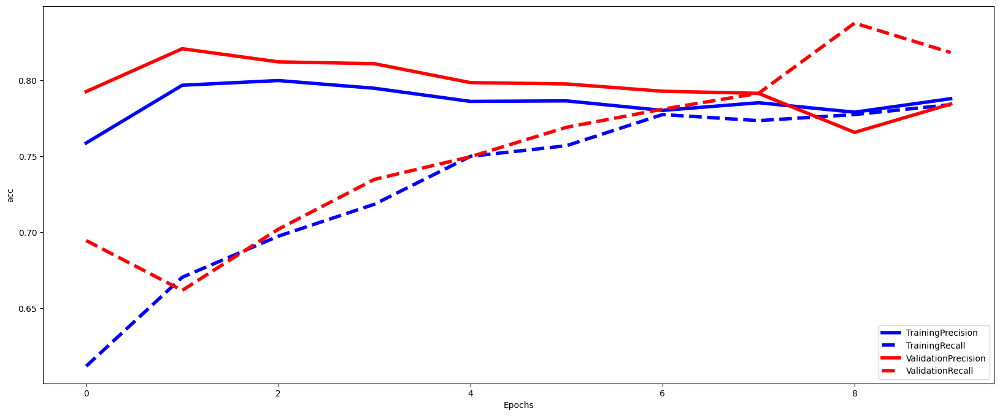

Average F1-Score over validation set is 0.78
STD of F1-Score over validation set is 0.01
42/42 [==============================] - 0s 3ms/step
Val: 0.3, Validation Score: 0.785, Test Score: 0.790


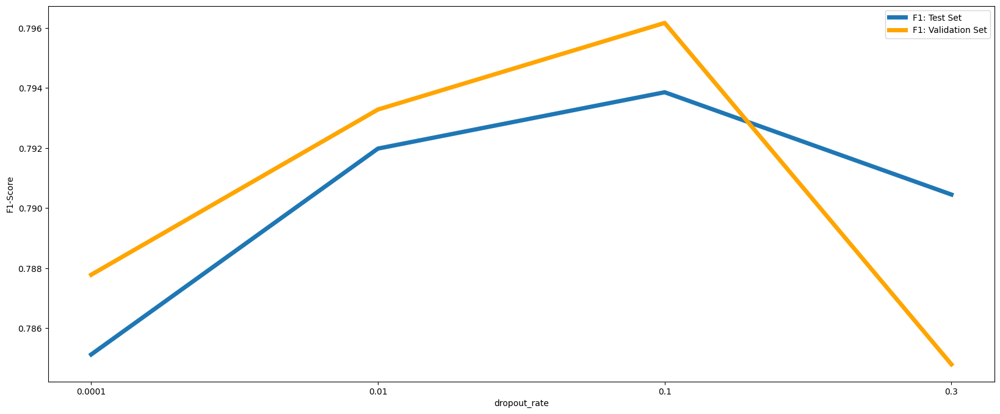

In [86]:
model,best_dropout_rate = evaluate_efect_param(parameter_type='model_params',parameter_name='dropout_rate', values_list=[0.0001,0.01,0.1,0.3])
kfold_params['model_params']['dropout_rate'] = best_dropout_rate

## 0.1 dropout rate seems fit to our needs.

# In a paragraph, explain why it gets more difficult to train deep neural networks when the number of layers increase (i.e. when the network gets deeper).

# answer: it has several reasons. first, as discussed in the class, its because of vanishing and exploding gradients problem( the gradients of the loss function with respect to the weights may become extremely small or large). second, it become more likely for Optimizers such as SGD to get stuck in local minima and more advanced techniques needed for doing backpropagation. there are other minor reasons like:


* ## happening of overfitting in bigger models so need for more data.
* ## increase in computational complexity of computing weights.
* ## need for more exact initialization.
